In [1]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
# Please check documentation to understand how to use simulation class to load data
from load_file import simulation

In [3]:
# Use information in the map_sim_to_design file to find the corresponding design files for each simulation batch
maps_sim_design = {}
with open('../simulation_data/map_sim_to_design') as f:
    for l in f:
        l = l.split('\n')[0]
        maps_sim_design[l.split(' ')[1]]=l.split(' ')[2]

## 1. Load the simulation data.

We run our simulations in batches. Our simulation is stochastic. Each design batch can have different number of events per design point. This mean our simulation data has different statistical uncertainties depending on the design batch. We need to take this into account when building emulators. That's the goal of this notebook.


In [4]:
# We use a class object to load data from each simulation batch.
# sim_d*_e&_train/test_b@: here * stands for number of design points and & for number of events per design
# @ for the batch number
name = 'mean_for_300_sliced_200_events_design'

sim_d300_e200_train = simulation(f'../simulation_data/{name}',
                                 '../simulation_data/'+'sd'+name.split('mean')[-1],
                         f'../design_data/{maps_sim_design[name]}',
                        f'../simulation_data/nevents_design/{name}_neve.txt')

###############
# The following two simulations have the same design points but different events per desing.
# Let's use it to understand how the statistical error changes as the number of events increase.
name = 'mean_for_50_sliced_200_events_test_design'
sim_d50_e200_test = simulation(f'../simulation_data/{name}',
                               '../simulation_data/'+'sd'+name.split('mean')[-1],
                         f'../design_data/{maps_sim_design[name]}',
                        f'../simulation_data/nevents_design/{name}_neve.txt')

name = 'mean_for_90_sliced_test_design_800_events_design'
sim_d90_e800_test = simulation(f'../simulation_data/{name}',
                               '../simulation_data/'+'sd'+name.split('mean')[-1],
                         f'../design_data/{maps_sim_design[name]}',
                        f'../simulation_data/nevents_design/{name}_neve.txt')
################

name = 'mean_for_90_add_batch0_800_events_design'
sim_d90_e800_train_b1 = simulation(f'../simulation_data/{name}',
                                   '../simulation_data/'+'sd'+name.split('mean')[-1],
                         f'../design_data/{maps_sim_design[name]}',
                        f'../simulation_data/nevents_design/{name}_neve.txt')

name = 'mean_for_90_add_batch1_800_events_design'
sim_d90_e800_train_b2 = simulation(f'../simulation_data/{name}',
                                   '../simulation_data/'+'sd'+name.split('mean')[-1],
                         f'../design_data/{maps_sim_design[name]}',
                        f'../simulation_data/nevents_design/{name}_neve.txt')
#################
# High accuracy runs
name = 'mean_for_75_batch0_design_1600_events_design'
sim_d75_e1600_train_b1 = simulation(f'../simulation_data/{name}',
                                   '../simulation_data/'+'sd'+name.split('mean')[-1],
                         f'../design_data/{maps_sim_design[name]}',
                        f'../simulation_data/nevents_design/{name}_neve.txt')


In [5]:
def get_label(file_name):
    words = file_name.split('_')
    designs = words[1].split('d')[1]
    events = words[2].split('e')[1]
    purpose = words[3]
    if len(words)>4:
        batch = words[4].split('b')[1]
        return f'd={designs},e={events},b={batch} to {purpose}'
    else:
        return f'd={designs},e={events} to {purpose}'

In [6]:
df_list=[sim_d300_e200_train,sim_d90_e800_test,sim_d90_e800_train_b1,sim_d90_e800_train_b2, sim_d75_e1600_train_b1]
df_list_name=['sim_d300_e200_train','sim_d90_e800_test','sim_d90_e800_train_b1','sim_d90_e800_train_b2','sim_d75_e1600_train_b1' ]
N = len(df_list)

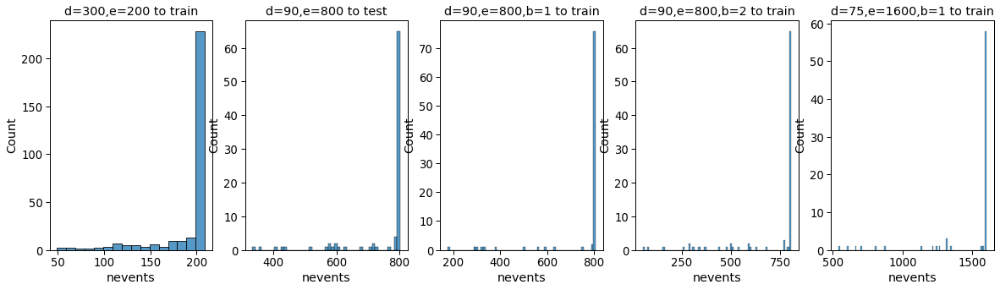

In [7]:
sns.set_context('paper', font_scale=1.5)
fig, ax = plt.subplots(1,N, figsize=(20,5))
for i in range(0,N):
    sns.histplot(df_list[i].events,x='nevents', binwidth=10 , ax=ax[i])
    ax[i].set_title(label=get_label(df_list_name[i]))

In [8]:
sim_d300_e200_train.combine(5).iloc[:,140:]

,sd_dNch_deta_[0 5],sd_dNch_deta_[ 5 10],sd_dNch_deta_[10 20],sd_dNch_deta_[20 30],sd_dNch_deta_[30 40],sd_dNch_deta_[40 50],sd_dNch_deta_[50 60],sd_dNch_deta_[60 70],sd_dET_deta_[0. 2.5],sd_dET_deta_[2.5 5. ],...,sd_v32_[10 20],sd_v32_[20 30],sd_v32_[30 40],sd_v32_[40 50],sd_v42_[0 5],sd_v42_[ 5 10],sd_v42_[10 20],sd_v42_[20 30],sd_v42_[30 40],sd_v42_[40 50]
0,12.767653,5.611496,9.893034,6.321333,6.286185,2.790012,3.386484,1.329554,2.838305,16.746751,...,0.001470,0.001399,0.001703,0.001626,-0.002132,0.002555,0.001451,0.001414,-0.000696,-0.001341
1,18.273050,19.896319,15.973775,9.384079,6.706015,7.230056,2.039833,1.640130,23.102700,6.247021,...,0.001412,0.001903,0.001702,0.002311,0.001482,0.001916,0.000859,0.001163,0.001117,0.001232
2,21.129083,8.687868,8.380579,7.130411,6.104021,3.291174,2.259393,1.573415,15.914937,18.017046,...,0.002020,0.002888,0.002805,0.001723,0.001776,0.001627,0.001437,0.001373,0.001269,0.001090
3,24.399429,9.747943,13.144553,7.026097,6.151482,5.551924,2.871368,1.728271,32.916253,28.527717,...,0.002338,0.002411,0.002077,0.001046,0.001741,0.001129,0.001290,0.001431,0.001520,0.001720
4,17.787787,31.895525,18.875030,10.743766,7.759465,7.262750,2.757719,3.486357,31.204400,10.019687,...,0.001678,0.001860,0.001876,0.000968,0.001356,0.001252,0.001697,0.001220,0.001768,0.001346
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
294,55.969434,46.977221,30.915277,21.680246,15.230100,4.475415,4.461348,4.438645,122.608330,31.094894,...,0.005426,0.003526,0.003151,0.002495,0.002028,0.002197,0.002055,0.001739,0.001714,0.001432
295,33.201394,14.554464,18.179205,11.498761,9.064990,6.357290,4.469410,2.510069,52.619357,6.915426,...,0.002371,0.002480,0.004339,0.002264,0.002107,0.002467,0.001647,0.001418,0.001927,0.001659
296,37.080407,23.029537,30.470879,27.147049,9.219531,11.551442,9.914216,5.522791,34.425428,52.571889,...,0.001971,0.001952,0.002323,0.000927,0.001884,0.001154,0.001645,0.001532,0.001570,0.000768
297,16.343756,16.028762,23.359447,20.661095,13.050611,23.223445,4.556444,5.462784,27.171777,20.086082,...,0.002975,0.003571,0.002074,0.003381,0.001307,0.001985,0.001498,0.002027,0.001722,0.002072


In [9]:

train = [0,2,3,4]
test = [1]

y_train = pd.DataFrame()
y_er_train = pd.DataFrame()
x_train = pd.DataFrame()

y_test = pd.DataFrame()
y_er_test = pd.DataFrame()
x_test = pd.DataFrame()
for i in range(0,5):

    df = df_list[i].combine(5)
    if i in train:
        y_train = pd.concat([y_train,df.iloc[:,17:140]], axis=0)
        y_er_train = pd.concat([y_er_train,df.iloc[:,140:]], axis=0)
        x_train = pd.concat((x_train, df.iloc[:,2:17]), axis=0)
    elif i in test:
        y_test = pd.concat([y_test,df.iloc[:,17:140]], axis=0)
        y_er_test = pd.concat([y_er_test,df.iloc[:,140:]], axis=0)
        x_test = pd.concat((x_test, df.iloc[:,2:17]), axis=0)
        
print(y_train.shape)
print(y_er_train.shape)
print(x_train.shape)
print('#############')
print(y_test.shape)
print(y_er_test.shape)
print(x_test.shape)

(449, 123)
(449, 123)
(449, 15)
#############
(70, 123)
(70, 123)
(70, 15)


In [10]:
import math
import torch
import gpytorch
from sklearn.preprocessing import StandardScaler
from sklearn.gaussian_process import GaussianProcessRegressor as gpr
from sklearn.gaussian_process import kernels as krnl

import sklearn
import uncertainty_toolbox as uct

from sklearn.model_selection import train_test_split



In [11]:
prior_min = np.array([10, -0.7, 0.5, 0, 0.3, 0.135, 0.13, 0.01, -2, -1, 0.01, 0.12, 0.025, -0.8, 0.3])
prior_max = np.array([30, 0.7, 1.5, 1.7, 2, 0.165, 0.3, 0.2, 1, 2, 0.25, 0.3, 0.15, 0.8, 1])

In [12]:
#l_const = torch.nn.ModuleList(gpytorch.constraints.Interval((1e-2)*minn,(1e+2)*maxx,initial_value=(maxx+minn)/2) for minn,maxx in zip(prior_min,prior_max) )
#for minn,maxx in zip(prior_min,prior_max):
#    l_const.extend(gpytorch.constraints.Interval((1e-2)*minn,(1e+2)*maxx))
    
#l_const = np.array(l_const)

In [13]:
#l_priors = torch.nn.ModuleList(gpytorch.priors.SmoothedBoxPrior((1e-2)*minn,(1e+2)*maxx) for minn,maxx in zip(prior_min,prior_max) )

In [14]:
#type(l_const)

In [15]:
#type(l_priors)

In [16]:
sim_d90_e800_test.obs.keys()[103:]

Index(['v22_[0 5]', 'v22_[ 5 10]', 'v22_[10 20]', 'v22_[20 30]', 'v22_[30 40]',
       'v22_[40 50]', 'v22_[50 60]', 'v22_[60 70]', 'v32_[0 5]', 'v32_[ 5 10]',
       'v32_[10 20]', 'v32_[20 30]', 'v32_[30 40]', 'v32_[40 50]', 'v42_[0 5]',
       'v42_[ 5 10]', 'v42_[10 20]', 'v42_[20 30]', 'v42_[30 40]',
       'v42_[40 50]'],
      dtype='object')

In [17]:
obs_list = sim_d90_e800_test.obs.keys()[103:]

In [18]:
# We will use the simplest form of GP model, exact inference
class ExactGPModel(gpytorch.models.ExactGP):
    def __init__(self, train_x, train_y, likelihood):
        super(ExactGPModel, self).__init__(train_x, train_y, likelihood)
        self.mean_module = gpytorch.means.ConstantMean()
        self.covar_module = gpytorch.kernels.ScaleKernel(gpytorch.kernels.RBFKernel(15,lengthscale_constraint=gpytorch.constraints.Interval(1e-3,1e+4)))

    def forward(self, x):
        mean_x = self.mean_module(x)
        covar_x = self.covar_module(x)
        return gpytorch.distributions.MultivariateNormal(mean_x, covar_x)

# initialize likelihood and model
#likelihood = gpytorch.likelihoods.GaussianLikelihood(noise_constraint=gpytorch.constraints.Interval(1e-3,1e+2))



Iter 1/5000 - Loss: 2.889   lengthscale: 5000.000   noise: 50.179
Iter 2/5000 - Loss: 2.838   lengthscale: 5201.255   noise: 45.195
Iter 3/5000 - Loss: 2.782   lengthscale: 5389.421   noise: 40.304
Iter 4/5000 - Loss: 2.721   lengthscale: 5564.714   noise: 35.591
Iter 5/5000 - Loss: 2.656   lengthscale: 5727.892   noise: 31.133
Iter 6/5000 - Loss: 2.587   lengthscale: 5879.288   noise: 26.990
Iter 7/5000 - Loss: 2.514   lengthscale: 6018.860   noise: 23.202
Iter 8/5000 - Loss: 2.439   lengthscale: 6146.647   noise: 19.792
Iter 9/5000 - Loss: 2.360   lengthscale: 6262.924   noise: 16.766
Iter 10/5000 - Loss: 2.280   lengthscale: 6368.084   noise: 14.115
Iter 11/5000 - Loss: 2.197   lengthscale: 6462.512   noise: 11.821
Iter 12/5000 - Loss: 2.115   lengthscale: 6546.616   noise: 9.855
Iter 13/5000 - Loss: 2.032   lengthscale: 6620.574   noise: 8.187
Iter 14/5000 - Loss: 1.950   lengthscale: 6683.965   noise: 6.783
Iter 15/5000 - Loss: 1.869   lengthscale: 6735.983   noise: 5.610
Iter 16/

Iter 127/5000 - Loss: 0.943   lengthscale: 86.509   noise: 0.374
Iter 128/5000 - Loss: 0.941   lengthscale: 76.946   noise: 0.364
Iter 129/5000 - Loss: 0.937   lengthscale: 70.488   noise: 0.354
Iter 130/5000 - Loss: 0.935   lengthscale: 68.063   noise: 0.345
Iter 131/5000 - Loss: 0.937   lengthscale: 69.459   noise: 0.338
Iter 132/5000 - Loss: 0.935   lengthscale: 74.044   noise: 0.331
Iter 133/5000 - Loss: 0.930   lengthscale: 81.064   noise: 0.326
Iter 134/5000 - Loss: 0.923   lengthscale: 89.444   noise: 0.321
Iter 135/5000 - Loss: 0.915   lengthscale: 97.738   noise: 0.317
Iter 136/5000 - Loss: 0.907   lengthscale: 104.527   noise: 0.314
Iter 137/5000 - Loss: 0.897   lengthscale: 109.018   noise: 0.311
Iter 138/5000 - Loss: 0.884   lengthscale: 111.147   noise: 0.309
Iter 139/5000 - Loss: 0.873   lengthscale: 111.250   noise: 0.307
Iter 140/5000 - Loss: 0.867   lengthscale: 109.795   noise: 0.305
Iter 141/5000 - Loss: 0.863   lengthscale: 107.336   noise: 0.304
Iter 142/5000 - Los

Iter 261/5000 - Loss: 0.835   lengthscale: 94.350   noise: 0.277
Iter 262/5000 - Loss: 0.835   lengthscale: 94.313   noise: 0.277
Iter 263/5000 - Loss: 0.835   lengthscale: 94.304   noise: 0.277
Iter 264/5000 - Loss: 0.835   lengthscale: 94.315   noise: 0.277
Iter 265/5000 - Loss: 0.835   lengthscale: 94.337   noise: 0.277
Iter 266/5000 - Loss: 0.835   lengthscale: 94.360   noise: 0.277
Iter 267/5000 - Loss: 0.835   lengthscale: 94.375   noise: 0.277
Iter 268/5000 - Loss: 0.835   lengthscale: 94.375   noise: 0.277
Iter 269/5000 - Loss: 0.835   lengthscale: 94.354   noise: 0.277
Iter 270/5000 - Loss: 0.835   lengthscale: 94.309   noise: 0.277
Iter 271/5000 - Loss: 0.835   lengthscale: 94.241   noise: 0.276
Iter 272/5000 - Loss: 0.835   lengthscale: 94.152   noise: 0.276
Iter 273/5000 - Loss: 0.835   lengthscale: 94.048   noise: 0.276
Iter 274/5000 - Loss: 0.835   lengthscale: 93.939   noise: 0.276
Iter 275/5000 - Loss: 0.835   lengthscale: 93.833   noise: 0.276
Iter 276/5000 - Loss: 0.8

Iter 396/5000 - Loss: 0.835   lengthscale: 88.699   noise: 0.276
Iter 397/5000 - Loss: 0.835   lengthscale: 88.678   noise: 0.276
Iter 398/5000 - Loss: 0.835   lengthscale: 88.657   noise: 0.276
Iter 399/5000 - Loss: 0.835   lengthscale: 88.637   noise: 0.276
Iter 400/5000 - Loss: 0.835   lengthscale: 88.614   noise: 0.276
Iter 401/5000 - Loss: 0.835   lengthscale: 88.590   noise: 0.276
Iter 402/5000 - Loss: 0.835   lengthscale: 88.563   noise: 0.276
Iter 403/5000 - Loss: 0.835   lengthscale: 88.536   noise: 0.276
Iter 404/5000 - Loss: 0.835   lengthscale: 88.508   noise: 0.276
Iter 405/5000 - Loss: 0.835   lengthscale: 88.482   noise: 0.276
Iter 406/5000 - Loss: 0.835   lengthscale: 88.457   noise: 0.276
Iter 407/5000 - Loss: 0.835   lengthscale: 88.435   noise: 0.276
Iter 408/5000 - Loss: 0.835   lengthscale: 88.414   noise: 0.276
Iter 409/5000 - Loss: 0.835   lengthscale: 88.394   noise: 0.276
Iter 410/5000 - Loss: 0.835   lengthscale: 88.375   noise: 0.276
Iter 411/5000 - Loss: 0.8

Iter 529/5000 - Loss: 0.835   lengthscale: 86.752   noise: 0.276
Iter 530/5000 - Loss: 0.835   lengthscale: 86.746   noise: 0.276
Iter 531/5000 - Loss: 0.835   lengthscale: 86.739   noise: 0.276
Iter 532/5000 - Loss: 0.835   lengthscale: 86.733   noise: 0.276
Iter 533/5000 - Loss: 0.835   lengthscale: 86.726   noise: 0.276
Iter 534/5000 - Loss: 0.835   lengthscale: 86.720   noise: 0.276
Iter 535/5000 - Loss: 0.835   lengthscale: 86.714   noise: 0.276
Iter 536/5000 - Loss: 0.835   lengthscale: 86.707   noise: 0.276
Iter 537/5000 - Loss: 0.835   lengthscale: 86.701   noise: 0.276
Iter 538/5000 - Loss: 0.835   lengthscale: 86.695   noise: 0.276
Iter 539/5000 - Loss: 0.835   lengthscale: 86.689   noise: 0.276
Iter 540/5000 - Loss: 0.835   lengthscale: 86.683   noise: 0.276
Iter 541/5000 - Loss: 0.835   lengthscale: 86.677   noise: 0.276
Iter 542/5000 - Loss: 0.835   lengthscale: 86.672   noise: 0.276
Iter 543/5000 - Loss: 0.835   lengthscale: 86.666   noise: 0.276
Iter 544/5000 - Loss: 0.8

Iter 664/5000 - Loss: 0.835   lengthscale: 86.330   noise: 0.276
Iter 665/5000 - Loss: 0.835   lengthscale: 86.329   noise: 0.276
Iter 666/5000 - Loss: 0.835   lengthscale: 86.328   noise: 0.276
Iter 667/5000 - Loss: 0.835   lengthscale: 86.327   noise: 0.276
Iter 668/5000 - Loss: 0.835   lengthscale: 86.326   noise: 0.276
Iter 669/5000 - Loss: 0.835   lengthscale: 86.325   noise: 0.276
Iter 670/5000 - Loss: 0.835   lengthscale: 86.324   noise: 0.276
Iter 671/5000 - Loss: 0.835   lengthscale: 86.323   noise: 0.276
Iter 672/5000 - Loss: 0.835   lengthscale: 86.322   noise: 0.276
Iter 673/5000 - Loss: 0.835   lengthscale: 86.321   noise: 0.276
Iter 674/5000 - Loss: 0.835   lengthscale: 86.320   noise: 0.276
Iter 675/5000 - Loss: 0.835   lengthscale: 86.319   noise: 0.276
Iter 676/5000 - Loss: 0.835   lengthscale: 86.319   noise: 0.276
Iter 677/5000 - Loss: 0.835   lengthscale: 86.318   noise: 0.276
Iter 678/5000 - Loss: 0.835   lengthscale: 86.317   noise: 0.276
Iter 679/5000 - Loss: 0.8

Iter 793/5000 - Loss: 0.835   lengthscale: 86.276   noise: 0.276
Iter 794/5000 - Loss: 0.835   lengthscale: 86.276   noise: 0.276
Iter 795/5000 - Loss: 0.835   lengthscale: 86.276   noise: 0.276
Iter 796/5000 - Loss: 0.835   lengthscale: 86.276   noise: 0.276
Iter 797/5000 - Loss: 0.835   lengthscale: 86.276   noise: 0.276
Iter 798/5000 - Loss: 0.835   lengthscale: 86.276   noise: 0.276
Iter 799/5000 - Loss: 0.835   lengthscale: 86.276   noise: 0.276
Iter 800/5000 - Loss: 0.835   lengthscale: 86.276   noise: 0.276
Iter 801/5000 - Loss: 0.835   lengthscale: 86.276   noise: 0.276
Iter 802/5000 - Loss: 0.835   lengthscale: 86.276   noise: 0.276
Iter 803/5000 - Loss: 0.835   lengthscale: 86.276   noise: 0.276
Iter 804/5000 - Loss: 0.835   lengthscale: 86.275   noise: 0.276
Iter 805/5000 - Loss: 0.835   lengthscale: 86.275   noise: 0.276
Iter 806/5000 - Loss: 0.835   lengthscale: 86.275   noise: 0.276
Iter 807/5000 - Loss: 0.835   lengthscale: 86.275   noise: 0.276
Iter 808/5000 - Loss: 0.8

Iter 929/5000 - Loss: 0.835   lengthscale: 86.272   noise: 0.276
Iter 930/5000 - Loss: 0.835   lengthscale: 86.272   noise: 0.276
Iter 931/5000 - Loss: 0.835   lengthscale: 86.272   noise: 0.276
Iter 932/5000 - Loss: 0.835   lengthscale: 86.272   noise: 0.276
Iter 933/5000 - Loss: 0.835   lengthscale: 86.272   noise: 0.276
Iter 934/5000 - Loss: 0.835   lengthscale: 86.272   noise: 0.276
Iter 935/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 936/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 937/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 938/5000 - Loss: 0.835   lengthscale: 86.272   noise: 0.276
Iter 939/5000 - Loss: 0.835   lengthscale: 86.272   noise: 0.276
Iter 940/5000 - Loss: 0.835   lengthscale: 86.272   noise: 0.276
Iter 941/5000 - Loss: 0.835   lengthscale: 86.272   noise: 0.276
Iter 942/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 943/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 944/5000 - Loss: 0.8

Iter 1056/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1057/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1058/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1059/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1060/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1061/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1062/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1063/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1064/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1065/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1066/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1067/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1068/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1069/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1070/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1071/

Iter 1187/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1188/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1189/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1190/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1191/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1192/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1193/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1194/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1195/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1196/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1197/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1198/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1199/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1200/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1201/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1202/

Iter 1313/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1314/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1315/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1316/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1317/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1318/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1319/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1320/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1321/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1322/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1323/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1324/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1325/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1326/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1327/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1328/

Iter 1440/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1441/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1442/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1443/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1444/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1445/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1446/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1447/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1448/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1449/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1450/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1451/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1452/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1453/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1454/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1455/

Iter 1570/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1571/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1572/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1573/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1574/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1575/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1576/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1577/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1578/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1579/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1580/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1581/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1582/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1583/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1584/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1585/

Iter 1700/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1701/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1702/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1703/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1704/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1705/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1706/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1707/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1708/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1709/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1710/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1711/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1712/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1713/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1714/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1715/

Iter 1831/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1832/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1833/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1834/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1835/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1836/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1837/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1838/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1839/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1840/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1841/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1842/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1843/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1844/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1845/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1846/

Iter 1956/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1957/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1958/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1959/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1960/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1961/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1962/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1963/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1964/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1965/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1966/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1967/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1968/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1969/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1970/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 1971/

Iter 2083/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2084/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2085/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2086/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2087/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2088/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2089/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2090/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2091/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2092/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2093/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2094/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2095/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2096/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2097/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2098/

Iter 2211/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2212/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2213/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2214/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2215/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2216/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2217/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2218/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2219/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2220/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2221/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2222/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2223/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2224/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2225/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2226/

Iter 2336/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2337/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2338/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2339/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2340/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2341/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2342/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2343/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2344/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2345/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2346/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2347/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2348/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2349/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2350/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2351/

Iter 2462/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2463/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2464/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2465/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2466/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2467/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2468/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2469/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2470/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2471/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2472/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2473/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2474/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2475/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2476/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2477/

Iter 2588/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2589/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2590/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2591/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2592/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2593/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2594/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2595/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2596/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2597/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2598/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2599/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2600/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2601/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2602/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2603/

Iter 2716/5000 - Loss: 0.835   lengthscale: 86.273   noise: 0.276
Iter 2717/5000 - Loss: 0.835   lengthscale: 86.269   noise: 0.276
Iter 2718/5000 - Loss: 0.835   lengthscale: 86.274   noise: 0.276
Iter 2719/5000 - Loss: 0.835   lengthscale: 86.268   noise: 0.276
Iter 2720/5000 - Loss: 0.835   lengthscale: 86.275   noise: 0.276
Iter 2721/5000 - Loss: 0.835   lengthscale: 86.266   noise: 0.276
Iter 2722/5000 - Loss: 0.835   lengthscale: 86.278   noise: 0.276
Iter 2723/5000 - Loss: 0.835   lengthscale: 86.263   noise: 0.276
Iter 2724/5000 - Loss: 0.835   lengthscale: 86.283   noise: 0.276
Iter 2725/5000 - Loss: 0.835   lengthscale: 86.258   noise: 0.276
Iter 2726/5000 - Loss: 0.835   lengthscale: 86.291   noise: 0.276
Iter 2727/5000 - Loss: 0.835   lengthscale: 86.249   noise: 0.276
Iter 2728/5000 - Loss: 0.835   lengthscale: 86.304   noise: 0.276
Iter 2729/5000 - Loss: 0.835   lengthscale: 86.239   noise: 0.276
Iter 2730/5000 - Loss: 0.835   lengthscale: 86.322   noise: 0.276
Iter 2731/

Iter 2844/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2845/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2846/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2847/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2848/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2849/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2850/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2851/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2852/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2853/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2854/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2855/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2856/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2857/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2858/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2859/

Iter 2976/5000 - Loss: 0.835   lengthscale: 86.276   noise: 0.276
Iter 2977/5000 - Loss: 0.835   lengthscale: 86.265   noise: 0.276
Iter 2978/5000 - Loss: 0.835   lengthscale: 86.274   noise: 0.276
Iter 2979/5000 - Loss: 0.835   lengthscale: 86.267   noise: 0.276
Iter 2980/5000 - Loss: 0.835   lengthscale: 86.274   noise: 0.276
Iter 2981/5000 - Loss: 0.835   lengthscale: 86.273   noise: 0.276
Iter 2982/5000 - Loss: 0.835   lengthscale: 86.270   noise: 0.276
Iter 2983/5000 - Loss: 0.835   lengthscale: 86.273   noise: 0.276
Iter 2984/5000 - Loss: 0.835   lengthscale: 86.266   noise: 0.276
Iter 2985/5000 - Loss: 0.835   lengthscale: 86.274   noise: 0.276
Iter 2986/5000 - Loss: 0.835   lengthscale: 86.270   noise: 0.276
Iter 2987/5000 - Loss: 0.835   lengthscale: 86.274   noise: 0.276
Iter 2988/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 2989/5000 - Loss: 0.835   lengthscale: 86.269   noise: 0.276
Iter 2990/5000 - Loss: 0.835   lengthscale: 86.272   noise: 0.276
Iter 2991/

Iter 3104/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 3105/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 3106/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 3107/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 3108/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 3109/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 3110/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 3111/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 3112/5000 - Loss: 0.835   lengthscale: 86.272   noise: 0.276
Iter 3113/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 3114/5000 - Loss: 0.835   lengthscale: 86.272   noise: 0.276
Iter 3115/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 3116/5000 - Loss: 0.835   lengthscale: 86.272   noise: 0.276
Iter 3117/5000 - Loss: 0.835   lengthscale: 86.270   noise: 0.276
Iter 3118/5000 - Loss: 0.835   lengthscale: 86.272   noise: 0.276
Iter 3119/

Iter 3230/5000 - Loss: 0.835   lengthscale: 86.272   noise: 0.276
Iter 3231/5000 - Loss: 0.835   lengthscale: 86.270   noise: 0.276
Iter 3232/5000 - Loss: 0.835   lengthscale: 86.272   noise: 0.276
Iter 3233/5000 - Loss: 0.835   lengthscale: 86.270   noise: 0.276
Iter 3234/5000 - Loss: 0.835   lengthscale: 86.273   noise: 0.276
Iter 3235/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 3236/5000 - Loss: 0.835   lengthscale: 86.272   noise: 0.276
Iter 3237/5000 - Loss: 0.835   lengthscale: 86.270   noise: 0.276
Iter 3238/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 3239/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 3240/5000 - Loss: 0.835   lengthscale: 86.272   noise: 0.276
Iter 3241/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 3242/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 3243/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 3244/5000 - Loss: 0.835   lengthscale: 86.272   noise: 0.276
Iter 3245/

Iter 3362/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 3363/5000 - Loss: 0.835   lengthscale: 86.270   noise: 0.276
Iter 3364/5000 - Loss: 0.835   lengthscale: 86.268   noise: 0.276
Iter 3365/5000 - Loss: 0.835   lengthscale: 86.273   noise: 0.276
Iter 3366/5000 - Loss: 0.835   lengthscale: 86.268   noise: 0.276
Iter 3367/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 3368/5000 - Loss: 0.835   lengthscale: 86.270   noise: 0.276
Iter 3369/5000 - Loss: 0.835   lengthscale: 86.268   noise: 0.276
Iter 3370/5000 - Loss: 0.835   lengthscale: 86.273   noise: 0.276
Iter 3371/5000 - Loss: 0.835   lengthscale: 86.267   noise: 0.276
Iter 3372/5000 - Loss: 0.835   lengthscale: 86.274   noise: 0.276
Iter 3373/5000 - Loss: 0.835   lengthscale: 86.267   noise: 0.276
Iter 3374/5000 - Loss: 0.835   lengthscale: 86.273   noise: 0.276
Iter 3375/5000 - Loss: 0.835   lengthscale: 86.268   noise: 0.276
Iter 3376/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 3377/

Iter 3489/5000 - Loss: 0.835   lengthscale: 86.268   noise: 0.276
Iter 3490/5000 - Loss: 0.835   lengthscale: 86.273   noise: 0.276
Iter 3491/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 3492/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 3493/5000 - Loss: 0.835   lengthscale: 86.273   noise: 0.276
Iter 3494/5000 - Loss: 0.835   lengthscale: 86.269   noise: 0.276
Iter 3495/5000 - Loss: 0.835   lengthscale: 86.274   noise: 0.276
Iter 3496/5000 - Loss: 0.835   lengthscale: 86.269   noise: 0.276
Iter 3497/5000 - Loss: 0.835   lengthscale: 86.273   noise: 0.276
Iter 3498/5000 - Loss: 0.835   lengthscale: 86.270   noise: 0.276
Iter 3499/5000 - Loss: 0.835   lengthscale: 86.272   noise: 0.276
Iter 3500/5000 - Loss: 0.835   lengthscale: 86.272   noise: 0.276
Iter 3501/5000 - Loss: 0.835   lengthscale: 86.270   noise: 0.276
Iter 3502/5000 - Loss: 0.835   lengthscale: 86.273   noise: 0.276
Iter 3503/5000 - Loss: 0.835   lengthscale: 86.269   noise: 0.276
Iter 3504/

Iter 3622/5000 - Loss: 0.835   lengthscale: 86.275   noise: 0.276
Iter 3623/5000 - Loss: 0.835   lengthscale: 86.266   noise: 0.276
Iter 3624/5000 - Loss: 0.835   lengthscale: 86.278   noise: 0.276
Iter 3625/5000 - Loss: 0.835   lengthscale: 86.262   noise: 0.276
Iter 3626/5000 - Loss: 0.835   lengthscale: 86.283   noise: 0.276
Iter 3627/5000 - Loss: 0.835   lengthscale: 86.256   noise: 0.276
Iter 3628/5000 - Loss: 0.835   lengthscale: 86.290   noise: 0.276
Iter 3629/5000 - Loss: 0.835   lengthscale: 86.248   noise: 0.276
Iter 3630/5000 - Loss: 0.835   lengthscale: 86.300   noise: 0.276
Iter 3631/5000 - Loss: 0.835   lengthscale: 86.235   noise: 0.276
Iter 3632/5000 - Loss: 0.835   lengthscale: 86.317   noise: 0.276
Iter 3633/5000 - Loss: 0.835   lengthscale: 86.215   noise: 0.276
Iter 3634/5000 - Loss: 0.835   lengthscale: 86.344   noise: 0.276
Iter 3635/5000 - Loss: 0.835   lengthscale: 86.183   noise: 0.276
Iter 3636/5000 - Loss: 0.835   lengthscale: 86.385   noise: 0.276
Iter 3637/

Iter 3748/5000 - Loss: 0.835   lengthscale: 86.409   noise: 0.276
Iter 3749/5000 - Loss: 0.835   lengthscale: 86.143   noise: 0.276
Iter 3750/5000 - Loss: 0.835   lengthscale: 86.391   noise: 0.276
Iter 3751/5000 - Loss: 0.835   lengthscale: 86.197   noise: 0.276
Iter 3752/5000 - Loss: 0.835   lengthscale: 86.327   noise: 0.276
Iter 3753/5000 - Loss: 0.835   lengthscale: 86.276   noise: 0.276
Iter 3754/5000 - Loss: 0.835   lengthscale: 86.250   noise: 0.276
Iter 3755/5000 - Loss: 0.835   lengthscale: 86.340   noise: 0.276
Iter 3756/5000 - Loss: 0.835   lengthscale: 86.202   noise: 0.276
Iter 3757/5000 - Loss: 0.835   lengthscale: 86.368   noise: 0.276
Iter 3758/5000 - Loss: 0.835   lengthscale: 86.202   noise: 0.276
Iter 3759/5000 - Loss: 0.835   lengthscale: 86.336   noise: 0.276
Iter 3760/5000 - Loss: 0.835   lengthscale: 86.260   noise: 0.276
Iter 3761/5000 - Loss: 0.835   lengthscale: 86.272   noise: 0.276
Iter 3762/5000 - Loss: 0.835   lengthscale: 86.324   noise: 0.276
Iter 3763/

Iter 3875/5000 - Loss: 0.835   lengthscale: 86.106   noise: 0.276
Iter 3876/5000 - Loss: 0.835   lengthscale: 86.440   noise: 0.276
Iter 3877/5000 - Loss: 0.835   lengthscale: 86.120   noise: 0.276
Iter 3878/5000 - Loss: 0.835   lengthscale: 86.382   noise: 0.276
Iter 3879/5000 - Loss: 0.835   lengthscale: 86.215   noise: 0.276
Iter 3880/5000 - Loss: 0.835   lengthscale: 86.257   noise: 0.276
Iter 3881/5000 - Loss: 0.835   lengthscale: 86.354   noise: 0.276
Iter 3882/5000 - Loss: 0.835   lengthscale: 86.141   noise: 0.276
Iter 3883/5000 - Loss: 0.835   lengthscale: 86.434   noise: 0.276
Iter 3884/5000 - Loss: 0.835   lengthscale: 86.127   noise: 0.276
Iter 3885/5000 - Loss: 0.835   lengthscale: 86.401   noise: 0.276
Iter 3886/5000 - Loss: 0.835   lengthscale: 86.191   noise: 0.276
Iter 3887/5000 - Loss: 0.835   lengthscale: 86.321   noise: 0.276
Iter 3888/5000 - Loss: 0.835   lengthscale: 86.278   noise: 0.276
Iter 3889/5000 - Loss: 0.835   lengthscale: 86.218   noise: 0.276
Iter 3890/

Iter 4008/5000 - Loss: 0.835   lengthscale: 86.358   noise: 0.276
Iter 4009/5000 - Loss: 0.835   lengthscale: 86.224   noise: 0.276
Iter 4010/5000 - Loss: 0.835   lengthscale: 86.325   noise: 0.276
Iter 4011/5000 - Loss: 0.835   lengthscale: 86.238   noise: 0.276
Iter 4012/5000 - Loss: 0.835   lengthscale: 86.320   noise: 0.276
Iter 4013/5000 - Loss: 0.835   lengthscale: 86.263   noise: 0.276
Iter 4014/5000 - Loss: 0.835   lengthscale: 86.264   noise: 0.276
Iter 4015/5000 - Loss: 0.835   lengthscale: 86.321   noise: 0.276
Iter 4016/5000 - Loss: 0.835   lengthscale: 86.237   noise: 0.276
Iter 4017/5000 - Loss: 0.835   lengthscale: 86.294   noise: 0.276
Iter 4018/5000 - Loss: 0.835   lengthscale: 86.282   noise: 0.276
Iter 4019/5000 - Loss: 0.835   lengthscale: 86.258   noise: 0.276
Iter 4020/5000 - Loss: 0.835   lengthscale: 86.291   noise: 0.276
Iter 4021/5000 - Loss: 0.835   lengthscale: 86.253   noise: 0.276
Iter 4022/5000 - Loss: 0.835   lengthscale: 86.302   noise: 0.276
Iter 4023/

Iter 4142/5000 - Loss: 0.835   lengthscale: 86.269   noise: 0.276
Iter 4143/5000 - Loss: 0.835   lengthscale: 86.271   noise: 0.276
Iter 4144/5000 - Loss: 0.835   lengthscale: 86.272   noise: 0.276
Iter 4145/5000 - Loss: 0.835   lengthscale: 86.268   noise: 0.276
Iter 4146/5000 - Loss: 0.835   lengthscale: 86.275   noise: 0.276
Iter 4147/5000 - Loss: 0.835   lengthscale: 86.266   noise: 0.276
Iter 4148/5000 - Loss: 0.835   lengthscale: 86.276   noise: 0.276
Iter 4149/5000 - Loss: 0.835   lengthscale: 86.266   noise: 0.276
Iter 4150/5000 - Loss: 0.835   lengthscale: 86.277   noise: 0.276
Iter 4151/5000 - Loss: 0.835   lengthscale: 86.265   noise: 0.276
Iter 4152/5000 - Loss: 0.835   lengthscale: 86.278   noise: 0.276
Iter 4153/5000 - Loss: 0.835   lengthscale: 86.265   noise: 0.276
Iter 4154/5000 - Loss: 0.835   lengthscale: 86.277   noise: 0.276
Iter 4155/5000 - Loss: 0.835   lengthscale: 86.266   noise: 0.276
Iter 4156/5000 - Loss: 0.835   lengthscale: 86.276   noise: 0.276
Iter 4157/

Iter 4277/5000 - Loss: 0.835   lengthscale: 85.950   noise: 0.276
Iter 4278/5000 - Loss: 0.835   lengthscale: 86.631   noise: 0.276
Iter 4279/5000 - Loss: 0.835   lengthscale: 85.906   noise: 0.276
Iter 4280/5000 - Loss: 0.835   lengthscale: 86.639   noise: 0.276
Iter 4281/5000 - Loss: 0.835   lengthscale: 85.961   noise: 0.276
Iter 4282/5000 - Loss: 0.835   lengthscale: 86.510   noise: 0.276
Iter 4283/5000 - Loss: 0.835   lengthscale: 86.163   noise: 0.276
Iter 4284/5000 - Loss: 0.835   lengthscale: 86.241   noise: 0.276
Iter 4285/5000 - Loss: 0.835   lengthscale: 86.451   noise: 0.276
Iter 4286/5000 - Loss: 0.835   lengthscale: 85.972   noise: 0.276
Iter 4287/5000 - Loss: 0.835   lengthscale: 86.667   noise: 0.276
Iter 4288/5000 - Loss: 0.835   lengthscale: 85.834   noise: 0.276
Iter 4289/5000 - Loss: 0.835   lengthscale: 86.732   noise: 0.276
Iter 4290/5000 - Loss: 0.835   lengthscale: 85.846   noise: 0.276
Iter 4291/5000 - Loss: 0.835   lengthscale: 86.665   noise: 0.276
Iter 4292/

Iter 4407/5000 - Loss: 0.835   lengthscale: 86.341   noise: 0.276
Iter 4408/5000 - Loss: 0.835   lengthscale: 86.275   noise: 0.276
Iter 4409/5000 - Loss: 0.835   lengthscale: 86.232   noise: 0.276
Iter 4410/5000 - Loss: 0.835   lengthscale: 86.406   noise: 0.276
Iter 4411/5000 - Loss: 0.835   lengthscale: 86.094   noise: 0.276
Iter 4412/5000 - Loss: 0.835   lengthscale: 86.521   noise: 0.276
Iter 4413/5000 - Loss: 0.835   lengthscale: 86.016   noise: 0.276
Iter 4414/5000 - Loss: 0.835   lengthscale: 86.534   noise: 0.276
Iter 4415/5000 - Loss: 0.835   lengthscale: 86.077   noise: 0.276
Iter 4416/5000 - Loss: 0.835   lengthscale: 86.400   noise: 0.276
Iter 4417/5000 - Loss: 0.835   lengthscale: 86.270   noise: 0.276
Iter 4418/5000 - Loss: 0.835   lengthscale: 86.192   noise: 0.276
Iter 4419/5000 - Loss: 0.835   lengthscale: 86.467   noise: 0.276
Iter 4420/5000 - Loss: 0.835   lengthscale: 86.049   noise: 0.276
Iter 4421/5000 - Loss: 0.835   lengthscale: 86.549   noise: 0.276
Iter 4422/

Iter 4544/5000 - Loss: 0.835   lengthscale: 85.885   noise: 0.276
Iter 4545/5000 - Loss: 0.835   lengthscale: 86.645   noise: 0.276
Iter 4546/5000 - Loss: 0.835   lengthscale: 86.021   noise: 0.276
Iter 4547/5000 - Loss: 0.835   lengthscale: 86.412   noise: 0.276
Iter 4548/5000 - Loss: 0.835   lengthscale: 86.303   noise: 0.276
Iter 4549/5000 - Loss: 0.835   lengthscale: 86.137   noise: 0.276
Iter 4550/5000 - Loss: 0.835   lengthscale: 86.523   noise: 0.276
Iter 4551/5000 - Loss: 0.835   lengthscale: 85.982   noise: 0.276
Iter 4552/5000 - Loss: 0.835   lengthscale: 86.580   noise: 0.276
Iter 4553/5000 - Loss: 0.835   lengthscale: 86.024   noise: 0.276
Iter 4554/5000 - Loss: 0.835   lengthscale: 86.428   noise: 0.276
Iter 4555/5000 - Loss: 0.835   lengthscale: 86.241   noise: 0.276
Iter 4556/5000 - Loss: 0.835   lengthscale: 86.190   noise: 0.276
Iter 4557/5000 - Loss: 0.835   lengthscale: 86.453   noise: 0.276
Iter 4558/5000 - Loss: 0.835   lengthscale: 86.045   noise: 0.276
Iter 4559/

Iter 4673/5000 - Loss: 0.835   lengthscale: 86.263   noise: 0.276
Iter 4674/5000 - Loss: 0.835   lengthscale: 86.283   noise: 0.276
Iter 4675/5000 - Loss: 0.835   lengthscale: 86.257   noise: 0.276
Iter 4676/5000 - Loss: 0.835   lengthscale: 86.290   noise: 0.276
Iter 4677/5000 - Loss: 0.835   lengthscale: 86.248   noise: 0.276
Iter 4678/5000 - Loss: 0.835   lengthscale: 86.302   noise: 0.276
Iter 4679/5000 - Loss: 0.835   lengthscale: 86.234   noise: 0.276
Iter 4680/5000 - Loss: 0.835   lengthscale: 86.320   noise: 0.276
Iter 4681/5000 - Loss: 0.835   lengthscale: 86.214   noise: 0.276
Iter 4682/5000 - Loss: 0.835   lengthscale: 86.345   noise: 0.276
Iter 4683/5000 - Loss: 0.835   lengthscale: 86.192   noise: 0.276
Iter 4684/5000 - Loss: 0.835   lengthscale: 86.370   noise: 0.276
Iter 4685/5000 - Loss: 0.835   lengthscale: 86.191   noise: 0.276
Iter 4686/5000 - Loss: 0.835   lengthscale: 86.358   noise: 0.276
Iter 4687/5000 - Loss: 0.835   lengthscale: 86.268   noise: 0.276
Iter 4688/

Iter 4807/5000 - Loss: 0.835   lengthscale: 86.263   noise: 0.276
Iter 4808/5000 - Loss: 0.835   lengthscale: 86.280   noise: 0.276
Iter 4809/5000 - Loss: 0.835   lengthscale: 86.262   noise: 0.276
Iter 4810/5000 - Loss: 0.835   lengthscale: 86.281   noise: 0.276
Iter 4811/5000 - Loss: 0.835   lengthscale: 86.261   noise: 0.276
Iter 4812/5000 - Loss: 0.835   lengthscale: 86.282   noise: 0.276
Iter 4813/5000 - Loss: 0.835   lengthscale: 86.260   noise: 0.276
Iter 4814/5000 - Loss: 0.835   lengthscale: 86.282   noise: 0.276
Iter 4815/5000 - Loss: 0.835   lengthscale: 86.260   noise: 0.276
Iter 4816/5000 - Loss: 0.835   lengthscale: 86.283   noise: 0.276
Iter 4817/5000 - Loss: 0.835   lengthscale: 86.259   noise: 0.276
Iter 4818/5000 - Loss: 0.835   lengthscale: 86.285   noise: 0.276
Iter 4819/5000 - Loss: 0.835   lengthscale: 86.256   noise: 0.276
Iter 4820/5000 - Loss: 0.835   lengthscale: 86.289   noise: 0.276
Iter 4821/5000 - Loss: 0.835   lengthscale: 86.250   noise: 0.276
Iter 4822/

Iter 4935/5000 - Loss: 0.835   lengthscale: 86.613   noise: 0.276
Iter 4936/5000 - Loss: 0.835   lengthscale: 85.892   noise: 0.276
Iter 4937/5000 - Loss: 0.835   lengthscale: 86.724   noise: 0.276
Iter 4938/5000 - Loss: 0.835   lengthscale: 85.783   noise: 0.276
Iter 4939/5000 - Loss: 0.835   lengthscale: 86.842   noise: 0.276
Iter 4940/5000 - Loss: 0.835   lengthscale: 85.701   noise: 0.276
Iter 4941/5000 - Loss: 0.835   lengthscale: 86.893   noise: 0.276
Iter 4942/5000 - Loss: 0.835   lengthscale: 85.737   noise: 0.276
Iter 4943/5000 - Loss: 0.835   lengthscale: 86.764   noise: 0.276
Iter 4944/5000 - Loss: 0.835   lengthscale: 85.975   noise: 0.276
Iter 4945/5000 - Loss: 0.835   lengthscale: 86.416   noise: 0.276
Iter 4946/5000 - Loss: 0.835   lengthscale: 86.382   noise: 0.276
Iter 4947/5000 - Loss: 0.835   lengthscale: 85.987   noise: 0.276
Iter 4948/5000 - Loss: 0.835   lengthscale: 86.760   noise: 0.276
Iter 4949/5000 - Loss: 0.835   lengthscale: 85.736   noise: 0.276
Iter 4950/

Iter 66/5000 - Loss: 1.417   lengthscale: 4.361   noise: 0.985
Iter 67/5000 - Loss: 1.417   lengthscale: 5.632   noise: 0.981
Iter 68/5000 - Loss: 1.416   lengthscale: 7.418   noise: 0.980
Iter 69/5000 - Loss: 1.415   lengthscale: 9.898   noise: 0.981
Iter 70/5000 - Loss: 1.414   lengthscale: 13.404   noise: 0.986
Iter 71/5000 - Loss: 1.412   lengthscale: 18.455   noise: 0.992
Iter 72/5000 - Loss: 1.410   lengthscale: 25.708   noise: 1.000
Iter 73/5000 - Loss: 1.408   lengthscale: 35.865   noise: 1.008
Iter 74/5000 - Loss: 1.404   lengthscale: 49.695   noise: 1.017
Iter 75/5000 - Loss: 1.399   lengthscale: 68.018   noise: 1.025
Iter 76/5000 - Loss: 1.393   lengthscale: 91.634   noise: 1.032
Iter 77/5000 - Loss: 1.385   lengthscale: 121.224   noise: 1.036
Iter 78/5000 - Loss: 1.374   lengthscale: 157.274   noise: 1.037
Iter 79/5000 - Loss: 1.360   lengthscale: 200.094   noise: 1.033
Iter 80/5000 - Loss: 1.343   lengthscale: 249.744   noise: 1.023
Iter 81/5000 - Loss: 1.321   lengthscale

Iter 199/5000 - Loss: 0.785   lengthscale: 146.368   noise: 0.294
Iter 200/5000 - Loss: 0.785   lengthscale: 139.163   noise: 0.294
Iter 201/5000 - Loss: 0.785   lengthscale: 130.583   noise: 0.295
Iter 202/5000 - Loss: 0.785   lengthscale: 122.062   noise: 0.295
Iter 203/5000 - Loss: 0.785   lengthscale: 114.649   noise: 0.296
Iter 204/5000 - Loss: 0.785   lengthscale: 108.911   noise: 0.297
Iter 205/5000 - Loss: 0.785   lengthscale: 104.987   noise: 0.297
Iter 206/5000 - Loss: 0.785   lengthscale: 102.713   noise: 0.298
Iter 207/5000 - Loss: 0.785   lengthscale: 101.761   noise: 0.299
Iter 208/5000 - Loss: 0.785   lengthscale: 101.742   noise: 0.299
Iter 209/5000 - Loss: 0.785   lengthscale: 102.303   noise: 0.300
Iter 210/5000 - Loss: 0.785   lengthscale: 103.182   noise: 0.300
Iter 211/5000 - Loss: 0.785   lengthscale: 104.238   noise: 0.301
Iter 212/5000 - Loss: 0.785   lengthscale: 105.449   noise: 0.301
Iter 213/5000 - Loss: 0.784   lengthscale: 106.859   noise: 0.301
Iter 214/5

Iter 327/5000 - Loss: 0.783   lengthscale: 92.774   noise: 0.296
Iter 328/5000 - Loss: 0.783   lengthscale: 92.672   noise: 0.296
Iter 329/5000 - Loss: 0.783   lengthscale: 92.573   noise: 0.296
Iter 330/5000 - Loss: 0.783   lengthscale: 92.479   noise: 0.296
Iter 331/5000 - Loss: 0.783   lengthscale: 92.391   noise: 0.296
Iter 332/5000 - Loss: 0.783   lengthscale: 92.308   noise: 0.296
Iter 333/5000 - Loss: 0.783   lengthscale: 92.229   noise: 0.296
Iter 334/5000 - Loss: 0.783   lengthscale: 92.152   noise: 0.296
Iter 335/5000 - Loss: 0.783   lengthscale: 92.073   noise: 0.296
Iter 336/5000 - Loss: 0.783   lengthscale: 91.992   noise: 0.296
Iter 337/5000 - Loss: 0.783   lengthscale: 91.911   noise: 0.296
Iter 338/5000 - Loss: 0.783   lengthscale: 91.831   noise: 0.296
Iter 339/5000 - Loss: 0.783   lengthscale: 91.754   noise: 0.296
Iter 340/5000 - Loss: 0.783   lengthscale: 91.682   noise: 0.296
Iter 341/5000 - Loss: 0.783   lengthscale: 91.617   noise: 0.296
Iter 342/5000 - Loss: 0.7

Iter 459/5000 - Loss: 0.783   lengthscale: 90.358   noise: 0.295
Iter 460/5000 - Loss: 0.783   lengthscale: 90.358   noise: 0.295
Iter 461/5000 - Loss: 0.783   lengthscale: 90.358   noise: 0.295
Iter 462/5000 - Loss: 0.783   lengthscale: 90.358   noise: 0.295
Iter 463/5000 - Loss: 0.783   lengthscale: 90.358   noise: 0.295
Iter 464/5000 - Loss: 0.783   lengthscale: 90.358   noise: 0.295
Iter 465/5000 - Loss: 0.783   lengthscale: 90.358   noise: 0.295
Iter 466/5000 - Loss: 0.783   lengthscale: 90.359   noise: 0.295
Iter 467/5000 - Loss: 0.783   lengthscale: 90.359   noise: 0.295
Iter 468/5000 - Loss: 0.783   lengthscale: 90.359   noise: 0.295
Iter 469/5000 - Loss: 0.783   lengthscale: 90.359   noise: 0.295
Iter 470/5000 - Loss: 0.783   lengthscale: 90.359   noise: 0.295
Iter 471/5000 - Loss: 0.783   lengthscale: 90.359   noise: 0.295
Iter 472/5000 - Loss: 0.783   lengthscale: 90.359   noise: 0.295
Iter 473/5000 - Loss: 0.783   lengthscale: 90.359   noise: 0.295
Iter 474/5000 - Loss: 0.7

Iter 597/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 598/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 599/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 600/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 601/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 602/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 603/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 604/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 605/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 606/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 607/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 608/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 609/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 610/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 611/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 612/5000 - Loss: 0.7

Iter 728/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 729/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 730/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 731/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 732/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 733/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 734/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 735/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 736/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 737/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 738/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 739/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 740/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 741/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 742/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 743/5000 - Loss: 0.7

Iter 858/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 859/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 860/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 861/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 862/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 863/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 864/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 865/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 866/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 867/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 868/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 869/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 870/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 871/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 872/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 873/5000 - Loss: 0.7

Iter 992/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 993/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 994/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 995/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 996/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 997/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 998/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 999/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1000/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1001/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1002/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1003/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1004/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1005/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1006/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1007/5000 - L

Iter 1129/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1130/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1131/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1132/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1133/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1134/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1135/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1136/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1137/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1138/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1139/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1140/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1141/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1142/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1143/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1144/

Iter 1258/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1259/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1260/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1261/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1262/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1263/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1264/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1265/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1266/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1267/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1268/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1269/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1270/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1271/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1272/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1273/

Iter 1385/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1386/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1387/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1388/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1389/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1390/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1391/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1392/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1393/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1394/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1395/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1396/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1397/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1398/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1399/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1400/

Iter 1514/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1515/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1516/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1517/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1518/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1519/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1520/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1521/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1522/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1523/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1524/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1525/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1526/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1527/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1528/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1529/

Iter 1645/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1646/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1647/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1648/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1649/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1650/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1651/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1652/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1653/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1654/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1655/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1656/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1657/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1658/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1659/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1660/

Iter 1774/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1775/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1776/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1777/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1778/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1779/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1780/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1781/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1782/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1783/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1784/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1785/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1786/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1787/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1788/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1789/

Iter 1909/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1910/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1911/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1912/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1913/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1914/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1915/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1916/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1917/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1918/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1919/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1920/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1921/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1922/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1923/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 1924/

Iter 2043/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2044/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2045/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2046/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2047/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2048/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2049/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2050/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2051/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2052/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2053/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2054/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2055/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2056/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2057/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2058/

Iter 2175/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2176/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2177/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2178/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2179/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2180/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2181/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2182/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2183/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2184/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2185/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2186/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2187/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2188/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2189/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2190/

Iter 2309/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2310/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2311/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2312/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2313/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2314/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2315/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2316/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2317/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2318/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2319/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2320/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2321/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2322/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2323/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2324/

Iter 2447/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2448/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2449/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2450/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2451/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2452/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2453/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2454/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2455/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2456/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2457/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2458/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2459/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2460/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2461/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2462/

Iter 2583/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2584/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2585/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2586/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2587/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2588/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2589/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2590/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2591/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2592/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2593/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2594/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2595/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2596/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2597/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2598/

Iter 2716/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2717/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2718/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2719/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2720/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2721/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2722/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2723/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2724/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2725/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2726/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2727/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2728/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2729/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2730/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2731/

Iter 2842/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2843/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2844/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2845/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2846/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2847/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2848/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2849/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2850/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2851/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2852/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2853/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2854/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2855/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2856/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 2857/

Iter 2973/5000 - Loss: 0.783   lengthscale: 90.364   noise: 0.295
Iter 2974/5000 - Loss: 0.783   lengthscale: 90.355   noise: 0.295
Iter 2975/5000 - Loss: 0.783   lengthscale: 90.367   noise: 0.295
Iter 2976/5000 - Loss: 0.783   lengthscale: 90.352   noise: 0.295
Iter 2977/5000 - Loss: 0.783   lengthscale: 90.372   noise: 0.295
Iter 2978/5000 - Loss: 0.783   lengthscale: 90.346   noise: 0.295
Iter 2979/5000 - Loss: 0.783   lengthscale: 90.380   noise: 0.295
Iter 2980/5000 - Loss: 0.783   lengthscale: 90.337   noise: 0.295
Iter 2981/5000 - Loss: 0.783   lengthscale: 90.394   noise: 0.295
Iter 2982/5000 - Loss: 0.783   lengthscale: 90.323   noise: 0.295
Iter 2983/5000 - Loss: 0.783   lengthscale: 90.418   noise: 0.295
Iter 2984/5000 - Loss: 0.783   lengthscale: 90.308   noise: 0.295
Iter 2985/5000 - Loss: 0.783   lengthscale: 90.446   noise: 0.295
Iter 2986/5000 - Loss: 0.783   lengthscale: 90.302   noise: 0.295
Iter 2987/5000 - Loss: 0.783   lengthscale: 90.451   noise: 0.295
Iter 2988/

Iter 3108/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 3109/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 3110/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 3111/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 3112/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 3113/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 3114/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 3115/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 3116/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 3117/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 3118/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 3119/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 3120/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 3121/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 3122/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 3123/

Iter 3241/5000 - Loss: 0.783   lengthscale: 90.283   noise: 0.295
Iter 3242/5000 - Loss: 0.783   lengthscale: 90.470   noise: 0.295
Iter 3243/5000 - Loss: 0.783   lengthscale: 90.314   noise: 0.295
Iter 3244/5000 - Loss: 0.783   lengthscale: 90.402   noise: 0.295
Iter 3245/5000 - Loss: 0.783   lengthscale: 90.409   noise: 0.295
Iter 3246/5000 - Loss: 0.783   lengthscale: 90.359   noise: 0.295
Iter 3247/5000 - Loss: 0.783   lengthscale: 90.514   noise: 0.295
Iter 3248/5000 - Loss: 0.783   lengthscale: 90.353   noise: 0.295
Iter 3249/5000 - Loss: 0.783   lengthscale: 90.470   noise: 0.295
Iter 3250/5000 - Loss: 0.783   lengthscale: 90.365   noise: 0.295
Iter 3251/5000 - Loss: 0.783   lengthscale: 90.366   noise: 0.295
Iter 3252/5000 - Loss: 0.783   lengthscale: 90.442   noise: 0.295
Iter 3253/5000 - Loss: 0.783   lengthscale: 90.357   noise: 0.295
Iter 3254/5000 - Loss: 0.783   lengthscale: 90.487   noise: 0.295
Iter 3255/5000 - Loss: 0.783   lengthscale: 90.381   noise: 0.295
Iter 3256/

Iter 3372/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 3373/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 3374/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 3375/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 3376/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 3377/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 3378/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 3379/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 3380/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 3381/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 3382/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 3383/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 3384/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 3385/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 3386/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 3387/

Iter 3506/5000 - Loss: 0.783   lengthscale: 90.232   noise: 0.295
Iter 3507/5000 - Loss: 0.783   lengthscale: 90.404   noise: 0.295
Iter 3508/5000 - Loss: 0.783   lengthscale: 90.459   noise: 0.295
Iter 3509/5000 - Loss: 0.783   lengthscale: 90.233   noise: 0.295
Iter 3510/5000 - Loss: 0.783   lengthscale: 90.588   noise: 0.295
Iter 3511/5000 - Loss: 0.783   lengthscale: 90.193   noise: 0.295
Iter 3512/5000 - Loss: 0.783   lengthscale: 90.477   noise: 0.295
Iter 3513/5000 - Loss: 0.783   lengthscale: 90.321   noise: 0.295
Iter 3514/5000 - Loss: 0.783   lengthscale: 90.270   noise: 0.295
Iter 3515/5000 - Loss: 0.783   lengthscale: 90.494   noise: 0.295
Iter 3516/5000 - Loss: 0.783   lengthscale: 90.180   noise: 0.295
Iter 3517/5000 - Loss: 0.783   lengthscale: 90.513   noise: 0.295
Iter 3518/5000 - Loss: 0.783   lengthscale: 90.258   noise: 0.295
Iter 3519/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 3520/5000 - Loss: 0.783   lengthscale: 90.405   noise: 0.295
Iter 3521/

Iter 3632/5000 - Loss: 0.783   lengthscale: 90.359   noise: 0.295
Iter 3633/5000 - Loss: 0.783   lengthscale: 90.361   noise: 0.295
Iter 3634/5000 - Loss: 0.783   lengthscale: 90.359   noise: 0.295
Iter 3635/5000 - Loss: 0.783   lengthscale: 90.361   noise: 0.295
Iter 3636/5000 - Loss: 0.783   lengthscale: 90.359   noise: 0.295
Iter 3637/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 3638/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 3639/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 3640/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 3641/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 3642/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 3643/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 3644/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 3645/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 3646/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 3647/

Iter 3757/5000 - Loss: 0.783   lengthscale: 90.430   noise: 0.295
Iter 3758/5000 - Loss: 0.783   lengthscale: 90.274   noise: 0.295
Iter 3759/5000 - Loss: 0.783   lengthscale: 90.448   noise: 0.295
Iter 3760/5000 - Loss: 0.783   lengthscale: 90.287   noise: 0.295
Iter 3761/5000 - Loss: 0.783   lengthscale: 90.403   noise: 0.295
Iter 3762/5000 - Loss: 0.783   lengthscale: 90.348   noise: 0.295
Iter 3763/5000 - Loss: 0.783   lengthscale: 90.338   noise: 0.295
Iter 3764/5000 - Loss: 0.783   lengthscale: 90.400   noise: 0.295
Iter 3765/5000 - Loss: 0.783   lengthscale: 90.304   noise: 0.295
Iter 3766/5000 - Loss: 0.783   lengthscale: 90.408   noise: 0.295
Iter 3767/5000 - Loss: 0.783   lengthscale: 90.317   noise: 0.295
Iter 3768/5000 - Loss: 0.783   lengthscale: 90.379   noise: 0.295
Iter 3769/5000 - Loss: 0.783   lengthscale: 90.359   noise: 0.295
Iter 3770/5000 - Loss: 0.783   lengthscale: 90.338   noise: 0.295
Iter 3771/5000 - Loss: 0.783   lengthscale: 90.394   noise: 0.295
Iter 3772/

Iter 3888/5000 - Loss: 0.783   lengthscale: 90.476   noise: 0.295
Iter 3889/5000 - Loss: 0.783   lengthscale: 90.235   noise: 0.295
Iter 3890/5000 - Loss: 0.783   lengthscale: 90.498   noise: 0.295
Iter 3891/5000 - Loss: 0.783   lengthscale: 90.209   noise: 0.295
Iter 3892/5000 - Loss: 0.783   lengthscale: 90.530   noise: 0.295
Iter 3893/5000 - Loss: 0.783   lengthscale: 90.172   noise: 0.295
Iter 3894/5000 - Loss: 0.783   lengthscale: 90.575   noise: 0.295
Iter 3895/5000 - Loss: 0.783   lengthscale: 90.118   noise: 0.295
Iter 3896/5000 - Loss: 0.783   lengthscale: 90.640   noise: 0.295
Iter 3897/5000 - Loss: 0.783   lengthscale: 90.041   noise: 0.295
Iter 3898/5000 - Loss: 0.783   lengthscale: 90.732   noise: 0.295
Iter 3899/5000 - Loss: 0.783   lengthscale: 89.933   noise: 0.295
Iter 3900/5000 - Loss: 0.783   lengthscale: 90.860   noise: 0.295
Iter 3901/5000 - Loss: 0.783   lengthscale: 89.785   noise: 0.295
Iter 3902/5000 - Loss: 0.783   lengthscale: 91.033   noise: 0.295
Iter 3903/

Iter 4017/5000 - Loss: 0.783   lengthscale: 89.293   noise: 0.295
Iter 4018/5000 - Loss: 0.783   lengthscale: 91.588   noise: 0.295
Iter 4019/5000 - Loss: 0.783   lengthscale: 89.042   noise: 0.295
Iter 4020/5000 - Loss: 0.783   lengthscale: 91.791   noise: 0.295
Iter 4021/5000 - Loss: 0.783   lengthscale: 88.978   noise: 0.295
Iter 4022/5000 - Loss: 0.783   lengthscale: 91.708   noise: 0.295
Iter 4023/5000 - Loss: 0.783   lengthscale: 89.292   noise: 0.295
Iter 4024/5000 - Loss: 0.783   lengthscale: 91.226   noise: 0.295
Iter 4025/5000 - Loss: 0.783   lengthscale: 89.938   noise: 0.295
Iter 4026/5000 - Loss: 0.783   lengthscale: 90.528   noise: 0.295
Iter 4027/5000 - Loss: 0.783   lengthscale: 90.612   noise: 0.295
Iter 4028/5000 - Loss: 0.783   lengthscale: 89.944   noise: 0.295
Iter 4029/5000 - Loss: 0.783   lengthscale: 91.046   noise: 0.295
Iter 4030/5000 - Loss: 0.783   lengthscale: 89.696   noise: 0.295
Iter 4031/5000 - Loss: 0.783   lengthscale: 91.102   noise: 0.295
Iter 4032/

Iter 4148/5000 - Loss: 0.783   lengthscale: 90.435   noise: 0.295
Iter 4149/5000 - Loss: 0.783   lengthscale: 90.269   noise: 0.295
Iter 4150/5000 - Loss: 0.783   lengthscale: 90.472   noise: 0.295
Iter 4151/5000 - Loss: 0.783   lengthscale: 90.223   noise: 0.295
Iter 4152/5000 - Loss: 0.783   lengthscale: 90.529   noise: 0.295
Iter 4153/5000 - Loss: 0.783   lengthscale: 90.152   noise: 0.295
Iter 4154/5000 - Loss: 0.783   lengthscale: 90.620   noise: 0.295
Iter 4155/5000 - Loss: 0.783   lengthscale: 90.038   noise: 0.295
Iter 4156/5000 - Loss: 0.783   lengthscale: 90.763   noise: 0.295
Iter 4157/5000 - Loss: 0.783   lengthscale: 89.858   noise: 0.295
Iter 4158/5000 - Loss: 0.783   lengthscale: 90.992   noise: 0.295
Iter 4159/5000 - Loss: 0.783   lengthscale: 89.579   noise: 0.295
Iter 4160/5000 - Loss: 0.783   lengthscale: 91.340   noise: 0.295
Iter 4161/5000 - Loss: 0.783   lengthscale: 89.172   noise: 0.295
Iter 4162/5000 - Loss: 0.783   lengthscale: 91.819   noise: 0.295
Iter 4163/

Iter 4274/5000 - Loss: 0.783   lengthscale: 90.367   noise: 0.295
Iter 4275/5000 - Loss: 0.783   lengthscale: 90.356   noise: 0.295
Iter 4276/5000 - Loss: 0.783   lengthscale: 90.362   noise: 0.295
Iter 4277/5000 - Loss: 0.783   lengthscale: 90.362   noise: 0.295
Iter 4278/5000 - Loss: 0.783   lengthscale: 90.356   noise: 0.295
Iter 4279/5000 - Loss: 0.783   lengthscale: 90.365   noise: 0.295
Iter 4280/5000 - Loss: 0.783   lengthscale: 90.353   noise: 0.295
Iter 4281/5000 - Loss: 0.783   lengthscale: 90.367   noise: 0.295
Iter 4282/5000 - Loss: 0.783   lengthscale: 90.353   noise: 0.295
Iter 4283/5000 - Loss: 0.783   lengthscale: 90.367   noise: 0.295
Iter 4284/5000 - Loss: 0.783   lengthscale: 90.355   noise: 0.295
Iter 4285/5000 - Loss: 0.783   lengthscale: 90.363   noise: 0.295
Iter 4286/5000 - Loss: 0.783   lengthscale: 90.358   noise: 0.295
Iter 4287/5000 - Loss: 0.783   lengthscale: 90.361   noise: 0.295
Iter 4288/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 4289/

Iter 4405/5000 - Loss: 0.783   lengthscale: 90.399   noise: 0.295
Iter 4406/5000 - Loss: 0.783   lengthscale: 90.254   noise: 0.295
Iter 4407/5000 - Loss: 0.783   lengthscale: 90.559   noise: 0.295
Iter 4408/5000 - Loss: 0.783   lengthscale: 90.166   noise: 0.295
Iter 4409/5000 - Loss: 0.783   lengthscale: 90.550   noise: 0.295
Iter 4410/5000 - Loss: 0.783   lengthscale: 90.255   noise: 0.295
Iter 4411/5000 - Loss: 0.783   lengthscale: 90.400   noise: 0.295
Iter 4412/5000 - Loss: 0.783   lengthscale: 90.416   noise: 0.295
Iter 4413/5000 - Loss: 0.783   lengthscale: 90.239   noise: 0.295
Iter 4414/5000 - Loss: 0.783   lengthscale: 90.525   noise: 0.295
Iter 4415/5000 - Loss: 0.783   lengthscale: 90.191   noise: 0.295
Iter 4416/5000 - Loss: 0.783   lengthscale: 90.498   noise: 0.295
Iter 4417/5000 - Loss: 0.783   lengthscale: 90.280   noise: 0.295
Iter 4418/5000 - Loss: 0.783   lengthscale: 90.363   noise: 0.295
Iter 4419/5000 - Loss: 0.783   lengthscale: 90.422   noise: 0.295
Iter 4420/

Iter 4537/5000 - Loss: 0.783   lengthscale: 90.357   noise: 0.295
Iter 4538/5000 - Loss: 0.783   lengthscale: 90.362   noise: 0.295
Iter 4539/5000 - Loss: 0.783   lengthscale: 90.357   noise: 0.295
Iter 4540/5000 - Loss: 0.783   lengthscale: 90.363   noise: 0.295
Iter 4541/5000 - Loss: 0.783   lengthscale: 90.356   noise: 0.295
Iter 4542/5000 - Loss: 0.783   lengthscale: 90.365   noise: 0.295
Iter 4543/5000 - Loss: 0.783   lengthscale: 90.355   noise: 0.295
Iter 4544/5000 - Loss: 0.783   lengthscale: 90.366   noise: 0.295
Iter 4545/5000 - Loss: 0.783   lengthscale: 90.353   noise: 0.295
Iter 4546/5000 - Loss: 0.783   lengthscale: 90.368   noise: 0.295
Iter 4547/5000 - Loss: 0.783   lengthscale: 90.350   noise: 0.295
Iter 4548/5000 - Loss: 0.783   lengthscale: 90.372   noise: 0.295
Iter 4549/5000 - Loss: 0.783   lengthscale: 90.345   noise: 0.295
Iter 4550/5000 - Loss: 0.783   lengthscale: 90.378   noise: 0.295
Iter 4551/5000 - Loss: 0.783   lengthscale: 90.338   noise: 0.295
Iter 4552/

Iter 4673/5000 - Loss: 0.783   lengthscale: 90.363   noise: 0.295
Iter 4674/5000 - Loss: 0.783   lengthscale: 90.353   noise: 0.295
Iter 4675/5000 - Loss: 0.783   lengthscale: 90.371   noise: 0.295
Iter 4676/5000 - Loss: 0.783   lengthscale: 90.348   noise: 0.295
Iter 4677/5000 - Loss: 0.783   lengthscale: 90.372   noise: 0.295
Iter 4678/5000 - Loss: 0.783   lengthscale: 90.349   noise: 0.295
Iter 4679/5000 - Loss: 0.783   lengthscale: 90.366   noise: 0.295
Iter 4680/5000 - Loss: 0.783   lengthscale: 90.357   noise: 0.295
Iter 4681/5000 - Loss: 0.783   lengthscale: 90.358   noise: 0.295
Iter 4682/5000 - Loss: 0.783   lengthscale: 90.365   noise: 0.295
Iter 4683/5000 - Loss: 0.783   lengthscale: 90.353   noise: 0.295
Iter 4684/5000 - Loss: 0.783   lengthscale: 90.367   noise: 0.295
Iter 4685/5000 - Loss: 0.783   lengthscale: 90.352   noise: 0.295
Iter 4686/5000 - Loss: 0.783   lengthscale: 90.365   noise: 0.295
Iter 4687/5000 - Loss: 0.783   lengthscale: 90.356   noise: 0.295
Iter 4688/

Iter 4800/5000 - Loss: 0.783   lengthscale: 91.317   noise: 0.295
Iter 4801/5000 - Loss: 0.783   lengthscale: 90.543   noise: 0.295
Iter 4802/5000 - Loss: 0.783   lengthscale: 89.775   noise: 0.295
Iter 4803/5000 - Loss: 0.783   lengthscale: 91.636   noise: 0.295
Iter 4804/5000 - Loss: 0.783   lengthscale: 89.108   noise: 0.295
Iter 4805/5000 - Loss: 0.783   lengthscale: 91.713   noise: 0.295
Iter 4806/5000 - Loss: 0.783   lengthscale: 89.714   noise: 0.295
Iter 4807/5000 - Loss: 0.783   lengthscale: 90.671   noise: 0.295
Iter 4808/5000 - Loss: 0.783   lengthscale: 90.886   noise: 0.295
Iter 4809/5000 - Loss: 0.783   lengthscale: 89.666   noise: 0.295
Iter 4810/5000 - Loss: 0.783   lengthscale: 91.329   noise: 0.295
Iter 4811/5000 - Loss: 0.783   lengthscale: 89.605   noise: 0.295
Iter 4812/5000 - Loss: 0.783   lengthscale: 90.812   noise: 0.295
Iter 4813/5000 - Loss: 0.783   lengthscale: 90.365   noise: 0.295
Iter 4814/5000 - Loss: 0.783   lengthscale: 90.011   noise: 0.295
Iter 4815/

Iter 4925/5000 - Loss: 0.783   lengthscale: 90.358   noise: 0.295
Iter 4926/5000 - Loss: 0.783   lengthscale: 90.361   noise: 0.295
Iter 4927/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 4928/5000 - Loss: 0.783   lengthscale: 90.359   noise: 0.295
Iter 4929/5000 - Loss: 0.783   lengthscale: 90.361   noise: 0.295
Iter 4930/5000 - Loss: 0.783   lengthscale: 90.358   noise: 0.295
Iter 4931/5000 - Loss: 0.783   lengthscale: 90.363   noise: 0.295
Iter 4932/5000 - Loss: 0.783   lengthscale: 90.357   noise: 0.295
Iter 4933/5000 - Loss: 0.783   lengthscale: 90.363   noise: 0.295
Iter 4934/5000 - Loss: 0.783   lengthscale: 90.358   noise: 0.295
Iter 4935/5000 - Loss: 0.783   lengthscale: 90.362   noise: 0.295
Iter 4936/5000 - Loss: 0.783   lengthscale: 90.359   noise: 0.295
Iter 4937/5000 - Loss: 0.783   lengthscale: 90.360   noise: 0.295
Iter 4938/5000 - Loss: 0.783   lengthscale: 90.361   noise: 0.295
Iter 4939/5000 - Loss: 0.783   lengthscale: 90.359   noise: 0.295
Iter 4940/

Iter 52/5000 - Loss: 1.426   lengthscale: 3.260   noise: 1.239
Iter 53/5000 - Loss: 1.424   lengthscale: 2.717   noise: 1.206
Iter 54/5000 - Loss: 1.422   lengthscale: 2.395   noise: 1.171
Iter 55/5000 - Loss: 1.420   lengthscale: 2.228   noise: 1.134
Iter 56/5000 - Loss: 1.418   lengthscale: 2.186   noise: 1.097
Iter 57/5000 - Loss: 1.417   lengthscale: 2.253   noise: 1.061
Iter 58/5000 - Loss: 1.416   lengthscale: 2.428   noise: 1.028
Iter 59/5000 - Loss: 1.416   lengthscale: 2.731   noise: 0.998
Iter 60/5000 - Loss: 1.416   lengthscale: 3.201   noise: 0.972
Iter 61/5000 - Loss: 1.416   lengthscale: 3.899   noise: 0.951
Iter 62/5000 - Loss: 1.416   lengthscale: 4.920   noise: 0.933
Iter 63/5000 - Loss: 1.416   lengthscale: 6.394   noise: 0.921
Iter 64/5000 - Loss: 1.413   lengthscale: 8.474   noise: 0.912
Iter 65/5000 - Loss: 1.409   lengthscale: 11.346   noise: 0.907
Iter 66/5000 - Loss: 1.402   lengthscale: 15.309   noise: 0.905
Iter 67/5000 - Loss: 1.393   lengthscale: 20.912   no

Iter 179/5000 - Loss: 0.485   lengthscale: 67.661   noise: 0.122
Iter 180/5000 - Loss: 0.484   lengthscale: 66.440   noise: 0.123
Iter 181/5000 - Loss: 0.484   lengthscale: 65.840   noise: 0.124
Iter 182/5000 - Loss: 0.484   lengthscale: 65.941   noise: 0.124
Iter 183/5000 - Loss: 0.484   lengthscale: 66.775   noise: 0.125
Iter 184/5000 - Loss: 0.484   lengthscale: 68.334   noise: 0.126
Iter 185/5000 - Loss: 0.484   lengthscale: 70.573   noise: 0.127
Iter 186/5000 - Loss: 0.484   lengthscale: 73.419   noise: 0.127
Iter 187/5000 - Loss: 0.483   lengthscale: 76.767   noise: 0.128
Iter 188/5000 - Loss: 0.483   lengthscale: 80.487   noise: 0.128
Iter 189/5000 - Loss: 0.483   lengthscale: 84.418   noise: 0.129
Iter 190/5000 - Loss: 0.483   lengthscale: 88.379   noise: 0.129
Iter 191/5000 - Loss: 0.484   lengthscale: 92.169   noise: 0.130
Iter 192/5000 - Loss: 0.484   lengthscale: 95.577   noise: 0.130
Iter 193/5000 - Loss: 0.483   lengthscale: 98.398   noise: 0.131
Iter 194/5000 - Loss: 0.4

Iter 314/5000 - Loss: 0.483   lengthscale: 79.747   noise: 0.128
Iter 315/5000 - Loss: 0.483   lengthscale: 79.700   noise: 0.128
Iter 316/5000 - Loss: 0.483   lengthscale: 79.654   noise: 0.128
Iter 317/5000 - Loss: 0.483   lengthscale: 79.608   noise: 0.128
Iter 318/5000 - Loss: 0.483   lengthscale: 79.563   noise: 0.128
Iter 319/5000 - Loss: 0.483   lengthscale: 79.520   noise: 0.128
Iter 320/5000 - Loss: 0.483   lengthscale: 79.476   noise: 0.128
Iter 321/5000 - Loss: 0.483   lengthscale: 79.433   noise: 0.128
Iter 322/5000 - Loss: 0.483   lengthscale: 79.389   noise: 0.128
Iter 323/5000 - Loss: 0.483   lengthscale: 79.344   noise: 0.128
Iter 324/5000 - Loss: 0.483   lengthscale: 79.298   noise: 0.128
Iter 325/5000 - Loss: 0.483   lengthscale: 79.252   noise: 0.128
Iter 326/5000 - Loss: 0.483   lengthscale: 79.205   noise: 0.128
Iter 327/5000 - Loss: 0.483   lengthscale: 79.159   noise: 0.128
Iter 328/5000 - Loss: 0.483   lengthscale: 79.114   noise: 0.128
Iter 329/5000 - Loss: 0.4

Iter 448/5000 - Loss: 0.483   lengthscale: 76.056   noise: 0.128
Iter 449/5000 - Loss: 0.483   lengthscale: 76.046   noise: 0.128
Iter 450/5000 - Loss: 0.483   lengthscale: 76.036   noise: 0.128
Iter 451/5000 - Loss: 0.483   lengthscale: 76.026   noise: 0.128
Iter 452/5000 - Loss: 0.483   lengthscale: 76.017   noise: 0.128
Iter 453/5000 - Loss: 0.483   lengthscale: 76.007   noise: 0.128
Iter 454/5000 - Loss: 0.483   lengthscale: 75.998   noise: 0.128
Iter 455/5000 - Loss: 0.483   lengthscale: 75.988   noise: 0.128
Iter 456/5000 - Loss: 0.483   lengthscale: 75.979   noise: 0.128
Iter 457/5000 - Loss: 0.483   lengthscale: 75.970   noise: 0.128
Iter 458/5000 - Loss: 0.483   lengthscale: 75.962   noise: 0.128
Iter 459/5000 - Loss: 0.483   lengthscale: 75.953   noise: 0.128
Iter 460/5000 - Loss: 0.483   lengthscale: 75.945   noise: 0.128
Iter 461/5000 - Loss: 0.483   lengthscale: 75.936   noise: 0.128
Iter 462/5000 - Loss: 0.483   lengthscale: 75.928   noise: 0.128
Iter 463/5000 - Loss: 0.4

Iter 580/5000 - Loss: 0.483   lengthscale: 75.541   noise: 0.128
Iter 581/5000 - Loss: 0.483   lengthscale: 75.540   noise: 0.128
Iter 582/5000 - Loss: 0.483   lengthscale: 75.539   noise: 0.128
Iter 583/5000 - Loss: 0.483   lengthscale: 75.538   noise: 0.128
Iter 584/5000 - Loss: 0.483   lengthscale: 75.538   noise: 0.128
Iter 585/5000 - Loss: 0.483   lengthscale: 75.537   noise: 0.128
Iter 586/5000 - Loss: 0.483   lengthscale: 75.536   noise: 0.128
Iter 587/5000 - Loss: 0.483   lengthscale: 75.536   noise: 0.128
Iter 588/5000 - Loss: 0.483   lengthscale: 75.535   noise: 0.128
Iter 589/5000 - Loss: 0.483   lengthscale: 75.534   noise: 0.128
Iter 590/5000 - Loss: 0.483   lengthscale: 75.534   noise: 0.128
Iter 591/5000 - Loss: 0.483   lengthscale: 75.533   noise: 0.128
Iter 592/5000 - Loss: 0.483   lengthscale: 75.533   noise: 0.128
Iter 593/5000 - Loss: 0.483   lengthscale: 75.532   noise: 0.128
Iter 594/5000 - Loss: 0.483   lengthscale: 75.531   noise: 0.128
Iter 595/5000 - Loss: 0.4

Iter 710/5000 - Loss: 0.483   lengthscale: 76.185   noise: 0.127
Iter 711/5000 - Loss: 0.483   lengthscale: 76.236   noise: 0.127
Iter 712/5000 - Loss: 0.483   lengthscale: 76.366   noise: 0.127
Iter 713/5000 - Loss: 0.483   lengthscale: 76.543   noise: 0.127
Iter 714/5000 - Loss: 0.483   lengthscale: 76.736   noise: 0.127
Iter 715/5000 - Loss: 0.483   lengthscale: 76.916   noise: 0.127
Iter 716/5000 - Loss: 0.483   lengthscale: 77.061   noise: 0.127
Iter 717/5000 - Loss: 0.483   lengthscale: 77.154   noise: 0.127
Iter 718/5000 - Loss: 0.483   lengthscale: 77.188   noise: 0.127
Iter 719/5000 - Loss: 0.483   lengthscale: 77.164   noise: 0.127
Iter 720/5000 - Loss: 0.483   lengthscale: 77.094   noise: 0.127
Iter 721/5000 - Loss: 0.483   lengthscale: 76.993   noise: 0.127
Iter 722/5000 - Loss: 0.483   lengthscale: 76.892   noise: 0.127
Iter 723/5000 - Loss: 0.483   lengthscale: 76.819   noise: 0.127
Iter 724/5000 - Loss: 0.483   lengthscale: 76.794   noise: 0.127
Iter 725/5000 - Loss: 0.4

Iter 849/5000 - Loss: 0.483   lengthscale: 77.321   noise: 0.127
Iter 850/5000 - Loss: 0.483   lengthscale: 77.321   noise: 0.127
Iter 851/5000 - Loss: 0.483   lengthscale: 77.321   noise: 0.127
Iter 852/5000 - Loss: 0.483   lengthscale: 77.321   noise: 0.127
Iter 853/5000 - Loss: 0.483   lengthscale: 77.322   noise: 0.127
Iter 854/5000 - Loss: 0.483   lengthscale: 77.322   noise: 0.127
Iter 855/5000 - Loss: 0.483   lengthscale: 77.322   noise: 0.127
Iter 856/5000 - Loss: 0.483   lengthscale: 77.322   noise: 0.127
Iter 857/5000 - Loss: 0.483   lengthscale: 77.323   noise: 0.127
Iter 858/5000 - Loss: 0.483   lengthscale: 77.323   noise: 0.127
Iter 859/5000 - Loss: 0.483   lengthscale: 77.323   noise: 0.127
Iter 860/5000 - Loss: 0.483   lengthscale: 77.324   noise: 0.127
Iter 861/5000 - Loss: 0.483   lengthscale: 77.324   noise: 0.127
Iter 862/5000 - Loss: 0.483   lengthscale: 77.324   noise: 0.127
Iter 863/5000 - Loss: 0.483   lengthscale: 77.324   noise: 0.127
Iter 864/5000 - Loss: 0.4

Iter 989/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 990/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 991/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 992/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 993/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 994/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 995/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 996/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 997/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 998/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 999/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1000/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1001/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1002/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1003/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1004/5000 - Loss

Iter 1123/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1124/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1125/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1126/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1127/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1128/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1129/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1130/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1131/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1132/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1133/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1134/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1135/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1136/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1137/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1138/

Iter 1253/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1254/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1255/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1256/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1257/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1258/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1259/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1260/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1261/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1262/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1263/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1264/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1265/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1266/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1267/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1268/

Iter 1387/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1388/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1389/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1390/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1391/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1392/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1393/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1394/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1395/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1396/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1397/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1398/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1399/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1400/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1401/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1402/

Iter 1523/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1524/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1525/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1526/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1527/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1528/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1529/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1530/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1531/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1532/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1533/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1534/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1535/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1536/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1537/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1538/

Iter 1655/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1656/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1657/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1658/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1659/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1660/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1661/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1662/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1663/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1664/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1665/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1666/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1667/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1668/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1669/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1670/

Iter 1791/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1792/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1793/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1794/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1795/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1796/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1797/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1798/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1799/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1800/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1801/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1802/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1803/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1804/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1805/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1806/

Iter 1916/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1917/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1918/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1919/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1920/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1921/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1922/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1923/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1924/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1925/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1926/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1927/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1928/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1929/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1930/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 1931/

Iter 2047/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2048/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2049/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2050/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2051/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2052/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2053/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2054/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2055/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2056/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2057/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2058/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2059/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2060/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2061/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2062/

Iter 2179/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2180/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2181/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2182/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2183/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2184/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2185/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2186/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2187/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2188/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2189/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2190/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2191/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2192/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2193/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2194/

Iter 2308/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2309/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2310/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2311/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2312/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2313/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2314/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2315/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2316/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2317/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2318/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2319/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2320/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2321/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2322/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2323/

Iter 2443/5000 - Loss: 0.483   lengthscale: 77.326   noise: 0.127
Iter 2444/5000 - Loss: 0.483   lengthscale: 77.327   noise: 0.127
Iter 2445/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2446/5000 - Loss: 0.483   lengthscale: 77.325   noise: 0.127
Iter 2447/5000 - Loss: 0.483   lengthscale: 77.330   noise: 0.127
Iter 2448/5000 - Loss: 0.483   lengthscale: 77.325   noise: 0.127
Iter 2449/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2450/5000 - Loss: 0.483   lengthscale: 77.327   noise: 0.127
Iter 2451/5000 - Loss: 0.483   lengthscale: 77.326   noise: 0.127
Iter 2452/5000 - Loss: 0.483   lengthscale: 77.329   noise: 0.127
Iter 2453/5000 - Loss: 0.483   lengthscale: 77.325   noise: 0.127
Iter 2454/5000 - Loss: 0.483   lengthscale: 77.329   noise: 0.127
Iter 2455/5000 - Loss: 0.483   lengthscale: 77.326   noise: 0.127
Iter 2456/5000 - Loss: 0.483   lengthscale: 77.327   noise: 0.127
Iter 2457/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2458/

Iter 2573/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2574/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2575/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2576/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2577/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2578/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2579/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2580/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2581/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2582/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2583/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2584/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2585/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2586/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2587/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2588/

Iter 2705/5000 - Loss: 0.483   lengthscale: 77.329   noise: 0.127
Iter 2706/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2707/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2708/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2709/5000 - Loss: 0.483   lengthscale: 77.327   noise: 0.127
Iter 2710/5000 - Loss: 0.483   lengthscale: 77.329   noise: 0.127
Iter 2711/5000 - Loss: 0.483   lengthscale: 77.327   noise: 0.127
Iter 2712/5000 - Loss: 0.483   lengthscale: 77.329   noise: 0.127
Iter 2713/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2714/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2715/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2716/5000 - Loss: 0.483   lengthscale: 77.327   noise: 0.127
Iter 2717/5000 - Loss: 0.483   lengthscale: 77.329   noise: 0.127
Iter 2718/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2719/5000 - Loss: 0.483   lengthscale: 77.329   noise: 0.127
Iter 2720/

Iter 2838/5000 - Loss: 0.483   lengthscale: 77.326   noise: 0.127
Iter 2839/5000 - Loss: 0.483   lengthscale: 77.331   noise: 0.127
Iter 2840/5000 - Loss: 0.483   lengthscale: 77.324   noise: 0.127
Iter 2841/5000 - Loss: 0.483   lengthscale: 77.333   noise: 0.127
Iter 2842/5000 - Loss: 0.483   lengthscale: 77.322   noise: 0.127
Iter 2843/5000 - Loss: 0.483   lengthscale: 77.336   noise: 0.127
Iter 2844/5000 - Loss: 0.483   lengthscale: 77.318   noise: 0.127
Iter 2845/5000 - Loss: 0.483   lengthscale: 77.342   noise: 0.127
Iter 2846/5000 - Loss: 0.483   lengthscale: 77.311   noise: 0.127
Iter 2847/5000 - Loss: 0.483   lengthscale: 77.351   noise: 0.127
Iter 2848/5000 - Loss: 0.483   lengthscale: 77.299   noise: 0.127
Iter 2849/5000 - Loss: 0.483   lengthscale: 77.366   noise: 0.127
Iter 2850/5000 - Loss: 0.483   lengthscale: 77.280   noise: 0.127
Iter 2851/5000 - Loss: 0.483   lengthscale: 77.391   noise: 0.127
Iter 2852/5000 - Loss: 0.483   lengthscale: 77.252   noise: 0.127
Iter 2853/

Iter 2972/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2973/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2974/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2975/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2976/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2977/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2978/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2979/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2980/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2981/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2982/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2983/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2984/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2985/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2986/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 2987/

Iter 3108/5000 - Loss: 0.483   lengthscale: 77.287   noise: 0.127
Iter 3109/5000 - Loss: 0.483   lengthscale: 77.357   noise: 0.127
Iter 3110/5000 - Loss: 0.483   lengthscale: 77.385   noise: 0.127
Iter 3111/5000 - Loss: 0.483   lengthscale: 77.284   noise: 0.127
Iter 3112/5000 - Loss: 0.483   lengthscale: 77.427   noise: 0.127
Iter 3113/5000 - Loss: 0.483   lengthscale: 77.264   noise: 0.127
Iter 3114/5000 - Loss: 0.483   lengthscale: 77.391   noise: 0.127
Iter 3115/5000 - Loss: 0.483   lengthscale: 77.326   noise: 0.127
Iter 3116/5000 - Loss: 0.483   lengthscale: 77.331   noise: 0.127
Iter 3117/5000 - Loss: 0.483   lengthscale: 77.405   noise: 0.127
Iter 3118/5000 - Loss: 0.483   lengthscale: 77.299   noise: 0.127
Iter 3119/5000 - Loss: 0.483   lengthscale: 77.408   noise: 0.127
Iter 3120/5000 - Loss: 0.483   lengthscale: 77.312   noise: 0.127
Iter 3121/5000 - Loss: 0.483   lengthscale: 77.350   noise: 0.127
Iter 3122/5000 - Loss: 0.483   lengthscale: 77.368   noise: 0.127
Iter 3123/

Iter 3240/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 3241/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 3242/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 3243/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 3244/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 3245/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 3246/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 3247/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 3248/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 3249/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 3250/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 3251/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 3252/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 3253/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 3254/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 3255/

Iter 3370/5000 - Loss: 0.483   lengthscale: 77.323   noise: 0.127
Iter 3371/5000 - Loss: 0.483   lengthscale: 77.330   noise: 0.127
Iter 3372/5000 - Loss: 0.483   lengthscale: 77.356   noise: 0.127
Iter 3373/5000 - Loss: 0.483   lengthscale: 77.318   noise: 0.127
Iter 3374/5000 - Loss: 0.483   lengthscale: 77.369   noise: 0.127
Iter 3375/5000 - Loss: 0.483   lengthscale: 77.317   noise: 0.127
Iter 3376/5000 - Loss: 0.483   lengthscale: 77.336   noise: 0.127
Iter 3377/5000 - Loss: 0.483   lengthscale: 77.331   noise: 0.127
Iter 3378/5000 - Loss: 0.483   lengthscale: 77.315   noise: 0.127
Iter 3379/5000 - Loss: 0.483   lengthscale: 77.354   noise: 0.127
Iter 3380/5000 - Loss: 0.483   lengthscale: 77.316   noise: 0.127
Iter 3381/5000 - Loss: 0.483   lengthscale: 77.343   noise: 0.127
Iter 3382/5000 - Loss: 0.483   lengthscale: 77.320   noise: 0.127
Iter 3383/5000 - Loss: 0.483   lengthscale: 77.319   noise: 0.127
Iter 3384/5000 - Loss: 0.483   lengthscale: 77.339   noise: 0.127
Iter 3385/

Iter 3503/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 3504/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 3505/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 3506/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 3507/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 3508/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 3509/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 3510/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 3511/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 3512/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 3513/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 3514/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 3515/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 3516/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 3517/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 3518/

Iter 3636/5000 - Loss: 0.483   lengthscale: 77.329   noise: 0.127
Iter 3637/5000 - Loss: 0.483   lengthscale: 77.319   noise: 0.127
Iter 3638/5000 - Loss: 0.483   lengthscale: 77.336   noise: 0.127
Iter 3639/5000 - Loss: 0.483   lengthscale: 77.320   noise: 0.127
Iter 3640/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 3641/5000 - Loss: 0.483   lengthscale: 77.325   noise: 0.127
Iter 3642/5000 - Loss: 0.483   lengthscale: 77.323   noise: 0.127
Iter 3643/5000 - Loss: 0.483   lengthscale: 77.334   noise: 0.127
Iter 3644/5000 - Loss: 0.483   lengthscale: 77.323   noise: 0.127
Iter 3645/5000 - Loss: 0.483   lengthscale: 77.333   noise: 0.127
Iter 3646/5000 - Loss: 0.483   lengthscale: 77.325   noise: 0.127
Iter 3647/5000 - Loss: 0.483   lengthscale: 77.327   noise: 0.127
Iter 3648/5000 - Loss: 0.483   lengthscale: 77.330   noise: 0.127
Iter 3649/5000 - Loss: 0.483   lengthscale: 77.325   noise: 0.127
Iter 3650/5000 - Loss: 0.483   lengthscale: 77.334   noise: 0.127
Iter 3651/

Iter 3770/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 3771/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 3772/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 3773/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 3774/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 3775/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 3776/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 3777/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 3778/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 3779/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 3780/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 3781/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 3782/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 3783/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 3784/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 3785/

Iter 3901/5000 - Loss: 0.483   lengthscale: 77.333   noise: 0.127
Iter 3902/5000 - Loss: 0.483   lengthscale: 77.330   noise: 0.127
Iter 3903/5000 - Loss: 0.483   lengthscale: 77.321   noise: 0.127
Iter 3904/5000 - Loss: 0.483   lengthscale: 77.334   noise: 0.127
Iter 3905/5000 - Loss: 0.483   lengthscale: 77.323   noise: 0.127
Iter 3906/5000 - Loss: 0.483   lengthscale: 77.336   noise: 0.127
Iter 3907/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 3908/5000 - Loss: 0.483   lengthscale: 77.327   noise: 0.127
Iter 3909/5000 - Loss: 0.483   lengthscale: 77.331   noise: 0.127
Iter 3910/5000 - Loss: 0.483   lengthscale: 77.324   noise: 0.127
Iter 3911/5000 - Loss: 0.483   lengthscale: 77.336   noise: 0.127
Iter 3912/5000 - Loss: 0.483   lengthscale: 77.327   noise: 0.127
Iter 3913/5000 - Loss: 0.483   lengthscale: 77.332   noise: 0.127
Iter 3914/5000 - Loss: 0.483   lengthscale: 77.329   noise: 0.127
Iter 3915/5000 - Loss: 0.483   lengthscale: 77.326   noise: 0.127
Iter 3916/

Iter 4035/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 4036/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 4037/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 4038/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 4039/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 4040/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 4041/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 4042/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 4043/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 4044/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 4045/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 4046/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 4047/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 4048/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 4049/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 4050/

Iter 4172/5000 - Loss: 0.483   lengthscale: 77.327   noise: 0.127
Iter 4173/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 4174/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 4175/5000 - Loss: 0.483   lengthscale: 77.326   noise: 0.127
Iter 4176/5000 - Loss: 0.483   lengthscale: 77.330   noise: 0.127
Iter 4177/5000 - Loss: 0.483   lengthscale: 77.326   noise: 0.127
Iter 4178/5000 - Loss: 0.483   lengthscale: 77.330   noise: 0.127
Iter 4179/5000 - Loss: 0.483   lengthscale: 77.326   noise: 0.127
Iter 4180/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 4181/5000 - Loss: 0.483   lengthscale: 77.327   noise: 0.127
Iter 4182/5000 - Loss: 0.483   lengthscale: 77.327   noise: 0.127
Iter 4183/5000 - Loss: 0.483   lengthscale: 77.329   noise: 0.127
Iter 4184/5000 - Loss: 0.483   lengthscale: 77.327   noise: 0.127
Iter 4185/5000 - Loss: 0.483   lengthscale: 77.330   noise: 0.127
Iter 4186/5000 - Loss: 0.483   lengthscale: 77.326   noise: 0.127
Iter 4187/

Iter 4308/5000 - Loss: 0.483   lengthscale: 77.205   noise: 0.127
Iter 4309/5000 - Loss: 0.483   lengthscale: 77.472   noise: 0.127
Iter 4310/5000 - Loss: 0.483   lengthscale: 77.125   noise: 0.127
Iter 4311/5000 - Loss: 0.483   lengthscale: 77.535   noise: 0.127
Iter 4312/5000 - Loss: 0.483   lengthscale: 77.039   noise: 0.127
Iter 4313/5000 - Loss: 0.483   lengthscale: 77.550   noise: 0.127
Iter 4314/5000 - Loss: 0.483   lengthscale: 77.058   noise: 0.127
Iter 4315/5000 - Loss: 0.483   lengthscale: 77.462   noise: 0.127
Iter 4316/5000 - Loss: 0.483   lengthscale: 77.282   noise: 0.127
Iter 4317/5000 - Loss: 0.483   lengthscale: 77.365   noise: 0.127
Iter 4318/5000 - Loss: 0.483   lengthscale: 77.521   noise: 0.127
Iter 4319/5000 - Loss: 0.483   lengthscale: 77.237   noise: 0.127
Iter 4320/5000 - Loss: 0.483   lengthscale: 77.503   noise: 0.127
Iter 4321/5000 - Loss: 0.483   lengthscale: 77.163   noise: 0.127
Iter 4322/5000 - Loss: 0.483   lengthscale: 77.383   noise: 0.127
Iter 4323/

Iter 4446/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 4447/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 4448/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 4449/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 4450/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 4451/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 4452/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 4453/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 4454/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 4455/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 4456/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 4457/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 4458/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 4459/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 4460/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 4461/

Iter 4583/5000 - Loss: 0.483   lengthscale: 77.518   noise: 0.127
Iter 4584/5000 - Loss: 0.483   lengthscale: 77.050   noise: 0.127
Iter 4585/5000 - Loss: 0.483   lengthscale: 77.295   noise: 0.127
Iter 4586/5000 - Loss: 0.483   lengthscale: 77.602   noise: 0.127
Iter 4587/5000 - Loss: 0.483   lengthscale: 77.454   noise: 0.127
Iter 4588/5000 - Loss: 0.483   lengthscale: 77.717   noise: 0.127
Iter 4589/5000 - Loss: 0.483   lengthscale: 77.213   noise: 0.127
Iter 4590/5000 - Loss: 0.483   lengthscale: 77.256   noise: 0.127
Iter 4591/5000 - Loss: 0.483   lengthscale: 77.391   noise: 0.127
Iter 4592/5000 - Loss: 0.483   lengthscale: 77.291   noise: 0.127
Iter 4593/5000 - Loss: 0.483   lengthscale: 77.646   noise: 0.127
Iter 4594/5000 - Loss: 0.483   lengthscale: 77.403   noise: 0.127
Iter 4595/5000 - Loss: 0.483   lengthscale: 77.392   noise: 0.127
Iter 4596/5000 - Loss: 0.483   lengthscale: 77.383   noise: 0.127
Iter 4597/5000 - Loss: 0.483   lengthscale: 77.175   noise: 0.127
Iter 4598/

Iter 4721/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 4722/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 4723/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 4724/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 4725/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 4726/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 4727/5000 - Loss: 0.483   lengthscale: 77.329   noise: 0.127
Iter 4728/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 4729/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 4730/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 4731/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 4732/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 4733/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 4734/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 4735/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 4736/

Iter 4859/5000 - Loss: 0.483   lengthscale: 77.329   noise: 0.127
Iter 4860/5000 - Loss: 0.483   lengthscale: 77.327   noise: 0.127
Iter 4861/5000 - Loss: 0.483   lengthscale: 77.330   noise: 0.127
Iter 4862/5000 - Loss: 0.483   lengthscale: 77.326   noise: 0.127
Iter 4863/5000 - Loss: 0.483   lengthscale: 77.330   noise: 0.127
Iter 4864/5000 - Loss: 0.483   lengthscale: 77.325   noise: 0.127
Iter 4865/5000 - Loss: 0.483   lengthscale: 77.332   noise: 0.127
Iter 4866/5000 - Loss: 0.483   lengthscale: 77.324   noise: 0.127
Iter 4867/5000 - Loss: 0.483   lengthscale: 77.334   noise: 0.127
Iter 4868/5000 - Loss: 0.483   lengthscale: 77.322   noise: 0.127
Iter 4869/5000 - Loss: 0.483   lengthscale: 77.337   noise: 0.127
Iter 4870/5000 - Loss: 0.483   lengthscale: 77.317   noise: 0.127
Iter 4871/5000 - Loss: 0.483   lengthscale: 77.342   noise: 0.127
Iter 4872/5000 - Loss: 0.483   lengthscale: 77.310   noise: 0.127
Iter 4873/5000 - Loss: 0.483   lengthscale: 77.350   noise: 0.127
Iter 4874/

Iter 4990/5000 - Loss: 0.483   lengthscale: 77.329   noise: 0.127
Iter 4991/5000 - Loss: 0.483   lengthscale: 77.330   noise: 0.127
Iter 4992/5000 - Loss: 0.483   lengthscale: 77.326   noise: 0.127
Iter 4993/5000 - Loss: 0.483   lengthscale: 77.329   noise: 0.127
Iter 4994/5000 - Loss: 0.483   lengthscale: 77.327   noise: 0.127
Iter 4995/5000 - Loss: 0.483   lengthscale: 77.330   noise: 0.127
Iter 4996/5000 - Loss: 0.483   lengthscale: 77.329   noise: 0.127
Iter 4997/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 4998/5000 - Loss: 0.483   lengthscale: 77.328   noise: 0.127
Iter 4999/5000 - Loss: 0.483   lengthscale: 77.326   noise: 0.127
Iter 5000/5000 - Loss: 0.483   lengthscale: 77.329   noise: 0.127
tensor([[7.7328e+01, 1.4348e+00, 1.8037e+00, 9.9955e+03, 6.3065e+00, 1.1845e+00,
         2.5593e-01, 4.3019e-01, 4.1755e+00, 5.4946e+00, 9.7363e+03, 5.5778e+00,
         1.2772e+00, 9.9870e+03, 5.8876e+00]], grad_fn=<AddBackward0>)
0.8906009134955701
Iter 1/5000 - Loss: 2.

Iter 122/5000 - Loss: 0.454   lengthscale: 60.620   noise: 0.146
Iter 123/5000 - Loss: 0.452   lengthscale: 72.363   noise: 0.140
Iter 124/5000 - Loss: 0.455   lengthscale: 85.278   noise: 0.135
Iter 125/5000 - Loss: 0.460   lengthscale: 98.692   noise: 0.131
Iter 126/5000 - Loss: 0.467   lengthscale: 111.527   noise: 0.127
Iter 127/5000 - Loss: 0.475   lengthscale: 122.324   noise: 0.125
Iter 128/5000 - Loss: 0.482   lengthscale: 129.576   noise: 0.123
Iter 129/5000 - Loss: 0.487   lengthscale: 132.302   noise: 0.122
Iter 130/5000 - Loss: 0.489   lengthscale: 130.476   noise: 0.122
Iter 131/5000 - Loss: 0.487   lengthscale: 124.975   noise: 0.122
Iter 132/5000 - Loss: 0.483   lengthscale: 117.154   noise: 0.122
Iter 133/5000 - Loss: 0.478   lengthscale: 108.373   noise: 0.123
Iter 134/5000 - Loss: 0.473   lengthscale: 99.689   noise: 0.125
Iter 135/5000 - Loss: 0.468   lengthscale: 91.772   noise: 0.126
Iter 136/5000 - Loss: 0.462   lengthscale: 84.957   noise: 0.128
Iter 137/5000 - L

Iter 257/5000 - Loss: 0.248   lengthscale: 82.554   noise: 0.089
Iter 258/5000 - Loss: 0.248   lengthscale: 82.518   noise: 0.089
Iter 259/5000 - Loss: 0.248   lengthscale: 82.418   noise: 0.089
Iter 260/5000 - Loss: 0.248   lengthscale: 82.258   noise: 0.089
Iter 261/5000 - Loss: 0.248   lengthscale: 82.049   noise: 0.089
Iter 262/5000 - Loss: 0.248   lengthscale: 81.812   noise: 0.089
Iter 263/5000 - Loss: 0.248   lengthscale: 81.568   noise: 0.089
Iter 264/5000 - Loss: 0.248   lengthscale: 81.345   noise: 0.089
Iter 265/5000 - Loss: 0.248   lengthscale: 81.166   noise: 0.089
Iter 266/5000 - Loss: 0.248   lengthscale: 81.054   noise: 0.089
Iter 267/5000 - Loss: 0.248   lengthscale: 81.026   noise: 0.089
Iter 268/5000 - Loss: 0.248   lengthscale: 81.093   noise: 0.089
Iter 269/5000 - Loss: 0.248   lengthscale: 81.257   noise: 0.089
Iter 270/5000 - Loss: 0.248   lengthscale: 81.513   noise: 0.089
Iter 271/5000 - Loss: 0.248   lengthscale: 81.841   noise: 0.089
Iter 272/5000 - Loss: 0.2

Iter 390/5000 - Loss: 0.248   lengthscale: 74.949   noise: 0.088
Iter 391/5000 - Loss: 0.248   lengthscale: 74.925   noise: 0.088
Iter 392/5000 - Loss: 0.248   lengthscale: 74.901   noise: 0.088
Iter 393/5000 - Loss: 0.248   lengthscale: 74.878   noise: 0.088
Iter 394/5000 - Loss: 0.248   lengthscale: 74.855   noise: 0.088
Iter 395/5000 - Loss: 0.248   lengthscale: 74.833   noise: 0.088
Iter 396/5000 - Loss: 0.248   lengthscale: 74.812   noise: 0.088
Iter 397/5000 - Loss: 0.248   lengthscale: 74.791   noise: 0.088
Iter 398/5000 - Loss: 0.248   lengthscale: 74.771   noise: 0.088
Iter 399/5000 - Loss: 0.248   lengthscale: 74.751   noise: 0.088
Iter 400/5000 - Loss: 0.248   lengthscale: 74.733   noise: 0.088
Iter 401/5000 - Loss: 0.248   lengthscale: 74.714   noise: 0.088
Iter 402/5000 - Loss: 0.248   lengthscale: 74.697   noise: 0.088
Iter 403/5000 - Loss: 0.248   lengthscale: 74.680   noise: 0.088
Iter 404/5000 - Loss: 0.248   lengthscale: 74.663   noise: 0.088
Iter 405/5000 - Loss: 0.2

Iter 517/5000 - Loss: 0.248   lengthscale: 74.049   noise: 0.088
Iter 518/5000 - Loss: 0.248   lengthscale: 74.049   noise: 0.088
Iter 519/5000 - Loss: 0.248   lengthscale: 74.048   noise: 0.088
Iter 520/5000 - Loss: 0.248   lengthscale: 74.048   noise: 0.088
Iter 521/5000 - Loss: 0.248   lengthscale: 74.047   noise: 0.088
Iter 522/5000 - Loss: 0.248   lengthscale: 74.047   noise: 0.088
Iter 523/5000 - Loss: 0.248   lengthscale: 74.046   noise: 0.088
Iter 524/5000 - Loss: 0.248   lengthscale: 74.046   noise: 0.088
Iter 525/5000 - Loss: 0.248   lengthscale: 74.045   noise: 0.088
Iter 526/5000 - Loss: 0.248   lengthscale: 74.045   noise: 0.088
Iter 527/5000 - Loss: 0.248   lengthscale: 74.045   noise: 0.088
Iter 528/5000 - Loss: 0.248   lengthscale: 74.044   noise: 0.088
Iter 529/5000 - Loss: 0.248   lengthscale: 74.044   noise: 0.088
Iter 530/5000 - Loss: 0.248   lengthscale: 74.043   noise: 0.088
Iter 531/5000 - Loss: 0.248   lengthscale: 74.043   noise: 0.088
Iter 532/5000 - Loss: 0.2

Iter 644/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 645/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 646/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 647/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 648/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 649/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 650/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 651/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 652/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 653/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 654/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 655/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 656/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 657/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 658/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 659/5000 - Loss: 0.2

Iter 774/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 775/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 776/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 777/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 778/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 779/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 780/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 781/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 782/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 783/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 784/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 785/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 786/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 787/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 788/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 789/5000 - Loss: 0.2

Iter 902/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 903/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 904/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 905/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 906/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 907/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 908/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 909/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 910/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 911/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 912/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 913/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 914/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 915/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 916/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 917/5000 - Loss: 0.2

Iter 1032/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1033/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1034/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1035/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1036/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1037/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1038/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1039/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1040/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1041/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1042/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1043/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1044/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1045/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1046/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1047/

Iter 1165/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1166/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1167/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1168/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1169/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1170/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1171/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1172/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1173/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1174/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1175/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1176/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1177/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1178/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1179/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1180/

Iter 1301/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1302/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1303/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1304/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1305/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1306/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1307/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1308/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1309/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1310/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1311/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1312/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1313/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1314/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1315/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1316/

Iter 1435/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1436/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1437/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1438/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1439/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1440/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1441/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1442/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1443/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1444/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1445/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1446/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1447/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1448/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1449/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1450/

Iter 1568/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1569/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1570/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1571/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1572/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1573/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1574/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1575/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1576/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1577/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1578/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1579/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1580/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1581/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1582/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1583/

Iter 1694/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1695/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1696/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1697/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1698/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1699/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1700/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1701/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1702/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1703/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1704/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1705/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1706/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1707/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1708/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1709/

Iter 1828/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1829/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1830/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1831/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1832/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1833/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1834/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1835/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1836/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1837/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1838/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1839/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1840/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1841/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1842/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1843/

Iter 1964/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1965/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1966/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1967/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1968/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1969/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1970/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1971/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1972/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1973/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1974/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1975/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1976/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1977/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1978/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 1979/

Iter 2099/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2100/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2101/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2102/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2103/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2104/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2105/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2106/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2107/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2108/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2109/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2110/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2111/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2112/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2113/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2114/

Iter 2234/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2235/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2236/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2237/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2238/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2239/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2240/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2241/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2242/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2243/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2244/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2245/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2246/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2247/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2248/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2249/

Iter 2368/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2369/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2370/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2371/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2372/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2373/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2374/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2375/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2376/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2377/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2378/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2379/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2380/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2381/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2382/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2383/

Iter 2499/5000 - Loss: 0.248   lengthscale: 74.042   noise: 0.088
Iter 2500/5000 - Loss: 0.248   lengthscale: 74.026   noise: 0.088
Iter 2501/5000 - Loss: 0.248   lengthscale: 74.048   noise: 0.088
Iter 2502/5000 - Loss: 0.248   lengthscale: 74.021   noise: 0.088
Iter 2503/5000 - Loss: 0.248   lengthscale: 74.058   noise: 0.088
Iter 2504/5000 - Loss: 0.248   lengthscale: 74.016   noise: 0.088
Iter 2505/5000 - Loss: 0.248   lengthscale: 74.073   noise: 0.088
Iter 2506/5000 - Loss: 0.248   lengthscale: 74.014   noise: 0.088
Iter 2507/5000 - Loss: 0.248   lengthscale: 74.090   noise: 0.088
Iter 2508/5000 - Loss: 0.248   lengthscale: 74.020   noise: 0.088
Iter 2509/5000 - Loss: 0.248   lengthscale: 74.086   noise: 0.088
Iter 2510/5000 - Loss: 0.248   lengthscale: 74.031   noise: 0.088
Iter 2511/5000 - Loss: 0.248   lengthscale: 74.045   noise: 0.088
Iter 2512/5000 - Loss: 0.248   lengthscale: 74.038   noise: 0.088
Iter 2513/5000 - Loss: 0.248   lengthscale: 74.014   noise: 0.088
Iter 2514/

Iter 2631/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2632/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2633/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2634/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2635/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2636/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2637/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2638/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2639/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2640/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2641/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2642/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2643/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2644/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2645/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2646/

Iter 2760/5000 - Loss: 0.248   lengthscale: 74.026   noise: 0.088
Iter 2761/5000 - Loss: 0.248   lengthscale: 74.035   noise: 0.088
Iter 2762/5000 - Loss: 0.248   lengthscale: 74.029   noise: 0.088
Iter 2763/5000 - Loss: 0.248   lengthscale: 74.036   noise: 0.088
Iter 2764/5000 - Loss: 0.248   lengthscale: 74.035   noise: 0.088
Iter 2765/5000 - Loss: 0.248   lengthscale: 74.032   noise: 0.088
Iter 2766/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2767/5000 - Loss: 0.248   lengthscale: 74.028   noise: 0.088
Iter 2768/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2769/5000 - Loss: 0.248   lengthscale: 74.031   noise: 0.088
Iter 2770/5000 - Loss: 0.248   lengthscale: 74.035   noise: 0.088
Iter 2771/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2772/5000 - Loss: 0.248   lengthscale: 74.032   noise: 0.088
Iter 2773/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2774/5000 - Loss: 0.248   lengthscale: 74.030   noise: 0.088
Iter 2775/

Iter 2890/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2891/5000 - Loss: 0.248   lengthscale: 74.035   noise: 0.088
Iter 2892/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2893/5000 - Loss: 0.248   lengthscale: 74.035   noise: 0.088
Iter 2894/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 2895/5000 - Loss: 0.248   lengthscale: 74.035   noise: 0.088
Iter 2896/5000 - Loss: 0.248   lengthscale: 74.033   noise: 0.088
Iter 2897/5000 - Loss: 0.248   lengthscale: 74.035   noise: 0.088
Iter 2898/5000 - Loss: 0.248   lengthscale: 74.033   noise: 0.088
Iter 2899/5000 - Loss: 0.248   lengthscale: 74.036   noise: 0.088
Iter 2900/5000 - Loss: 0.248   lengthscale: 74.033   noise: 0.088
Iter 2901/5000 - Loss: 0.248   lengthscale: 74.036   noise: 0.088
Iter 2902/5000 - Loss: 0.248   lengthscale: 74.031   noise: 0.088
Iter 2903/5000 - Loss: 0.248   lengthscale: 74.038   noise: 0.088
Iter 2904/5000 - Loss: 0.248   lengthscale: 74.030   noise: 0.088
Iter 2905/

Iter 3015/5000 - Loss: 0.248   lengthscale: 74.035   noise: 0.088
Iter 3016/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3017/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3018/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3019/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3020/5000 - Loss: 0.248   lengthscale: 74.035   noise: 0.088
Iter 3021/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3022/5000 - Loss: 0.248   lengthscale: 74.035   noise: 0.088
Iter 3023/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3024/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3025/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3026/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3027/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3028/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3029/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3030/

Iter 3145/5000 - Loss: 0.248   lengthscale: 74.081   noise: 0.088
Iter 3146/5000 - Loss: 0.248   lengthscale: 74.047   noise: 0.088
Iter 3147/5000 - Loss: 0.248   lengthscale: 74.068   noise: 0.088
Iter 3148/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3149/5000 - Loss: 0.248   lengthscale: 74.017   noise: 0.088
Iter 3150/5000 - Loss: 0.248   lengthscale: 74.038   noise: 0.088
Iter 3151/5000 - Loss: 0.248   lengthscale: 74.022   noise: 0.088
Iter 3152/5000 - Loss: 0.248   lengthscale: 74.066   noise: 0.088
Iter 3153/5000 - Loss: 0.248   lengthscale: 74.042   noise: 0.088
Iter 3154/5000 - Loss: 0.248   lengthscale: 74.049   noise: 0.088
Iter 3155/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3156/5000 - Loss: 0.248   lengthscale: 74.017   noise: 0.088
Iter 3157/5000 - Loss: 0.248   lengthscale: 74.039   noise: 0.088
Iter 3158/5000 - Loss: 0.248   lengthscale: 74.024   noise: 0.088
Iter 3159/5000 - Loss: 0.248   lengthscale: 74.050   noise: 0.088
Iter 3160/

Iter 3272/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3273/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3274/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3275/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3276/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3277/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3278/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3279/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3280/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3281/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3282/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3283/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3284/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3285/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3286/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3287/

Iter 3407/5000 - Loss: 0.248   lengthscale: 74.035   noise: 0.088
Iter 3408/5000 - Loss: 0.248   lengthscale: 74.033   noise: 0.088
Iter 3409/5000 - Loss: 0.248   lengthscale: 74.036   noise: 0.088
Iter 3410/5000 - Loss: 0.248   lengthscale: 74.033   noise: 0.088
Iter 3411/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3412/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3413/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3414/5000 - Loss: 0.248   lengthscale: 74.035   noise: 0.088
Iter 3415/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3416/5000 - Loss: 0.248   lengthscale: 74.035   noise: 0.088
Iter 3417/5000 - Loss: 0.248   lengthscale: 74.033   noise: 0.088
Iter 3418/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3419/5000 - Loss: 0.248   lengthscale: 74.033   noise: 0.088
Iter 3420/5000 - Loss: 0.248   lengthscale: 74.035   noise: 0.088
Iter 3421/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3422/

Iter 3533/5000 - Loss: 0.248   lengthscale: 74.140   noise: 0.088
Iter 3534/5000 - Loss: 0.248   lengthscale: 73.945   noise: 0.088
Iter 3535/5000 - Loss: 0.248   lengthscale: 74.180   noise: 0.088
Iter 3536/5000 - Loss: 0.248   lengthscale: 73.946   noise: 0.088
Iter 3537/5000 - Loss: 0.248   lengthscale: 74.155   noise: 0.088
Iter 3538/5000 - Loss: 0.248   lengthscale: 73.989   noise: 0.088
Iter 3539/5000 - Loss: 0.248   lengthscale: 74.049   noise: 0.088
Iter 3540/5000 - Loss: 0.248   lengthscale: 74.079   noise: 0.088
Iter 3541/5000 - Loss: 0.248   lengthscale: 73.994   noise: 0.088
Iter 3542/5000 - Loss: 0.248   lengthscale: 74.166   noise: 0.088
Iter 3543/5000 - Loss: 0.248   lengthscale: 73.995   noise: 0.088
Iter 3544/5000 - Loss: 0.248   lengthscale: 74.116   noise: 0.088
Iter 3545/5000 - Loss: 0.248   lengthscale: 74.013   noise: 0.088
Iter 3546/5000 - Loss: 0.248   lengthscale: 74.025   noise: 0.088
Iter 3547/5000 - Loss: 0.248   lengthscale: 74.106   noise: 0.088
Iter 3548/

Iter 3660/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3661/5000 - Loss: 0.248   lengthscale: 74.035   noise: 0.088
Iter 3662/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3663/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3664/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3665/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3666/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3667/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3668/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3669/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3670/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3671/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3672/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3673/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3674/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3675/

Iter 3787/5000 - Loss: 0.248   lengthscale: 73.974   noise: 0.088
Iter 3788/5000 - Loss: 0.248   lengthscale: 74.051   noise: 0.088
Iter 3789/5000 - Loss: 0.248   lengthscale: 74.013   noise: 0.088
Iter 3790/5000 - Loss: 0.248   lengthscale: 74.038   noise: 0.088
Iter 3791/5000 - Loss: 0.248   lengthscale: 74.052   noise: 0.088
Iter 3792/5000 - Loss: 0.248   lengthscale: 74.003   noise: 0.088
Iter 3793/5000 - Loss: 0.248   lengthscale: 74.055   noise: 0.088
Iter 3794/5000 - Loss: 0.248   lengthscale: 73.994   noise: 0.088
Iter 3795/5000 - Loss: 0.248   lengthscale: 74.049   noise: 0.088
Iter 3796/5000 - Loss: 0.248   lengthscale: 74.016   noise: 0.088
Iter 3797/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3798/5000 - Loss: 0.248   lengthscale: 74.045   noise: 0.088
Iter 3799/5000 - Loss: 0.248   lengthscale: 74.017   noise: 0.088
Iter 3800/5000 - Loss: 0.248   lengthscale: 74.052   noise: 0.088
Iter 3801/5000 - Loss: 0.248   lengthscale: 74.004   noise: 0.088
Iter 3802/

Iter 3912/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3913/5000 - Loss: 0.248   lengthscale: 74.035   noise: 0.088
Iter 3914/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 3915/5000 - Loss: 0.248   lengthscale: 74.035   noise: 0.088
Iter 3916/5000 - Loss: 0.248   lengthscale: 74.033   noise: 0.088
Iter 3917/5000 - Loss: 0.248   lengthscale: 74.035   noise: 0.088
Iter 3918/5000 - Loss: 0.248   lengthscale: 74.033   noise: 0.088
Iter 3919/5000 - Loss: 0.248   lengthscale: 74.036   noise: 0.088
Iter 3920/5000 - Loss: 0.248   lengthscale: 74.033   noise: 0.088
Iter 3921/5000 - Loss: 0.248   lengthscale: 74.036   noise: 0.088
Iter 3922/5000 - Loss: 0.248   lengthscale: 74.032   noise: 0.088
Iter 3923/5000 - Loss: 0.248   lengthscale: 74.037   noise: 0.088
Iter 3924/5000 - Loss: 0.248   lengthscale: 74.031   noise: 0.088
Iter 3925/5000 - Loss: 0.248   lengthscale: 74.038   noise: 0.088
Iter 3926/5000 - Loss: 0.248   lengthscale: 74.029   noise: 0.088
Iter 3927/

Iter 4048/5000 - Loss: 0.248   lengthscale: 74.033   noise: 0.088
Iter 4049/5000 - Loss: 0.248   lengthscale: 74.036   noise: 0.088
Iter 4050/5000 - Loss: 0.248   lengthscale: 74.033   noise: 0.088
Iter 4051/5000 - Loss: 0.248   lengthscale: 74.036   noise: 0.088
Iter 4052/5000 - Loss: 0.248   lengthscale: 74.033   noise: 0.088
Iter 4053/5000 - Loss: 0.248   lengthscale: 74.036   noise: 0.088
Iter 4054/5000 - Loss: 0.248   lengthscale: 74.033   noise: 0.088
Iter 4055/5000 - Loss: 0.248   lengthscale: 74.035   noise: 0.088
Iter 4056/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 4057/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 4058/5000 - Loss: 0.248   lengthscale: 74.035   noise: 0.088
Iter 4059/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 4060/5000 - Loss: 0.248   lengthscale: 74.035   noise: 0.088
Iter 4061/5000 - Loss: 0.248   lengthscale: 74.033   noise: 0.088
Iter 4062/5000 - Loss: 0.248   lengthscale: 74.035   noise: 0.088
Iter 4063/

Iter 4174/5000 - Loss: 0.248   lengthscale: 74.219   noise: 0.088
Iter 4175/5000 - Loss: 0.248   lengthscale: 73.868   noise: 0.088
Iter 4176/5000 - Loss: 0.248   lengthscale: 74.151   noise: 0.088
Iter 4177/5000 - Loss: 0.248   lengthscale: 73.924   noise: 0.088
Iter 4178/5000 - Loss: 0.248   lengthscale: 74.026   noise: 0.088
Iter 4179/5000 - Loss: 0.248   lengthscale: 74.103   noise: 0.088
Iter 4180/5000 - Loss: 0.248   lengthscale: 73.920   noise: 0.088
Iter 4181/5000 - Loss: 0.248   lengthscale: 74.144   noise: 0.088
Iter 4182/5000 - Loss: 0.248   lengthscale: 73.901   noise: 0.088
Iter 4183/5000 - Loss: 0.248   lengthscale: 74.072   noise: 0.088
Iter 4184/5000 - Loss: 0.248   lengthscale: 74.017   noise: 0.088
Iter 4185/5000 - Loss: 0.248   lengthscale: 73.975   noise: 0.088
Iter 4186/5000 - Loss: 0.248   lengthscale: 74.114   noise: 0.088
Iter 4187/5000 - Loss: 0.248   lengthscale: 73.935   noise: 0.088
Iter 4188/5000 - Loss: 0.248   lengthscale: 74.098   noise: 0.088
Iter 4189/

Iter 4304/5000 - Loss: 0.248   lengthscale: 74.035   noise: 0.088
Iter 4305/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 4306/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 4307/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 4308/5000 - Loss: 0.248   lengthscale: 74.035   noise: 0.088
Iter 4309/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 4310/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 4311/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 4312/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 4313/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 4314/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 4315/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 4316/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 4317/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 4318/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 4319/

Iter 4431/5000 - Loss: 0.248   lengthscale: 73.989   noise: 0.088
Iter 4432/5000 - Loss: 0.248   lengthscale: 74.085   noise: 0.088
Iter 4433/5000 - Loss: 0.248   lengthscale: 74.005   noise: 0.088
Iter 4434/5000 - Loss: 0.248   lengthscale: 74.052   noise: 0.088
Iter 4435/5000 - Loss: 0.248   lengthscale: 74.045   noise: 0.088
Iter 4436/5000 - Loss: 0.248   lengthscale: 74.011   noise: 0.088
Iter 4437/5000 - Loss: 0.248   lengthscale: 74.067   noise: 0.088
Iter 4438/5000 - Loss: 0.248   lengthscale: 73.996   noise: 0.088
Iter 4439/5000 - Loss: 0.248   lengthscale: 74.064   noise: 0.088
Iter 4440/5000 - Loss: 0.248   lengthscale: 74.016   noise: 0.088
Iter 4441/5000 - Loss: 0.248   lengthscale: 74.036   noise: 0.088
Iter 4442/5000 - Loss: 0.248   lengthscale: 74.042   noise: 0.088
Iter 4443/5000 - Loss: 0.248   lengthscale: 74.010   noise: 0.088
Iter 4444/5000 - Loss: 0.248   lengthscale: 74.057   noise: 0.088
Iter 4445/5000 - Loss: 0.248   lengthscale: 74.006   noise: 0.088
Iter 4446/

Iter 4560/5000 - Loss: 0.248   lengthscale: 74.035   noise: 0.088
Iter 4561/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 4562/5000 - Loss: 0.248   lengthscale: 74.035   noise: 0.088
Iter 4563/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 4564/5000 - Loss: 0.248   lengthscale: 74.035   noise: 0.088
Iter 4565/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 4566/5000 - Loss: 0.248   lengthscale: 74.035   noise: 0.088
Iter 4567/5000 - Loss: 0.248   lengthscale: 74.034   noise: 0.088
Iter 4568/5000 - Loss: 0.248   lengthscale: 74.035   noise: 0.088
Iter 4569/5000 - Loss: 0.248   lengthscale: 74.033   noise: 0.088
Iter 4570/5000 - Loss: 0.248   lengthscale: 74.035   noise: 0.088
Iter 4571/5000 - Loss: 0.248   lengthscale: 74.033   noise: 0.088
Iter 4572/5000 - Loss: 0.248   lengthscale: 74.035   noise: 0.088
Iter 4573/5000 - Loss: 0.248   lengthscale: 74.033   noise: 0.088
Iter 4574/5000 - Loss: 0.248   lengthscale: 74.035   noise: 0.088
Iter 4575/

Iter 4692/5000 - Loss: 0.248   lengthscale: 74.044   noise: 0.088
Iter 4693/5000 - Loss: 0.248   lengthscale: 74.024   noise: 0.088
Iter 4694/5000 - Loss: 0.248   lengthscale: 74.050   noise: 0.088
Iter 4695/5000 - Loss: 0.248   lengthscale: 74.023   noise: 0.088
Iter 4696/5000 - Loss: 0.248   lengthscale: 74.045   noise: 0.088
Iter 4697/5000 - Loss: 0.248   lengthscale: 74.031   noise: 0.088
Iter 4698/5000 - Loss: 0.248   lengthscale: 74.035   noise: 0.088
Iter 4699/5000 - Loss: 0.248   lengthscale: 74.040   noise: 0.088
Iter 4700/5000 - Loss: 0.248   lengthscale: 74.027   noise: 0.088
Iter 4701/5000 - Loss: 0.248   lengthscale: 74.044   noise: 0.088
Iter 4702/5000 - Loss: 0.248   lengthscale: 74.025   noise: 0.088
Iter 4703/5000 - Loss: 0.248   lengthscale: 74.042   noise: 0.088
Iter 4704/5000 - Loss: 0.248   lengthscale: 74.030   noise: 0.088
Iter 4705/5000 - Loss: 0.248   lengthscale: 74.035   noise: 0.088
Iter 4706/5000 - Loss: 0.248   lengthscale: 74.036   noise: 0.088
Iter 4707/

Iter 4824/5000 - Loss: 0.248   lengthscale: 74.030   noise: 0.088
Iter 4825/5000 - Loss: 0.248   lengthscale: 74.039   noise: 0.088
Iter 4826/5000 - Loss: 0.248   lengthscale: 74.029   noise: 0.088
Iter 4827/5000 - Loss: 0.248   lengthscale: 74.041   noise: 0.088
Iter 4828/5000 - Loss: 0.248   lengthscale: 74.026   noise: 0.088
Iter 4829/5000 - Loss: 0.248   lengthscale: 74.044   noise: 0.088
Iter 4830/5000 - Loss: 0.248   lengthscale: 74.022   noise: 0.088
Iter 4831/5000 - Loss: 0.248   lengthscale: 74.049   noise: 0.088
Iter 4832/5000 - Loss: 0.248   lengthscale: 74.016   noise: 0.088
Iter 4833/5000 - Loss: 0.248   lengthscale: 74.057   noise: 0.088
Iter 4834/5000 - Loss: 0.248   lengthscale: 74.005   noise: 0.088
Iter 4835/5000 - Loss: 0.248   lengthscale: 74.071   noise: 0.088
Iter 4836/5000 - Loss: 0.248   lengthscale: 73.988   noise: 0.088
Iter 4837/5000 - Loss: 0.248   lengthscale: 74.094   noise: 0.088
Iter 4838/5000 - Loss: 0.248   lengthscale: 73.959   noise: 0.088
Iter 4839/

Iter 4954/5000 - Loss: 0.248   lengthscale: 74.039   noise: 0.088
Iter 4955/5000 - Loss: 0.248   lengthscale: 74.026   noise: 0.088
Iter 4956/5000 - Loss: 0.248   lengthscale: 74.041   noise: 0.088
Iter 4957/5000 - Loss: 0.248   lengthscale: 74.028   noise: 0.088
Iter 4958/5000 - Loss: 0.248   lengthscale: 74.038   noise: 0.088
Iter 4959/5000 - Loss: 0.248   lengthscale: 74.033   noise: 0.088
Iter 4960/5000 - Loss: 0.248   lengthscale: 74.033   noise: 0.088
Iter 4961/5000 - Loss: 0.248   lengthscale: 74.038   noise: 0.088
Iter 4962/5000 - Loss: 0.248   lengthscale: 74.030   noise: 0.088
Iter 4963/5000 - Loss: 0.248   lengthscale: 74.040   noise: 0.088
Iter 4964/5000 - Loss: 0.248   lengthscale: 74.030   noise: 0.088
Iter 4965/5000 - Loss: 0.248   lengthscale: 74.038   noise: 0.088
Iter 4966/5000 - Loss: 0.248   lengthscale: 74.033   noise: 0.088
Iter 4967/5000 - Loss: 0.248   lengthscale: 74.035   noise: 0.088
Iter 4968/5000 - Loss: 0.248   lengthscale: 74.036   noise: 0.088
Iter 4969/

Iter 81/5000 - Loss: 1.081   lengthscale: 657.086   noise: 0.530
Iter 82/5000 - Loss: 1.075   lengthscale: 727.267   noise: 0.496
Iter 83/5000 - Loss: 1.072   lengthscale: 794.425   noise: 0.466
Iter 84/5000 - Loss: 1.073   lengthscale: 857.233   noise: 0.441
Iter 85/5000 - Loss: 1.075   lengthscale: 914.469   noise: 0.422
Iter 86/5000 - Loss: 1.077   lengthscale: 965.023   noise: 0.407
Iter 87/5000 - Loss: 1.080   lengthscale: 1007.900   noise: 0.397
Iter 88/5000 - Loss: 1.081   lengthscale: 1042.234   noise: 0.391
Iter 89/5000 - Loss: 1.080   lengthscale: 1067.309   noise: 0.389
Iter 90/5000 - Loss: 1.079   lengthscale: 1082.595   noise: 0.391
Iter 91/5000 - Loss: 1.077   lengthscale: 1087.799   noise: 0.397
Iter 92/5000 - Loss: 1.074   lengthscale: 1082.909   noise: 0.405
Iter 93/5000 - Loss: 1.071   lengthscale: 1068.218   noise: 0.416
Iter 94/5000 - Loss: 1.068   lengthscale: 1044.284   noise: 0.428
Iter 95/5000 - Loss: 1.064   lengthscale: 1011.842   noise: 0.441
Iter 96/5000 - L

Iter 217/5000 - Loss: 0.152   lengthscale: 61.003   noise: 0.059
Iter 218/5000 - Loss: 0.152   lengthscale: 61.426   noise: 0.059
Iter 219/5000 - Loss: 0.152   lengthscale: 61.514   noise: 0.059
Iter 220/5000 - Loss: 0.152   lengthscale: 61.266   noise: 0.059
Iter 221/5000 - Loss: 0.152   lengthscale: 60.726   noise: 0.059
Iter 222/5000 - Loss: 0.152   lengthscale: 59.982   noise: 0.059
Iter 223/5000 - Loss: 0.152   lengthscale: 59.147   noise: 0.059
Iter 224/5000 - Loss: 0.152   lengthscale: 58.342   noise: 0.059
Iter 225/5000 - Loss: 0.152   lengthscale: 57.677   noise: 0.059
Iter 226/5000 - Loss: 0.152   lengthscale: 57.231   noise: 0.059
Iter 227/5000 - Loss: 0.152   lengthscale: 57.046   noise: 0.059
Iter 228/5000 - Loss: 0.152   lengthscale: 57.116   noise: 0.059
Iter 229/5000 - Loss: 0.152   lengthscale: 57.398   noise: 0.059
Iter 230/5000 - Loss: 0.152   lengthscale: 57.817   noise: 0.059
Iter 231/5000 - Loss: 0.152   lengthscale: 58.282   noise: 0.059
Iter 232/5000 - Loss: 0.1

Iter 353/5000 - Loss: 0.151   lengthscale: 50.511   noise: 0.058
Iter 354/5000 - Loss: 0.151   lengthscale: 50.488   noise: 0.058
Iter 355/5000 - Loss: 0.151   lengthscale: 50.465   noise: 0.058
Iter 356/5000 - Loss: 0.151   lengthscale: 50.442   noise: 0.058
Iter 357/5000 - Loss: 0.151   lengthscale: 50.416   noise: 0.058
Iter 358/5000 - Loss: 0.151   lengthscale: 50.389   noise: 0.058
Iter 359/5000 - Loss: 0.151   lengthscale: 50.362   noise: 0.058
Iter 360/5000 - Loss: 0.151   lengthscale: 50.336   noise: 0.058
Iter 361/5000 - Loss: 0.151   lengthscale: 50.311   noise: 0.058
Iter 362/5000 - Loss: 0.151   lengthscale: 50.289   noise: 0.058
Iter 363/5000 - Loss: 0.151   lengthscale: 50.267   noise: 0.058
Iter 364/5000 - Loss: 0.151   lengthscale: 50.247   noise: 0.058
Iter 365/5000 - Loss: 0.151   lengthscale: 50.227   noise: 0.058
Iter 366/5000 - Loss: 0.151   lengthscale: 50.207   noise: 0.058
Iter 367/5000 - Loss: 0.151   lengthscale: 50.186   noise: 0.058
Iter 368/5000 - Loss: 0.1

Iter 483/5000 - Loss: 0.151   lengthscale: 49.574   noise: 0.058
Iter 484/5000 - Loss: 0.151   lengthscale: 49.573   noise: 0.058
Iter 485/5000 - Loss: 0.151   lengthscale: 49.573   noise: 0.058
Iter 486/5000 - Loss: 0.151   lengthscale: 49.573   noise: 0.058
Iter 487/5000 - Loss: 0.151   lengthscale: 49.573   noise: 0.058
Iter 488/5000 - Loss: 0.151   lengthscale: 49.573   noise: 0.058
Iter 489/5000 - Loss: 0.151   lengthscale: 49.573   noise: 0.058
Iter 490/5000 - Loss: 0.151   lengthscale: 49.573   noise: 0.058
Iter 491/5000 - Loss: 0.151   lengthscale: 49.572   noise: 0.058
Iter 492/5000 - Loss: 0.151   lengthscale: 49.572   noise: 0.058
Iter 493/5000 - Loss: 0.151   lengthscale: 49.572   noise: 0.058
Iter 494/5000 - Loss: 0.151   lengthscale: 49.572   noise: 0.058
Iter 495/5000 - Loss: 0.151   lengthscale: 49.572   noise: 0.058
Iter 496/5000 - Loss: 0.151   lengthscale: 49.572   noise: 0.058
Iter 497/5000 - Loss: 0.151   lengthscale: 49.572   noise: 0.058
Iter 498/5000 - Loss: 0.1

Iter 612/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 613/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 614/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 615/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 616/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 617/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 618/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 619/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 620/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 621/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 622/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 623/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 624/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 625/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 626/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 627/5000 - Loss: 0.1

Iter 744/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 745/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 746/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 747/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 748/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 749/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 750/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 751/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 752/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 753/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 754/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 755/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 756/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 757/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 758/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 759/5000 - Loss: 0.1

Iter 873/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 874/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 875/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 876/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 877/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 878/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 879/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 880/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 881/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 882/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 883/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 884/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 885/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 886/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 887/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 888/5000 - Loss: 0.1

Iter 1007/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1008/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1009/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1010/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1011/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1012/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1013/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1014/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1015/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1016/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1017/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1018/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1019/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1020/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1021/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1022/

Iter 1141/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1142/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1143/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1144/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1145/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1146/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1147/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1148/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1149/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1150/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1151/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1152/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1153/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1154/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1155/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1156/

Iter 1271/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1272/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1273/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1274/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1275/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1276/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1277/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1278/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1279/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1280/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1281/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1282/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1283/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1284/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1285/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1286/

Iter 1400/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1401/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1402/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1403/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1404/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1405/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1406/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1407/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1408/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1409/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1410/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1411/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1412/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1413/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1414/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1415/

Iter 1535/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1536/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1537/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1538/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1539/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1540/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1541/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1542/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1543/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1544/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1545/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1546/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1547/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1548/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1549/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1550/

Iter 1660/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1661/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1662/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1663/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1664/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1665/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1666/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1667/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1668/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1669/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1670/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1671/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1672/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1673/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1674/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1675/

Iter 1787/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1788/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1789/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1790/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1791/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1792/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1793/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1794/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1795/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1796/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1797/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1798/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1799/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1800/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1801/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1802/

Iter 1918/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1919/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1920/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1921/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1922/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1923/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1924/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1925/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1926/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1927/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1928/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1929/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1930/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1931/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1932/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 1933/

Iter 2046/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2047/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2048/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2049/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2050/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2051/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2052/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2053/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2054/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2055/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2056/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2057/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2058/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2059/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2060/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2061/

Iter 2171/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2172/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2173/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2174/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2175/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2176/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2177/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2178/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2179/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2180/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2181/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2182/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2183/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2184/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2185/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2186/

Iter 2298/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2299/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2300/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2301/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2302/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2303/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2304/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2305/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2306/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2307/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2308/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2309/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2310/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2311/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2312/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2313/

Iter 2430/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2431/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2432/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2433/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2434/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2435/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2436/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2437/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2438/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2439/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2440/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2441/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2442/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2443/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2444/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2445/

Iter 2558/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2559/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2560/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2561/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2562/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2563/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2564/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2565/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2566/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2567/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2568/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2569/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2570/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2571/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2572/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2573/

Iter 2689/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2690/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2691/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2692/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2693/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2694/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2695/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2696/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2697/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2698/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2699/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2700/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2701/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2702/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2703/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2704/

Iter 2816/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2817/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2818/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2819/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2820/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2821/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2822/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2823/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2824/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2825/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2826/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2827/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2828/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2829/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2830/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2831/

Iter 2952/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2953/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2954/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2955/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2956/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2957/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2958/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2959/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2960/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2961/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2962/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2963/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2964/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2965/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2966/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 2967/

Iter 3083/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3084/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3085/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3086/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3087/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3088/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3089/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3090/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3091/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3092/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3093/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3094/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3095/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3096/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3097/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3098/

Iter 3212/5000 - Loss: 0.151   lengthscale: 49.674   noise: 0.058
Iter 3213/5000 - Loss: 0.151   lengthscale: 49.460   noise: 0.058
Iter 3214/5000 - Loss: 0.151   lengthscale: 49.718   noise: 0.058
Iter 3215/5000 - Loss: 0.151   lengthscale: 49.495   noise: 0.058
Iter 3216/5000 - Loss: 0.151   lengthscale: 49.608   noise: 0.058
Iter 3217/5000 - Loss: 0.151   lengthscale: 49.620   noise: 0.058
Iter 3218/5000 - Loss: 0.151   lengthscale: 49.489   noise: 0.058
Iter 3219/5000 - Loss: 0.151   lengthscale: 49.681   noise: 0.058
Iter 3220/5000 - Loss: 0.151   lengthscale: 49.495   noise: 0.058
Iter 3221/5000 - Loss: 0.151   lengthscale: 49.618   noise: 0.058
Iter 3222/5000 - Loss: 0.151   lengthscale: 49.579   noise: 0.058
Iter 3223/5000 - Loss: 0.151   lengthscale: 49.518   noise: 0.058
Iter 3224/5000 - Loss: 0.151   lengthscale: 49.649   noise: 0.058
Iter 3225/5000 - Loss: 0.151   lengthscale: 49.497   noise: 0.058
Iter 3226/5000 - Loss: 0.151   lengthscale: 49.617   noise: 0.058
Iter 3227/

Iter 3348/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3349/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3350/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3351/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3352/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3353/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3354/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3355/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3356/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3357/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3358/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3359/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3360/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3361/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3362/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3363/

Iter 3485/5000 - Loss: 0.151   lengthscale: 49.376   noise: 0.058
Iter 3486/5000 - Loss: 0.151   lengthscale: 49.873   noise: 0.058
Iter 3487/5000 - Loss: 0.151   lengthscale: 49.402   noise: 0.058
Iter 3488/5000 - Loss: 0.151   lengthscale: 49.610   noise: 0.058
Iter 3489/5000 - Loss: 0.151   lengthscale: 49.702   noise: 0.058
Iter 3490/5000 - Loss: 0.151   lengthscale: 49.383   noise: 0.058
Iter 3491/5000 - Loss: 0.151   lengthscale: 49.775   noise: 0.058
Iter 3492/5000 - Loss: 0.151   lengthscale: 49.479   noise: 0.058
Iter 3493/5000 - Loss: 0.151   lengthscale: 49.523   noise: 0.058
Iter 3494/5000 - Loss: 0.151   lengthscale: 49.723   noise: 0.058
Iter 3495/5000 - Loss: 0.151   lengthscale: 49.393   noise: 0.058
Iter 3496/5000 - Loss: 0.151   lengthscale: 49.680   noise: 0.058
Iter 3497/5000 - Loss: 0.151   lengthscale: 49.569   noise: 0.058
Iter 3498/5000 - Loss: 0.151   lengthscale: 49.469   noise: 0.058
Iter 3499/5000 - Loss: 0.151   lengthscale: 49.694   noise: 0.058
Iter 3500/

Iter 3617/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3618/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3619/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3620/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3621/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3622/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3623/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3624/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3625/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3626/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3627/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3628/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3629/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3630/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3631/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3632/

Iter 3752/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3753/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3754/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3755/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3756/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3757/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3758/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3759/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3760/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3761/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3762/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3763/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3764/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3765/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3766/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 3767/

Iter 3878/5000 - Loss: 0.151   lengthscale: 49.555   noise: 0.058
Iter 3879/5000 - Loss: 0.151   lengthscale: 49.570   noise: 0.058
Iter 3880/5000 - Loss: 0.151   lengthscale: 49.586   noise: 0.058
Iter 3881/5000 - Loss: 0.151   lengthscale: 49.545   noise: 0.058
Iter 3882/5000 - Loss: 0.151   lengthscale: 49.598   noise: 0.058
Iter 3883/5000 - Loss: 0.151   lengthscale: 49.545   noise: 0.058
Iter 3884/5000 - Loss: 0.151   lengthscale: 49.584   noise: 0.058
Iter 3885/5000 - Loss: 0.151   lengthscale: 49.570   noise: 0.058
Iter 3886/5000 - Loss: 0.151   lengthscale: 49.558   noise: 0.058
Iter 3887/5000 - Loss: 0.151   lengthscale: 49.589   noise: 0.058
Iter 3888/5000 - Loss: 0.151   lengthscale: 49.549   noise: 0.058
Iter 3889/5000 - Loss: 0.151   lengthscale: 49.587   noise: 0.058
Iter 3890/5000 - Loss: 0.151   lengthscale: 49.559   noise: 0.058
Iter 3891/5000 - Loss: 0.151   lengthscale: 49.573   noise: 0.058
Iter 3892/5000 - Loss: 0.151   lengthscale: 49.577   noise: 0.058
Iter 3893/

Iter 4010/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 4011/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 4012/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 4013/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 4014/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 4015/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 4016/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 4017/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 4018/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 4019/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 4020/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 4021/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 4022/5000 - Loss: 0.151   lengthscale: 49.570   noise: 0.058
Iter 4023/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 4024/5000 - Loss: 0.151   lengthscale: 49.570   noise: 0.058
Iter 4025/

Iter 4136/5000 - Loss: 0.151   lengthscale: 49.532   noise: 0.058
Iter 4137/5000 - Loss: 0.151   lengthscale: 49.594   noise: 0.058
Iter 4138/5000 - Loss: 0.151   lengthscale: 49.561   noise: 0.058
Iter 4139/5000 - Loss: 0.151   lengthscale: 49.562   noise: 0.058
Iter 4140/5000 - Loss: 0.151   lengthscale: 49.591   noise: 0.058
Iter 4141/5000 - Loss: 0.151   lengthscale: 49.542   noise: 0.058
Iter 4142/5000 - Loss: 0.151   lengthscale: 49.599   noise: 0.058
Iter 4143/5000 - Loss: 0.151   lengthscale: 49.544   noise: 0.058
Iter 4144/5000 - Loss: 0.151   lengthscale: 49.589   noise: 0.058
Iter 4145/5000 - Loss: 0.151   lengthscale: 49.561   noise: 0.058
Iter 4146/5000 - Loss: 0.151   lengthscale: 49.569   noise: 0.058
Iter 4147/5000 - Loss: 0.151   lengthscale: 49.583   noise: 0.058
Iter 4148/5000 - Loss: 0.151   lengthscale: 49.552   noise: 0.058
Iter 4149/5000 - Loss: 0.151   lengthscale: 49.591   noise: 0.058
Iter 4150/5000 - Loss: 0.151   lengthscale: 49.552   noise: 0.058
Iter 4151/

Iter 4270/5000 - Loss: 0.151   lengthscale: 49.532   noise: 0.058
Iter 4271/5000 - Loss: 0.151   lengthscale: 49.619   noise: 0.058
Iter 4272/5000 - Loss: 0.151   lengthscale: 49.512   noise: 0.058
Iter 4273/5000 - Loss: 0.151   lengthscale: 49.644   noise: 0.058
Iter 4274/5000 - Loss: 0.151   lengthscale: 49.480   noise: 0.058
Iter 4275/5000 - Loss: 0.151   lengthscale: 49.686   noise: 0.058
Iter 4276/5000 - Loss: 0.151   lengthscale: 49.428   noise: 0.058
Iter 4277/5000 - Loss: 0.151   lengthscale: 49.753   noise: 0.058
Iter 4278/5000 - Loss: 0.151   lengthscale: 49.345   noise: 0.058
Iter 4279/5000 - Loss: 0.151   lengthscale: 49.864   noise: 0.058
Iter 4280/5000 - Loss: 0.151   lengthscale: 49.212   noise: 0.058
Iter 4281/5000 - Loss: 0.151   lengthscale: 50.044   noise: 0.058
Iter 4282/5000 - Loss: 0.151   lengthscale: 49.004   noise: 0.058
Iter 4283/5000 - Loss: 0.151   lengthscale: 50.328   noise: 0.058
Iter 4284/5000 - Loss: 0.151   lengthscale: 48.710   noise: 0.058
Iter 4285/

Iter 4395/5000 - Loss: 0.151   lengthscale: 49.565   noise: 0.058
Iter 4396/5000 - Loss: 0.151   lengthscale: 49.577   noise: 0.058
Iter 4397/5000 - Loss: 0.151   lengthscale: 49.566   noise: 0.058
Iter 4398/5000 - Loss: 0.151   lengthscale: 49.576   noise: 0.058
Iter 4399/5000 - Loss: 0.151   lengthscale: 49.567   noise: 0.058
Iter 4400/5000 - Loss: 0.151   lengthscale: 49.573   noise: 0.058
Iter 4401/5000 - Loss: 0.151   lengthscale: 49.570   noise: 0.058
Iter 4402/5000 - Loss: 0.151   lengthscale: 49.570   noise: 0.058
Iter 4403/5000 - Loss: 0.151   lengthscale: 49.573   noise: 0.058
Iter 4404/5000 - Loss: 0.151   lengthscale: 49.569   noise: 0.058
Iter 4405/5000 - Loss: 0.151   lengthscale: 49.574   noise: 0.058
Iter 4406/5000 - Loss: 0.151   lengthscale: 49.568   noise: 0.058
Iter 4407/5000 - Loss: 0.151   lengthscale: 49.574   noise: 0.058
Iter 4408/5000 - Loss: 0.151   lengthscale: 49.568   noise: 0.058
Iter 4409/5000 - Loss: 0.151   lengthscale: 49.573   noise: 0.058
Iter 4410/

Iter 4530/5000 - Loss: 0.151   lengthscale: 49.339   noise: 0.058
Iter 4531/5000 - Loss: 0.151   lengthscale: 49.853   noise: 0.058
Iter 4532/5000 - Loss: 0.151   lengthscale: 49.302   noise: 0.058
Iter 4533/5000 - Loss: 0.151   lengthscale: 49.752   noise: 0.058
Iter 4534/5000 - Loss: 0.151   lengthscale: 49.503   noise: 0.058
Iter 4535/5000 - Loss: 0.151   lengthscale: 49.512   noise: 0.058
Iter 4536/5000 - Loss: 0.151   lengthscale: 49.726   noise: 0.058
Iter 4537/5000 - Loss: 0.151   lengthscale: 49.370   noise: 0.058
Iter 4538/5000 - Loss: 0.151   lengthscale: 49.783   noise: 0.058
Iter 4539/5000 - Loss: 0.151   lengthscale: 49.431   noise: 0.058
Iter 4540/5000 - Loss: 0.151   lengthscale: 49.633   noise: 0.058
Iter 4541/5000 - Loss: 0.151   lengthscale: 49.609   noise: 0.058
Iter 4542/5000 - Loss: 0.151   lengthscale: 49.478   noise: 0.058
Iter 4543/5000 - Loss: 0.151   lengthscale: 49.726   noise: 0.058
Iter 4544/5000 - Loss: 0.151   lengthscale: 49.432   noise: 0.058
Iter 4545/

Iter 4655/5000 - Loss: 0.151   lengthscale: 49.569   noise: 0.058
Iter 4656/5000 - Loss: 0.151   lengthscale: 49.572   noise: 0.058
Iter 4657/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 4658/5000 - Loss: 0.151   lengthscale: 49.570   noise: 0.058
Iter 4659/5000 - Loss: 0.151   lengthscale: 49.572   noise: 0.058
Iter 4660/5000 - Loss: 0.151   lengthscale: 49.569   noise: 0.058
Iter 4661/5000 - Loss: 0.151   lengthscale: 49.573   noise: 0.058
Iter 4662/5000 - Loss: 0.151   lengthscale: 49.570   noise: 0.058
Iter 4663/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 4664/5000 - Loss: 0.151   lengthscale: 49.571   noise: 0.058
Iter 4665/5000 - Loss: 0.151   lengthscale: 49.570   noise: 0.058
Iter 4666/5000 - Loss: 0.151   lengthscale: 49.573   noise: 0.058
Iter 4667/5000 - Loss: 0.151   lengthscale: 49.568   noise: 0.058
Iter 4668/5000 - Loss: 0.151   lengthscale: 49.574   noise: 0.058
Iter 4669/5000 - Loss: 0.151   lengthscale: 49.568   noise: 0.058
Iter 4670/

Iter 4782/5000 - Loss: 0.151   lengthscale: 49.506   noise: 0.058
Iter 4783/5000 - Loss: 0.151   lengthscale: 49.604   noise: 0.058
Iter 4784/5000 - Loss: 0.151   lengthscale: 49.559   noise: 0.058
Iter 4785/5000 - Loss: 0.151   lengthscale: 49.548   noise: 0.058
Iter 4786/5000 - Loss: 0.151   lengthscale: 49.608   noise: 0.058
Iter 4787/5000 - Loss: 0.151   lengthscale: 49.517   noise: 0.058
Iter 4788/5000 - Loss: 0.151   lengthscale: 49.620   noise: 0.058
Iter 4789/5000 - Loss: 0.151   lengthscale: 49.529   noise: 0.058
Iter 4790/5000 - Loss: 0.151   lengthscale: 49.595   noise: 0.058
Iter 4791/5000 - Loss: 0.151   lengthscale: 49.566   noise: 0.058
Iter 4792/5000 - Loss: 0.151   lengthscale: 49.558   noise: 0.058
Iter 4793/5000 - Loss: 0.151   lengthscale: 49.600   noise: 0.058
Iter 4794/5000 - Loss: 0.151   lengthscale: 49.537   noise: 0.058
Iter 4795/5000 - Loss: 0.151   lengthscale: 49.609   noise: 0.058
Iter 4796/5000 - Loss: 0.151   lengthscale: 49.543   noise: 0.058
Iter 4797/

Iter 4918/5000 - Loss: 0.151   lengthscale: 49.572   noise: 0.058
Iter 4919/5000 - Loss: 0.151   lengthscale: 49.570   noise: 0.058
Iter 4920/5000 - Loss: 0.151   lengthscale: 49.572   noise: 0.058
Iter 4921/5000 - Loss: 0.151   lengthscale: 49.569   noise: 0.058
Iter 4922/5000 - Loss: 0.151   lengthscale: 49.573   noise: 0.058
Iter 4923/5000 - Loss: 0.151   lengthscale: 49.568   noise: 0.058
Iter 4924/5000 - Loss: 0.151   lengthscale: 49.574   noise: 0.058
Iter 4925/5000 - Loss: 0.151   lengthscale: 49.567   noise: 0.058
Iter 4926/5000 - Loss: 0.151   lengthscale: 49.575   noise: 0.058
Iter 4927/5000 - Loss: 0.151   lengthscale: 49.565   noise: 0.058
Iter 4928/5000 - Loss: 0.151   lengthscale: 49.578   noise: 0.058
Iter 4929/5000 - Loss: 0.151   lengthscale: 49.563   noise: 0.058
Iter 4930/5000 - Loss: 0.151   lengthscale: 49.581   noise: 0.058
Iter 4931/5000 - Loss: 0.151   lengthscale: 49.558   noise: 0.058
Iter 4932/5000 - Loss: 0.151   lengthscale: 49.587   noise: 0.058
Iter 4933/

Iter 49/5000 - Loss: 1.432   lengthscale: 3.664   noise: 1.282
Iter 50/5000 - Loss: 1.431   lengthscale: 2.970   noise: 1.264
Iter 51/5000 - Loss: 1.429   lengthscale: 2.533   noise: 1.238
Iter 52/5000 - Loss: 1.426   lengthscale: 2.276   noise: 1.206
Iter 53/5000 - Loss: 1.424   lengthscale: 2.153   noise: 1.170
Iter 54/5000 - Loss: 1.421   lengthscale: 2.135   noise: 1.132
Iter 55/5000 - Loss: 1.419   lengthscale: 2.213   noise: 1.093
Iter 56/5000 - Loss: 1.418   lengthscale: 2.398   noise: 1.055
Iter 57/5000 - Loss: 1.417   lengthscale: 2.704   noise: 1.020
Iter 58/5000 - Loss: 1.416   lengthscale: 3.158   noise: 0.987
Iter 59/5000 - Loss: 1.416   lengthscale: 3.802   noise: 0.958
Iter 60/5000 - Loss: 1.416   lengthscale: 4.677   noise: 0.933
Iter 61/5000 - Loss: 1.416   lengthscale: 5.758   noise: 0.913
Iter 62/5000 - Loss: 1.416   lengthscale: 6.676   noise: 0.898
Iter 63/5000 - Loss: 1.415   lengthscale: 6.839   noise: 0.887
Iter 64/5000 - Loss: 1.413   lengthscale: 6.389   noise

Iter 188/5000 - Loss: 0.055   lengthscale: 52.463   noise: 0.037
Iter 189/5000 - Loss: 0.055   lengthscale: 54.892   noise: 0.037
Iter 190/5000 - Loss: 0.055   lengthscale: 57.154   noise: 0.037
Iter 191/5000 - Loss: 0.055   lengthscale: 58.690   noise: 0.037
Iter 192/5000 - Loss: 0.055   lengthscale: 59.163   noise: 0.037
Iter 193/5000 - Loss: 0.055   lengthscale: 58.559   noise: 0.037
Iter 194/5000 - Loss: 0.054   lengthscale: 57.159   noise: 0.037
Iter 195/5000 - Loss: 0.054   lengthscale: 55.419   noise: 0.037
Iter 196/5000 - Loss: 0.054   lengthscale: 53.808   noise: 0.037
Iter 197/5000 - Loss: 0.054   lengthscale: 52.674   noise: 0.036
Iter 198/5000 - Loss: 0.054   lengthscale: 52.173   noise: 0.036
Iter 199/5000 - Loss: 0.054   lengthscale: 52.278   noise: 0.036
Iter 200/5000 - Loss: 0.054   lengthscale: 52.820   noise: 0.036
Iter 201/5000 - Loss: 0.054   lengthscale: 53.560   noise: 0.036
Iter 202/5000 - Loss: 0.054   lengthscale: 54.259   noise: 0.036
Iter 203/5000 - Loss: 0.0

Iter 319/5000 - Loss: 0.051   lengthscale: 47.814   noise: 0.035
Iter 320/5000 - Loss: 0.051   lengthscale: 47.763   noise: 0.035
Iter 321/5000 - Loss: 0.051   lengthscale: 47.709   noise: 0.035
Iter 322/5000 - Loss: 0.051   lengthscale: 47.656   noise: 0.035
Iter 323/5000 - Loss: 0.051   lengthscale: 47.608   noise: 0.035
Iter 324/5000 - Loss: 0.051   lengthscale: 47.567   noise: 0.035
Iter 325/5000 - Loss: 0.051   lengthscale: 47.531   noise: 0.035
Iter 326/5000 - Loss: 0.051   lengthscale: 47.499   noise: 0.035
Iter 327/5000 - Loss: 0.051   lengthscale: 47.468   noise: 0.035
Iter 328/5000 - Loss: 0.051   lengthscale: 47.434   noise: 0.035
Iter 329/5000 - Loss: 0.051   lengthscale: 47.395   noise: 0.035
Iter 330/5000 - Loss: 0.051   lengthscale: 47.353   noise: 0.035
Iter 331/5000 - Loss: 0.051   lengthscale: 47.309   noise: 0.035
Iter 332/5000 - Loss: 0.051   lengthscale: 47.266   noise: 0.035
Iter 333/5000 - Loss: 0.051   lengthscale: 47.226   noise: 0.035
Iter 334/5000 - Loss: 0.0

Iter 446/5000 - Loss: 0.051   lengthscale: 46.129   noise: 0.035
Iter 447/5000 - Loss: 0.051   lengthscale: 46.129   noise: 0.035
Iter 448/5000 - Loss: 0.051   lengthscale: 46.128   noise: 0.035
Iter 449/5000 - Loss: 0.051   lengthscale: 46.128   noise: 0.035
Iter 450/5000 - Loss: 0.051   lengthscale: 46.128   noise: 0.035
Iter 451/5000 - Loss: 0.051   lengthscale: 46.128   noise: 0.035
Iter 452/5000 - Loss: 0.051   lengthscale: 46.128   noise: 0.035
Iter 453/5000 - Loss: 0.051   lengthscale: 46.128   noise: 0.035
Iter 454/5000 - Loss: 0.051   lengthscale: 46.128   noise: 0.035
Iter 455/5000 - Loss: 0.051   lengthscale: 46.128   noise: 0.035
Iter 456/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 457/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 458/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 459/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 460/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 461/5000 - Loss: 0.0

Iter 574/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 575/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 576/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 577/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 578/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 579/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 580/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 581/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 582/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 583/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 584/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 585/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 586/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 587/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 588/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 589/5000 - Loss: 0.0

Iter 712/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 713/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 714/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 715/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 716/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 717/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 718/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 719/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 720/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 721/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 722/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 723/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 724/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 725/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 726/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 727/5000 - Loss: 0.0

Iter 846/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 847/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 848/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 849/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 850/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 851/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 852/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 853/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 854/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 855/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 856/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 857/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 858/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 859/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 860/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 861/5000 - Loss: 0.0

Iter 979/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 980/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 981/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 982/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 983/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 984/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 985/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 986/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 987/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 988/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 989/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 990/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 991/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 992/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 993/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 994/5000 - Loss: 0.0

Iter 1109/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1110/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1111/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1112/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1113/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1114/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1115/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1116/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1117/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1118/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1119/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1120/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1121/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1122/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1123/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1124/

Iter 1237/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1238/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1239/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1240/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1241/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1242/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1243/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1244/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1245/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1246/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1247/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1248/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1249/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1250/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1251/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1252/

Iter 1364/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1365/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1366/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1367/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1368/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1369/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1370/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1371/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1372/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1373/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1374/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1375/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1376/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1377/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1378/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1379/

Iter 1499/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1500/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1501/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1502/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1503/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1504/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1505/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1506/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1507/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1508/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1509/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1510/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1511/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1512/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1513/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1514/

Iter 1632/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1633/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1634/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1635/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1636/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1637/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1638/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1639/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1640/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1641/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1642/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1643/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1644/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1645/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1646/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1647/

Iter 1761/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1762/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1763/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1764/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1765/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1766/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1767/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1768/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1769/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1770/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1771/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1772/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1773/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1774/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1775/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1776/

Iter 1891/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1892/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1893/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1894/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1895/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1896/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1897/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1898/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1899/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1900/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1901/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1902/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1903/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1904/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1905/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 1906/

Iter 2020/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2021/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2022/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2023/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2024/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2025/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2026/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2027/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2028/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2029/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2030/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2031/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2032/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2033/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2034/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2035/

Iter 2158/5000 - Loss: 0.051   lengthscale: 46.128   noise: 0.035
Iter 2159/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2160/5000 - Loss: 0.051   lengthscale: 46.128   noise: 0.035
Iter 2161/5000 - Loss: 0.051   lengthscale: 46.126   noise: 0.035
Iter 2162/5000 - Loss: 0.051   lengthscale: 46.129   noise: 0.035
Iter 2163/5000 - Loss: 0.051   lengthscale: 46.126   noise: 0.035
Iter 2164/5000 - Loss: 0.051   lengthscale: 46.129   noise: 0.035
Iter 2165/5000 - Loss: 0.051   lengthscale: 46.125   noise: 0.035
Iter 2166/5000 - Loss: 0.051   lengthscale: 46.131   noise: 0.035
Iter 2167/5000 - Loss: 0.051   lengthscale: 46.123   noise: 0.035
Iter 2168/5000 - Loss: 0.051   lengthscale: 46.133   noise: 0.035
Iter 2169/5000 - Loss: 0.051   lengthscale: 46.121   noise: 0.035
Iter 2170/5000 - Loss: 0.051   lengthscale: 46.136   noise: 0.035
Iter 2171/5000 - Loss: 0.051   lengthscale: 46.117   noise: 0.035
Iter 2172/5000 - Loss: 0.051   lengthscale: 46.139   noise: 0.035
Iter 2173/

Iter 2295/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2296/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2297/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2298/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2299/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2300/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2301/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2302/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2303/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2304/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2305/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2306/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2307/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2308/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2309/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2310/

Iter 2431/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2432/5000 - Loss: 0.051   lengthscale: 46.128   noise: 0.035
Iter 2433/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2434/5000 - Loss: 0.051   lengthscale: 46.128   noise: 0.035
Iter 2435/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2436/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2437/5000 - Loss: 0.051   lengthscale: 46.128   noise: 0.035
Iter 2438/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2439/5000 - Loss: 0.051   lengthscale: 46.128   noise: 0.035
Iter 2440/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2441/5000 - Loss: 0.051   lengthscale: 46.128   noise: 0.035
Iter 2442/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2443/5000 - Loss: 0.051   lengthscale: 46.128   noise: 0.035
Iter 2444/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2445/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2446/

Iter 2564/5000 - Loss: 0.051   lengthscale: 46.123   noise: 0.035
Iter 2565/5000 - Loss: 0.051   lengthscale: 46.130   noise: 0.035
Iter 2566/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2567/5000 - Loss: 0.051   lengthscale: 46.126   noise: 0.035
Iter 2568/5000 - Loss: 0.051   lengthscale: 46.131   noise: 0.035
Iter 2569/5000 - Loss: 0.051   lengthscale: 46.123   noise: 0.035
Iter 2570/5000 - Loss: 0.051   lengthscale: 46.131   noise: 0.035
Iter 2571/5000 - Loss: 0.051   lengthscale: 46.124   noise: 0.035
Iter 2572/5000 - Loss: 0.051   lengthscale: 46.130   noise: 0.035
Iter 2573/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2574/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2575/5000 - Loss: 0.051   lengthscale: 46.129   noise: 0.035
Iter 2576/5000 - Loss: 0.051   lengthscale: 46.125   noise: 0.035
Iter 2577/5000 - Loss: 0.051   lengthscale: 46.130   noise: 0.035
Iter 2578/5000 - Loss: 0.051   lengthscale: 46.124   noise: 0.035
Iter 2579/

Iter 2698/5000 - Loss: 0.051   lengthscale: 46.141   noise: 0.035
Iter 2699/5000 - Loss: 0.051   lengthscale: 46.110   noise: 0.035
Iter 2700/5000 - Loss: 0.051   lengthscale: 46.148   noise: 0.035
Iter 2701/5000 - Loss: 0.051   lengthscale: 46.102   noise: 0.035
Iter 2702/5000 - Loss: 0.051   lengthscale: 46.156   noise: 0.035
Iter 2703/5000 - Loss: 0.051   lengthscale: 46.094   noise: 0.035
Iter 2704/5000 - Loss: 0.051   lengthscale: 46.161   noise: 0.035
Iter 2705/5000 - Loss: 0.051   lengthscale: 46.094   noise: 0.035
Iter 2706/5000 - Loss: 0.051   lengthscale: 46.154   noise: 0.035
Iter 2707/5000 - Loss: 0.051   lengthscale: 46.109   noise: 0.035
Iter 2708/5000 - Loss: 0.051   lengthscale: 46.134   noise: 0.035
Iter 2709/5000 - Loss: 0.051   lengthscale: 46.132   noise: 0.035
Iter 2710/5000 - Loss: 0.051   lengthscale: 46.114   noise: 0.035
Iter 2711/5000 - Loss: 0.051   lengthscale: 46.147   noise: 0.035
Iter 2712/5000 - Loss: 0.051   lengthscale: 46.104   noise: 0.035
Iter 2713/

Iter 2823/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2824/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2825/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2826/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2827/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2828/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2829/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2830/5000 - Loss: 0.051   lengthscale: 46.128   noise: 0.035
Iter 2831/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2832/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2833/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2834/5000 - Loss: 0.051   lengthscale: 46.128   noise: 0.035
Iter 2835/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2836/5000 - Loss: 0.051   lengthscale: 46.128   noise: 0.035
Iter 2837/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2838/

Iter 2960/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2961/5000 - Loss: 0.051   lengthscale: 46.128   noise: 0.035
Iter 2962/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2963/5000 - Loss: 0.051   lengthscale: 46.128   noise: 0.035
Iter 2964/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2965/5000 - Loss: 0.051   lengthscale: 46.128   noise: 0.035
Iter 2966/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2967/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2968/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2969/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2970/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2971/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2972/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2973/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2974/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 2975/

Iter 3085/5000 - Loss: 0.051   lengthscale: 46.124   noise: 0.035
Iter 3086/5000 - Loss: 0.051   lengthscale: 46.131   noise: 0.035
Iter 3087/5000 - Loss: 0.051   lengthscale: 46.124   noise: 0.035
Iter 3088/5000 - Loss: 0.051   lengthscale: 46.131   noise: 0.035
Iter 3089/5000 - Loss: 0.051   lengthscale: 46.124   noise: 0.035
Iter 3090/5000 - Loss: 0.051   lengthscale: 46.130   noise: 0.035
Iter 3091/5000 - Loss: 0.051   lengthscale: 46.125   noise: 0.035
Iter 3092/5000 - Loss: 0.051   lengthscale: 46.130   noise: 0.035
Iter 3093/5000 - Loss: 0.051   lengthscale: 46.125   noise: 0.035
Iter 3094/5000 - Loss: 0.051   lengthscale: 46.129   noise: 0.035
Iter 3095/5000 - Loss: 0.051   lengthscale: 46.125   noise: 0.035
Iter 3096/5000 - Loss: 0.051   lengthscale: 46.130   noise: 0.035
Iter 3097/5000 - Loss: 0.051   lengthscale: 46.125   noise: 0.035
Iter 3098/5000 - Loss: 0.051   lengthscale: 46.131   noise: 0.035
Iter 3099/5000 - Loss: 0.051   lengthscale: 46.124   noise: 0.035
Iter 3100/

Iter 3210/5000 - Loss: 0.051   lengthscale: 46.112   noise: 0.035
Iter 3211/5000 - Loss: 0.051   lengthscale: 46.141   noise: 0.035
Iter 3212/5000 - Loss: 0.051   lengthscale: 46.115   noise: 0.035
Iter 3213/5000 - Loss: 0.051   lengthscale: 46.136   noise: 0.035
Iter 3214/5000 - Loss: 0.051   lengthscale: 46.121   noise: 0.035
Iter 3215/5000 - Loss: 0.051   lengthscale: 46.130   noise: 0.035
Iter 3216/5000 - Loss: 0.051   lengthscale: 46.128   noise: 0.035
Iter 3217/5000 - Loss: 0.051   lengthscale: 46.124   noise: 0.035
Iter 3218/5000 - Loss: 0.051   lengthscale: 46.133   noise: 0.035
Iter 3219/5000 - Loss: 0.051   lengthscale: 46.120   noise: 0.035
Iter 3220/5000 - Loss: 0.051   lengthscale: 46.136   noise: 0.035
Iter 3221/5000 - Loss: 0.051   lengthscale: 46.119   noise: 0.035
Iter 3222/5000 - Loss: 0.051   lengthscale: 46.136   noise: 0.035
Iter 3223/5000 - Loss: 0.051   lengthscale: 46.119   noise: 0.035
Iter 3224/5000 - Loss: 0.051   lengthscale: 46.136   noise: 0.035
Iter 3225/

Iter 3343/5000 - Loss: 0.051   lengthscale: 46.095   noise: 0.035
Iter 3344/5000 - Loss: 0.051   lengthscale: 46.143   noise: 0.035
Iter 3345/5000 - Loss: 0.051   lengthscale: 46.130   noise: 0.035
Iter 3346/5000 - Loss: 0.051   lengthscale: 46.111   noise: 0.035
Iter 3347/5000 - Loss: 0.051   lengthscale: 46.156   noise: 0.035
Iter 3348/5000 - Loss: 0.051   lengthscale: 46.093   noise: 0.035
Iter 3349/5000 - Loss: 0.051   lengthscale: 46.165   noise: 0.035
Iter 3350/5000 - Loss: 0.051   lengthscale: 46.091   noise: 0.035
Iter 3351/5000 - Loss: 0.051   lengthscale: 46.159   noise: 0.035
Iter 3352/5000 - Loss: 0.051   lengthscale: 46.104   noise: 0.035
Iter 3353/5000 - Loss: 0.051   lengthscale: 46.142   noise: 0.035
Iter 3354/5000 - Loss: 0.051   lengthscale: 46.122   noise: 0.035
Iter 3355/5000 - Loss: 0.051   lengthscale: 46.123   noise: 0.035
Iter 3356/5000 - Loss: 0.051   lengthscale: 46.140   noise: 0.035
Iter 3357/5000 - Loss: 0.051   lengthscale: 46.108   noise: 0.035
Iter 3358/

Iter 3473/5000 - Loss: 0.051   lengthscale: 45.984   noise: 0.035
Iter 3474/5000 - Loss: 0.051   lengthscale: 46.160   noise: 0.035
Iter 3475/5000 - Loss: 0.051   lengthscale: 46.195   noise: 0.035
Iter 3476/5000 - Loss: 0.051   lengthscale: 45.969   noise: 0.035
Iter 3477/5000 - Loss: 0.051   lengthscale: 46.333   noise: 0.035
Iter 3478/5000 - Loss: 0.051   lengthscale: 45.908   noise: 0.035
Iter 3479/5000 - Loss: 0.051   lengthscale: 46.315   noise: 0.035
Iter 3480/5000 - Loss: 0.051   lengthscale: 45.990   noise: 0.035
Iter 3481/5000 - Loss: 0.051   lengthscale: 46.190   noise: 0.035
Iter 3482/5000 - Loss: 0.051   lengthscale: 46.134   noise: 0.035
Iter 3483/5000 - Loss: 0.051   lengthscale: 46.048   noise: 0.035
Iter 3484/5000 - Loss: 0.051   lengthscale: 46.252   noise: 0.035
Iter 3485/5000 - Loss: 0.051   lengthscale: 45.974   noise: 0.035
Iter 3486/5000 - Loss: 0.051   lengthscale: 46.274   noise: 0.035
Iter 3487/5000 - Loss: 0.051   lengthscale: 46.006   noise: 0.035
Iter 3488/

Iter 3605/5000 - Loss: 0.051   lengthscale: 46.562   noise: 0.035
Iter 3606/5000 - Loss: 0.051   lengthscale: 45.603   noise: 0.035
Iter 3607/5000 - Loss: 0.051   lengthscale: 46.783   noise: 0.035
Iter 3608/5000 - Loss: 0.051   lengthscale: 45.357   noise: 0.035
Iter 3609/5000 - Loss: 0.051   lengthscale: 47.075   noise: 0.035
Iter 3610/5000 - Loss: 0.051   lengthscale: 45.078   noise: 0.035
Iter 3611/5000 - Loss: 0.051   lengthscale: 47.343   noise: 0.035
Iter 3612/5000 - Loss: 0.051   lengthscale: 44.925   noise: 0.035
Iter 3613/5000 - Loss: 0.051   lengthscale: 47.339   noise: 0.035
Iter 3614/5000 - Loss: 0.051   lengthscale: 45.145   noise: 0.035
Iter 3615/5000 - Loss: 0.051   lengthscale: 46.872   noise: 0.035
Iter 3616/5000 - Loss: 0.051   lengthscale: 45.765   noise: 0.035
Iter 3617/5000 - Loss: 0.051   lengthscale: 46.153   noise: 0.035
Iter 3618/5000 - Loss: 0.051   lengthscale: 46.471   noise: 0.035
Iter 3619/5000 - Loss: 0.051   lengthscale: 45.565   noise: 0.035
Iter 3620/

Iter 3741/5000 - Loss: 0.051   lengthscale: 46.123   noise: 0.035
Iter 3742/5000 - Loss: 0.051   lengthscale: 46.131   noise: 0.035
Iter 3743/5000 - Loss: 0.051   lengthscale: 46.123   noise: 0.035
Iter 3744/5000 - Loss: 0.051   lengthscale: 46.132   noise: 0.035
Iter 3745/5000 - Loss: 0.051   lengthscale: 46.123   noise: 0.035
Iter 3746/5000 - Loss: 0.051   lengthscale: 46.132   noise: 0.035
Iter 3747/5000 - Loss: 0.051   lengthscale: 46.122   noise: 0.035
Iter 3748/5000 - Loss: 0.051   lengthscale: 46.133   noise: 0.035
Iter 3749/5000 - Loss: 0.051   lengthscale: 46.122   noise: 0.035
Iter 3750/5000 - Loss: 0.051   lengthscale: 46.133   noise: 0.035
Iter 3751/5000 - Loss: 0.051   lengthscale: 46.121   noise: 0.035
Iter 3752/5000 - Loss: 0.051   lengthscale: 46.135   noise: 0.035
Iter 3753/5000 - Loss: 0.051   lengthscale: 46.119   noise: 0.035
Iter 3754/5000 - Loss: 0.051   lengthscale: 46.136   noise: 0.035
Iter 3755/5000 - Loss: 0.051   lengthscale: 46.117   noise: 0.035
Iter 3756/

Iter 3871/5000 - Loss: 0.051   lengthscale: 46.142   noise: 0.035
Iter 3872/5000 - Loss: 0.051   lengthscale: 46.114   noise: 0.035
Iter 3873/5000 - Loss: 0.051   lengthscale: 46.139   noise: 0.035
Iter 3874/5000 - Loss: 0.051   lengthscale: 46.118   noise: 0.035
Iter 3875/5000 - Loss: 0.051   lengthscale: 46.134   noise: 0.035
Iter 3876/5000 - Loss: 0.051   lengthscale: 46.124   noise: 0.035
Iter 3877/5000 - Loss: 0.051   lengthscale: 46.128   noise: 0.035
Iter 3878/5000 - Loss: 0.051   lengthscale: 46.130   noise: 0.035
Iter 3879/5000 - Loss: 0.051   lengthscale: 46.122   noise: 0.035
Iter 3880/5000 - Loss: 0.051   lengthscale: 46.134   noise: 0.035
Iter 3881/5000 - Loss: 0.051   lengthscale: 46.119   noise: 0.035
Iter 3882/5000 - Loss: 0.051   lengthscale: 46.136   noise: 0.035
Iter 3883/5000 - Loss: 0.051   lengthscale: 46.119   noise: 0.035
Iter 3884/5000 - Loss: 0.051   lengthscale: 46.135   noise: 0.035
Iter 3885/5000 - Loss: 0.051   lengthscale: 46.120   noise: 0.035
Iter 3886/

Iter 3996/5000 - Loss: 0.051   lengthscale: 45.946   noise: 0.035
Iter 3997/5000 - Loss: 0.051   lengthscale: 46.307   noise: 0.035
Iter 3998/5000 - Loss: 0.051   lengthscale: 45.973   noise: 0.035
Iter 3999/5000 - Loss: 0.051   lengthscale: 46.227   noise: 0.035
Iter 4000/5000 - Loss: 0.051   lengthscale: 46.094   noise: 0.035
Iter 4001/5000 - Loss: 0.051   lengthscale: 46.094   noise: 0.035
Iter 4002/5000 - Loss: 0.051   lengthscale: 46.221   noise: 0.035
Iter 4003/5000 - Loss: 0.051   lengthscale: 46.006   noise: 0.035
Iter 4004/5000 - Loss: 0.051   lengthscale: 46.259   noise: 0.035
Iter 4005/5000 - Loss: 0.051   lengthscale: 46.020   noise: 0.035
Iter 4006/5000 - Loss: 0.051   lengthscale: 46.208   noise: 0.035
Iter 4007/5000 - Loss: 0.051   lengthscale: 46.095   noise: 0.035
Iter 4008/5000 - Loss: 0.051   lengthscale: 46.121   noise: 0.035
Iter 4009/5000 - Loss: 0.051   lengthscale: 46.181   noise: 0.035
Iter 4010/5000 - Loss: 0.051   lengthscale: 46.051   noise: 0.035
Iter 4011/

Iter 4130/5000 - Loss: 0.051   lengthscale: 46.076   noise: 0.035
Iter 4131/5000 - Loss: 0.051   lengthscale: 46.190   noise: 0.035
Iter 4132/5000 - Loss: 0.051   lengthscale: 46.050   noise: 0.035
Iter 4133/5000 - Loss: 0.051   lengthscale: 46.223   noise: 0.035
Iter 4134/5000 - Loss: 0.051   lengthscale: 46.010   noise: 0.035
Iter 4135/5000 - Loss: 0.051   lengthscale: 46.273   noise: 0.035
Iter 4136/5000 - Loss: 0.051   lengthscale: 45.947   noise: 0.035
Iter 4137/5000 - Loss: 0.051   lengthscale: 46.354   noise: 0.035
Iter 4138/5000 - Loss: 0.051   lengthscale: 45.847   noise: 0.035
Iter 4139/5000 - Loss: 0.051   lengthscale: 46.483   noise: 0.035
Iter 4140/5000 - Loss: 0.051   lengthscale: 45.689   noise: 0.035
Iter 4141/5000 - Loss: 0.051   lengthscale: 46.684   noise: 0.035
Iter 4142/5000 - Loss: 0.051   lengthscale: 45.454   noise: 0.035
Iter 4143/5000 - Loss: 0.051   lengthscale: 46.978   noise: 0.035
Iter 4144/5000 - Loss: 0.051   lengthscale: 45.143   noise: 0.035
Iter 4145/

Iter 4258/5000 - Loss: 0.051   lengthscale: 46.129   noise: 0.035
Iter 4259/5000 - Loss: 0.051   lengthscale: 46.125   noise: 0.035
Iter 4260/5000 - Loss: 0.051   lengthscale: 46.131   noise: 0.035
Iter 4261/5000 - Loss: 0.051   lengthscale: 46.124   noise: 0.035
Iter 4262/5000 - Loss: 0.051   lengthscale: 46.131   noise: 0.035
Iter 4263/5000 - Loss: 0.051   lengthscale: 46.124   noise: 0.035
Iter 4264/5000 - Loss: 0.051   lengthscale: 46.131   noise: 0.035
Iter 4265/5000 - Loss: 0.051   lengthscale: 46.125   noise: 0.035
Iter 4266/5000 - Loss: 0.051   lengthscale: 46.129   noise: 0.035
Iter 4267/5000 - Loss: 0.051   lengthscale: 46.126   noise: 0.035
Iter 4268/5000 - Loss: 0.051   lengthscale: 46.128   noise: 0.035
Iter 4269/5000 - Loss: 0.051   lengthscale: 46.128   noise: 0.035
Iter 4270/5000 - Loss: 0.051   lengthscale: 46.126   noise: 0.035
Iter 4271/5000 - Loss: 0.051   lengthscale: 46.129   noise: 0.035
Iter 4272/5000 - Loss: 0.051   lengthscale: 46.125   noise: 0.035
Iter 4273/

Iter 4391/5000 - Loss: 0.051   lengthscale: 46.011   noise: 0.035
Iter 4392/5000 - Loss: 0.051   lengthscale: 46.180   noise: 0.035
Iter 4393/5000 - Loss: 0.051   lengthscale: 46.175   noise: 0.035
Iter 4394/5000 - Loss: 0.051   lengthscale: 46.020   noise: 0.035
Iter 4395/5000 - Loss: 0.051   lengthscale: 46.274   noise: 0.035
Iter 4396/5000 - Loss: 0.051   lengthscale: 45.999   noise: 0.035
Iter 4397/5000 - Loss: 0.051   lengthscale: 46.231   noise: 0.035
Iter 4398/5000 - Loss: 0.051   lengthscale: 46.103   noise: 0.035
Iter 4399/5000 - Loss: 0.051   lengthscale: 46.107   noise: 0.035
Iter 4400/5000 - Loss: 0.051   lengthscale: 46.207   noise: 0.035
Iter 4401/5000 - Loss: 0.051   lengthscale: 46.027   noise: 0.035
Iter 4402/5000 - Loss: 0.051   lengthscale: 46.233   noise: 0.035
Iter 4403/5000 - Loss: 0.051   lengthscale: 46.056   noise: 0.035
Iter 4404/5000 - Loss: 0.051   lengthscale: 46.164   noise: 0.035
Iter 4405/5000 - Loss: 0.051   lengthscale: 46.141   noise: 0.035
Iter 4406/

Iter 4528/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 4529/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 4530/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 4531/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 4532/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 4533/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 4534/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 4535/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 4536/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 4537/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 4538/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 4539/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 4540/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 4541/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 4542/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 4543/

Iter 4659/5000 - Loss: 0.051   lengthscale: 46.081   noise: 0.035
Iter 4660/5000 - Loss: 0.051   lengthscale: 46.171   noise: 0.035
Iter 4661/5000 - Loss: 0.051   lengthscale: 46.096   noise: 0.035
Iter 4662/5000 - Loss: 0.051   lengthscale: 46.141   noise: 0.035
Iter 4663/5000 - Loss: 0.051   lengthscale: 46.136   noise: 0.035
Iter 4664/5000 - Loss: 0.051   lengthscale: 46.103   noise: 0.035
Iter 4665/5000 - Loss: 0.051   lengthscale: 46.160   noise: 0.035
Iter 4666/5000 - Loss: 0.051   lengthscale: 46.098   noise: 0.035
Iter 4667/5000 - Loss: 0.051   lengthscale: 46.153   noise: 0.035
Iter 4668/5000 - Loss: 0.051   lengthscale: 46.120   noise: 0.035
Iter 4669/5000 - Loss: 0.051   lengthscale: 46.122   noise: 0.035
Iter 4670/5000 - Loss: 0.051   lengthscale: 46.146   noise: 0.035
Iter 4671/5000 - Loss: 0.051   lengthscale: 46.105   noise: 0.035
Iter 4672/5000 - Loss: 0.051   lengthscale: 46.152   noise: 0.035
Iter 4673/5000 - Loss: 0.051   lengthscale: 46.111   noise: 0.035
Iter 4674/

Iter 4795/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 4796/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 4797/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 4798/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 4799/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 4800/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 4801/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 4802/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 4803/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 4804/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 4805/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 4806/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 4807/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 4808/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 4809/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 4810/

Iter 4930/5000 - Loss: 0.051   lengthscale: 46.126   noise: 0.035
Iter 4931/5000 - Loss: 0.051   lengthscale: 46.105   noise: 0.035
Iter 4932/5000 - Loss: 0.051   lengthscale: 46.167   noise: 0.035
Iter 4933/5000 - Loss: 0.051   lengthscale: 46.087   noise: 0.035
Iter 4934/5000 - Loss: 0.051   lengthscale: 46.162   noise: 0.035
Iter 4935/5000 - Loss: 0.051   lengthscale: 46.109   noise: 0.035
Iter 4936/5000 - Loss: 0.051   lengthscale: 46.130   noise: 0.035
Iter 4937/5000 - Loss: 0.051   lengthscale: 46.146   noise: 0.035
Iter 4938/5000 - Loss: 0.051   lengthscale: 46.102   noise: 0.035
Iter 4939/5000 - Loss: 0.051   lengthscale: 46.160   noise: 0.035
Iter 4940/5000 - Loss: 0.051   lengthscale: 46.102   noise: 0.035
Iter 4941/5000 - Loss: 0.051   lengthscale: 46.144   noise: 0.035
Iter 4942/5000 - Loss: 0.051   lengthscale: 46.127   noise: 0.035
Iter 4943/5000 - Loss: 0.051   lengthscale: 46.119   noise: 0.035
Iter 4944/5000 - Loss: 0.051   lengthscale: 46.147   noise: 0.035
Iter 4945/

Iter 51/5000 - Loss: 1.428   lengthscale: 2.289   noise: 1.230
Iter 52/5000 - Loss: 1.426   lengthscale: 2.152   noise: 1.198
Iter 53/5000 - Loss: 1.423   lengthscale: 2.124   noise: 1.161
Iter 54/5000 - Loss: 1.421   lengthscale: 2.195   noise: 1.123
Iter 55/5000 - Loss: 1.418   lengthscale: 2.370   noise: 1.084
Iter 56/5000 - Loss: 1.417   lengthscale: 2.673   noise: 1.046
Iter 57/5000 - Loss: 1.415   lengthscale: 3.132   noise: 1.010
Iter 58/5000 - Loss: 1.414   lengthscale: 3.789   noise: 0.977
Iter 59/5000 - Loss: 1.413   lengthscale: 4.692   noise: 0.948
Iter 60/5000 - Loss: 1.412   lengthscale: 5.821   noise: 0.923
Iter 61/5000 - Loss: 1.411   lengthscale: 6.716   noise: 0.902
Iter 62/5000 - Loss: 1.410   lengthscale: 6.739   noise: 0.885
Iter 63/5000 - Loss: 1.408   lengthscale: 6.157   noise: 0.873
Iter 64/5000 - Loss: 1.405   lengthscale: 5.390   noise: 0.865
Iter 65/5000 - Loss: 1.403   lengthscale: 4.769   noise: 0.860
Iter 66/5000 - Loss: 1.400   lengthscale: 4.446   noise

Iter 190/5000 - Loss: 0.191   lengthscale: 47.891   noise: 0.038
Iter 191/5000 - Loss: 0.189   lengthscale: 48.309   noise: 0.038
Iter 192/5000 - Loss: 0.189   lengthscale: 49.242   noise: 0.038
Iter 193/5000 - Loss: 0.188   lengthscale: 50.340   noise: 0.038
Iter 194/5000 - Loss: 0.188   lengthscale: 51.263   noise: 0.038
Iter 195/5000 - Loss: 0.189   lengthscale: 51.782   noise: 0.038
Iter 196/5000 - Loss: 0.189   lengthscale: 51.827   noise: 0.037
Iter 197/5000 - Loss: 0.189   lengthscale: 51.479   noise: 0.037
Iter 198/5000 - Loss: 0.189   lengthscale: 50.907   noise: 0.037
Iter 199/5000 - Loss: 0.188   lengthscale: 50.298   noise: 0.037
Iter 200/5000 - Loss: 0.188   lengthscale: 49.796   noise: 0.037
Iter 201/5000 - Loss: 0.187   lengthscale: 49.478   noise: 0.037
Iter 202/5000 - Loss: 0.187   lengthscale: 49.346   noise: 0.037
Iter 203/5000 - Loss: 0.187   lengthscale: 49.351   noise: 0.037
Iter 204/5000 - Loss: 0.187   lengthscale: 49.418   noise: 0.037
Iter 205/5000 - Loss: 0.1

Iter 323/5000 - Loss: 0.181   lengthscale: 37.468   noise: 0.035
Iter 324/5000 - Loss: 0.181   lengthscale: 37.488   noise: 0.035
Iter 325/5000 - Loss: 0.181   lengthscale: 37.503   noise: 0.035
Iter 326/5000 - Loss: 0.181   lengthscale: 37.510   noise: 0.035
Iter 327/5000 - Loss: 0.181   lengthscale: 37.511   noise: 0.035
Iter 328/5000 - Loss: 0.181   lengthscale: 37.510   noise: 0.035
Iter 329/5000 - Loss: 0.181   lengthscale: 37.510   noise: 0.035
Iter 330/5000 - Loss: 0.181   lengthscale: 37.513   noise: 0.035
Iter 331/5000 - Loss: 0.181   lengthscale: 37.520   noise: 0.035
Iter 332/5000 - Loss: 0.181   lengthscale: 37.528   noise: 0.035
Iter 333/5000 - Loss: 0.181   lengthscale: 37.535   noise: 0.035
Iter 334/5000 - Loss: 0.181   lengthscale: 37.539   noise: 0.035
Iter 335/5000 - Loss: 0.181   lengthscale: 37.539   noise: 0.035
Iter 336/5000 - Loss: 0.181   lengthscale: 37.537   noise: 0.035
Iter 337/5000 - Loss: 0.181   lengthscale: 37.535   noise: 0.035
Iter 338/5000 - Loss: 0.1

Iter 452/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 453/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 454/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 455/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 456/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 457/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 458/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 459/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 460/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 461/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 462/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 463/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 464/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 465/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 466/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 467/5000 - Loss: 0.1

Iter 582/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 583/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 584/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 585/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 586/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 587/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 588/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 589/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 590/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 591/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 592/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 593/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 594/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 595/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 596/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 597/5000 - Loss: 0.1

Iter 711/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 712/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 713/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 714/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 715/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 716/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 717/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 718/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 719/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 720/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 721/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 722/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 723/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 724/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 725/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 726/5000 - Loss: 0.1

Iter 848/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 849/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 850/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 851/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 852/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 853/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 854/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 855/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 856/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 857/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 858/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 859/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 860/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 861/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 862/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 863/5000 - Loss: 0.1

Iter 983/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 984/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 985/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 986/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 987/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 988/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 989/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 990/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 991/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 992/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 993/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 994/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 995/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 996/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 997/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 998/5000 - Loss: 0.1

Iter 1118/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1119/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1120/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1121/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1122/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1123/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1124/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1125/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1126/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1127/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1128/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1129/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1130/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1131/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1132/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1133/

Iter 1253/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1254/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1255/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1256/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1257/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1258/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1259/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1260/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1261/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1262/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1263/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1264/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1265/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1266/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1267/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1268/

Iter 1378/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1379/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1380/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1381/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1382/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1383/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1384/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1385/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1386/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1387/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1388/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1389/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1390/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1391/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1392/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1393/

Iter 1512/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1513/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1514/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1515/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1516/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1517/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1518/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1519/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1520/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1521/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1522/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1523/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1524/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1525/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1526/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1527/

Iter 1642/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1643/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1644/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1645/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1646/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1647/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1648/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1649/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1650/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1651/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1652/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1653/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1654/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1655/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1656/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1657/

Iter 1767/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1768/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1769/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1770/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1771/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1772/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1773/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1774/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1775/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1776/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1777/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1778/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1779/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1780/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1781/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1782/

Iter 1892/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1893/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1894/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1895/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1896/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1897/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1898/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1899/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1900/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1901/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1902/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1903/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1904/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1905/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1906/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 1907/

Iter 2020/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2021/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2022/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2023/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2024/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2025/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2026/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2027/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2028/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2029/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2030/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2031/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2032/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2033/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2034/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2035/

Iter 2145/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2146/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2147/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2148/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2149/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2150/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2151/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2152/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2153/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2154/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2155/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2156/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2157/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2158/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2159/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2160/

Iter 2273/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2274/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2275/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2276/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2277/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2278/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2279/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2280/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2281/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2282/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2283/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2284/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2285/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2286/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2287/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2288/

Iter 2400/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2401/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2402/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2403/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2404/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2405/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2406/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2407/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2408/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2409/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2410/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2411/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2412/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2413/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2414/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2415/

Iter 2533/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2534/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2535/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2536/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2537/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2538/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2539/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2540/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2541/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2542/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2543/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2544/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2545/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2546/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2547/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2548/

Iter 2658/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2659/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2660/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2661/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2662/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2663/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2664/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2665/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2666/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2667/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2668/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2669/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2670/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2671/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2672/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2673/

Iter 2794/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2795/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2796/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2797/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2798/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2799/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2800/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2801/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2802/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2803/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2804/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2805/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2806/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2807/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2808/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2809/

Iter 2926/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2927/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2928/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2929/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2930/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2931/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2932/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2933/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2934/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2935/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2936/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2937/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2938/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2939/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2940/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 2941/

Iter 3055/5000 - Loss: 0.181   lengthscale: 37.559   noise: 0.035
Iter 3056/5000 - Loss: 0.181   lengthscale: 37.472   noise: 0.035
Iter 3057/5000 - Loss: 0.181   lengthscale: 37.584   noise: 0.035
Iter 3058/5000 - Loss: 0.181   lengthscale: 37.440   noise: 0.035
Iter 3059/5000 - Loss: 0.181   lengthscale: 37.626   noise: 0.035
Iter 3060/5000 - Loss: 0.181   lengthscale: 37.385   noise: 0.035
Iter 3061/5000 - Loss: 0.181   lengthscale: 37.697   noise: 0.035
Iter 3062/5000 - Loss: 0.181   lengthscale: 37.295   noise: 0.035
Iter 3063/5000 - Loss: 0.181   lengthscale: 37.813   noise: 0.035
Iter 3064/5000 - Loss: 0.181   lengthscale: 37.153   noise: 0.035
Iter 3065/5000 - Loss: 0.181   lengthscale: 37.990   noise: 0.035
Iter 3066/5000 - Loss: 0.181   lengthscale: 36.953   noise: 0.035
Iter 3067/5000 - Loss: 0.181   lengthscale: 38.215   noise: 0.035
Iter 3068/5000 - Loss: 0.181   lengthscale: 36.741   noise: 0.035
Iter 3069/5000 - Loss: 0.181   lengthscale: 38.406   noise: 0.035
Iter 3070/

Iter 3191/5000 - Loss: 0.181   lengthscale: 37.862   noise: 0.035
Iter 3192/5000 - Loss: 0.181   lengthscale: 37.120   noise: 0.035
Iter 3193/5000 - Loss: 0.181   lengthscale: 38.007   noise: 0.035
Iter 3194/5000 - Loss: 0.181   lengthscale: 36.958   noise: 0.035
Iter 3195/5000 - Loss: 0.181   lengthscale: 38.196   noise: 0.035
Iter 3196/5000 - Loss: 0.181   lengthscale: 36.767   noise: 0.035
Iter 3197/5000 - Loss: 0.181   lengthscale: 38.396   noise: 0.035
Iter 3198/5000 - Loss: 0.181   lengthscale: 36.607   noise: 0.035
Iter 3199/5000 - Loss: 0.181   lengthscale: 38.510   noise: 0.035
Iter 3200/5000 - Loss: 0.181   lengthscale: 36.596   noise: 0.035
Iter 3201/5000 - Loss: 0.181   lengthscale: 38.413   noise: 0.035
Iter 3202/5000 - Loss: 0.181   lengthscale: 36.810   noise: 0.035
Iter 3203/5000 - Loss: 0.181   lengthscale: 38.094   noise: 0.035
Iter 3204/5000 - Loss: 0.181   lengthscale: 37.190   noise: 0.035
Iter 3205/5000 - Loss: 0.181   lengthscale: 37.667   noise: 0.035
Iter 3206/

Iter 3324/5000 - Loss: 0.181   lengthscale: 38.360   noise: 0.035
Iter 3325/5000 - Loss: 0.181   lengthscale: 36.914   noise: 0.035
Iter 3326/5000 - Loss: 0.181   lengthscale: 37.972   noise: 0.035
Iter 3327/5000 - Loss: 0.181   lengthscale: 37.359   noise: 0.035
Iter 3328/5000 - Loss: 0.181   lengthscale: 37.497   noise: 0.035
Iter 3329/5000 - Loss: 0.181   lengthscale: 37.806   noise: 0.035
Iter 3330/5000 - Loss: 0.181   lengthscale: 37.118   noise: 0.035
Iter 3331/5000 - Loss: 0.181   lengthscale: 38.061   noise: 0.035
Iter 3332/5000 - Loss: 0.181   lengthscale: 36.999   noise: 0.035
Iter 3333/5000 - Loss: 0.181   lengthscale: 38.018   noise: 0.035
Iter 3334/5000 - Loss: 0.181   lengthscale: 37.150   noise: 0.035
Iter 3335/5000 - Loss: 0.181   lengthscale: 37.763   noise: 0.035
Iter 3336/5000 - Loss: 0.181   lengthscale: 37.434   noise: 0.035
Iter 3337/5000 - Loss: 0.181   lengthscale: 37.455   noise: 0.035
Iter 3338/5000 - Loss: 0.181   lengthscale: 37.711   noise: 0.035
Iter 3339/

Iter 3453/5000 - Loss: 0.181   lengthscale: 36.579   noise: 0.035
Iter 3454/5000 - Loss: 0.181   lengthscale: 38.488   noise: 0.035
Iter 3455/5000 - Loss: 0.181   lengthscale: 36.754   noise: 0.035
Iter 3456/5000 - Loss: 0.181   lengthscale: 38.174   noise: 0.035
Iter 3457/5000 - Loss: 0.181   lengthscale: 37.184   noise: 0.035
Iter 3458/5000 - Loss: 0.181   lengthscale: 37.668   noise: 0.035
Iter 3459/5000 - Loss: 0.181   lengthscale: 37.696   noise: 0.035
Iter 3460/5000 - Loss: 0.181   lengthscale: 37.202   noise: 0.035
Iter 3461/5000 - Loss: 0.181   lengthscale: 38.049   noise: 0.035
Iter 3462/5000 - Loss: 0.181   lengthscale: 36.986   noise: 0.035
Iter 3463/5000 - Loss: 0.181   lengthscale: 38.081   noise: 0.035
Iter 3464/5000 - Loss: 0.181   lengthscale: 37.093   noise: 0.035
Iter 3465/5000 - Loss: 0.181   lengthscale: 37.823   noise: 0.035
Iter 3466/5000 - Loss: 0.181   lengthscale: 37.405   noise: 0.035
Iter 3467/5000 - Loss: 0.181   lengthscale: 37.466   noise: 0.035
Iter 3468/

Iter 3578/5000 - Loss: 0.181   lengthscale: 37.548   noise: 0.035
Iter 3579/5000 - Loss: 0.181   lengthscale: 37.489   noise: 0.035
Iter 3580/5000 - Loss: 0.181   lengthscale: 37.558   noise: 0.035
Iter 3581/5000 - Loss: 0.181   lengthscale: 37.477   noise: 0.035
Iter 3582/5000 - Loss: 0.181   lengthscale: 37.573   noise: 0.035
Iter 3583/5000 - Loss: 0.181   lengthscale: 37.460   noise: 0.035
Iter 3584/5000 - Loss: 0.181   lengthscale: 37.594   noise: 0.035
Iter 3585/5000 - Loss: 0.181   lengthscale: 37.434   noise: 0.035
Iter 3586/5000 - Loss: 0.181   lengthscale: 37.627   noise: 0.035
Iter 3587/5000 - Loss: 0.181   lengthscale: 37.394   noise: 0.035
Iter 3588/5000 - Loss: 0.181   lengthscale: 37.675   noise: 0.035
Iter 3589/5000 - Loss: 0.181   lengthscale: 37.335   noise: 0.035
Iter 3590/5000 - Loss: 0.181   lengthscale: 37.750   noise: 0.035
Iter 3591/5000 - Loss: 0.181   lengthscale: 37.245   noise: 0.035
Iter 3592/5000 - Loss: 0.181   lengthscale: 37.863   noise: 0.035
Iter 3593/

Iter 3704/5000 - Loss: 0.181   lengthscale: 37.527   noise: 0.035
Iter 3705/5000 - Loss: 0.181   lengthscale: 37.515   noise: 0.035
Iter 3706/5000 - Loss: 0.181   lengthscale: 37.527   noise: 0.035
Iter 3707/5000 - Loss: 0.181   lengthscale: 37.516   noise: 0.035
Iter 3708/5000 - Loss: 0.181   lengthscale: 37.526   noise: 0.035
Iter 3709/5000 - Loss: 0.181   lengthscale: 37.517   noise: 0.035
Iter 3710/5000 - Loss: 0.181   lengthscale: 37.524   noise: 0.035
Iter 3711/5000 - Loss: 0.181   lengthscale: 37.518   noise: 0.035
Iter 3712/5000 - Loss: 0.181   lengthscale: 37.523   noise: 0.035
Iter 3713/5000 - Loss: 0.181   lengthscale: 37.520   noise: 0.035
Iter 3714/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 3715/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 3716/5000 - Loss: 0.181   lengthscale: 37.520   noise: 0.035
Iter 3717/5000 - Loss: 0.181   lengthscale: 37.522   noise: 0.035
Iter 3718/5000 - Loss: 0.181   lengthscale: 37.519   noise: 0.035
Iter 3719/

Iter 3836/5000 - Loss: 0.181   lengthscale: 37.557   noise: 0.035
Iter 3837/5000 - Loss: 0.181   lengthscale: 37.485   noise: 0.035
Iter 3838/5000 - Loss: 0.181   lengthscale: 37.549   noise: 0.035
Iter 3839/5000 - Loss: 0.181   lengthscale: 37.501   noise: 0.035
Iter 3840/5000 - Loss: 0.181   lengthscale: 37.527   noise: 0.035
Iter 3841/5000 - Loss: 0.181   lengthscale: 37.523   noise: 0.035
Iter 3842/5000 - Loss: 0.181   lengthscale: 37.506   noise: 0.035
Iter 3843/5000 - Loss: 0.181   lengthscale: 37.540   noise: 0.035
Iter 3844/5000 - Loss: 0.181   lengthscale: 37.496   noise: 0.035
Iter 3845/5000 - Loss: 0.181   lengthscale: 37.544   noise: 0.035
Iter 3846/5000 - Loss: 0.181   lengthscale: 37.499   noise: 0.035
Iter 3847/5000 - Loss: 0.181   lengthscale: 37.536   noise: 0.035
Iter 3848/5000 - Loss: 0.181   lengthscale: 37.512   noise: 0.035
Iter 3849/5000 - Loss: 0.181   lengthscale: 37.523   noise: 0.035
Iter 3850/5000 - Loss: 0.181   lengthscale: 37.526   noise: 0.035
Iter 3851/

Iter 3971/5000 - Loss: 0.181   lengthscale: 38.283   noise: 0.035
Iter 3972/5000 - Loss: 0.181   lengthscale: 37.080   noise: 0.035
Iter 3973/5000 - Loss: 0.181   lengthscale: 37.751   noise: 0.035
Iter 3974/5000 - Loss: 0.181   lengthscale: 37.682   noise: 0.035
Iter 3975/5000 - Loss: 0.181   lengthscale: 37.157   noise: 0.035
Iter 3976/5000 - Loss: 0.181   lengthscale: 38.056   noise: 0.035
Iter 3977/5000 - Loss: 0.181   lengthscale: 37.011   noise: 0.035
Iter 3978/5000 - Loss: 0.181   lengthscale: 37.895   noise: 0.035
Iter 3979/5000 - Loss: 0.181   lengthscale: 37.331   noise: 0.035
Iter 3980/5000 - Loss: 0.181   lengthscale: 37.439   noise: 0.035
Iter 3981/5000 - Loss: 0.181   lengthscale: 37.768   noise: 0.035
Iter 3982/5000 - Loss: 0.181   lengthscale: 37.129   noise: 0.035
Iter 3983/5000 - Loss: 0.181   lengthscale: 37.883   noise: 0.035
Iter 3984/5000 - Loss: 0.181   lengthscale: 37.220   noise: 0.035
Iter 3985/5000 - Loss: 0.181   lengthscale: 37.637   noise: 0.035
Iter 3986/

Iter 4106/5000 - Loss: 0.181   lengthscale: 37.520   noise: 0.035
Iter 4107/5000 - Loss: 0.181   lengthscale: 37.522   noise: 0.035
Iter 4108/5000 - Loss: 0.181   lengthscale: 37.520   noise: 0.035
Iter 4109/5000 - Loss: 0.181   lengthscale: 37.522   noise: 0.035
Iter 4110/5000 - Loss: 0.181   lengthscale: 37.520   noise: 0.035
Iter 4111/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 4112/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 4113/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 4114/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 4115/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 4116/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 4117/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 4118/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 4119/5000 - Loss: 0.181   lengthscale: 37.520   noise: 0.035
Iter 4120/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 4121/

Iter 4239/5000 - Loss: 0.181   lengthscale: 37.568   noise: 0.035
Iter 4240/5000 - Loss: 0.181   lengthscale: 37.457   noise: 0.035
Iter 4241/5000 - Loss: 0.181   lengthscale: 37.595   noise: 0.035
Iter 4242/5000 - Loss: 0.181   lengthscale: 37.469   noise: 0.035
Iter 4243/5000 - Loss: 0.181   lengthscale: 37.554   noise: 0.035
Iter 4244/5000 - Loss: 0.181   lengthscale: 37.526   noise: 0.035
Iter 4245/5000 - Loss: 0.181   lengthscale: 37.497   noise: 0.035
Iter 4246/5000 - Loss: 0.181   lengthscale: 37.572   noise: 0.035
Iter 4247/5000 - Loss: 0.181   lengthscale: 37.471   noise: 0.035
Iter 4248/5000 - Loss: 0.181   lengthscale: 37.567   noise: 0.035
Iter 4249/5000 - Loss: 0.181   lengthscale: 37.496   noise: 0.035
Iter 4250/5000 - Loss: 0.181   lengthscale: 37.526   noise: 0.035
Iter 4251/5000 - Loss: 0.181   lengthscale: 37.537   noise: 0.035
Iter 4252/5000 - Loss: 0.181   lengthscale: 37.489   noise: 0.035
Iter 4253/5000 - Loss: 0.181   lengthscale: 37.557   noise: 0.035
Iter 4254/

Iter 4365/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 4366/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 4367/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 4368/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 4369/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 4370/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 4371/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 4372/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 4373/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 4374/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 4375/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 4376/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 4377/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 4378/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 4379/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 4380/

Iter 4492/5000 - Loss: 0.181   lengthscale: 37.525   noise: 0.035
Iter 4493/5000 - Loss: 0.181   lengthscale: 37.535   noise: 0.035
Iter 4494/5000 - Loss: 0.181   lengthscale: 37.490   noise: 0.035
Iter 4495/5000 - Loss: 0.181   lengthscale: 37.555   noise: 0.035
Iter 4496/5000 - Loss: 0.181   lengthscale: 37.486   noise: 0.035
Iter 4497/5000 - Loss: 0.181   lengthscale: 37.542   noise: 0.035
Iter 4498/5000 - Loss: 0.181   lengthscale: 37.509   noise: 0.035
Iter 4499/5000 - Loss: 0.181   lengthscale: 37.515   noise: 0.035
Iter 4500/5000 - Loss: 0.181   lengthscale: 37.535   noise: 0.035
Iter 4501/5000 - Loss: 0.181   lengthscale: 37.495   noise: 0.035
Iter 4502/5000 - Loss: 0.181   lengthscale: 37.545   noise: 0.035
Iter 4503/5000 - Loss: 0.181   lengthscale: 37.499   noise: 0.035
Iter 4504/5000 - Loss: 0.181   lengthscale: 37.535   noise: 0.035
Iter 4505/5000 - Loss: 0.181   lengthscale: 37.517   noise: 0.035
Iter 4506/5000 - Loss: 0.181   lengthscale: 37.516   noise: 0.035
Iter 4507/

Iter 4624/5000 - Loss: 0.181   lengthscale: 37.520   noise: 0.035
Iter 4625/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 4626/5000 - Loss: 0.181   lengthscale: 37.520   noise: 0.035
Iter 4627/5000 - Loss: 0.181   lengthscale: 37.522   noise: 0.035
Iter 4628/5000 - Loss: 0.181   lengthscale: 37.520   noise: 0.035
Iter 4629/5000 - Loss: 0.181   lengthscale: 37.522   noise: 0.035
Iter 4630/5000 - Loss: 0.181   lengthscale: 37.520   noise: 0.035
Iter 4631/5000 - Loss: 0.181   lengthscale: 37.522   noise: 0.035
Iter 4632/5000 - Loss: 0.181   lengthscale: 37.520   noise: 0.035
Iter 4633/5000 - Loss: 0.181   lengthscale: 37.522   noise: 0.035
Iter 4634/5000 - Loss: 0.181   lengthscale: 37.519   noise: 0.035
Iter 4635/5000 - Loss: 0.181   lengthscale: 37.523   noise: 0.035
Iter 4636/5000 - Loss: 0.181   lengthscale: 37.519   noise: 0.035
Iter 4637/5000 - Loss: 0.181   lengthscale: 37.524   noise: 0.035
Iter 4638/5000 - Loss: 0.181   lengthscale: 37.518   noise: 0.035
Iter 4639/

Iter 4750/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 4751/5000 - Loss: 0.181   lengthscale: 37.529   noise: 0.035
Iter 4752/5000 - Loss: 0.181   lengthscale: 37.510   noise: 0.035
Iter 4753/5000 - Loss: 0.181   lengthscale: 37.535   noise: 0.035
Iter 4754/5000 - Loss: 0.181   lengthscale: 37.509   noise: 0.035
Iter 4755/5000 - Loss: 0.181   lengthscale: 37.530   noise: 0.035
Iter 4756/5000 - Loss: 0.181   lengthscale: 37.516   noise: 0.035
Iter 4757/5000 - Loss: 0.181   lengthscale: 37.520   noise: 0.035
Iter 4758/5000 - Loss: 0.181   lengthscale: 37.526   noise: 0.035
Iter 4759/5000 - Loss: 0.181   lengthscale: 37.512   noise: 0.035
Iter 4760/5000 - Loss: 0.181   lengthscale: 37.530   noise: 0.035
Iter 4761/5000 - Loss: 0.181   lengthscale: 37.511   noise: 0.035
Iter 4762/5000 - Loss: 0.181   lengthscale: 37.527   noise: 0.035
Iter 4763/5000 - Loss: 0.181   lengthscale: 37.516   noise: 0.035
Iter 4764/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 4765/

Iter 4886/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 4887/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 4888/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 4889/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 4890/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 4891/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 4892/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 4893/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 4894/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 4895/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 4896/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 4897/5000 - Loss: 0.181   lengthscale: 37.521   noise: 0.035
Iter 4898/5000 - Loss: 0.181   lengthscale: 37.520   noise: 0.035
Iter 4899/5000 - Loss: 0.181   lengthscale: 37.522   noise: 0.035
Iter 4900/5000 - Loss: 0.181   lengthscale: 37.520   noise: 0.035
Iter 4901/

Iter 14/5000 - Loss: 1.942   lengthscale: 4095.815   noise: 6.620
Iter 15/5000 - Loss: 1.861   lengthscale: 3807.991   noise: 5.447
Iter 16/5000 - Loss: 1.783   lengthscale: 3495.981   noise: 4.473
Iter 17/5000 - Loss: 1.708   lengthscale: 3169.635   noise: 3.670
Iter 18/5000 - Loss: 1.639   lengthscale: 2839.917   noise: 3.010
Iter 19/5000 - Loss: 1.576   lengthscale: 2518.066   noise: 2.472
Iter 20/5000 - Loss: 1.522   lengthscale: 2212.760   noise: 2.034
Iter 21/5000 - Loss: 1.478   lengthscale: 1928.415   noise: 1.680
Iter 22/5000 - Loss: 1.445   lengthscale: 1667.541   noise: 1.396
Iter 23/5000 - Loss: 1.424   lengthscale: 1432.387   noise: 1.169
Iter 24/5000 - Loss: 1.416   lengthscale: 1222.606   noise: 0.990
Iter 25/5000 - Loss: 1.420   lengthscale: 1036.323   noise: 0.851
Iter 26/5000 - Loss: 1.434   lengthscale: 872.790   noise: 0.744
Iter 27/5000 - Loss: 1.454   lengthscale: 730.190   noise: 0.666
Iter 28/5000 - Loss: 1.476   lengthscale: 606.149   noise: 0.611
Iter 29/5000 

Iter 152/5000 - Loss: 0.365   lengthscale: 61.668   noise: 0.064
Iter 153/5000 - Loss: 0.367   lengthscale: 75.319   noise: 0.061
Iter 154/5000 - Loss: 0.364   lengthscale: 86.555   noise: 0.058
Iter 155/5000 - Loss: 0.356   lengthscale: 91.539   noise: 0.056
Iter 156/5000 - Loss: 0.349   lengthscale: 88.817   noise: 0.054
Iter 157/5000 - Loss: 0.344   lengthscale: 79.939   noise: 0.052
Iter 158/5000 - Loss: 0.338   lengthscale: 67.731   noise: 0.050
Iter 159/5000 - Loss: 0.333   lengthscale: 55.032   noise: 0.049
Iter 160/5000 - Loss: 0.329   lengthscale: 44.247   noise: 0.047
Iter 161/5000 - Loss: 0.328   lengthscale: 36.695   noise: 0.046
Iter 162/5000 - Loss: 0.327   lengthscale: 32.782   noise: 0.045
Iter 163/5000 - Loss: 0.326   lengthscale: 32.469   noise: 0.044
Iter 164/5000 - Loss: 0.325   lengthscale: 35.132   noise: 0.043
Iter 165/5000 - Loss: 0.324   lengthscale: 39.949   noise: 0.043
Iter 166/5000 - Loss: 0.325   lengthscale: 45.693   noise: 0.042
Iter 167/5000 - Loss: 0.3

Iter 290/5000 - Loss: 0.305   lengthscale: 27.647   noise: 0.042
Iter 291/5000 - Loss: 0.305   lengthscale: 27.645   noise: 0.042
Iter 292/5000 - Loss: 0.305   lengthscale: 27.649   noise: 0.042
Iter 293/5000 - Loss: 0.305   lengthscale: 27.657   noise: 0.042
Iter 294/5000 - Loss: 0.305   lengthscale: 27.666   noise: 0.042
Iter 295/5000 - Loss: 0.305   lengthscale: 27.672   noise: 0.042
Iter 296/5000 - Loss: 0.305   lengthscale: 27.675   noise: 0.042
Iter 297/5000 - Loss: 0.305   lengthscale: 27.673   noise: 0.042
Iter 298/5000 - Loss: 0.305   lengthscale: 27.668   noise: 0.042
Iter 299/5000 - Loss: 0.305   lengthscale: 27.660   noise: 0.042
Iter 300/5000 - Loss: 0.305   lengthscale: 27.642   noise: 0.042
Iter 301/5000 - Loss: 0.305   lengthscale: 27.595   noise: 0.042
Iter 302/5000 - Loss: 0.305   lengthscale: 27.570   noise: 0.042
Iter 303/5000 - Loss: 0.305   lengthscale: 27.594   noise: 0.042
Iter 304/5000 - Loss: 0.305   lengthscale: 27.651   noise: 0.042
Iter 305/5000 - Loss: 0.3

Iter 430/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 431/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 432/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 433/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 434/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 435/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 436/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 437/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 438/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 439/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 440/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 441/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 442/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 443/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 444/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 445/5000 - Loss: 0.3

Iter 566/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 567/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 568/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 569/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 570/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 571/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 572/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 573/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 574/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 575/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 576/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 577/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 578/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 579/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 580/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 581/5000 - Loss: 0.3

Iter 702/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 703/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 704/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 705/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 706/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 707/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 708/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 709/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 710/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 711/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 712/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 713/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 714/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 715/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 716/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 717/5000 - Loss: 0.3

Iter 837/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 838/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 839/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 840/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 841/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 842/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 843/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 844/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 845/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 846/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 847/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 848/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 849/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 850/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 851/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 852/5000 - Loss: 0.3

Iter 973/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 974/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 975/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 976/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 977/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 978/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 979/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 980/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 981/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 982/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 983/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 984/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 985/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 986/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 987/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 988/5000 - Loss: 0.3

Iter 1108/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1109/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1110/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1111/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1112/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1113/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1114/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1115/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1116/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 1117/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1118/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1119/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1120/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1121/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1122/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1123/

Iter 1238/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1239/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1240/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1241/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1242/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1243/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 1244/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 1245/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1246/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1247/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1248/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 1249/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1250/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1251/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1252/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1253/

Iter 1368/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1369/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1370/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1371/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1372/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1373/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1374/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1375/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1376/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1377/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1378/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1379/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1380/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1381/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1382/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1383/

Iter 1500/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1501/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 1502/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1503/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1504/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1505/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 1506/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1507/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1508/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1509/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 1510/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1511/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1512/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1513/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 1514/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1515/

Iter 1625/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 1626/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1627/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1628/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1629/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1630/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1631/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1632/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 1633/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1634/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1635/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1636/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 1637/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1638/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1639/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1640/

Iter 1759/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1760/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1761/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 1762/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 1763/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1764/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1765/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1766/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1767/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1768/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1769/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1770/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1771/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1772/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1773/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1774/

Iter 1892/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1893/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 1894/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1895/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1896/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1897/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1898/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1899/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1900/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1901/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1902/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1903/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 1904/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 1905/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1906/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 1907/

Iter 2028/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 2029/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 2030/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 2031/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 2032/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 2033/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 2034/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 2035/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 2036/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 2037/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 2038/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 2039/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 2040/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 2041/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 2042/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 2043/

Iter 2166/5000 - Loss: 0.305   lengthscale: 27.613   noise: 0.041
Iter 2167/5000 - Loss: 0.305   lengthscale: 27.610   noise: 0.041
Iter 2168/5000 - Loss: 0.305   lengthscale: 27.614   noise: 0.041
Iter 2169/5000 - Loss: 0.305   lengthscale: 27.609   noise: 0.041
Iter 2170/5000 - Loss: 0.305   lengthscale: 27.615   noise: 0.041
Iter 2171/5000 - Loss: 0.305   lengthscale: 27.607   noise: 0.041
Iter 2172/5000 - Loss: 0.305   lengthscale: 27.617   noise: 0.041
Iter 2173/5000 - Loss: 0.305   lengthscale: 27.604   noise: 0.041
Iter 2174/5000 - Loss: 0.305   lengthscale: 27.621   noise: 0.041
Iter 2175/5000 - Loss: 0.305   lengthscale: 27.600   noise: 0.041
Iter 2176/5000 - Loss: 0.305   lengthscale: 27.627   noise: 0.041
Iter 2177/5000 - Loss: 0.305   lengthscale: 27.591   noise: 0.041
Iter 2178/5000 - Loss: 0.305   lengthscale: 27.638   noise: 0.041
Iter 2179/5000 - Loss: 0.305   lengthscale: 27.577   noise: 0.041
Iter 2180/5000 - Loss: 0.305   lengthscale: 27.658   noise: 0.041
Iter 2181/

Iter 2303/5000 - Loss: 0.305   lengthscale: 27.606   noise: 0.041
Iter 2304/5000 - Loss: 0.305   lengthscale: 27.618   noise: 0.041
Iter 2305/5000 - Loss: 0.305   lengthscale: 27.604   noise: 0.041
Iter 2306/5000 - Loss: 0.305   lengthscale: 27.620   noise: 0.041
Iter 2307/5000 - Loss: 0.305   lengthscale: 27.602   noise: 0.041
Iter 2308/5000 - Loss: 0.305   lengthscale: 27.623   noise: 0.041
Iter 2309/5000 - Loss: 0.305   lengthscale: 27.599   noise: 0.041
Iter 2310/5000 - Loss: 0.305   lengthscale: 27.626   noise: 0.041
Iter 2311/5000 - Loss: 0.305   lengthscale: 27.594   noise: 0.041
Iter 2312/5000 - Loss: 0.305   lengthscale: 27.632   noise: 0.041
Iter 2313/5000 - Loss: 0.305   lengthscale: 27.588   noise: 0.041
Iter 2314/5000 - Loss: 0.305   lengthscale: 27.640   noise: 0.041
Iter 2315/5000 - Loss: 0.305   lengthscale: 27.578   noise: 0.041
Iter 2316/5000 - Loss: 0.305   lengthscale: 27.652   noise: 0.041
Iter 2317/5000 - Loss: 0.305   lengthscale: 27.564   noise: 0.041
Iter 2318/

Iter 2437/5000 - Loss: 0.305   lengthscale: 27.613   noise: 0.041
Iter 2438/5000 - Loss: 0.305   lengthscale: 27.610   noise: 0.041
Iter 2439/5000 - Loss: 0.305   lengthscale: 27.613   noise: 0.041
Iter 2440/5000 - Loss: 0.305   lengthscale: 27.609   noise: 0.041
Iter 2441/5000 - Loss: 0.305   lengthscale: 27.614   noise: 0.041
Iter 2442/5000 - Loss: 0.305   lengthscale: 27.609   noise: 0.041
Iter 2443/5000 - Loss: 0.305   lengthscale: 27.614   noise: 0.041
Iter 2444/5000 - Loss: 0.305   lengthscale: 27.609   noise: 0.041
Iter 2445/5000 - Loss: 0.305   lengthscale: 27.615   noise: 0.041
Iter 2446/5000 - Loss: 0.305   lengthscale: 27.608   noise: 0.041
Iter 2447/5000 - Loss: 0.305   lengthscale: 27.615   noise: 0.041
Iter 2448/5000 - Loss: 0.305   lengthscale: 27.608   noise: 0.041
Iter 2449/5000 - Loss: 0.305   lengthscale: 27.616   noise: 0.041
Iter 2450/5000 - Loss: 0.305   lengthscale: 27.607   noise: 0.041
Iter 2451/5000 - Loss: 0.305   lengthscale: 27.617   noise: 0.041
Iter 2452/

Iter 2566/5000 - Loss: 0.305   lengthscale: 27.614   noise: 0.041
Iter 2567/5000 - Loss: 0.305   lengthscale: 27.606   noise: 0.041
Iter 2568/5000 - Loss: 0.305   lengthscale: 27.618   noise: 0.041
Iter 2569/5000 - Loss: 0.305   lengthscale: 27.604   noise: 0.041
Iter 2570/5000 - Loss: 0.305   lengthscale: 27.619   noise: 0.041
Iter 2571/5000 - Loss: 0.305   lengthscale: 27.604   noise: 0.041
Iter 2572/5000 - Loss: 0.305   lengthscale: 27.618   noise: 0.041
Iter 2573/5000 - Loss: 0.305   lengthscale: 27.606   noise: 0.041
Iter 2574/5000 - Loss: 0.305   lengthscale: 27.615   noise: 0.041
Iter 2575/5000 - Loss: 0.305   lengthscale: 27.609   noise: 0.041
Iter 2576/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 2577/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 2578/5000 - Loss: 0.305   lengthscale: 27.609   noise: 0.041
Iter 2579/5000 - Loss: 0.305   lengthscale: 27.615   noise: 0.041
Iter 2580/5000 - Loss: 0.305   lengthscale: 27.608   noise: 0.041
Iter 2581/

Iter 2699/5000 - Loss: 0.305   lengthscale: 27.668   noise: 0.041
Iter 2700/5000 - Loss: 0.305   lengthscale: 27.545   noise: 0.041
Iter 2701/5000 - Loss: 0.305   lengthscale: 27.669   noise: 0.041
Iter 2702/5000 - Loss: 0.305   lengthscale: 27.569   noise: 0.041
Iter 2703/5000 - Loss: 0.305   lengthscale: 27.628   noise: 0.041
Iter 2704/5000 - Loss: 0.305   lengthscale: 27.617   noise: 0.041
Iter 2705/5000 - Loss: 0.305   lengthscale: 27.585   noise: 0.041
Iter 2706/5000 - Loss: 0.305   lengthscale: 27.652   noise: 0.041
Iter 2707/5000 - Loss: 0.305   lengthscale: 27.568   noise: 0.041
Iter 2708/5000 - Loss: 0.305   lengthscale: 27.654   noise: 0.041
Iter 2709/5000 - Loss: 0.305   lengthscale: 27.582   noise: 0.041
Iter 2710/5000 - Loss: 0.305   lengthscale: 27.629   noise: 0.041
Iter 2711/5000 - Loss: 0.305   lengthscale: 27.614   noise: 0.041
Iter 2712/5000 - Loss: 0.305   lengthscale: 27.597   noise: 0.041
Iter 2713/5000 - Loss: 0.305   lengthscale: 27.639   noise: 0.041
Iter 2714/

Iter 2829/5000 - Loss: 0.305   lengthscale: 27.617   noise: 0.041
Iter 2830/5000 - Loss: 0.305   lengthscale: 27.605   noise: 0.041
Iter 2831/5000 - Loss: 0.305   lengthscale: 27.620   noise: 0.041
Iter 2832/5000 - Loss: 0.305   lengthscale: 27.601   noise: 0.041
Iter 2833/5000 - Loss: 0.305   lengthscale: 27.624   noise: 0.041
Iter 2834/5000 - Loss: 0.305   lengthscale: 27.596   noise: 0.041
Iter 2835/5000 - Loss: 0.305   lengthscale: 27.631   noise: 0.041
Iter 2836/5000 - Loss: 0.305   lengthscale: 27.587   noise: 0.041
Iter 2837/5000 - Loss: 0.305   lengthscale: 27.643   noise: 0.041
Iter 2838/5000 - Loss: 0.305   lengthscale: 27.572   noise: 0.041
Iter 2839/5000 - Loss: 0.305   lengthscale: 27.662   noise: 0.041
Iter 2840/5000 - Loss: 0.305   lengthscale: 27.548   noise: 0.041
Iter 2841/5000 - Loss: 0.305   lengthscale: 27.693   noise: 0.041
Iter 2842/5000 - Loss: 0.305   lengthscale: 27.509   noise: 0.041
Iter 2843/5000 - Loss: 0.305   lengthscale: 27.746   noise: 0.041
Iter 2844/

Iter 2959/5000 - Loss: 0.305   lengthscale: 27.610   noise: 0.041
Iter 2960/5000 - Loss: 0.305   lengthscale: 27.614   noise: 0.041
Iter 2961/5000 - Loss: 0.305   lengthscale: 27.608   noise: 0.041
Iter 2962/5000 - Loss: 0.305   lengthscale: 27.615   noise: 0.041
Iter 2963/5000 - Loss: 0.305   lengthscale: 27.609   noise: 0.041
Iter 2964/5000 - Loss: 0.305   lengthscale: 27.613   noise: 0.041
Iter 2965/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 2966/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 2967/5000 - Loss: 0.305   lengthscale: 27.613   noise: 0.041
Iter 2968/5000 - Loss: 0.305   lengthscale: 27.610   noise: 0.041
Iter 2969/5000 - Loss: 0.305   lengthscale: 27.614   noise: 0.041
Iter 2970/5000 - Loss: 0.305   lengthscale: 27.609   noise: 0.041
Iter 2971/5000 - Loss: 0.305   lengthscale: 27.614   noise: 0.041
Iter 2972/5000 - Loss: 0.305   lengthscale: 27.610   noise: 0.041
Iter 2973/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 2974/

Iter 3096/5000 - Loss: 0.305   lengthscale: 27.796   noise: 0.041
Iter 3097/5000 - Loss: 0.305   lengthscale: 27.272   noise: 0.041
Iter 3098/5000 - Loss: 0.306   lengthscale: 28.013   noise: 0.041
Iter 3099/5000 - Loss: 0.306   lengthscale: 27.264   noise: 0.041
Iter 3100/5000 - Loss: 0.305   lengthscale: 27.819   noise: 0.041
Iter 3101/5000 - Loss: 0.305   lengthscale: 27.548   noise: 0.041
Iter 3102/5000 - Loss: 0.305   lengthscale: 27.493   noise: 0.041
Iter 3103/5000 - Loss: 0.305   lengthscale: 27.836   noise: 0.041
Iter 3104/5000 - Loss: 0.305   lengthscale: 27.333   noise: 0.041
Iter 3105/5000 - Loss: 0.305   lengthscale: 27.874   noise: 0.041
Iter 3106/5000 - Loss: 0.305   lengthscale: 27.444   noise: 0.041
Iter 3107/5000 - Loss: 0.305   lengthscale: 27.668   noise: 0.041
Iter 3108/5000 - Loss: 0.305   lengthscale: 27.690   noise: 0.041
Iter 3109/5000 - Loss: 0.305   lengthscale: 27.457   noise: 0.041
Iter 3110/5000 - Loss: 0.305   lengthscale: 27.829   noise: 0.041
Iter 3111/

Iter 3225/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 3226/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 3227/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 3228/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 3229/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 3230/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 3231/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 3232/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 3233/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 3234/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 3235/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 3236/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 3237/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 3238/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 3239/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 3240/

Iter 3358/5000 - Loss: 0.305   lengthscale: 27.633   noise: 0.041
Iter 3359/5000 - Loss: 0.305   lengthscale: 27.622   noise: 0.041
Iter 3360/5000 - Loss: 0.305   lengthscale: 27.579   noise: 0.041
Iter 3361/5000 - Loss: 0.305   lengthscale: 27.656   noise: 0.041
Iter 3362/5000 - Loss: 0.305   lengthscale: 27.567   noise: 0.041
Iter 3363/5000 - Loss: 0.305   lengthscale: 27.642   noise: 0.041
Iter 3364/5000 - Loss: 0.305   lengthscale: 27.597   noise: 0.041
Iter 3365/5000 - Loss: 0.305   lengthscale: 27.601   noise: 0.041
Iter 3366/5000 - Loss: 0.305   lengthscale: 27.635   noise: 0.041
Iter 3367/5000 - Loss: 0.305   lengthscale: 27.576   noise: 0.041
Iter 3368/5000 - Loss: 0.305   lengthscale: 27.643   noise: 0.041
Iter 3369/5000 - Loss: 0.305   lengthscale: 27.587   noise: 0.041
Iter 3370/5000 - Loss: 0.305   lengthscale: 27.620   noise: 0.041
Iter 3371/5000 - Loss: 0.305   lengthscale: 27.617   noise: 0.041
Iter 3372/5000 - Loss: 0.305   lengthscale: 27.594   noise: 0.041
Iter 3373/

Iter 3494/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 3495/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 3496/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 3497/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 3498/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 3499/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 3500/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 3501/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 3502/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 3503/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 3504/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 3505/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 3506/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 3507/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 3508/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 3509/

Iter 3627/5000 - Loss: 0.305   lengthscale: 27.621   noise: 0.041
Iter 3628/5000 - Loss: 0.305   lengthscale: 27.594   noise: 0.041
Iter 3629/5000 - Loss: 0.305   lengthscale: 27.638   noise: 0.041
Iter 3630/5000 - Loss: 0.305   lengthscale: 27.590   noise: 0.041
Iter 3631/5000 - Loss: 0.305   lengthscale: 27.629   noise: 0.041
Iter 3632/5000 - Loss: 0.305   lengthscale: 27.607   noise: 0.041
Iter 3633/5000 - Loss: 0.305   lengthscale: 27.608   noise: 0.041
Iter 3634/5000 - Loss: 0.305   lengthscale: 27.625   noise: 0.041
Iter 3635/5000 - Loss: 0.305   lengthscale: 27.595   noise: 0.041
Iter 3636/5000 - Loss: 0.305   lengthscale: 27.629   noise: 0.041
Iter 3637/5000 - Loss: 0.305   lengthscale: 27.598   noise: 0.041
Iter 3638/5000 - Loss: 0.305   lengthscale: 27.617   noise: 0.041
Iter 3639/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 3640/5000 - Loss: 0.305   lengthscale: 27.603   noise: 0.041
Iter 3641/5000 - Loss: 0.305   lengthscale: 27.622   noise: 0.041
Iter 3642/

Iter 3762/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 3763/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 3764/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 3765/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 3766/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 3767/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 3768/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 3769/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 3770/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 3771/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 3772/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 3773/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 3774/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 3775/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 3776/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 3777/

Iter 3895/5000 - Loss: 0.305   lengthscale: 27.604   noise: 0.041
Iter 3896/5000 - Loss: 0.305   lengthscale: 27.622   noise: 0.041
Iter 3897/5000 - Loss: 0.305   lengthscale: 27.598   noise: 0.041
Iter 3898/5000 - Loss: 0.305   lengthscale: 27.623   noise: 0.041
Iter 3899/5000 - Loss: 0.305   lengthscale: 27.603   noise: 0.041
Iter 3900/5000 - Loss: 0.305   lengthscale: 27.614   noise: 0.041
Iter 3901/5000 - Loss: 0.305   lengthscale: 27.614   noise: 0.041
Iter 3902/5000 - Loss: 0.305   lengthscale: 27.605   noise: 0.041
Iter 3903/5000 - Loss: 0.305   lengthscale: 27.621   noise: 0.041
Iter 3904/5000 - Loss: 0.305   lengthscale: 27.603   noise: 0.041
Iter 3905/5000 - Loss: 0.305   lengthscale: 27.620   noise: 0.041
Iter 3906/5000 - Loss: 0.305   lengthscale: 27.608   noise: 0.041
Iter 3907/5000 - Loss: 0.305   lengthscale: 27.613   noise: 0.041
Iter 3908/5000 - Loss: 0.305   lengthscale: 27.615   noise: 0.041
Iter 3909/5000 - Loss: 0.305   lengthscale: 27.606   noise: 0.041
Iter 3910/

Iter 4028/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 4029/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 4030/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 4031/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 4032/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 4033/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 4034/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 4035/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 4036/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 4037/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 4038/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 4039/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 4040/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 4041/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 4042/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 4043/

Iter 4161/5000 - Loss: 0.305   lengthscale: 27.600   noise: 0.041
Iter 4162/5000 - Loss: 0.305   lengthscale: 27.622   noise: 0.041
Iter 4163/5000 - Loss: 0.305   lengthscale: 27.605   noise: 0.041
Iter 4164/5000 - Loss: 0.305   lengthscale: 27.613   noise: 0.041
Iter 4165/5000 - Loss: 0.305   lengthscale: 27.615   noise: 0.041
Iter 4166/5000 - Loss: 0.305   lengthscale: 27.605   noise: 0.041
Iter 4167/5000 - Loss: 0.305   lengthscale: 27.620   noise: 0.041
Iter 4168/5000 - Loss: 0.305   lengthscale: 27.604   noise: 0.041
Iter 4169/5000 - Loss: 0.305   lengthscale: 27.618   noise: 0.041
Iter 4170/5000 - Loss: 0.305   lengthscale: 27.610   noise: 0.041
Iter 4171/5000 - Loss: 0.305   lengthscale: 27.610   noise: 0.041
Iter 4172/5000 - Loss: 0.305   lengthscale: 27.616   noise: 0.041
Iter 4173/5000 - Loss: 0.305   lengthscale: 27.606   noise: 0.041
Iter 4174/5000 - Loss: 0.305   lengthscale: 27.618   noise: 0.041
Iter 4175/5000 - Loss: 0.305   lengthscale: 27.607   noise: 0.041
Iter 4176/

Iter 4294/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 4295/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 4296/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 4297/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 4298/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 4299/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 4300/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 4301/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 4302/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 4303/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 4304/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 4305/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 4306/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 4307/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 4308/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 4309/

Iter 4427/5000 - Loss: 0.305   lengthscale: 27.608   noise: 0.041
Iter 4428/5000 - Loss: 0.305   lengthscale: 27.602   noise: 0.041
Iter 4429/5000 - Loss: 0.305   lengthscale: 27.633   noise: 0.041
Iter 4430/5000 - Loss: 0.305   lengthscale: 27.592   noise: 0.041
Iter 4431/5000 - Loss: 0.305   lengthscale: 27.630   noise: 0.041
Iter 4432/5000 - Loss: 0.305   lengthscale: 27.605   noise: 0.041
Iter 4433/5000 - Loss: 0.305   lengthscale: 27.608   noise: 0.041
Iter 4434/5000 - Loss: 0.305   lengthscale: 27.625   noise: 0.041
Iter 4435/5000 - Loss: 0.305   lengthscale: 27.595   noise: 0.041
Iter 4436/5000 - Loss: 0.305   lengthscale: 27.626   noise: 0.041
Iter 4437/5000 - Loss: 0.305   lengthscale: 27.601   noise: 0.041
Iter 4438/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 4439/5000 - Loss: 0.305   lengthscale: 27.618   noise: 0.041
Iter 4440/5000 - Loss: 0.305   lengthscale: 27.599   noise: 0.041
Iter 4441/5000 - Loss: 0.305   lengthscale: 27.623   noise: 0.041
Iter 4442/

Iter 4560/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 4561/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 4562/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 4563/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 4564/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 4565/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 4566/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 4567/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 4568/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 4569/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 4570/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 4571/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 4572/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 4573/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 4574/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 4575/

Iter 4695/5000 - Loss: 0.305   lengthscale: 27.682   noise: 0.041
Iter 4696/5000 - Loss: 0.305   lengthscale: 27.486   noise: 0.041
Iter 4697/5000 - Loss: 0.305   lengthscale: 27.791   noise: 0.041
Iter 4698/5000 - Loss: 0.305   lengthscale: 27.487   noise: 0.041
Iter 4699/5000 - Loss: 0.305   lengthscale: 27.653   noise: 0.041
Iter 4700/5000 - Loss: 0.305   lengthscale: 27.648   noise: 0.041
Iter 4701/5000 - Loss: 0.305   lengthscale: 27.502   noise: 0.041
Iter 4702/5000 - Loss: 0.305   lengthscale: 27.732   noise: 0.041
Iter 4703/5000 - Loss: 0.305   lengthscale: 27.501   noise: 0.041
Iter 4704/5000 - Loss: 0.305   lengthscale: 27.648   noise: 0.041
Iter 4705/5000 - Loss: 0.305   lengthscale: 27.625   noise: 0.041
Iter 4706/5000 - Loss: 0.305   lengthscale: 27.530   noise: 0.041
Iter 4707/5000 - Loss: 0.305   lengthscale: 27.708   noise: 0.041
Iter 4708/5000 - Loss: 0.305   lengthscale: 27.529   noise: 0.041
Iter 4709/5000 - Loss: 0.305   lengthscale: 27.657   noise: 0.041
Iter 4710/

Iter 4827/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 4828/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 4829/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 4830/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 4831/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 4832/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 4833/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 4834/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 4835/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 4836/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 4837/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 4838/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 4839/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 4840/5000 - Loss: 0.305   lengthscale: 27.611   noise: 0.041
Iter 4841/5000 - Loss: 0.305   lengthscale: 27.612   noise: 0.041
Iter 4842/

Iter 4961/5000 - Loss: 0.306   lengthscale: 27.107   noise: 0.041
Iter 4962/5000 - Loss: 0.306   lengthscale: 28.189   noise: 0.041
Iter 4963/5000 - Loss: 0.306   lengthscale: 27.370   noise: 0.041
Iter 4964/5000 - Loss: 0.305   lengthscale: 27.595   noise: 0.041
Iter 4965/5000 - Loss: 0.306   lengthscale: 27.900   noise: 0.041
Iter 4966/5000 - Loss: 0.306   lengthscale: 27.219   noise: 0.041
Iter 4967/5000 - Loss: 0.306   lengthscale: 28.069   noise: 0.041
Iter 4968/5000 - Loss: 0.306   lengthscale: 27.301   noise: 0.041
Iter 4969/5000 - Loss: 0.305   lengthscale: 27.689   noise: 0.041
Iter 4970/5000 - Loss: 0.305   lengthscale: 27.725   noise: 0.041
Iter 4971/5000 - Loss: 0.306   lengthscale: 27.331   noise: 0.041
Iter 4972/5000 - Loss: 0.306   lengthscale: 27.948   noise: 0.041
Iter 4973/5000 - Loss: 0.306   lengthscale: 27.329   noise: 0.041
Iter 4974/5000 - Loss: 0.305   lengthscale: 27.730   noise: 0.041
Iter 4975/5000 - Loss: 0.305   lengthscale: 27.639   noise: 0.041
Iter 4976/

Iter 83/5000 - Loss: 1.373   lengthscale: 11.424   noise: 0.924
Iter 84/5000 - Loss: 1.372   lengthscale: 15.833   noise: 0.929
Iter 85/5000 - Loss: 1.369   lengthscale: 22.304   noise: 0.932
Iter 86/5000 - Loss: 1.366   lengthscale: 31.627   noise: 0.934
Iter 87/5000 - Loss: 1.361   lengthscale: 44.727   noise: 0.933
Iter 88/5000 - Loss: 1.356   lengthscale: 62.563   noise: 0.929
Iter 89/5000 - Loss: 1.348   lengthscale: 85.978   noise: 0.922
Iter 90/5000 - Loss: 1.337   lengthscale: 115.690   noise: 0.913
Iter 91/5000 - Loss: 1.325   lengthscale: 152.212   noise: 0.899
Iter 92/5000 - Loss: 1.311   lengthscale: 195.736   noise: 0.883
Iter 93/5000 - Loss: 1.295   lengthscale: 246.074   noise: 0.863
Iter 94/5000 - Loss: 1.280   lengthscale: 302.628   noise: 0.840
Iter 95/5000 - Loss: 1.266   lengthscale: 364.413   noise: 0.814
Iter 96/5000 - Loss: 1.255   lengthscale: 430.123   noise: 0.788
Iter 97/5000 - Loss: 1.246   lengthscale: 498.217   noise: 0.761
Iter 98/5000 - Loss: 1.240   len

Iter 222/5000 - Loss: 0.719   lengthscale: 95.165   noise: 0.214
Iter 223/5000 - Loss: 0.719   lengthscale: 88.854   noise: 0.214
Iter 224/5000 - Loss: 0.718   lengthscale: 82.343   noise: 0.214
Iter 225/5000 - Loss: 0.718   lengthscale: 76.700   noise: 0.214
Iter 226/5000 - Loss: 0.718   lengthscale: 72.630   noise: 0.214
Iter 227/5000 - Loss: 0.719   lengthscale: 70.459   noise: 0.215
Iter 228/5000 - Loss: 0.719   lengthscale: 70.193   noise: 0.215
Iter 229/5000 - Loss: 0.718   lengthscale: 71.680   noise: 0.215
Iter 230/5000 - Loss: 0.718   lengthscale: 74.566   noise: 0.215
Iter 231/5000 - Loss: 0.718   lengthscale: 78.320   noise: 0.216
Iter 232/5000 - Loss: 0.718   lengthscale: 82.268   noise: 0.216
Iter 233/5000 - Loss: 0.718   lengthscale: 85.707   noise: 0.216
Iter 234/5000 - Loss: 0.718   lengthscale: 88.044   noise: 0.217
Iter 235/5000 - Loss: 0.718   lengthscale: 88.938   noise: 0.217
Iter 236/5000 - Loss: 0.718   lengthscale: 88.361   noise: 0.217
Iter 237/5000 - Loss: 0.7

Iter 362/5000 - Loss: 0.718   lengthscale: 77.212   noise: 0.220
Iter 363/5000 - Loss: 0.718   lengthscale: 77.198   noise: 0.220
Iter 364/5000 - Loss: 0.718   lengthscale: 77.185   noise: 0.220
Iter 365/5000 - Loss: 0.718   lengthscale: 77.173   noise: 0.220
Iter 366/5000 - Loss: 0.718   lengthscale: 77.161   noise: 0.220
Iter 367/5000 - Loss: 0.718   lengthscale: 77.149   noise: 0.220
Iter 368/5000 - Loss: 0.718   lengthscale: 77.137   noise: 0.220
Iter 369/5000 - Loss: 0.718   lengthscale: 77.126   noise: 0.220
Iter 370/5000 - Loss: 0.718   lengthscale: 77.113   noise: 0.220
Iter 371/5000 - Loss: 0.718   lengthscale: 77.101   noise: 0.220
Iter 372/5000 - Loss: 0.718   lengthscale: 77.087   noise: 0.220
Iter 373/5000 - Loss: 0.718   lengthscale: 77.074   noise: 0.220
Iter 374/5000 - Loss: 0.718   lengthscale: 77.060   noise: 0.220
Iter 375/5000 - Loss: 0.718   lengthscale: 77.047   noise: 0.220
Iter 376/5000 - Loss: 0.718   lengthscale: 77.034   noise: 0.220
Iter 377/5000 - Loss: 0.7

Iter 499/5000 - Loss: 0.717   lengthscale: 76.365   noise: 0.219
Iter 500/5000 - Loss: 0.717   lengthscale: 76.677   noise: 0.219
Iter 501/5000 - Loss: 0.717   lengthscale: 76.728   noise: 0.219
Iter 502/5000 - Loss: 0.717   lengthscale: 76.502   noise: 0.219
Iter 503/5000 - Loss: 0.717   lengthscale: 76.091   noise: 0.219
Iter 504/5000 - Loss: 0.717   lengthscale: 75.651   noise: 0.219
Iter 505/5000 - Loss: 0.717   lengthscale: 75.327   noise: 0.219
Iter 506/5000 - Loss: 0.717   lengthscale: 75.204   noise: 0.219
Iter 507/5000 - Loss: 0.717   lengthscale: 75.300   noise: 0.219
Iter 508/5000 - Loss: 0.717   lengthscale: 75.571   noise: 0.219
Iter 509/5000 - Loss: 0.717   lengthscale: 75.928   noise: 0.219
Iter 510/5000 - Loss: 0.717   lengthscale: 76.258   noise: 0.219
Iter 511/5000 - Loss: 0.717   lengthscale: 76.451   noise: 0.219
Iter 512/5000 - Loss: 0.717   lengthscale: 76.443   noise: 0.219
Iter 513/5000 - Loss: 0.717   lengthscale: 76.243   noise: 0.219
Iter 514/5000 - Loss: 0.7

Iter 634/5000 - Loss: 0.717   lengthscale: 75.445   noise: 0.219
Iter 635/5000 - Loss: 0.717   lengthscale: 75.445   noise: 0.219
Iter 636/5000 - Loss: 0.717   lengthscale: 75.445   noise: 0.219
Iter 637/5000 - Loss: 0.717   lengthscale: 75.445   noise: 0.219
Iter 638/5000 - Loss: 0.717   lengthscale: 75.444   noise: 0.219
Iter 639/5000 - Loss: 0.717   lengthscale: 75.444   noise: 0.219
Iter 640/5000 - Loss: 0.717   lengthscale: 75.443   noise: 0.219
Iter 641/5000 - Loss: 0.717   lengthscale: 75.442   noise: 0.219
Iter 642/5000 - Loss: 0.717   lengthscale: 75.441   noise: 0.219
Iter 643/5000 - Loss: 0.717   lengthscale: 75.440   noise: 0.219
Iter 644/5000 - Loss: 0.717   lengthscale: 75.440   noise: 0.219
Iter 645/5000 - Loss: 0.717   lengthscale: 75.440   noise: 0.219
Iter 646/5000 - Loss: 0.717   lengthscale: 75.440   noise: 0.219
Iter 647/5000 - Loss: 0.717   lengthscale: 75.439   noise: 0.219
Iter 648/5000 - Loss: 0.717   lengthscale: 75.439   noise: 0.219
Iter 649/5000 - Loss: 0.7

Iter 764/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 765/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 766/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 767/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 768/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 769/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 770/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 771/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 772/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 773/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 774/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 775/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 776/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 777/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 778/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 779/5000 - Loss: 0.7

Iter 895/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 896/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 897/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 898/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 899/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 900/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 901/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 902/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 903/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 904/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 905/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 906/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 907/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 908/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 909/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 910/5000 - Loss: 0.7

Iter 1025/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1026/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1027/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1028/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1029/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1030/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1031/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1032/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1033/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1034/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1035/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1036/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1037/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1038/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1039/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1040/

Iter 1158/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1159/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1160/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1161/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1162/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1163/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1164/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1165/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1166/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1167/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1168/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1169/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1170/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1171/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1172/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1173/

Iter 1283/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1284/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1285/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1286/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1287/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1288/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1289/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1290/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1291/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1292/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1293/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1294/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1295/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1296/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1297/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1298/

Iter 1409/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1410/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1411/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1412/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1413/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1414/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1415/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1416/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1417/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1418/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1419/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1420/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1421/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1422/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1423/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1424/

Iter 1545/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1546/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1547/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1548/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1549/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1550/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1551/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1552/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1553/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1554/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1555/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1556/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1557/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1558/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1559/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1560/

Iter 1680/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1681/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1682/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1683/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1684/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1685/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1686/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1687/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1688/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1689/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1690/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1691/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1692/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1693/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1694/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1695/

Iter 1817/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1818/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1819/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1820/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1821/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1822/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1823/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1824/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1825/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1826/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1827/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1828/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1829/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1830/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1831/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1832/

Iter 1943/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1944/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1945/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1946/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1947/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1948/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1949/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1950/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1951/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1952/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1953/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1954/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1955/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1956/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1957/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 1958/

Iter 2069/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2070/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2071/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2072/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2073/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2074/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2075/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2076/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2077/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2078/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2079/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2080/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2081/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2082/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2083/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2084/

Iter 2195/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2196/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2197/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2198/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2199/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2200/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2201/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2202/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2203/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2204/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2205/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2206/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2207/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2208/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2209/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2210/

Iter 2321/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2322/5000 - Loss: 0.717   lengthscale: 75.421   noise: 0.219
Iter 2323/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2324/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2325/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2326/5000 - Loss: 0.717   lengthscale: 75.421   noise: 0.219
Iter 2327/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2328/5000 - Loss: 0.717   lengthscale: 75.423   noise: 0.219
Iter 2329/5000 - Loss: 0.717   lengthscale: 75.423   noise: 0.219
Iter 2330/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2331/5000 - Loss: 0.717   lengthscale: 75.420   noise: 0.219
Iter 2332/5000 - Loss: 0.717   lengthscale: 75.421   noise: 0.219
Iter 2333/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2334/5000 - Loss: 0.717   lengthscale: 75.423   noise: 0.219
Iter 2335/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2336/

Iter 2446/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2447/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2448/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2449/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2450/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2451/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2452/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2453/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2454/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2455/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2456/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2457/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2458/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2459/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2460/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2461/

Iter 2583/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2584/5000 - Loss: 0.717   lengthscale: 75.421   noise: 0.219
Iter 2585/5000 - Loss: 0.717   lengthscale: 75.423   noise: 0.219
Iter 2586/5000 - Loss: 0.717   lengthscale: 75.421   noise: 0.219
Iter 2587/5000 - Loss: 0.717   lengthscale: 75.423   noise: 0.219
Iter 2588/5000 - Loss: 0.717   lengthscale: 75.420   noise: 0.219
Iter 2589/5000 - Loss: 0.717   lengthscale: 75.424   noise: 0.219
Iter 2590/5000 - Loss: 0.717   lengthscale: 75.419   noise: 0.219
Iter 2591/5000 - Loss: 0.717   lengthscale: 75.425   noise: 0.219
Iter 2592/5000 - Loss: 0.717   lengthscale: 75.418   noise: 0.219
Iter 2593/5000 - Loss: 0.717   lengthscale: 75.427   noise: 0.219
Iter 2594/5000 - Loss: 0.717   lengthscale: 75.416   noise: 0.219
Iter 2595/5000 - Loss: 0.717   lengthscale: 75.429   noise: 0.219
Iter 2596/5000 - Loss: 0.717   lengthscale: 75.413   noise: 0.219
Iter 2597/5000 - Loss: 0.717   lengthscale: 75.434   noise: 0.219
Iter 2598/

Iter 2720/5000 - Loss: 0.717   lengthscale: 75.421   noise: 0.219
Iter 2721/5000 - Loss: 0.717   lengthscale: 75.423   noise: 0.219
Iter 2722/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2723/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2724/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2725/5000 - Loss: 0.717   lengthscale: 75.421   noise: 0.219
Iter 2726/5000 - Loss: 0.717   lengthscale: 75.423   noise: 0.219
Iter 2727/5000 - Loss: 0.717   lengthscale: 75.421   noise: 0.219
Iter 2728/5000 - Loss: 0.717   lengthscale: 75.423   noise: 0.219
Iter 2729/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2730/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2731/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2732/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2733/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2734/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2735/

Iter 2853/5000 - Loss: 0.717   lengthscale: 75.519   noise: 0.219
Iter 2854/5000 - Loss: 0.717   lengthscale: 75.325   noise: 0.219
Iter 2855/5000 - Loss: 0.717   lengthscale: 75.545   noise: 0.219
Iter 2856/5000 - Loss: 0.717   lengthscale: 75.324   noise: 0.219
Iter 2857/5000 - Loss: 0.717   lengthscale: 75.483   noise: 0.219
Iter 2858/5000 - Loss: 0.717   lengthscale: 75.473   noise: 0.219
Iter 2859/5000 - Loss: 0.717   lengthscale: 75.370   noise: 0.219
Iter 2860/5000 - Loss: 0.717   lengthscale: 75.522   noise: 0.219
Iter 2861/5000 - Loss: 0.717   lengthscale: 75.335   noise: 0.219
Iter 2862/5000 - Loss: 0.717   lengthscale: 75.484   noise: 0.219
Iter 2863/5000 - Loss: 0.717   lengthscale: 75.437   noise: 0.219
Iter 2864/5000 - Loss: 0.717   lengthscale: 75.397   noise: 0.219
Iter 2865/5000 - Loss: 0.717   lengthscale: 75.498   noise: 0.219
Iter 2866/5000 - Loss: 0.717   lengthscale: 75.351   noise: 0.219
Iter 2867/5000 - Loss: 0.717   lengthscale: 75.477   noise: 0.219
Iter 2868/

Iter 2983/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2984/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2985/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2986/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2987/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2988/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2989/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2990/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2991/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2992/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2993/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2994/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2995/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2996/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2997/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 2998/

Iter 3113/5000 - Loss: 0.717   lengthscale: 75.226   noise: 0.219
Iter 3114/5000 - Loss: 0.717   lengthscale: 75.552   noise: 0.219
Iter 3115/5000 - Loss: 0.717   lengthscale: 75.446   noise: 0.219
Iter 3116/5000 - Loss: 0.717   lengthscale: 75.372   noise: 0.219
Iter 3117/5000 - Loss: 0.717   lengthscale: 75.581   noise: 0.219
Iter 3118/5000 - Loss: 0.717   lengthscale: 75.266   noise: 0.219
Iter 3119/5000 - Loss: 0.717   lengthscale: 75.533   noise: 0.219
Iter 3120/5000 - Loss: 0.717   lengthscale: 75.435   noise: 0.219
Iter 3121/5000 - Loss: 0.717   lengthscale: 75.379   noise: 0.219
Iter 3122/5000 - Loss: 0.717   lengthscale: 75.542   noise: 0.219
Iter 3123/5000 - Loss: 0.717   lengthscale: 75.304   noise: 0.219
Iter 3124/5000 - Loss: 0.717   lengthscale: 75.508   noise: 0.219
Iter 3125/5000 - Loss: 0.717   lengthscale: 75.424   noise: 0.219
Iter 3126/5000 - Loss: 0.717   lengthscale: 75.391   noise: 0.219
Iter 3127/5000 - Loss: 0.717   lengthscale: 75.510   noise: 0.219
Iter 3128/

Iter 3242/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 3243/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 3244/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 3245/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 3246/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 3247/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 3248/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 3249/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 3250/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 3251/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 3252/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 3253/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 3254/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 3255/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 3256/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 3257/

Iter 3368/5000 - Loss: 0.717   lengthscale: 75.592   noise: 0.219
Iter 3369/5000 - Loss: 0.717   lengthscale: 75.200   noise: 0.219
Iter 3370/5000 - Loss: 0.717   lengthscale: 75.702   noise: 0.219
Iter 3371/5000 - Loss: 0.717   lengthscale: 75.059   noise: 0.219
Iter 3372/5000 - Loss: 0.717   lengthscale: 75.858   noise: 0.219
Iter 3373/5000 - Loss: 0.717   lengthscale: 74.883   noise: 0.219
Iter 3374/5000 - Loss: 0.717   lengthscale: 75.997   noise: 0.219
Iter 3375/5000 - Loss: 0.717   lengthscale: 74.814   noise: 0.219
Iter 3376/5000 - Loss: 0.717   lengthscale: 75.919   noise: 0.219
Iter 3377/5000 - Loss: 0.717   lengthscale: 75.102   noise: 0.219
Iter 3378/5000 - Loss: 0.717   lengthscale: 75.524   noise: 0.219
Iter 3379/5000 - Loss: 0.717   lengthscale: 75.582   noise: 0.219
Iter 3380/5000 - Loss: 0.717   lengthscale: 75.113   noise: 0.219
Iter 3381/5000 - Loss: 0.717   lengthscale: 75.831   noise: 0.219
Iter 3382/5000 - Loss: 0.717   lengthscale: 75.012   noise: 0.219
Iter 3383/

Iter 3493/5000 - Loss: 0.717   lengthscale: 75.420   noise: 0.219
Iter 3494/5000 - Loss: 0.717   lengthscale: 75.423   noise: 0.219
Iter 3495/5000 - Loss: 0.717   lengthscale: 75.421   noise: 0.219
Iter 3496/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 3497/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 3498/5000 - Loss: 0.717   lengthscale: 75.421   noise: 0.219
Iter 3499/5000 - Loss: 0.717   lengthscale: 75.423   noise: 0.219
Iter 3500/5000 - Loss: 0.717   lengthscale: 75.421   noise: 0.219
Iter 3501/5000 - Loss: 0.717   lengthscale: 75.423   noise: 0.219
Iter 3502/5000 - Loss: 0.717   lengthscale: 75.421   noise: 0.219
Iter 3503/5000 - Loss: 0.717   lengthscale: 75.423   noise: 0.219
Iter 3504/5000 - Loss: 0.717   lengthscale: 75.421   noise: 0.219
Iter 3505/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 3506/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 3507/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 3508/

Iter 3628/5000 - Loss: 0.717   lengthscale: 75.468   noise: 0.219
Iter 3629/5000 - Loss: 0.717   lengthscale: 75.255   noise: 0.219
Iter 3630/5000 - Loss: 0.717   lengthscale: 75.720   noise: 0.219
Iter 3631/5000 - Loss: 0.717   lengthscale: 75.137   noise: 0.219
Iter 3632/5000 - Loss: 0.717   lengthscale: 75.672   noise: 0.219
Iter 3633/5000 - Loss: 0.717   lengthscale: 75.325   noise: 0.219
Iter 3634/5000 - Loss: 0.717   lengthscale: 75.411   noise: 0.219
Iter 3635/5000 - Loss: 0.717   lengthscale: 75.569   noise: 0.219
Iter 3636/5000 - Loss: 0.717   lengthscale: 75.222   noise: 0.219
Iter 3637/5000 - Loss: 0.717   lengthscale: 75.653   noise: 0.219
Iter 3638/5000 - Loss: 0.717   lengthscale: 75.256   noise: 0.219
Iter 3639/5000 - Loss: 0.717   lengthscale: 75.508   noise: 0.219
Iter 3640/5000 - Loss: 0.717   lengthscale: 75.453   noise: 0.219
Iter 3641/5000 - Loss: 0.717   lengthscale: 75.317   noise: 0.219
Iter 3642/5000 - Loss: 0.717   lengthscale: 75.580   noise: 0.219
Iter 3643/

Iter 3765/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 3766/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 3767/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 3768/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 3769/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 3770/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 3771/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 3772/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 3773/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 3774/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 3775/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 3776/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 3777/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 3778/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 3779/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 3780/

Iter 3902/5000 - Loss: 0.717   lengthscale: 75.415   noise: 0.219
Iter 3903/5000 - Loss: 0.717   lengthscale: 75.447   noise: 0.219
Iter 3904/5000 - Loss: 0.717   lengthscale: 75.388   noise: 0.219
Iter 3905/5000 - Loss: 0.717   lengthscale: 75.458   noise: 0.219
Iter 3906/5000 - Loss: 0.717   lengthscale: 75.395   noise: 0.219
Iter 3907/5000 - Loss: 0.717   lengthscale: 75.442   noise: 0.219
Iter 3908/5000 - Loss: 0.717   lengthscale: 75.417   noise: 0.219
Iter 3909/5000 - Loss: 0.717   lengthscale: 75.415   noise: 0.219
Iter 3910/5000 - Loss: 0.717   lengthscale: 75.443   noise: 0.219
Iter 3911/5000 - Loss: 0.717   lengthscale: 75.398   noise: 0.219
Iter 3912/5000 - Loss: 0.717   lengthscale: 75.447   noise: 0.219
Iter 3913/5000 - Loss: 0.717   lengthscale: 75.403   noise: 0.219
Iter 3914/5000 - Loss: 0.717   lengthscale: 75.435   noise: 0.219
Iter 3915/5000 - Loss: 0.717   lengthscale: 75.419   noise: 0.219
Iter 3916/5000 - Loss: 0.717   lengthscale: 75.417   noise: 0.219
Iter 3917/

Iter 4030/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 4031/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 4032/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 4033/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 4034/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 4035/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 4036/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 4037/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 4038/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 4039/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 4040/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 4041/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 4042/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 4043/5000 - Loss: 0.717   lengthscale: 75.423   noise: 0.219
Iter 4044/5000 - Loss: 0.717   lengthscale: 75.421   noise: 0.219
Iter 4045/

Iter 4157/5000 - Loss: 0.717   lengthscale: 75.408   noise: 0.219
Iter 4158/5000 - Loss: 0.717   lengthscale: 75.446   noise: 0.219
Iter 4159/5000 - Loss: 0.717   lengthscale: 75.395   noise: 0.219
Iter 4160/5000 - Loss: 0.717   lengthscale: 75.445   noise: 0.219
Iter 4161/5000 - Loss: 0.717   lengthscale: 75.411   noise: 0.219
Iter 4162/5000 - Loss: 0.717   lengthscale: 75.421   noise: 0.219
Iter 4163/5000 - Loss: 0.717   lengthscale: 75.434   noise: 0.219
Iter 4164/5000 - Loss: 0.717   lengthscale: 75.404   noise: 0.219
Iter 4165/5000 - Loss: 0.717   lengthscale: 75.442   noise: 0.219
Iter 4166/5000 - Loss: 0.717   lengthscale: 75.405   noise: 0.219
Iter 4167/5000 - Loss: 0.717   lengthscale: 75.431   noise: 0.219
Iter 4168/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 4169/5000 - Loss: 0.717   lengthscale: 75.414   noise: 0.219
Iter 4170/5000 - Loss: 0.717   lengthscale: 75.435   noise: 0.219
Iter 4171/5000 - Loss: 0.717   lengthscale: 75.407   noise: 0.219
Iter 4172/

Iter 4282/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 4283/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 4284/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 4285/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 4286/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 4287/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 4288/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 4289/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 4290/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 4291/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 4292/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 4293/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 4294/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 4295/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 4296/5000 - Loss: 0.717   lengthscale: 75.422   noise: 0.219
Iter 4297/

Iter 4418/5000 - Loss: 0.717   lengthscale: 75.494   noise: 0.219
Iter 4419/5000 - Loss: 0.717   lengthscale: 75.403   noise: 0.219
Iter 4420/5000 - Loss: 0.717   lengthscale: 75.398   noise: 0.219
Iter 4421/5000 - Loss: 0.717   lengthscale: 75.488   noise: 0.219
Iter 4422/5000 - Loss: 0.717   lengthscale: 75.346   noise: 0.219
Iter 4423/5000 - Loss: 0.717   lengthscale: 75.498   noise: 0.219
Iter 4424/5000 - Loss: 0.717   lengthscale: 75.377   noise: 0.219
Iter 4425/5000 - Loss: 0.717   lengthscale: 75.439   noise: 0.219
Iter 4426/5000 - Loss: 0.717   lengthscale: 75.446   noise: 0.219
Iter 4427/5000 - Loss: 0.717   lengthscale: 75.379   noise: 0.219
Iter 4428/5000 - Loss: 0.717   lengthscale: 75.484   noise: 0.219
Iter 4429/5000 - Loss: 0.717   lengthscale: 75.371   noise: 0.219
Iter 4430/5000 - Loss: 0.717   lengthscale: 75.461   noise: 0.219
Iter 4431/5000 - Loss: 0.717   lengthscale: 75.413   noise: 0.219
Iter 4432/5000 - Loss: 0.717   lengthscale: 75.412   noise: 0.219
Iter 4433/

Iter 4555/5000 - Loss: 0.717   lengthscale: 75.471   noise: 0.219
Iter 4556/5000 - Loss: 0.717   lengthscale: 75.471   noise: 0.219
Iter 4557/5000 - Loss: 0.717   lengthscale: 75.473   noise: 0.219
Iter 4558/5000 - Loss: 0.717   lengthscale: 75.471   noise: 0.219
Iter 4559/5000 - Loss: 0.717   lengthscale: 75.472   noise: 0.219
Iter 4560/5000 - Loss: 0.717   lengthscale: 75.471   noise: 0.219
Iter 4561/5000 - Loss: 0.717   lengthscale: 75.472   noise: 0.219
Iter 4562/5000 - Loss: 0.717   lengthscale: 75.471   noise: 0.219
Iter 4563/5000 - Loss: 0.717   lengthscale: 75.472   noise: 0.219
Iter 4564/5000 - Loss: 0.717   lengthscale: 75.471   noise: 0.219
Iter 4565/5000 - Loss: 0.717   lengthscale: 75.472   noise: 0.219
Iter 4566/5000 - Loss: 0.717   lengthscale: 75.471   noise: 0.219
Iter 4567/5000 - Loss: 0.717   lengthscale: 75.472   noise: 0.219
Iter 4568/5000 - Loss: 0.717   lengthscale: 75.471   noise: 0.219
Iter 4569/5000 - Loss: 0.717   lengthscale: 75.472   noise: 0.219
Iter 4570/

Iter 4691/5000 - Loss: 0.717   lengthscale: 75.454   noise: 0.219
Iter 4692/5000 - Loss: 0.717   lengthscale: 75.465   noise: 0.219
Iter 4693/5000 - Loss: 0.717   lengthscale: 75.501   noise: 0.219
Iter 4694/5000 - Loss: 0.717   lengthscale: 75.430   noise: 0.219
Iter 4695/5000 - Loss: 0.717   lengthscale: 75.518   noise: 0.219
Iter 4696/5000 - Loss: 0.717   lengthscale: 75.432   noise: 0.219
Iter 4697/5000 - Loss: 0.717   lengthscale: 75.497   noise: 0.219
Iter 4698/5000 - Loss: 0.717   lengthscale: 75.463   noise: 0.219
Iter 4699/5000 - Loss: 0.717   lengthscale: 75.463   noise: 0.219
Iter 4700/5000 - Loss: 0.717   lengthscale: 75.493   noise: 0.219
Iter 4701/5000 - Loss: 0.717   lengthscale: 75.440   noise: 0.219
Iter 4702/5000 - Loss: 0.717   lengthscale: 75.504   noise: 0.219
Iter 4703/5000 - Loss: 0.717   lengthscale: 75.443   noise: 0.219
Iter 4704/5000 - Loss: 0.717   lengthscale: 75.488   noise: 0.219
Iter 4705/5000 - Loss: 0.717   lengthscale: 75.465   noise: 0.219
Iter 4706/

Iter 4825/5000 - Loss: 0.717   lengthscale: 75.468   noise: 0.219
Iter 4826/5000 - Loss: 0.717   lengthscale: 75.476   noise: 0.219
Iter 4827/5000 - Loss: 0.717   lengthscale: 75.467   noise: 0.219
Iter 4828/5000 - Loss: 0.717   lengthscale: 75.477   noise: 0.219
Iter 4829/5000 - Loss: 0.717   lengthscale: 75.465   noise: 0.219
Iter 4830/5000 - Loss: 0.717   lengthscale: 75.479   noise: 0.219
Iter 4831/5000 - Loss: 0.717   lengthscale: 75.463   noise: 0.219
Iter 4832/5000 - Loss: 0.717   lengthscale: 75.482   noise: 0.219
Iter 4833/5000 - Loss: 0.717   lengthscale: 75.459   noise: 0.219
Iter 4834/5000 - Loss: 0.717   lengthscale: 75.487   noise: 0.219
Iter 4835/5000 - Loss: 0.717   lengthscale: 75.453   noise: 0.219
Iter 4836/5000 - Loss: 0.717   lengthscale: 75.494   noise: 0.219
Iter 4837/5000 - Loss: 0.717   lengthscale: 75.444   noise: 0.219
Iter 4838/5000 - Loss: 0.717   lengthscale: 75.505   noise: 0.219
Iter 4839/5000 - Loss: 0.717   lengthscale: 75.430   noise: 0.219
Iter 4840/

Iter 4963/5000 - Loss: 0.717   lengthscale: 75.465   noise: 0.219
Iter 4964/5000 - Loss: 0.717   lengthscale: 75.481   noise: 0.219
Iter 4965/5000 - Loss: 0.717   lengthscale: 75.463   noise: 0.219
Iter 4966/5000 - Loss: 0.717   lengthscale: 75.479   noise: 0.219
Iter 4967/5000 - Loss: 0.717   lengthscale: 75.466   noise: 0.219
Iter 4968/5000 - Loss: 0.717   lengthscale: 75.475   noise: 0.219
Iter 4969/5000 - Loss: 0.717   lengthscale: 75.471   noise: 0.219
Iter 4970/5000 - Loss: 0.717   lengthscale: 75.470   noise: 0.219
Iter 4971/5000 - Loss: 0.717   lengthscale: 75.476   noise: 0.219
Iter 4972/5000 - Loss: 0.717   lengthscale: 75.467   noise: 0.219
Iter 4973/5000 - Loss: 0.717   lengthscale: 75.477   noise: 0.219
Iter 4974/5000 - Loss: 0.717   lengthscale: 75.466   noise: 0.219
Iter 4975/5000 - Loss: 0.717   lengthscale: 75.476   noise: 0.219
Iter 4976/5000 - Loss: 0.717   lengthscale: 75.468   noise: 0.219
Iter 4977/5000 - Loss: 0.717   lengthscale: 75.474   noise: 0.219
Iter 4978/

Iter 95/5000 - Loss: 1.366   lengthscale: 199.095   noise: 0.823
Iter 96/5000 - Loss: 1.365   lengthscale: 158.745   noise: 0.810
Iter 97/5000 - Loss: 1.363   lengthscale: 121.551   noise: 0.798
Iter 98/5000 - Loss: 1.361   lengthscale: 92.073   noise: 0.787
Iter 99/5000 - Loss: 1.358   lengthscale: 68.886   noise: 0.777
Iter 100/5000 - Loss: 1.354   lengthscale: 50.313   noise: 0.768
Iter 101/5000 - Loss: 1.351   lengthscale: 35.649   noise: 0.760
Iter 102/5000 - Loss: 1.349   lengthscale: 24.972   noise: 0.753
Iter 103/5000 - Loss: 1.349   lengthscale: 18.048   noise: 0.747
Iter 104/5000 - Loss: 1.349   lengthscale: 14.245   noise: 0.742
Iter 105/5000 - Loss: 1.347   lengthscale: 12.774   noise: 0.738
Iter 106/5000 - Loss: 1.341   lengthscale: 12.985   noise: 0.735
Iter 107/5000 - Loss: 1.328   lengthscale: 14.587   noise: 0.732
Iter 108/5000 - Loss: 1.309   lengthscale: 17.606   noise: 0.727
Iter 109/5000 - Loss: 1.289   lengthscale: 22.231   noise: 0.720
Iter 110/5000 - Loss: 1.274

Iter 221/5000 - Loss: 0.762   lengthscale: 48.729   noise: 0.128
Iter 222/5000 - Loss: 0.762   lengthscale: 48.158   noise: 0.129
Iter 223/5000 - Loss: 0.760   lengthscale: 47.154   noise: 0.129
Iter 224/5000 - Loss: 0.759   lengthscale: 45.976   noise: 0.129
Iter 225/5000 - Loss: 0.757   lengthscale: 44.904   noise: 0.129
Iter 226/5000 - Loss: 0.755   lengthscale: 44.170   noise: 0.129
Iter 227/5000 - Loss: 0.754   lengthscale: 43.907   noise: 0.130
Iter 228/5000 - Loss: 0.755   lengthscale: 44.151   noise: 0.130
Iter 229/5000 - Loss: 0.756   lengthscale: 44.827   noise: 0.129
Iter 230/5000 - Loss: 0.756   lengthscale: 45.807   noise: 0.129
Iter 231/5000 - Loss: 0.755   lengthscale: 46.893   noise: 0.129
Iter 232/5000 - Loss: 0.754   lengthscale: 47.847   noise: 0.129
Iter 233/5000 - Loss: 0.754   lengthscale: 48.506   noise: 0.129
Iter 234/5000 - Loss: 0.754   lengthscale: 48.810   noise: 0.129
Iter 235/5000 - Loss: 0.754   lengthscale: 48.767   noise: 0.128
Iter 236/5000 - Loss: 0.7

Iter 360/5000 - Loss: 0.751   lengthscale: 32.492   noise: 0.116
Iter 361/5000 - Loss: 0.751   lengthscale: 32.479   noise: 0.116
Iter 362/5000 - Loss: 0.751   lengthscale: 32.467   noise: 0.115
Iter 363/5000 - Loss: 0.751   lengthscale: 32.458   noise: 0.115
Iter 364/5000 - Loss: 0.751   lengthscale: 32.453   noise: 0.115
Iter 365/5000 - Loss: 0.751   lengthscale: 32.449   noise: 0.115
Iter 366/5000 - Loss: 0.751   lengthscale: 32.446   noise: 0.115
Iter 367/5000 - Loss: 0.751   lengthscale: 32.444   noise: 0.115
Iter 368/5000 - Loss: 0.751   lengthscale: 32.441   noise: 0.115
Iter 369/5000 - Loss: 0.751   lengthscale: 32.438   noise: 0.115
Iter 370/5000 - Loss: 0.751   lengthscale: 32.436   noise: 0.115
Iter 371/5000 - Loss: 0.751   lengthscale: 32.435   noise: 0.115
Iter 372/5000 - Loss: 0.751   lengthscale: 32.435   noise: 0.115
Iter 373/5000 - Loss: 0.751   lengthscale: 32.436   noise: 0.115
Iter 374/5000 - Loss: 0.751   lengthscale: 32.437   noise: 0.115
Iter 375/5000 - Loss: 0.7

Iter 500/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 501/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 502/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 503/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 504/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 505/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 506/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 507/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 508/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 509/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 510/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 511/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 512/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 513/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 514/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 515/5000 - Loss: 0.7

Iter 639/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 640/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 641/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 642/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 643/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 644/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 645/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 646/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 647/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 648/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 649/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 650/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 651/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 652/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 653/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 654/5000 - Loss: 0.7

Iter 779/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 780/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 781/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 782/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 783/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 784/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 785/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 786/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 787/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 788/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 789/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 790/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 791/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 792/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 793/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 794/5000 - Loss: 0.7

Iter 918/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 919/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 920/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 921/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 922/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 923/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 924/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 925/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 926/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 927/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 928/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 929/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 930/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 931/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 932/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 933/5000 - Loss: 0.7

Iter 1047/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1048/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1049/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1050/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1051/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1052/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1053/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1054/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1055/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1056/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1057/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1058/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1059/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1060/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1061/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1062/

Iter 1183/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1184/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1185/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1186/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1187/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1188/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1189/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1190/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1191/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1192/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1193/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1194/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1195/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1196/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1197/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1198/

Iter 1308/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1309/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1310/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1311/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1312/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1313/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1314/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1315/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1316/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1317/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1318/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1319/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1320/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1321/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1322/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1323/

Iter 1434/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1435/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1436/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1437/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1438/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1439/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1440/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1441/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1442/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1443/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1444/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1445/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1446/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1447/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1448/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1449/

Iter 1560/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1561/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1562/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1563/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1564/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1565/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1566/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1567/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1568/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1569/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1570/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1571/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1572/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1573/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1574/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1575/

Iter 1685/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1686/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1687/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1688/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1689/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1690/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1691/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1692/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1693/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1694/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1695/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1696/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1697/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1698/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1699/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1700/

Iter 1811/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1812/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1813/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1814/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1815/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1816/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1817/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1818/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1819/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1820/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1821/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1822/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1823/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1824/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1825/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1826/

Iter 1937/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1938/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1939/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1940/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1941/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1942/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1943/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1944/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1945/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1946/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1947/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1948/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1949/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1950/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1951/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 1952/

Iter 2065/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2066/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2067/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2068/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2069/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2070/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2071/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2072/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2073/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2074/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2075/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2076/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2077/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2078/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2079/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2080/

Iter 2192/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2193/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2194/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2195/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2196/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2197/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2198/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2199/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2200/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2201/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2202/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2203/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2204/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2205/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2206/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2207/

Iter 2320/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2321/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2322/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2323/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2324/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2325/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2326/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2327/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2328/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2329/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2330/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2331/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2332/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2333/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2334/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2335/

Iter 2452/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2453/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2454/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2455/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2456/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2457/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2458/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2459/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2460/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2461/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2462/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2463/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2464/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2465/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2466/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2467/

Iter 2585/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2586/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2587/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2588/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2589/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2590/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2591/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2592/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2593/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2594/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2595/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2596/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2597/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2598/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2599/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2600/

Iter 2722/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2723/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2724/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2725/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2726/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2727/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2728/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2729/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2730/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2731/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2732/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2733/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2734/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2735/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2736/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2737/

Iter 2857/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2858/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2859/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2860/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2861/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2862/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2863/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2864/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2865/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2866/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2867/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2868/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2869/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2870/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2871/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2872/

Iter 2990/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2991/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2992/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2993/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2994/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2995/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2996/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2997/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2998/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 2999/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 3000/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 3001/5000 - Loss: 0.751   lengthscale: 32.531   noise: 0.116
Iter 3002/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 3003/5000 - Loss: 0.751   lengthscale: 32.531   noise: 0.116
Iter 3004/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 3005/

Iter 3126/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 3127/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 3128/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 3129/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 3130/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 3131/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 3132/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 3133/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 3134/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 3135/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 3136/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 3137/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 3138/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 3139/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 3140/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 3141/

Iter 3259/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 3260/5000 - Loss: 0.751   lengthscale: 32.529   noise: 0.116
Iter 3261/5000 - Loss: 0.751   lengthscale: 32.532   noise: 0.115
Iter 3262/5000 - Loss: 0.751   lengthscale: 32.528   noise: 0.116
Iter 3263/5000 - Loss: 0.751   lengthscale: 32.532   noise: 0.115
Iter 3264/5000 - Loss: 0.751   lengthscale: 32.528   noise: 0.115
Iter 3265/5000 - Loss: 0.751   lengthscale: 32.532   noise: 0.115
Iter 3266/5000 - Loss: 0.751   lengthscale: 32.526   noise: 0.115
Iter 3267/5000 - Loss: 0.751   lengthscale: 32.535   noise: 0.115
Iter 3268/5000 - Loss: 0.751   lengthscale: 32.524   noise: 0.116
Iter 3269/5000 - Loss: 0.751   lengthscale: 32.537   noise: 0.115
Iter 3270/5000 - Loss: 0.751   lengthscale: 32.522   noise: 0.116
Iter 3271/5000 - Loss: 0.751   lengthscale: 32.538   noise: 0.115
Iter 3272/5000 - Loss: 0.751   lengthscale: 32.523   noise: 0.116
Iter 3273/5000 - Loss: 0.751   lengthscale: 32.537   noise: 0.115
Iter 3274/

Iter 3391/5000 - Loss: 0.751   lengthscale: 32.523   noise: 0.116
Iter 3392/5000 - Loss: 0.751   lengthscale: 32.538   noise: 0.115
Iter 3393/5000 - Loss: 0.751   lengthscale: 32.521   noise: 0.116
Iter 3394/5000 - Loss: 0.751   lengthscale: 32.541   noise: 0.115
Iter 3395/5000 - Loss: 0.751   lengthscale: 32.518   noise: 0.116
Iter 3396/5000 - Loss: 0.751   lengthscale: 32.545   noise: 0.115
Iter 3397/5000 - Loss: 0.751   lengthscale: 32.513   noise: 0.116
Iter 3398/5000 - Loss: 0.751   lengthscale: 32.550   noise: 0.115
Iter 3399/5000 - Loss: 0.751   lengthscale: 32.507   noise: 0.116
Iter 3400/5000 - Loss: 0.751   lengthscale: 32.559   noise: 0.115
Iter 3401/5000 - Loss: 0.751   lengthscale: 32.497   noise: 0.116
Iter 3402/5000 - Loss: 0.751   lengthscale: 32.571   noise: 0.115
Iter 3403/5000 - Loss: 0.751   lengthscale: 32.482   noise: 0.116
Iter 3404/5000 - Loss: 0.751   lengthscale: 32.591   noise: 0.115
Iter 3405/5000 - Loss: 0.751   lengthscale: 32.459   noise: 0.116
Iter 3406/

Iter 3520/5000 - Loss: 0.751   lengthscale: 32.533   noise: 0.116
Iter 3521/5000 - Loss: 0.751   lengthscale: 32.528   noise: 0.116
Iter 3522/5000 - Loss: 0.751   lengthscale: 32.533   noise: 0.116
Iter 3523/5000 - Loss: 0.751   lengthscale: 32.528   noise: 0.116
Iter 3524/5000 - Loss: 0.751   lengthscale: 32.533   noise: 0.115
Iter 3525/5000 - Loss: 0.751   lengthscale: 32.528   noise: 0.116
Iter 3526/5000 - Loss: 0.751   lengthscale: 32.533   noise: 0.115
Iter 3527/5000 - Loss: 0.751   lengthscale: 32.527   noise: 0.116
Iter 3528/5000 - Loss: 0.751   lengthscale: 32.533   noise: 0.115
Iter 3529/5000 - Loss: 0.751   lengthscale: 32.527   noise: 0.116
Iter 3530/5000 - Loss: 0.751   lengthscale: 32.534   noise: 0.115
Iter 3531/5000 - Loss: 0.751   lengthscale: 32.526   noise: 0.116
Iter 3532/5000 - Loss: 0.751   lengthscale: 32.534   noise: 0.115
Iter 3533/5000 - Loss: 0.751   lengthscale: 32.526   noise: 0.116
Iter 3534/5000 - Loss: 0.751   lengthscale: 32.535   noise: 0.115
Iter 3535/

Iter 3652/5000 - Loss: 0.751   lengthscale: 32.527   noise: 0.116
Iter 3653/5000 - Loss: 0.751   lengthscale: 32.534   noise: 0.116
Iter 3654/5000 - Loss: 0.751   lengthscale: 32.526   noise: 0.116
Iter 3655/5000 - Loss: 0.751   lengthscale: 32.535   noise: 0.116
Iter 3656/5000 - Loss: 0.751   lengthscale: 32.526   noise: 0.116
Iter 3657/5000 - Loss: 0.751   lengthscale: 32.535   noise: 0.116
Iter 3658/5000 - Loss: 0.751   lengthscale: 32.526   noise: 0.116
Iter 3659/5000 - Loss: 0.751   lengthscale: 32.535   noise: 0.116
Iter 3660/5000 - Loss: 0.751   lengthscale: 32.526   noise: 0.116
Iter 3661/5000 - Loss: 0.751   lengthscale: 32.534   noise: 0.116
Iter 3662/5000 - Loss: 0.751   lengthscale: 32.526   noise: 0.116
Iter 3663/5000 - Loss: 0.751   lengthscale: 32.534   noise: 0.115
Iter 3664/5000 - Loss: 0.751   lengthscale: 32.526   noise: 0.116
Iter 3665/5000 - Loss: 0.751   lengthscale: 32.534   noise: 0.115
Iter 3666/5000 - Loss: 0.751   lengthscale: 32.526   noise: 0.116
Iter 3667/

Iter 3785/5000 - Loss: 0.751   lengthscale: 32.521   noise: 0.115
Iter 3786/5000 - Loss: 0.751   lengthscale: 32.538   noise: 0.115
Iter 3787/5000 - Loss: 0.751   lengthscale: 32.524   noise: 0.116
Iter 3788/5000 - Loss: 0.751   lengthscale: 32.535   noise: 0.115
Iter 3789/5000 - Loss: 0.751   lengthscale: 32.527   noise: 0.116
Iter 3790/5000 - Loss: 0.751   lengthscale: 32.532   noise: 0.116
Iter 3791/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 3792/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 3793/5000 - Loss: 0.751   lengthscale: 32.533   noise: 0.116
Iter 3794/5000 - Loss: 0.751   lengthscale: 32.527   noise: 0.116
Iter 3795/5000 - Loss: 0.751   lengthscale: 32.534   noise: 0.116
Iter 3796/5000 - Loss: 0.751   lengthscale: 32.526   noise: 0.116
Iter 3797/5000 - Loss: 0.751   lengthscale: 32.535   noise: 0.116
Iter 3798/5000 - Loss: 0.751   lengthscale: 32.526   noise: 0.116
Iter 3799/5000 - Loss: 0.751   lengthscale: 32.535   noise: 0.116
Iter 3800/

Iter 3919/5000 - Loss: 0.751   lengthscale: 32.504   noise: 0.116
Iter 3920/5000 - Loss: 0.751   lengthscale: 32.558   noise: 0.116
Iter 3921/5000 - Loss: 0.751   lengthscale: 32.512   noise: 0.116
Iter 3922/5000 - Loss: 0.751   lengthscale: 32.545   noise: 0.116
Iter 3923/5000 - Loss: 0.751   lengthscale: 32.528   noise: 0.116
Iter 3924/5000 - Loss: 0.751   lengthscale: 32.527   noise: 0.116
Iter 3925/5000 - Loss: 0.751   lengthscale: 32.542   noise: 0.116
Iter 3926/5000 - Loss: 0.751   lengthscale: 32.516   noise: 0.116
Iter 3927/5000 - Loss: 0.751   lengthscale: 32.548   noise: 0.116
Iter 3928/5000 - Loss: 0.751   lengthscale: 32.513   noise: 0.116
Iter 3929/5000 - Loss: 0.751   lengthscale: 32.546   noise: 0.115
Iter 3930/5000 - Loss: 0.751   lengthscale: 32.517   noise: 0.116
Iter 3931/5000 - Loss: 0.751   lengthscale: 32.537   noise: 0.115
Iter 3932/5000 - Loss: 0.751   lengthscale: 32.527   noise: 0.115
Iter 3933/5000 - Loss: 0.751   lengthscale: 32.527   noise: 0.115
Iter 3934/

Iter 4057/5000 - Loss: 0.751   lengthscale: 32.655   noise: 0.115
Iter 4058/5000 - Loss: 0.751   lengthscale: 32.296   noise: 0.115
Iter 4059/5000 - Loss: 0.751   lengthscale: 32.764   noise: 0.115
Iter 4060/5000 - Loss: 0.751   lengthscale: 32.323   noise: 0.115
Iter 4061/5000 - Loss: 0.751   lengthscale: 32.643   noise: 0.115
Iter 4062/5000 - Loss: 0.751   lengthscale: 32.493   noise: 0.115
Iter 4063/5000 - Loss: 0.751   lengthscale: 32.443   noise: 0.115
Iter 4064/5000 - Loss: 0.751   lengthscale: 32.668   noise: 0.115
Iter 4065/5000 - Loss: 0.751   lengthscale: 32.366   noise: 0.116
Iter 4066/5000 - Loss: 0.751   lengthscale: 32.701   noise: 0.115
Iter 4067/5000 - Loss: 0.751   lengthscale: 32.427   noise: 0.116
Iter 4068/5000 - Loss: 0.751   lengthscale: 32.585   noise: 0.116
Iter 4069/5000 - Loss: 0.751   lengthscale: 32.565   noise: 0.116
Iter 4070/5000 - Loss: 0.751   lengthscale: 32.452   noise: 0.116
Iter 4071/5000 - Loss: 0.751   lengthscale: 32.663   noise: 0.116
Iter 4072/

Iter 4182/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 4183/5000 - Loss: 0.751   lengthscale: 32.531   noise: 0.116
Iter 4184/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 4185/5000 - Loss: 0.751   lengthscale: 32.531   noise: 0.116
Iter 4186/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 4187/5000 - Loss: 0.751   lengthscale: 32.531   noise: 0.116
Iter 4188/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 4189/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 4190/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 4191/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 4192/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 4193/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 4194/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 4195/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 4196/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 4197/

Iter 4315/5000 - Loss: 0.751   lengthscale: 32.554   noise: 0.115
Iter 4316/5000 - Loss: 0.751   lengthscale: 32.512   noise: 0.116
Iter 4317/5000 - Loss: 0.751   lengthscale: 32.537   noise: 0.115
Iter 4318/5000 - Loss: 0.751   lengthscale: 32.533   noise: 0.115
Iter 4319/5000 - Loss: 0.751   lengthscale: 32.517   noise: 0.115
Iter 4320/5000 - Loss: 0.751   lengthscale: 32.545   noise: 0.115
Iter 4321/5000 - Loss: 0.751   lengthscale: 32.510   noise: 0.115
Iter 4322/5000 - Loss: 0.751   lengthscale: 32.543   noise: 0.115
Iter 4323/5000 - Loss: 0.751   lengthscale: 32.519   noise: 0.115
Iter 4324/5000 - Loss: 0.751   lengthscale: 32.532   noise: 0.115
Iter 4325/5000 - Loss: 0.751   lengthscale: 32.534   noise: 0.115
Iter 4326/5000 - Loss: 0.751   lengthscale: 32.519   noise: 0.115
Iter 4327/5000 - Loss: 0.751   lengthscale: 32.542   noise: 0.115
Iter 4328/5000 - Loss: 0.751   lengthscale: 32.517   noise: 0.116
Iter 4329/5000 - Loss: 0.751   lengthscale: 32.541   noise: 0.115
Iter 4330/

Iter 4449/5000 - Loss: 0.751   lengthscale: 32.531   noise: 0.116
Iter 4450/5000 - Loss: 0.751   lengthscale: 32.529   noise: 0.116
Iter 4451/5000 - Loss: 0.751   lengthscale: 32.532   noise: 0.116
Iter 4452/5000 - Loss: 0.751   lengthscale: 32.529   noise: 0.116
Iter 4453/5000 - Loss: 0.751   lengthscale: 32.532   noise: 0.116
Iter 4454/5000 - Loss: 0.751   lengthscale: 32.528   noise: 0.116
Iter 4455/5000 - Loss: 0.751   lengthscale: 32.533   noise: 0.116
Iter 4456/5000 - Loss: 0.751   lengthscale: 32.527   noise: 0.116
Iter 4457/5000 - Loss: 0.751   lengthscale: 32.534   noise: 0.115
Iter 4458/5000 - Loss: 0.751   lengthscale: 32.525   noise: 0.116
Iter 4459/5000 - Loss: 0.751   lengthscale: 32.536   noise: 0.115
Iter 4460/5000 - Loss: 0.751   lengthscale: 32.523   noise: 0.116
Iter 4461/5000 - Loss: 0.751   lengthscale: 32.540   noise: 0.115
Iter 4462/5000 - Loss: 0.751   lengthscale: 32.519   noise: 0.116
Iter 4463/5000 - Loss: 0.751   lengthscale: 32.545   noise: 0.115
Iter 4464/

Iter 4574/5000 - Loss: 0.751   lengthscale: 32.539   noise: 0.116
Iter 4575/5000 - Loss: 0.751   lengthscale: 32.522   noise: 0.116
Iter 4576/5000 - Loss: 0.751   lengthscale: 32.538   noise: 0.116
Iter 4577/5000 - Loss: 0.751   lengthscale: 32.525   noise: 0.116
Iter 4578/5000 - Loss: 0.751   lengthscale: 32.533   noise: 0.116
Iter 4579/5000 - Loss: 0.751   lengthscale: 32.529   noise: 0.116
Iter 4580/5000 - Loss: 0.751   lengthscale: 32.528   noise: 0.116
Iter 4581/5000 - Loss: 0.751   lengthscale: 32.533   noise: 0.115
Iter 4582/5000 - Loss: 0.751   lengthscale: 32.525   noise: 0.116
Iter 4583/5000 - Loss: 0.751   lengthscale: 32.535   noise: 0.115
Iter 4584/5000 - Loss: 0.751   lengthscale: 32.525   noise: 0.115
Iter 4585/5000 - Loss: 0.751   lengthscale: 32.534   noise: 0.115
Iter 4586/5000 - Loss: 0.751   lengthscale: 32.526   noise: 0.115
Iter 4587/5000 - Loss: 0.751   lengthscale: 32.532   noise: 0.115
Iter 4588/5000 - Loss: 0.751   lengthscale: 32.529   noise: 0.115
Iter 4589/

Iter 4712/5000 - Loss: 0.751   lengthscale: 33.043   noise: 0.115
Iter 4713/5000 - Loss: 0.751   lengthscale: 32.184   noise: 0.116
Iter 4714/5000 - Loss: 0.751   lengthscale: 32.755   noise: 0.115
Iter 4715/5000 - Loss: 0.751   lengthscale: 32.471   noise: 0.115
Iter 4716/5000 - Loss: 0.751   lengthscale: 32.349   noise: 0.115
Iter 4717/5000 - Loss: 0.751   lengthscale: 32.813   noise: 0.115
Iter 4718/5000 - Loss: 0.751   lengthscale: 32.214   noise: 0.116
Iter 4719/5000 - Loss: 0.751   lengthscale: 32.793   noise: 0.115
Iter 4720/5000 - Loss: 0.751   lengthscale: 32.355   noise: 0.116
Iter 4721/5000 - Loss: 0.751   lengthscale: 32.512   noise: 0.115
Iter 4722/5000 - Loss: 0.751   lengthscale: 32.649   noise: 0.115
Iter 4723/5000 - Loss: 0.751   lengthscale: 32.314   noise: 0.116
Iter 4724/5000 - Loss: 0.751   lengthscale: 32.777   noise: 0.115
Iter 4725/5000 - Loss: 0.751   lengthscale: 32.344   noise: 0.116
Iter 4726/5000 - Loss: 0.751   lengthscale: 32.623   noise: 0.115
Iter 4727/

Iter 4846/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 4847/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 4848/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 4849/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 4850/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 4851/5000 - Loss: 0.751   lengthscale: 32.531   noise: 0.116
Iter 4852/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 4853/5000 - Loss: 0.751   lengthscale: 32.531   noise: 0.116
Iter 4854/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 4855/5000 - Loss: 0.751   lengthscale: 32.531   noise: 0.116
Iter 4856/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 4857/5000 - Loss: 0.751   lengthscale: 32.531   noise: 0.116
Iter 4858/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 4859/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 4860/5000 - Loss: 0.751   lengthscale: 32.530   noise: 0.116
Iter 4861/

Iter 4979/5000 - Loss: 0.751   lengthscale: 32.416   noise: 0.116
Iter 4980/5000 - Loss: 0.751   lengthscale: 32.634   noise: 0.115
Iter 4981/5000 - Loss: 0.751   lengthscale: 32.468   noise: 0.115
Iter 4982/5000 - Loss: 0.751   lengthscale: 32.520   noise: 0.115
Iter 4983/5000 - Loss: 0.751   lengthscale: 32.575   noise: 0.115
Iter 4984/5000 - Loss: 0.751   lengthscale: 32.439   noise: 0.115
Iter 4985/5000 - Loss: 0.751   lengthscale: 32.607   noise: 0.115
Iter 4986/5000 - Loss: 0.751   lengthscale: 32.455   noise: 0.115
Iter 4987/5000 - Loss: 0.751   lengthscale: 32.553   noise: 0.115
Iter 4988/5000 - Loss: 0.751   lengthscale: 32.538   noise: 0.115
Iter 4989/5000 - Loss: 0.751   lengthscale: 32.479   noise: 0.116
Iter 4990/5000 - Loss: 0.751   lengthscale: 32.590   noise: 0.115
Iter 4991/5000 - Loss: 0.751   lengthscale: 32.469   noise: 0.116
Iter 4992/5000 - Loss: 0.751   lengthscale: 32.578   noise: 0.116
Iter 4993/5000 - Loss: 0.751   lengthscale: 32.515   noise: 0.116
Iter 4994/

Iter 104/5000 - Loss: 1.341   lengthscale: 32.708   noise: 0.740
Iter 105/5000 - Loss: 1.337   lengthscale: 31.494   noise: 0.745
Iter 106/5000 - Loss: 1.331   lengthscale: 30.621   noise: 0.751
Iter 107/5000 - Loss: 1.320   lengthscale: 30.340   noise: 0.755
Iter 108/5000 - Loss: 1.307   lengthscale: 30.796   noise: 0.757
Iter 109/5000 - Loss: 1.294   lengthscale: 31.972   noise: 0.755
Iter 110/5000 - Loss: 1.286   lengthscale: 33.731   noise: 0.749
Iter 111/5000 - Loss: 1.279   lengthscale: 35.982   noise: 0.741
Iter 112/5000 - Loss: 1.272   lengthscale: 38.757   noise: 0.729
Iter 113/5000 - Loss: 1.260   lengthscale: 42.158   noise: 0.714
Iter 114/5000 - Loss: 1.242   lengthscale: 46.200   noise: 0.695
Iter 115/5000 - Loss: 1.215   lengthscale: 50.641   noise: 0.673
Iter 116/5000 - Loss: 1.183   lengthscale: 54.851   noise: 0.646
Iter 117/5000 - Loss: 1.152   lengthscale: 57.788   noise: 0.614
Iter 118/5000 - Loss: 1.129   lengthscale: 58.470   noise: 0.580
Iter 119/5000 - Loss: 1.1

Iter 241/5000 - Loss: 0.540   lengthscale: 44.457   noise: 0.081
Iter 242/5000 - Loss: 0.540   lengthscale: 44.301   noise: 0.081
Iter 243/5000 - Loss: 0.540   lengthscale: 44.305   noise: 0.081
Iter 244/5000 - Loss: 0.540   lengthscale: 44.439   noise: 0.081
Iter 245/5000 - Loss: 0.540   lengthscale: 44.645   noise: 0.081
Iter 246/5000 - Loss: 0.540   lengthscale: 44.851   noise: 0.081
Iter 247/5000 - Loss: 0.540   lengthscale: 44.993   noise: 0.081
Iter 248/5000 - Loss: 0.540   lengthscale: 45.027   noise: 0.082
Iter 249/5000 - Loss: 0.540   lengthscale: 44.942   noise: 0.082
Iter 250/5000 - Loss: 0.540   lengthscale: 44.753   noise: 0.082
Iter 251/5000 - Loss: 0.540   lengthscale: 44.501   noise: 0.082
Iter 252/5000 - Loss: 0.540   lengthscale: 44.237   noise: 0.082
Iter 253/5000 - Loss: 0.540   lengthscale: 44.006   noise: 0.082
Iter 254/5000 - Loss: 0.540   lengthscale: 43.837   noise: 0.082
Iter 255/5000 - Loss: 0.540   lengthscale: 43.743   noise: 0.082
Iter 256/5000 - Loss: 0.5

Iter 378/5000 - Loss: 0.537   lengthscale: 38.545   noise: 0.078
Iter 379/5000 - Loss: 0.537   lengthscale: 38.548   noise: 0.078
Iter 380/5000 - Loss: 0.537   lengthscale: 38.550   noise: 0.078
Iter 381/5000 - Loss: 0.537   lengthscale: 38.552   noise: 0.078
Iter 382/5000 - Loss: 0.537   lengthscale: 38.553   noise: 0.078
Iter 383/5000 - Loss: 0.537   lengthscale: 38.556   noise: 0.078
Iter 384/5000 - Loss: 0.537   lengthscale: 38.559   noise: 0.078
Iter 385/5000 - Loss: 0.537   lengthscale: 38.563   noise: 0.078
Iter 386/5000 - Loss: 0.537   lengthscale: 38.566   noise: 0.078
Iter 387/5000 - Loss: 0.537   lengthscale: 38.569   noise: 0.078
Iter 388/5000 - Loss: 0.537   lengthscale: 38.571   noise: 0.078
Iter 389/5000 - Loss: 0.537   lengthscale: 38.572   noise: 0.078
Iter 390/5000 - Loss: 0.537   lengthscale: 38.572   noise: 0.078
Iter 391/5000 - Loss: 0.537   lengthscale: 38.573   noise: 0.078
Iter 392/5000 - Loss: 0.537   lengthscale: 38.575   noise: 0.078
Iter 393/5000 - Loss: 0.5

Iter 517/5000 - Loss: 0.537   lengthscale: 38.592   noise: 0.078
Iter 518/5000 - Loss: 0.537   lengthscale: 38.592   noise: 0.078
Iter 519/5000 - Loss: 0.537   lengthscale: 38.592   noise: 0.078
Iter 520/5000 - Loss: 0.537   lengthscale: 38.592   noise: 0.078
Iter 521/5000 - Loss: 0.537   lengthscale: 38.592   noise: 0.078
Iter 522/5000 - Loss: 0.537   lengthscale: 38.592   noise: 0.078
Iter 523/5000 - Loss: 0.537   lengthscale: 38.592   noise: 0.078
Iter 524/5000 - Loss: 0.537   lengthscale: 38.592   noise: 0.078
Iter 525/5000 - Loss: 0.537   lengthscale: 38.592   noise: 0.078
Iter 526/5000 - Loss: 0.537   lengthscale: 38.592   noise: 0.078
Iter 527/5000 - Loss: 0.537   lengthscale: 38.592   noise: 0.078
Iter 528/5000 - Loss: 0.537   lengthscale: 38.592   noise: 0.078
Iter 529/5000 - Loss: 0.537   lengthscale: 38.592   noise: 0.078
Iter 530/5000 - Loss: 0.537   lengthscale: 38.592   noise: 0.078
Iter 531/5000 - Loss: 0.537   lengthscale: 38.592   noise: 0.078
Iter 532/5000 - Loss: 0.5

Iter 645/5000 - Loss: 0.537   lengthscale: 38.592   noise: 0.078
Iter 646/5000 - Loss: 0.537   lengthscale: 38.592   noise: 0.078
Iter 647/5000 - Loss: 0.537   lengthscale: 38.592   noise: 0.078
Iter 648/5000 - Loss: 0.537   lengthscale: 38.592   noise: 0.078
Iter 649/5000 - Loss: 0.537   lengthscale: 38.592   noise: 0.078
Iter 650/5000 - Loss: 0.537   lengthscale: 38.592   noise: 0.078
Iter 651/5000 - Loss: 0.537   lengthscale: 38.592   noise: 0.078
Iter 652/5000 - Loss: 0.537   lengthscale: 38.591   noise: 0.078
Iter 653/5000 - Loss: 0.537   lengthscale: 38.589   noise: 0.078
Iter 654/5000 - Loss: 0.537   lengthscale: 38.585   noise: 0.078
Iter 655/5000 - Loss: 0.536   lengthscale: 38.597   noise: 0.078
Iter 656/5000 - Loss: 0.535   lengthscale: 38.718   noise: 0.078
Iter 657/5000 - Loss: 0.537   lengthscale: 39.222   noise: 0.078
Iter 658/5000 - Loss: 0.535   lengthscale: 40.475   noise: 0.078
Iter 659/5000 - Loss: 0.535   lengthscale: 41.562   noise: 0.078
Iter 660/5000 - Loss: 0.5

Iter 780/5000 - Loss: 0.534   lengthscale: 38.499   noise: 0.074
Iter 781/5000 - Loss: 0.534   lengthscale: 38.506   noise: 0.074
Iter 782/5000 - Loss: 0.534   lengthscale: 38.511   noise: 0.074
Iter 783/5000 - Loss: 0.534   lengthscale: 38.511   noise: 0.074
Iter 784/5000 - Loss: 0.534   lengthscale: 38.508   noise: 0.074
Iter 785/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 786/5000 - Loss: 0.534   lengthscale: 38.499   noise: 0.074
Iter 787/5000 - Loss: 0.534   lengthscale: 38.498   noise: 0.074
Iter 788/5000 - Loss: 0.534   lengthscale: 38.500   noise: 0.074
Iter 789/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 790/5000 - Loss: 0.534   lengthscale: 38.506   noise: 0.074
Iter 791/5000 - Loss: 0.534   lengthscale: 38.507   noise: 0.074
Iter 792/5000 - Loss: 0.534   lengthscale: 38.506   noise: 0.074
Iter 793/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 794/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 795/5000 - Loss: 0.5

Iter 911/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 912/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 913/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 914/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 915/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 916/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 917/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 918/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 919/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 920/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 921/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 922/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 923/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 924/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 925/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 926/5000 - Loss: 0.5

Iter 1042/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1043/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1044/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1045/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1046/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1047/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1048/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1049/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1050/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1051/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1052/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1053/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1054/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1055/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1056/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1057/

Iter 1174/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1175/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1176/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1177/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1178/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1179/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1180/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1181/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1182/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1183/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1184/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1185/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1186/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1187/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1188/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1189/

Iter 1305/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1306/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1307/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1308/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1309/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1310/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1311/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1312/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1313/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1314/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1315/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1316/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1317/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1318/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1319/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1320/

Iter 1433/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1434/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1435/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1436/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1437/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1438/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1439/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1440/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1441/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1442/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1443/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1444/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1445/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1446/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1447/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1448/

Iter 1564/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1565/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1566/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1567/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1568/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1569/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1570/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1571/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1572/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1573/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1574/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1575/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1576/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1577/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1578/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1579/

Iter 1699/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 1700/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1701/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1702/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1703/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1704/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1705/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1706/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1707/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1708/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1709/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1710/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1711/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1712/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1713/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1714/

Iter 1829/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1830/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1831/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1832/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1833/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1834/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1835/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1836/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1837/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1838/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1839/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1840/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1841/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1842/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1843/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1844/

Iter 1958/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1959/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1960/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1961/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1962/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1963/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1964/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1965/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1966/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1967/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1968/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1969/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1970/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1971/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1972/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 1973/

Iter 2086/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2087/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2088/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2089/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2090/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2091/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2092/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2093/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2094/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2095/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2096/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2097/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2098/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2099/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2100/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2101/

Iter 2215/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2216/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2217/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2218/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2219/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2220/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2221/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2222/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2223/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2224/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2225/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2226/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2227/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2228/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2229/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2230/

Iter 2342/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2343/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2344/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2345/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2346/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2347/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2348/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2349/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2350/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2351/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2352/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2353/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2354/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2355/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2356/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2357/

Iter 2469/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2470/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2471/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2472/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2473/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2474/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2475/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2476/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2477/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2478/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2479/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2480/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2481/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2482/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2483/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2484/

Iter 2597/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2598/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2599/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2600/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2601/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2602/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2603/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2604/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2605/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2606/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2607/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2608/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2609/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2610/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2611/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2612/

Iter 2733/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2734/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2735/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2736/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2737/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2738/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2739/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2740/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2741/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2742/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2743/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2744/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2745/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2746/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2747/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2748/

Iter 2865/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2866/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2867/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2868/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2869/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2870/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2871/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2872/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2873/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2874/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2875/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2876/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2877/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2878/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2879/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 2880/

Iter 3003/5000 - Loss: 0.534   lengthscale: 38.505   noise: 0.074
Iter 3004/5000 - Loss: 0.534   lengthscale: 38.500   noise: 0.074
Iter 3005/5000 - Loss: 0.534   lengthscale: 38.509   noise: 0.074
Iter 3006/5000 - Loss: 0.534   lengthscale: 38.498   noise: 0.074
Iter 3007/5000 - Loss: 0.534   lengthscale: 38.509   noise: 0.074
Iter 3008/5000 - Loss: 0.534   lengthscale: 38.500   noise: 0.074
Iter 3009/5000 - Loss: 0.534   lengthscale: 38.506   noise: 0.074
Iter 3010/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 3011/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 3012/5000 - Loss: 0.534   lengthscale: 38.506   noise: 0.074
Iter 3013/5000 - Loss: 0.534   lengthscale: 38.500   noise: 0.074
Iter 3014/5000 - Loss: 0.534   lengthscale: 38.507   noise: 0.074
Iter 3015/5000 - Loss: 0.534   lengthscale: 38.500   noise: 0.074
Iter 3016/5000 - Loss: 0.534   lengthscale: 38.507   noise: 0.074
Iter 3017/5000 - Loss: 0.534   lengthscale: 38.502   noise: 0.074
Iter 3018/

Iter 3137/5000 - Loss: 0.534   lengthscale: 38.429   noise: 0.074
Iter 3138/5000 - Loss: 0.534   lengthscale: 38.571   noise: 0.074
Iter 3139/5000 - Loss: 0.534   lengthscale: 38.453   noise: 0.074
Iter 3140/5000 - Loss: 0.534   lengthscale: 38.534   noise: 0.074
Iter 3141/5000 - Loss: 0.534   lengthscale: 38.498   noise: 0.074
Iter 3142/5000 - Loss: 0.534   lengthscale: 38.487   noise: 0.074
Iter 3143/5000 - Loss: 0.534   lengthscale: 38.538   noise: 0.074
Iter 3144/5000 - Loss: 0.534   lengthscale: 38.458   noise: 0.074
Iter 3145/5000 - Loss: 0.534   lengthscale: 38.552   noise: 0.074
Iter 3146/5000 - Loss: 0.534   lengthscale: 38.456   noise: 0.074
Iter 3147/5000 - Loss: 0.534   lengthscale: 38.543   noise: 0.074
Iter 3148/5000 - Loss: 0.534   lengthscale: 38.476   noise: 0.074
Iter 3149/5000 - Loss: 0.534   lengthscale: 38.516   noise: 0.074
Iter 3150/5000 - Loss: 0.534   lengthscale: 38.506   noise: 0.074
Iter 3151/5000 - Loss: 0.534   lengthscale: 38.487   noise: 0.074
Iter 3152/

Iter 3263/5000 - Loss: 0.534   lengthscale: 38.569   noise: 0.074
Iter 3264/5000 - Loss: 0.534   lengthscale: 38.486   noise: 0.074
Iter 3265/5000 - Loss: 0.534   lengthscale: 38.486   noise: 0.074
Iter 3266/5000 - Loss: 0.534   lengthscale: 38.560   noise: 0.074
Iter 3267/5000 - Loss: 0.534   lengthscale: 38.424   noise: 0.074
Iter 3268/5000 - Loss: 0.534   lengthscale: 38.607   noise: 0.074
Iter 3269/5000 - Loss: 0.534   lengthscale: 38.392   noise: 0.074
Iter 3270/5000 - Loss: 0.534   lengthscale: 38.621   noise: 0.074
Iter 3271/5000 - Loss: 0.534   lengthscale: 38.392   noise: 0.074
Iter 3272/5000 - Loss: 0.534   lengthscale: 38.604   noise: 0.074
Iter 3273/5000 - Loss: 0.534   lengthscale: 38.420   noise: 0.074
Iter 3274/5000 - Loss: 0.534   lengthscale: 38.567   noise: 0.074
Iter 3275/5000 - Loss: 0.534   lengthscale: 38.462   noise: 0.074
Iter 3276/5000 - Loss: 0.534   lengthscale: 38.521   noise: 0.074
Iter 3277/5000 - Loss: 0.534   lengthscale: 38.506   noise: 0.074
Iter 3278/

Iter 3388/5000 - Loss: 0.534   lengthscale: 38.434   noise: 0.074
Iter 3389/5000 - Loss: 0.534   lengthscale: 38.563   noise: 0.074
Iter 3390/5000 - Loss: 0.534   lengthscale: 38.458   noise: 0.074
Iter 3391/5000 - Loss: 0.534   lengthscale: 38.535   noise: 0.074
Iter 3392/5000 - Loss: 0.534   lengthscale: 38.485   noise: 0.074
Iter 3393/5000 - Loss: 0.534   lengthscale: 38.509   noise: 0.074
Iter 3394/5000 - Loss: 0.534   lengthscale: 38.509   noise: 0.074
Iter 3395/5000 - Loss: 0.534   lengthscale: 38.486   noise: 0.074
Iter 3396/5000 - Loss: 0.534   lengthscale: 38.528   noise: 0.074
Iter 3397/5000 - Loss: 0.534   lengthscale: 38.470   noise: 0.074
Iter 3398/5000 - Loss: 0.534   lengthscale: 38.541   noise: 0.074
Iter 3399/5000 - Loss: 0.534   lengthscale: 38.461   noise: 0.074
Iter 3400/5000 - Loss: 0.534   lengthscale: 38.548   noise: 0.074
Iter 3401/5000 - Loss: 0.534   lengthscale: 38.457   noise: 0.074
Iter 3402/5000 - Loss: 0.534   lengthscale: 38.550   noise: 0.074
Iter 3403/

Iter 3514/5000 - Loss: 0.534   lengthscale: 38.491   noise: 0.074
Iter 3515/5000 - Loss: 0.534   lengthscale: 38.523   noise: 0.074
Iter 3516/5000 - Loss: 0.534   lengthscale: 38.481   noise: 0.074
Iter 3517/5000 - Loss: 0.534   lengthscale: 38.530   noise: 0.074
Iter 3518/5000 - Loss: 0.534   lengthscale: 38.477   noise: 0.074
Iter 3519/5000 - Loss: 0.534   lengthscale: 38.529   noise: 0.074
Iter 3520/5000 - Loss: 0.534   lengthscale: 38.479   noise: 0.074
Iter 3521/5000 - Loss: 0.534   lengthscale: 38.524   noise: 0.074
Iter 3522/5000 - Loss: 0.534   lengthscale: 38.486   noise: 0.074
Iter 3523/5000 - Loss: 0.534   lengthscale: 38.517   noise: 0.074
Iter 3524/5000 - Loss: 0.534   lengthscale: 38.494   noise: 0.074
Iter 3525/5000 - Loss: 0.534   lengthscale: 38.508   noise: 0.074
Iter 3526/5000 - Loss: 0.534   lengthscale: 38.502   noise: 0.074
Iter 3527/5000 - Loss: 0.534   lengthscale: 38.501   noise: 0.074
Iter 3528/5000 - Loss: 0.534   lengthscale: 38.509   noise: 0.074
Iter 3529/

Iter 3639/5000 - Loss: 0.534   lengthscale: 38.557   noise: 0.074
Iter 3640/5000 - Loss: 0.534   lengthscale: 38.429   noise: 0.074
Iter 3641/5000 - Loss: 0.534   lengthscale: 38.575   noise: 0.074
Iter 3642/5000 - Loss: 0.534   lengthscale: 38.439   noise: 0.074
Iter 3643/5000 - Loss: 0.534   lengthscale: 38.546   noise: 0.074
Iter 3644/5000 - Loss: 0.534   lengthscale: 38.485   noise: 0.074
Iter 3645/5000 - Loss: 0.534   lengthscale: 38.496   noise: 0.074
Iter 3646/5000 - Loss: 0.534   lengthscale: 38.534   noise: 0.074
Iter 3647/5000 - Loss: 0.534   lengthscale: 38.459   noise: 0.074
Iter 3648/5000 - Loss: 0.534   lengthscale: 38.556   noise: 0.074
Iter 3649/5000 - Loss: 0.534   lengthscale: 38.457   noise: 0.074
Iter 3650/5000 - Loss: 0.534   lengthscale: 38.544   noise: 0.074
Iter 3651/5000 - Loss: 0.534   lengthscale: 38.481   noise: 0.074
Iter 3652/5000 - Loss: 0.534   lengthscale: 38.513   noise: 0.074
Iter 3653/5000 - Loss: 0.534   lengthscale: 38.514   noise: 0.074
Iter 3654/

Iter 3776/5000 - Loss: 0.534   lengthscale: 37.952   noise: 0.074
Iter 3777/5000 - Loss: 0.534   lengthscale: 39.237   noise: 0.074
Iter 3778/5000 - Loss: 0.534   lengthscale: 37.702   noise: 0.074
Iter 3779/5000 - Loss: 0.535   lengthscale: 39.547   noise: 0.074
Iter 3780/5000 - Loss: 0.535   lengthscale: 37.508   noise: 0.074
Iter 3781/5000 - Loss: 0.535   lengthscale: 39.679   noise: 0.074
Iter 3782/5000 - Loss: 0.535   lengthscale: 37.615   noise: 0.074
Iter 3783/5000 - Loss: 0.534   lengthscale: 39.293   noise: 0.074
Iter 3784/5000 - Loss: 0.534   lengthscale: 38.165   noise: 0.074
Iter 3785/5000 - Loss: 0.534   lengthscale: 38.543   noise: 0.074
Iter 3786/5000 - Loss: 0.534   lengthscale: 38.901   noise: 0.074
Iter 3787/5000 - Loss: 0.534   lengthscale: 37.982   noise: 0.074
Iter 3788/5000 - Loss: 0.534   lengthscale: 39.270   noise: 0.074
Iter 3789/5000 - Loss: 0.534   lengthscale: 37.917   noise: 0.074
Iter 3790/5000 - Loss: 0.534   lengthscale: 39.021   noise: 0.074
Iter 3791/

Iter 3907/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 3908/5000 - Loss: 0.534   lengthscale: 38.505   noise: 0.074
Iter 3909/5000 - Loss: 0.534   lengthscale: 38.502   noise: 0.074
Iter 3910/5000 - Loss: 0.534   lengthscale: 38.505   noise: 0.074
Iter 3911/5000 - Loss: 0.534   lengthscale: 38.502   noise: 0.074
Iter 3912/5000 - Loss: 0.534   lengthscale: 38.505   noise: 0.074
Iter 3913/5000 - Loss: 0.534   lengthscale: 38.502   noise: 0.074
Iter 3914/5000 - Loss: 0.534   lengthscale: 38.505   noise: 0.074
Iter 3915/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 3916/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 3917/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 3918/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 3919/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 3920/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 3921/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 3922/

Iter 4039/5000 - Loss: 0.534   lengthscale: 38.621   noise: 0.074
Iter 4040/5000 - Loss: 0.534   lengthscale: 38.430   noise: 0.074
Iter 4041/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 4042/5000 - Loss: 0.534   lengthscale: 38.560   noise: 0.074
Iter 4043/5000 - Loss: 0.534   lengthscale: 38.410   noise: 0.074
Iter 4044/5000 - Loss: 0.534   lengthscale: 38.600   noise: 0.074
Iter 4045/5000 - Loss: 0.534   lengthscale: 38.411   noise: 0.074
Iter 4046/5000 - Loss: 0.534   lengthscale: 38.542   noise: 0.074
Iter 4047/5000 - Loss: 0.534   lengthscale: 38.507   noise: 0.074
Iter 4048/5000 - Loss: 0.534   lengthscale: 38.458   noise: 0.074
Iter 4049/5000 - Loss: 0.534   lengthscale: 38.572   noise: 0.074
Iter 4050/5000 - Loss: 0.534   lengthscale: 38.424   noise: 0.074
Iter 4051/5000 - Loss: 0.534   lengthscale: 38.562   noise: 0.074
Iter 4052/5000 - Loss: 0.534   lengthscale: 38.473   noise: 0.074
Iter 4053/5000 - Loss: 0.534   lengthscale: 38.502   noise: 0.074
Iter 4054/

Iter 4165/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 4166/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 4167/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 4168/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 4169/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 4170/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 4171/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 4172/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 4173/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 4174/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 4175/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 4176/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 4177/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 4178/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 4179/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 4180/

Iter 4296/5000 - Loss: 0.534   lengthscale: 38.496   noise: 0.074
Iter 4297/5000 - Loss: 0.534   lengthscale: 38.470   noise: 0.074
Iter 4298/5000 - Loss: 0.534   lengthscale: 38.562   noise: 0.074
Iter 4299/5000 - Loss: 0.534   lengthscale: 38.430   noise: 0.074
Iter 4300/5000 - Loss: 0.534   lengthscale: 38.565   noise: 0.074
Iter 4301/5000 - Loss: 0.534   lengthscale: 38.464   noise: 0.074
Iter 4302/5000 - Loss: 0.534   lengthscale: 38.517   noise: 0.074
Iter 4303/5000 - Loss: 0.534   lengthscale: 38.527   noise: 0.074
Iter 4304/5000 - Loss: 0.534   lengthscale: 38.462   noise: 0.074
Iter 4305/5000 - Loss: 0.534   lengthscale: 38.556   noise: 0.074
Iter 4306/5000 - Loss: 0.534   lengthscale: 38.458   noise: 0.074
Iter 4307/5000 - Loss: 0.534   lengthscale: 38.541   noise: 0.074
Iter 4308/5000 - Loss: 0.534   lengthscale: 38.494   noise: 0.074
Iter 4309/5000 - Loss: 0.534   lengthscale: 38.497   noise: 0.074
Iter 4310/5000 - Loss: 0.534   lengthscale: 38.531   noise: 0.074
Iter 4311/

Iter 4423/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 4424/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 4425/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 4426/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 4427/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 4428/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 4429/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 4430/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 4431/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 4432/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 4433/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 4434/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 4435/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 4436/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 4437/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 4438/

Iter 4560/5000 - Loss: 0.534   lengthscale: 38.478   noise: 0.074
Iter 4561/5000 - Loss: 0.534   lengthscale: 38.530   noise: 0.074
Iter 4562/5000 - Loss: 0.534   lengthscale: 38.481   noise: 0.074
Iter 4563/5000 - Loss: 0.534   lengthscale: 38.517   noise: 0.074
Iter 4564/5000 - Loss: 0.534   lengthscale: 38.497   noise: 0.074
Iter 4565/5000 - Loss: 0.534   lengthscale: 38.497   noise: 0.074
Iter 4566/5000 - Loss: 0.534   lengthscale: 38.517   noise: 0.074
Iter 4567/5000 - Loss: 0.534   lengthscale: 38.486   noise: 0.074
Iter 4568/5000 - Loss: 0.534   lengthscale: 38.522   noise: 0.074
Iter 4569/5000 - Loss: 0.534   lengthscale: 38.488   noise: 0.074
Iter 4570/5000 - Loss: 0.534   lengthscale: 38.512   noise: 0.074
Iter 4571/5000 - Loss: 0.534   lengthscale: 38.501   noise: 0.074
Iter 4572/5000 - Loss: 0.534   lengthscale: 38.500   noise: 0.074
Iter 4573/5000 - Loss: 0.534   lengthscale: 38.514   noise: 0.074
Iter 4574/5000 - Loss: 0.534   lengthscale: 38.492   noise: 0.074
Iter 4575/

Iter 4687/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 4688/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 4689/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 4690/5000 - Loss: 0.534   lengthscale: 38.505   noise: 0.074
Iter 4691/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 4692/5000 - Loss: 0.534   lengthscale: 38.505   noise: 0.074
Iter 4693/5000 - Loss: 0.534   lengthscale: 38.502   noise: 0.074
Iter 4694/5000 - Loss: 0.534   lengthscale: 38.505   noise: 0.074
Iter 4695/5000 - Loss: 0.534   lengthscale: 38.502   noise: 0.074
Iter 4696/5000 - Loss: 0.534   lengthscale: 38.506   noise: 0.074
Iter 4697/5000 - Loss: 0.534   lengthscale: 38.501   noise: 0.074
Iter 4698/5000 - Loss: 0.534   lengthscale: 38.507   noise: 0.074
Iter 4699/5000 - Loss: 0.534   lengthscale: 38.500   noise: 0.074
Iter 4700/5000 - Loss: 0.534   lengthscale: 38.508   noise: 0.074
Iter 4701/5000 - Loss: 0.534   lengthscale: 38.499   noise: 0.074
Iter 4702/

Iter 4817/5000 - Loss: 0.534   lengthscale: 38.494   noise: 0.074
Iter 4818/5000 - Loss: 0.534   lengthscale: 38.512   noise: 0.074
Iter 4819/5000 - Loss: 0.534   lengthscale: 38.501   noise: 0.074
Iter 4820/5000 - Loss: 0.534   lengthscale: 38.503   noise: 0.074
Iter 4821/5000 - Loss: 0.534   lengthscale: 38.508   noise: 0.074
Iter 4822/5000 - Loss: 0.534   lengthscale: 38.497   noise: 0.074
Iter 4823/5000 - Loss: 0.534   lengthscale: 38.512   noise: 0.074
Iter 4824/5000 - Loss: 0.534   lengthscale: 38.496   noise: 0.074
Iter 4825/5000 - Loss: 0.534   lengthscale: 38.510   noise: 0.074
Iter 4826/5000 - Loss: 0.534   lengthscale: 38.500   noise: 0.074
Iter 4827/5000 - Loss: 0.534   lengthscale: 38.504   noise: 0.074
Iter 4828/5000 - Loss: 0.534   lengthscale: 38.505   noise: 0.074
Iter 4829/5000 - Loss: 0.534   lengthscale: 38.500   noise: 0.074
Iter 4830/5000 - Loss: 0.534   lengthscale: 38.509   noise: 0.074
Iter 4831/5000 - Loss: 0.534   lengthscale: 38.498   noise: 0.074
Iter 4832/

Iter 4949/5000 - Loss: 0.534   lengthscale: 38.529   noise: 0.074
Iter 4950/5000 - Loss: 0.534   lengthscale: 38.472   noise: 0.074
Iter 4951/5000 - Loss: 0.534   lengthscale: 38.544   noise: 0.074
Iter 4952/5000 - Loss: 0.534   lengthscale: 38.453   noise: 0.074
Iter 4953/5000 - Loss: 0.534   lengthscale: 38.568   noise: 0.074
Iter 4954/5000 - Loss: 0.534   lengthscale: 38.422   noise: 0.074
Iter 4955/5000 - Loss: 0.534   lengthscale: 38.610   noise: 0.074
Iter 4956/5000 - Loss: 0.534   lengthscale: 38.368   noise: 0.074
Iter 4957/5000 - Loss: 0.534   lengthscale: 38.682   noise: 0.074
Iter 4958/5000 - Loss: 0.534   lengthscale: 38.279   noise: 0.074
Iter 4959/5000 - Loss: 0.534   lengthscale: 38.803   noise: 0.074
Iter 4960/5000 - Loss: 0.534   lengthscale: 38.132   noise: 0.074
Iter 4961/5000 - Loss: 0.534   lengthscale: 39.010   noise: 0.074
Iter 4962/5000 - Loss: 0.534   lengthscale: 37.900   noise: 0.074
Iter 4963/5000 - Loss: 0.535   lengthscale: 39.335   noise: 0.074
Iter 4964/

Iter 83/5000 - Loss: 1.390   lengthscale: 69.604   noise: 0.937
Iter 84/5000 - Loss: 1.386   lengthscale: 68.725   noise: 0.931
Iter 85/5000 - Loss: 1.382   lengthscale: 62.781   noise: 0.921
Iter 86/5000 - Loss: 1.378   lengthscale: 52.610   noise: 0.910
Iter 87/5000 - Loss: 1.373   lengthscale: 41.370   noise: 0.896
Iter 88/5000 - Loss: 1.367   lengthscale: 31.860   noise: 0.881
Iter 89/5000 - Loss: 1.361   lengthscale: 24.260   noise: 0.865
Iter 90/5000 - Loss: 1.354   lengthscale: 18.031   noise: 0.848
Iter 91/5000 - Loss: 1.350   lengthscale: 13.021   noise: 0.830
Iter 92/5000 - Loss: 1.350   lengthscale: 9.734   noise: 0.813
Iter 93/5000 - Loss: 1.350   lengthscale: 8.352   noise: 0.796
Iter 94/5000 - Loss: 1.350   lengthscale: 8.154   noise: 0.781
Iter 95/5000 - Loss: 1.350   lengthscale: 8.742   noise: 0.767
Iter 96/5000 - Loss: 1.350   lengthscale: 10.039   noise: 0.756
Iter 97/5000 - Loss: 1.349   lengthscale: 12.114   noise: 0.747
Iter 98/5000 - Loss: 1.348   lengthscale: 15

Iter 216/5000 - Loss: 0.476   lengthscale: 46.839   noise: 0.059
Iter 217/5000 - Loss: 0.475   lengthscale: 47.156   noise: 0.059
Iter 218/5000 - Loss: 0.475   lengthscale: 47.985   noise: 0.059
Iter 219/5000 - Loss: 0.475   lengthscale: 49.035   noise: 0.059
Iter 220/5000 - Loss: 0.475   lengthscale: 49.982   noise: 0.059
Iter 221/5000 - Loss: 0.475   lengthscale: 50.533   noise: 0.059
Iter 222/5000 - Loss: 0.475   lengthscale: 50.512   noise: 0.059
Iter 223/5000 - Loss: 0.475   lengthscale: 49.902   noise: 0.059
Iter 224/5000 - Loss: 0.475   lengthscale: 48.839   noise: 0.059
Iter 225/5000 - Loss: 0.475   lengthscale: 47.570   noise: 0.059
Iter 226/5000 - Loss: 0.474   lengthscale: 46.376   noise: 0.059
Iter 227/5000 - Loss: 0.474   lengthscale: 45.509   noise: 0.059
Iter 228/5000 - Loss: 0.474   lengthscale: 45.144   noise: 0.059
Iter 229/5000 - Loss: 0.473   lengthscale: 45.363   noise: 0.059
Iter 230/5000 - Loss: 0.473   lengthscale: 46.149   noise: 0.059
Iter 231/5000 - Loss: 0.4

Iter 352/5000 - Loss: 0.469   lengthscale: 36.388   noise: 0.056
Iter 353/5000 - Loss: 0.469   lengthscale: 36.393   noise: 0.056
Iter 354/5000 - Loss: 0.469   lengthscale: 36.396   noise: 0.056
Iter 355/5000 - Loss: 0.469   lengthscale: 36.398   noise: 0.056
Iter 356/5000 - Loss: 0.469   lengthscale: 36.401   noise: 0.056
Iter 357/5000 - Loss: 0.469   lengthscale: 36.406   noise: 0.056
Iter 358/5000 - Loss: 0.469   lengthscale: 36.411   noise: 0.056
Iter 359/5000 - Loss: 0.469   lengthscale: 36.417   noise: 0.056
Iter 360/5000 - Loss: 0.469   lengthscale: 36.422   noise: 0.056
Iter 361/5000 - Loss: 0.469   lengthscale: 36.426   noise: 0.056
Iter 362/5000 - Loss: 0.469   lengthscale: 36.428   noise: 0.056
Iter 363/5000 - Loss: 0.469   lengthscale: 36.429   noise: 0.056
Iter 364/5000 - Loss: 0.469   lengthscale: 36.429   noise: 0.056
Iter 365/5000 - Loss: 0.469   lengthscale: 36.429   noise: 0.056
Iter 366/5000 - Loss: 0.469   lengthscale: 36.429   noise: 0.056
Iter 367/5000 - Loss: 0.4

Iter 490/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 491/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 492/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 493/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 494/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 495/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 496/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 497/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 498/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 499/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 500/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 501/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 502/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 503/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 504/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 505/5000 - Loss: 0.4

Iter 628/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 629/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 630/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 631/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 632/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 633/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 634/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 635/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 636/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 637/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 638/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 639/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 640/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 641/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 642/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 643/5000 - Loss: 0.4

Iter 759/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 760/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 761/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 762/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 763/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 764/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 765/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 766/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 767/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 768/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 769/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 770/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 771/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 772/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 773/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 774/5000 - Loss: 0.4

Iter 897/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 898/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 899/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 900/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 901/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 902/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 903/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 904/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 905/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 906/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 907/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 908/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 909/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 910/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 911/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 912/5000 - Loss: 0.4

Iter 1025/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1026/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1027/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1028/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1029/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1030/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1031/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1032/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1033/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1034/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1035/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1036/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1037/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1038/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1039/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1040/

Iter 1154/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1155/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1156/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1157/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1158/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1159/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1160/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1161/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1162/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1163/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1164/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1165/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1166/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1167/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1168/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1169/

Iter 1287/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1288/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1289/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1290/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1291/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1292/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1293/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1294/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1295/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1296/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1297/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1298/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1299/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1300/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1301/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1302/

Iter 1413/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1414/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1415/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1416/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1417/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1418/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1419/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1420/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1421/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1422/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1423/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1424/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1425/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1426/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1427/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1428/

Iter 1539/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1540/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1541/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1542/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1543/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1544/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1545/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1546/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1547/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1548/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1549/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1550/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1551/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1552/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1553/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1554/

Iter 1664/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1665/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1666/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1667/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1668/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1669/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1670/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1671/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1672/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1673/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1674/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1675/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1676/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1677/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1678/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1679/

Iter 1799/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1800/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1801/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1802/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1803/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1804/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1805/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1806/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1807/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1808/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1809/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1810/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1811/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1812/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1813/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1814/

Iter 1927/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1928/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1929/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1930/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1931/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1932/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1933/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1934/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1935/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1936/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1937/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1938/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1939/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1940/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1941/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 1942/

Iter 2056/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2057/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2058/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2059/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2060/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2061/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2062/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2063/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2064/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2065/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2066/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2067/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2068/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2069/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2070/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2071/

Iter 2181/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2182/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2183/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2184/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2185/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2186/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2187/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2188/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2189/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2190/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2191/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2192/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2193/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2194/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2195/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2196/

Iter 2306/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2307/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2308/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2309/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2310/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2311/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2312/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2313/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2314/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2315/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2316/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2317/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2318/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2319/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2320/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2321/

Iter 2434/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2435/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2436/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2437/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2438/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2439/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2440/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2441/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2442/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2443/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2444/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2445/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2446/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2447/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2448/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2449/

Iter 2568/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2569/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2570/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2571/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2572/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2573/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2574/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2575/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2576/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2577/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2578/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2579/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2580/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2581/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2582/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2583/

Iter 2697/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2698/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2699/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2700/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2701/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2702/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2703/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2704/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2705/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2706/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2707/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2708/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2709/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2710/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2711/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2712/

Iter 2831/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2832/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2833/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2834/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2835/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2836/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2837/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2838/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2839/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2840/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2841/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2842/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2843/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2844/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2845/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2846/

Iter 2957/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2958/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2959/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2960/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2961/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2962/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2963/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2964/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2965/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2966/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2967/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2968/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2969/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2970/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2971/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 2972/

Iter 3094/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 3095/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 3096/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 3097/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 3098/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 3099/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 3100/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 3101/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 3102/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 3103/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 3104/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 3105/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 3106/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 3107/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 3108/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 3109/

Iter 3220/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 3221/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 3222/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 3223/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 3224/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 3225/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 3226/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 3227/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 3228/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 3229/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 3230/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 3231/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 3232/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 3233/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 3234/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 3235/

Iter 3355/5000 - Loss: 0.469   lengthscale: 36.364   noise: 0.056
Iter 3356/5000 - Loss: 0.469   lengthscale: 36.433   noise: 0.056
Iter 3357/5000 - Loss: 0.469   lengthscale: 36.446   noise: 0.056
Iter 3358/5000 - Loss: 0.469   lengthscale: 36.363   noise: 0.056
Iter 3359/5000 - Loss: 0.469   lengthscale: 36.503   noise: 0.056
Iter 3360/5000 - Loss: 0.469   lengthscale: 36.316   noise: 0.056
Iter 3361/5000 - Loss: 0.469   lengthscale: 36.536   noise: 0.056
Iter 3362/5000 - Loss: 0.469   lengthscale: 36.296   noise: 0.056
Iter 3363/5000 - Loss: 0.469   lengthscale: 36.535   noise: 0.056
Iter 3364/5000 - Loss: 0.469   lengthscale: 36.316   noise: 0.056
Iter 3365/5000 - Loss: 0.469   lengthscale: 36.495   noise: 0.056
Iter 3366/5000 - Loss: 0.469   lengthscale: 36.366   noise: 0.056
Iter 3367/5000 - Loss: 0.469   lengthscale: 36.441   noise: 0.056
Iter 3368/5000 - Loss: 0.469   lengthscale: 36.416   noise: 0.056
Iter 3369/5000 - Loss: 0.469   lengthscale: 36.399   noise: 0.056
Iter 3370/

Iter 3493/5000 - Loss: 0.469   lengthscale: 36.378   noise: 0.056
Iter 3494/5000 - Loss: 0.469   lengthscale: 36.455   noise: 0.056
Iter 3495/5000 - Loss: 0.469   lengthscale: 36.385   noise: 0.056
Iter 3496/5000 - Loss: 0.469   lengthscale: 36.448   noise: 0.056
Iter 3497/5000 - Loss: 0.469   lengthscale: 36.392   noise: 0.056
Iter 3498/5000 - Loss: 0.469   lengthscale: 36.440   noise: 0.056
Iter 3499/5000 - Loss: 0.469   lengthscale: 36.400   noise: 0.056
Iter 3500/5000 - Loss: 0.469   lengthscale: 36.432   noise: 0.056
Iter 3501/5000 - Loss: 0.469   lengthscale: 36.407   noise: 0.056
Iter 3502/5000 - Loss: 0.469   lengthscale: 36.426   noise: 0.056
Iter 3503/5000 - Loss: 0.469   lengthscale: 36.412   noise: 0.056
Iter 3504/5000 - Loss: 0.469   lengthscale: 36.421   noise: 0.056
Iter 3505/5000 - Loss: 0.469   lengthscale: 36.417   noise: 0.056
Iter 3506/5000 - Loss: 0.469   lengthscale: 36.416   noise: 0.056
Iter 3507/5000 - Loss: 0.469   lengthscale: 36.421   noise: 0.056
Iter 3508/

Iter 3618/5000 - Loss: 0.469   lengthscale: 36.404   noise: 0.056
Iter 3619/5000 - Loss: 0.469   lengthscale: 36.433   noise: 0.056
Iter 3620/5000 - Loss: 0.469   lengthscale: 36.401   noise: 0.056
Iter 3621/5000 - Loss: 0.469   lengthscale: 36.435   noise: 0.056
Iter 3622/5000 - Loss: 0.469   lengthscale: 36.402   noise: 0.056
Iter 3623/5000 - Loss: 0.469   lengthscale: 36.433   noise: 0.056
Iter 3624/5000 - Loss: 0.469   lengthscale: 36.404   noise: 0.056
Iter 3625/5000 - Loss: 0.469   lengthscale: 36.430   noise: 0.056
Iter 3626/5000 - Loss: 0.469   lengthscale: 36.408   noise: 0.056
Iter 3627/5000 - Loss: 0.469   lengthscale: 36.426   noise: 0.056
Iter 3628/5000 - Loss: 0.469   lengthscale: 36.412   noise: 0.056
Iter 3629/5000 - Loss: 0.469   lengthscale: 36.421   noise: 0.056
Iter 3630/5000 - Loss: 0.469   lengthscale: 36.416   noise: 0.056
Iter 3631/5000 - Loss: 0.469   lengthscale: 36.417   noise: 0.056
Iter 3632/5000 - Loss: 0.469   lengthscale: 36.419   noise: 0.056
Iter 3633/

Iter 3756/5000 - Loss: 0.469   lengthscale: 36.423   noise: 0.056
Iter 3757/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 3758/5000 - Loss: 0.469   lengthscale: 36.413   noise: 0.056
Iter 3759/5000 - Loss: 0.469   lengthscale: 36.427   noise: 0.056
Iter 3760/5000 - Loss: 0.469   lengthscale: 36.406   noise: 0.056
Iter 3761/5000 - Loss: 0.469   lengthscale: 36.432   noise: 0.056
Iter 3762/5000 - Loss: 0.469   lengthscale: 36.403   noise: 0.056
Iter 3763/5000 - Loss: 0.469   lengthscale: 36.433   noise: 0.056
Iter 3764/5000 - Loss: 0.469   lengthscale: 36.404   noise: 0.056
Iter 3765/5000 - Loss: 0.469   lengthscale: 36.430   noise: 0.056
Iter 3766/5000 - Loss: 0.469   lengthscale: 36.408   noise: 0.056
Iter 3767/5000 - Loss: 0.469   lengthscale: 36.426   noise: 0.056
Iter 3768/5000 - Loss: 0.469   lengthscale: 36.412   noise: 0.056
Iter 3769/5000 - Loss: 0.469   lengthscale: 36.421   noise: 0.056
Iter 3770/5000 - Loss: 0.469   lengthscale: 36.416   noise: 0.056
Iter 3771/

Iter 3890/5000 - Loss: 0.469   lengthscale: 36.431   noise: 0.056
Iter 3891/5000 - Loss: 0.469   lengthscale: 36.437   noise: 0.056
Iter 3892/5000 - Loss: 0.469   lengthscale: 36.368   noise: 0.056
Iter 3893/5000 - Loss: 0.469   lengthscale: 36.483   noise: 0.056
Iter 3894/5000 - Loss: 0.469   lengthscale: 36.354   noise: 0.056
Iter 3895/5000 - Loss: 0.469   lengthscale: 36.473   noise: 0.056
Iter 3896/5000 - Loss: 0.469   lengthscale: 36.389   noise: 0.056
Iter 3897/5000 - Loss: 0.469   lengthscale: 36.425   noise: 0.056
Iter 3898/5000 - Loss: 0.469   lengthscale: 36.441   noise: 0.056
Iter 3899/5000 - Loss: 0.469   lengthscale: 36.380   noise: 0.056
Iter 3900/5000 - Loss: 0.469   lengthscale: 36.471   noise: 0.056
Iter 3901/5000 - Loss: 0.469   lengthscale: 36.370   noise: 0.056
Iter 3902/5000 - Loss: 0.469   lengthscale: 36.458   noise: 0.056
Iter 3903/5000 - Loss: 0.469   lengthscale: 36.400   noise: 0.056
Iter 3904/5000 - Loss: 0.469   lengthscale: 36.416   noise: 0.056
Iter 3905/

Iter 4015/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 4016/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 4017/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 4018/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 4019/5000 - Loss: 0.469   lengthscale: 36.417   noise: 0.056
Iter 4020/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 4021/5000 - Loss: 0.469   lengthscale: 36.417   noise: 0.056
Iter 4022/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 4023/5000 - Loss: 0.469   lengthscale: 36.417   noise: 0.056
Iter 4024/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 4025/5000 - Loss: 0.469   lengthscale: 36.417   noise: 0.056
Iter 4026/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 4027/5000 - Loss: 0.469   lengthscale: 36.417   noise: 0.056
Iter 4028/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 4029/5000 - Loss: 0.469   lengthscale: 36.417   noise: 0.056
Iter 4030/

Iter 4147/5000 - Loss: 0.469   lengthscale: 36.415   noise: 0.056
Iter 4148/5000 - Loss: 0.469   lengthscale: 36.429   noise: 0.056
Iter 4149/5000 - Loss: 0.469   lengthscale: 36.405   noise: 0.056
Iter 4150/5000 - Loss: 0.469   lengthscale: 36.432   noise: 0.056
Iter 4151/5000 - Loss: 0.469   lengthscale: 36.406   noise: 0.056
Iter 4152/5000 - Loss: 0.469   lengthscale: 36.425   noise: 0.056
Iter 4153/5000 - Loss: 0.469   lengthscale: 36.416   noise: 0.056
Iter 4154/5000 - Loss: 0.469   lengthscale: 36.414   noise: 0.056
Iter 4155/5000 - Loss: 0.469   lengthscale: 36.425   noise: 0.056
Iter 4156/5000 - Loss: 0.469   lengthscale: 36.408   noise: 0.056
Iter 4157/5000 - Loss: 0.469   lengthscale: 36.427   noise: 0.056
Iter 4158/5000 - Loss: 0.469   lengthscale: 36.409   noise: 0.056
Iter 4159/5000 - Loss: 0.469   lengthscale: 36.422   noise: 0.056
Iter 4160/5000 - Loss: 0.469   lengthscale: 36.416   noise: 0.056
Iter 4161/5000 - Loss: 0.469   lengthscale: 36.415   noise: 0.056
Iter 4162/

Iter 4273/5000 - Loss: 0.469   lengthscale: 36.417   noise: 0.056
Iter 4274/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 4275/5000 - Loss: 0.469   lengthscale: 36.417   noise: 0.056
Iter 4276/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 4277/5000 - Loss: 0.469   lengthscale: 36.417   noise: 0.056
Iter 4278/5000 - Loss: 0.469   lengthscale: 36.419   noise: 0.056
Iter 4279/5000 - Loss: 0.469   lengthscale: 36.417   noise: 0.056
Iter 4280/5000 - Loss: 0.469   lengthscale: 36.419   noise: 0.056
Iter 4281/5000 - Loss: 0.469   lengthscale: 36.416   noise: 0.056
Iter 4282/5000 - Loss: 0.469   lengthscale: 36.419   noise: 0.056
Iter 4283/5000 - Loss: 0.469   lengthscale: 36.416   noise: 0.056
Iter 4284/5000 - Loss: 0.469   lengthscale: 36.420   noise: 0.056
Iter 4285/5000 - Loss: 0.469   lengthscale: 36.415   noise: 0.056
Iter 4286/5000 - Loss: 0.469   lengthscale: 36.421   noise: 0.056
Iter 4287/5000 - Loss: 0.469   lengthscale: 36.413   noise: 0.056
Iter 4288/

Iter 4407/5000 - Loss: 0.469   lengthscale: 36.412   noise: 0.056
Iter 4408/5000 - Loss: 0.469   lengthscale: 36.424   noise: 0.056
Iter 4409/5000 - Loss: 0.469   lengthscale: 36.409   noise: 0.056
Iter 4410/5000 - Loss: 0.469   lengthscale: 36.424   noise: 0.056
Iter 4411/5000 - Loss: 0.469   lengthscale: 36.413   noise: 0.056
Iter 4412/5000 - Loss: 0.469   lengthscale: 36.420   noise: 0.056
Iter 4413/5000 - Loss: 0.469   lengthscale: 36.419   noise: 0.056
Iter 4414/5000 - Loss: 0.469   lengthscale: 36.414   noise: 0.056
Iter 4415/5000 - Loss: 0.469   lengthscale: 36.423   noise: 0.056
Iter 4416/5000 - Loss: 0.469   lengthscale: 36.412   noise: 0.056
Iter 4417/5000 - Loss: 0.469   lengthscale: 36.423   noise: 0.056
Iter 4418/5000 - Loss: 0.469   lengthscale: 36.414   noise: 0.056
Iter 4419/5000 - Loss: 0.469   lengthscale: 36.420   noise: 0.056
Iter 4420/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 4421/5000 - Loss: 0.469   lengthscale: 36.416   noise: 0.056
Iter 4422/

Iter 4543/5000 - Loss: 0.469   lengthscale: 36.416   noise: 0.056
Iter 4544/5000 - Loss: 0.469   lengthscale: 36.420   noise: 0.056
Iter 4545/5000 - Loss: 0.469   lengthscale: 36.415   noise: 0.056
Iter 4546/5000 - Loss: 0.469   lengthscale: 36.421   noise: 0.056
Iter 4547/5000 - Loss: 0.469   lengthscale: 36.414   noise: 0.056
Iter 4548/5000 - Loss: 0.469   lengthscale: 36.423   noise: 0.056
Iter 4549/5000 - Loss: 0.469   lengthscale: 36.411   noise: 0.056
Iter 4550/5000 - Loss: 0.469   lengthscale: 36.426   noise: 0.056
Iter 4551/5000 - Loss: 0.469   lengthscale: 36.407   noise: 0.056
Iter 4552/5000 - Loss: 0.469   lengthscale: 36.431   noise: 0.056
Iter 4553/5000 - Loss: 0.469   lengthscale: 36.401   noise: 0.056
Iter 4554/5000 - Loss: 0.469   lengthscale: 36.438   noise: 0.056
Iter 4555/5000 - Loss: 0.469   lengthscale: 36.391   noise: 0.056
Iter 4556/5000 - Loss: 0.469   lengthscale: 36.452   noise: 0.056
Iter 4557/5000 - Loss: 0.469   lengthscale: 36.374   noise: 0.056
Iter 4558/

Iter 4672/5000 - Loss: 0.469   lengthscale: 36.420   noise: 0.056
Iter 4673/5000 - Loss: 0.469   lengthscale: 36.413   noise: 0.056
Iter 4674/5000 - Loss: 0.469   lengthscale: 36.423   noise: 0.056
Iter 4675/5000 - Loss: 0.469   lengthscale: 36.412   noise: 0.056
Iter 4676/5000 - Loss: 0.469   lengthscale: 36.422   noise: 0.056
Iter 4677/5000 - Loss: 0.469   lengthscale: 36.416   noise: 0.056
Iter 4678/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 4679/5000 - Loss: 0.469   lengthscale: 36.420   noise: 0.056
Iter 4680/5000 - Loss: 0.469   lengthscale: 36.414   noise: 0.056
Iter 4681/5000 - Loss: 0.469   lengthscale: 36.422   noise: 0.056
Iter 4682/5000 - Loss: 0.469   lengthscale: 36.414   noise: 0.056
Iter 4683/5000 - Loss: 0.469   lengthscale: 36.420   noise: 0.056
Iter 4684/5000 - Loss: 0.469   lengthscale: 36.417   noise: 0.056
Iter 4685/5000 - Loss: 0.469   lengthscale: 36.417   noise: 0.056
Iter 4686/5000 - Loss: 0.469   lengthscale: 36.419   noise: 0.056
Iter 4687/

Iter 4807/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 4808/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 4809/5000 - Loss: 0.469   lengthscale: 36.417   noise: 0.056
Iter 4810/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 4811/5000 - Loss: 0.469   lengthscale: 36.417   noise: 0.056
Iter 4812/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 4813/5000 - Loss: 0.469   lengthscale: 36.417   noise: 0.056
Iter 4814/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 4815/5000 - Loss: 0.469   lengthscale: 36.417   noise: 0.056
Iter 4816/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 4817/5000 - Loss: 0.469   lengthscale: 36.417   noise: 0.056
Iter 4818/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 4819/5000 - Loss: 0.469   lengthscale: 36.417   noise: 0.056
Iter 4820/5000 - Loss: 0.469   lengthscale: 36.419   noise: 0.056
Iter 4821/5000 - Loss: 0.469   lengthscale: 36.416   noise: 0.056
Iter 4822/

Iter 4939/5000 - Loss: 0.469   lengthscale: 36.406   noise: 0.056
Iter 4940/5000 - Loss: 0.469   lengthscale: 36.428   noise: 0.056
Iter 4941/5000 - Loss: 0.469   lengthscale: 36.411   noise: 0.056
Iter 4942/5000 - Loss: 0.469   lengthscale: 36.418   noise: 0.056
Iter 4943/5000 - Loss: 0.469   lengthscale: 36.421   noise: 0.056
Iter 4944/5000 - Loss: 0.469   lengthscale: 36.410   noise: 0.056
Iter 4945/5000 - Loss: 0.469   lengthscale: 36.426   noise: 0.056
Iter 4946/5000 - Loss: 0.469   lengthscale: 36.409   noise: 0.056
Iter 4947/5000 - Loss: 0.469   lengthscale: 36.422   noise: 0.056
Iter 4948/5000 - Loss: 0.469   lengthscale: 36.415   noise: 0.056
Iter 4949/5000 - Loss: 0.469   lengthscale: 36.415   noise: 0.056
Iter 4950/5000 - Loss: 0.469   lengthscale: 36.422   noise: 0.056
Iter 4951/5000 - Loss: 0.469   lengthscale: 36.411   noise: 0.056
Iter 4952/5000 - Loss: 0.469   lengthscale: 36.424   noise: 0.056
Iter 4953/5000 - Loss: 0.469   lengthscale: 36.413   noise: 0.056
Iter 4954/

Iter 63/5000 - Loss: 1.409   lengthscale: 2.723   noise: 0.863
Iter 64/5000 - Loss: 1.410   lengthscale: 3.164   noise: 0.852
Iter 65/5000 - Loss: 1.410   lengthscale: 3.735   noise: 0.845
Iter 66/5000 - Loss: 1.410   lengthscale: 4.456   noise: 0.842
Iter 67/5000 - Loss: 1.410   lengthscale: 5.341   noise: 0.843
Iter 68/5000 - Loss: 1.410   lengthscale: 6.359   noise: 0.847
Iter 69/5000 - Loss: 1.409   lengthscale: 7.360   noise: 0.854
Iter 70/5000 - Loss: 1.409   lengthscale: 8.144   noise: 0.864
Iter 71/5000 - Loss: 1.408   lengthscale: 8.637   noise: 0.875
Iter 72/5000 - Loss: 1.407   lengthscale: 9.024   noise: 0.888
Iter 73/5000 - Loss: 1.406   lengthscale: 9.691   noise: 0.901
Iter 74/5000 - Loss: 1.405   lengthscale: 10.942   noise: 0.915
Iter 75/5000 - Loss: 1.405   lengthscale: 12.897   noise: 0.927
Iter 76/5000 - Loss: 1.404   lengthscale: 15.561   noise: 0.939
Iter 77/5000 - Loss: 1.403   lengthscale: 18.745   noise: 0.948
Iter 78/5000 - Loss: 1.401   lengthscale: 21.877   

Iter 194/5000 - Loss: 0.405   lengthscale: 50.448   noise: 0.062
Iter 195/5000 - Loss: 0.404   lengthscale: 45.865   noise: 0.062
Iter 196/5000 - Loss: 0.404   lengthscale: 43.318   noise: 0.061
Iter 197/5000 - Loss: 0.403   lengthscale: 42.935   noise: 0.060
Iter 198/5000 - Loss: 0.403   lengthscale: 44.532   noise: 0.060
Iter 199/5000 - Loss: 0.402   lengthscale: 47.626   noise: 0.059
Iter 200/5000 - Loss: 0.401   lengthscale: 51.404   noise: 0.059
Iter 201/5000 - Loss: 0.400   lengthscale: 54.780   noise: 0.059
Iter 202/5000 - Loss: 0.399   lengthscale: 56.755   noise: 0.058
Iter 203/5000 - Loss: 0.398   lengthscale: 56.874   noise: 0.058
Iter 204/5000 - Loss: 0.398   lengthscale: 55.386   noise: 0.058
Iter 205/5000 - Loss: 0.398   lengthscale: 53.026   noise: 0.057
Iter 206/5000 - Loss: 0.398   lengthscale: 50.654   noise: 0.057
Iter 207/5000 - Loss: 0.399   lengthscale: 48.965   noise: 0.057
Iter 208/5000 - Loss: 0.398   lengthscale: 48.333   noise: 0.057
Iter 209/5000 - Loss: 0.3

Iter 323/5000 - Loss: 0.392   lengthscale: 47.440   noise: 0.055
Iter 324/5000 - Loss: 0.392   lengthscale: 47.384   noise: 0.055
Iter 325/5000 - Loss: 0.392   lengthscale: 47.333   noise: 0.055
Iter 326/5000 - Loss: 0.392   lengthscale: 47.289   noise: 0.055
Iter 327/5000 - Loss: 0.392   lengthscale: 47.252   noise: 0.055
Iter 328/5000 - Loss: 0.392   lengthscale: 47.217   noise: 0.055
Iter 329/5000 - Loss: 0.392   lengthscale: 47.180   noise: 0.055
Iter 330/5000 - Loss: 0.392   lengthscale: 47.136   noise: 0.055
Iter 331/5000 - Loss: 0.392   lengthscale: 47.084   noise: 0.055
Iter 332/5000 - Loss: 0.392   lengthscale: 47.025   noise: 0.055
Iter 333/5000 - Loss: 0.392   lengthscale: 46.966   noise: 0.055
Iter 334/5000 - Loss: 0.392   lengthscale: 46.913   noise: 0.055
Iter 335/5000 - Loss: 0.392   lengthscale: 46.871   noise: 0.055
Iter 336/5000 - Loss: 0.392   lengthscale: 46.840   noise: 0.055
Iter 337/5000 - Loss: 0.392   lengthscale: 46.813   noise: 0.055
Iter 338/5000 - Loss: 0.3

Iter 452/5000 - Loss: 0.392   lengthscale: 45.612   noise: 0.055
Iter 453/5000 - Loss: 0.392   lengthscale: 45.613   noise: 0.055
Iter 454/5000 - Loss: 0.392   lengthscale: 45.613   noise: 0.055
Iter 455/5000 - Loss: 0.392   lengthscale: 45.613   noise: 0.055
Iter 456/5000 - Loss: 0.392   lengthscale: 45.613   noise: 0.055
Iter 457/5000 - Loss: 0.392   lengthscale: 45.613   noise: 0.055
Iter 458/5000 - Loss: 0.392   lengthscale: 45.613   noise: 0.055
Iter 459/5000 - Loss: 0.392   lengthscale: 45.613   noise: 0.055
Iter 460/5000 - Loss: 0.392   lengthscale: 45.613   noise: 0.055
Iter 461/5000 - Loss: 0.392   lengthscale: 45.613   noise: 0.055
Iter 462/5000 - Loss: 0.392   lengthscale: 45.613   noise: 0.055
Iter 463/5000 - Loss: 0.392   lengthscale: 45.613   noise: 0.055
Iter 464/5000 - Loss: 0.392   lengthscale: 45.613   noise: 0.055
Iter 465/5000 - Loss: 0.392   lengthscale: 45.613   noise: 0.055
Iter 466/5000 - Loss: 0.392   lengthscale: 45.613   noise: 0.055
Iter 467/5000 - Loss: 0.3

Iter 580/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 581/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 582/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 583/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 584/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 585/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 586/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 587/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 588/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 589/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 590/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 591/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 592/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 593/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 594/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 595/5000 - Loss: 0.3

Iter 717/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 718/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 719/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 720/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 721/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 722/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 723/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 724/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 725/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 726/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 727/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 728/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 729/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 730/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 731/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 732/5000 - Loss: 0.3

Iter 850/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 851/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 852/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 853/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 854/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 855/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 856/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 857/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 858/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 859/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 860/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 861/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 862/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 863/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 864/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 865/5000 - Loss: 0.3

Iter 987/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 988/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 989/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 990/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 991/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 992/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 993/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 994/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 995/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 996/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 997/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 998/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 999/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1000/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1001/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1002/5000 - Loss: 

Iter 1112/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1113/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1114/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1115/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1116/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1117/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1118/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1119/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1120/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1121/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1122/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1123/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1124/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1125/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1126/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1127/

Iter 1243/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1244/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1245/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1246/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1247/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1248/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1249/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1250/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1251/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1252/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1253/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1254/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1255/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1256/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1257/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1258/

Iter 1378/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1379/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1380/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1381/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1382/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1383/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1384/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1385/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1386/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1387/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1388/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1389/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1390/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1391/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1392/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1393/

Iter 1504/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1505/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1506/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1507/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1508/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1509/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1510/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1511/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1512/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1513/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1514/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1515/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1516/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1517/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1518/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1519/

Iter 1639/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1640/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1641/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1642/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1643/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1644/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1645/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1646/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1647/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1648/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1649/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1650/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1651/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1652/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1653/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1654/

Iter 1774/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1775/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1776/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1777/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1778/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1779/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1780/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1781/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1782/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1783/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1784/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1785/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1786/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1787/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1788/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1789/

Iter 1905/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1906/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1907/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1908/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1909/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1910/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1911/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1912/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1913/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1914/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1915/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1916/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1917/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1918/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1919/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 1920/

Iter 2030/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2031/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2032/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2033/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2034/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2035/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2036/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2037/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2038/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2039/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2040/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2041/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2042/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2043/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2044/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2045/

Iter 2161/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2162/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2163/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2164/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2165/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2166/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2167/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2168/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2169/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2170/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2171/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2172/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2173/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2174/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2175/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2176/

Iter 2286/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2287/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2288/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2289/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2290/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2291/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2292/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2293/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2294/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2295/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2296/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2297/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2298/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2299/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2300/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2301/

Iter 2417/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2418/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2419/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2420/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2421/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2422/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2423/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2424/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2425/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2426/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2427/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2428/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2429/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2430/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2431/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2432/

Iter 2552/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2553/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2554/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2555/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2556/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2557/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2558/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2559/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2560/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2561/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2562/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2563/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2564/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2565/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2566/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2567/

Iter 2680/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2681/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2682/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2683/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2684/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2685/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2686/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2687/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2688/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2689/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2690/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2691/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2692/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2693/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2694/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2695/

Iter 2810/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2811/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2812/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2813/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2814/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2815/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2816/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2817/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2818/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2819/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2820/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2821/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2822/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2823/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2824/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2825/

Iter 2942/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2943/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2944/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2945/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2946/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2947/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2948/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2949/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2950/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2951/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2952/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2953/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2954/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2955/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2956/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 2957/

Iter 3073/5000 - Loss: 0.392   lengthscale: 45.611   noise: 0.055
Iter 3074/5000 - Loss: 0.392   lengthscale: 45.620   noise: 0.055
Iter 3075/5000 - Loss: 0.392   lengthscale: 45.609   noise: 0.055
Iter 3076/5000 - Loss: 0.392   lengthscale: 45.623   noise: 0.055
Iter 3077/5000 - Loss: 0.392   lengthscale: 45.605   noise: 0.055
Iter 3078/5000 - Loss: 0.392   lengthscale: 45.627   noise: 0.055
Iter 3079/5000 - Loss: 0.392   lengthscale: 45.600   noise: 0.055
Iter 3080/5000 - Loss: 0.392   lengthscale: 45.635   noise: 0.055
Iter 3081/5000 - Loss: 0.392   lengthscale: 45.590   noise: 0.055
Iter 3082/5000 - Loss: 0.392   lengthscale: 45.647   noise: 0.055
Iter 3083/5000 - Loss: 0.392   lengthscale: 45.574   noise: 0.055
Iter 3084/5000 - Loss: 0.392   lengthscale: 45.668   noise: 0.055
Iter 3085/5000 - Loss: 0.392   lengthscale: 45.547   noise: 0.055
Iter 3086/5000 - Loss: 0.392   lengthscale: 45.704   noise: 0.055
Iter 3087/5000 - Loss: 0.392   lengthscale: 45.500   noise: 0.055
Iter 3088/

Iter 3203/5000 - Loss: 0.392   lengthscale: 45.621   noise: 0.055
Iter 3204/5000 - Loss: 0.392   lengthscale: 45.612   noise: 0.055
Iter 3205/5000 - Loss: 0.392   lengthscale: 45.617   noise: 0.055
Iter 3206/5000 - Loss: 0.392   lengthscale: 45.614   noise: 0.055
Iter 3207/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 3208/5000 - Loss: 0.392   lengthscale: 45.617   noise: 0.055
Iter 3209/5000 - Loss: 0.392   lengthscale: 45.612   noise: 0.055
Iter 3210/5000 - Loss: 0.392   lengthscale: 45.619   noise: 0.055
Iter 3211/5000 - Loss: 0.392   lengthscale: 45.611   noise: 0.055
Iter 3212/5000 - Loss: 0.392   lengthscale: 45.619   noise: 0.055
Iter 3213/5000 - Loss: 0.392   lengthscale: 45.611   noise: 0.055
Iter 3214/5000 - Loss: 0.392   lengthscale: 45.619   noise: 0.055
Iter 3215/5000 - Loss: 0.392   lengthscale: 45.611   noise: 0.055
Iter 3216/5000 - Loss: 0.392   lengthscale: 45.619   noise: 0.055
Iter 3217/5000 - Loss: 0.392   lengthscale: 45.612   noise: 0.055
Iter 3218/

Iter 3333/5000 - Loss: 0.392   lengthscale: 45.595   noise: 0.055
Iter 3334/5000 - Loss: 0.392   lengthscale: 45.679   noise: 0.055
Iter 3335/5000 - Loss: 0.392   lengthscale: 45.526   noise: 0.055
Iter 3336/5000 - Loss: 0.392   lengthscale: 45.714   noise: 0.055
Iter 3337/5000 - Loss: 0.392   lengthscale: 45.531   noise: 0.055
Iter 3338/5000 - Loss: 0.392   lengthscale: 45.681   noise: 0.055
Iter 3339/5000 - Loss: 0.392   lengthscale: 45.586   noise: 0.055
Iter 3340/5000 - Loss: 0.392   lengthscale: 45.619   noise: 0.055
Iter 3341/5000 - Loss: 0.392   lengthscale: 45.645   noise: 0.055
Iter 3342/5000 - Loss: 0.392   lengthscale: 45.564   noise: 0.055
Iter 3343/5000 - Loss: 0.392   lengthscale: 45.681   noise: 0.055
Iter 3344/5000 - Loss: 0.392   lengthscale: 45.550   noise: 0.055
Iter 3345/5000 - Loss: 0.392   lengthscale: 45.673   noise: 0.055
Iter 3346/5000 - Loss: 0.392   lengthscale: 45.578   noise: 0.055
Iter 3347/5000 - Loss: 0.392   lengthscale: 45.634   noise: 0.055
Iter 3348/

Iter 3469/5000 - Loss: 0.392   lengthscale: 44.443   noise: 0.055
Iter 3470/5000 - Loss: 0.392   lengthscale: 47.068   noise: 0.055
Iter 3471/5000 - Loss: 0.392   lengthscale: 44.282   noise: 0.055
Iter 3472/5000 - Loss: 0.392   lengthscale: 47.064   noise: 0.055
Iter 3473/5000 - Loss: 0.392   lengthscale: 44.565   noise: 0.055
Iter 3474/5000 - Loss: 0.392   lengthscale: 46.451   noise: 0.055
Iter 3475/5000 - Loss: 0.392   lengthscale: 45.293   noise: 0.055
Iter 3476/5000 - Loss: 0.392   lengthscale: 45.551   noise: 0.055
Iter 3477/5000 - Loss: 0.392   lengthscale: 46.144   noise: 0.055
Iter 3478/5000 - Loss: 0.392   lengthscale: 44.900   noise: 0.055
Iter 3479/5000 - Loss: 0.392   lengthscale: 46.555   noise: 0.055
Iter 3480/5000 - Loss: 0.392   lengthscale: 44.903   noise: 0.055
Iter 3481/5000 - Loss: 0.392   lengthscale: 46.217   noise: 0.055
Iter 3482/5000 - Loss: 0.392   lengthscale: 45.409   noise: 0.055
Iter 3483/5000 - Loss: 0.392   lengthscale: 45.562   noise: 0.055
Iter 3484/

Iter 3596/5000 - Loss: 0.392   lengthscale: 45.613   noise: 0.055
Iter 3597/5000 - Loss: 0.392   lengthscale: 45.617   noise: 0.055
Iter 3598/5000 - Loss: 0.392   lengthscale: 45.614   noise: 0.055
Iter 3599/5000 - Loss: 0.392   lengthscale: 45.616   noise: 0.055
Iter 3600/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 3601/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 3602/5000 - Loss: 0.392   lengthscale: 45.616   noise: 0.055
Iter 3603/5000 - Loss: 0.392   lengthscale: 45.614   noise: 0.055
Iter 3604/5000 - Loss: 0.392   lengthscale: 45.616   noise: 0.055
Iter 3605/5000 - Loss: 0.392   lengthscale: 45.614   noise: 0.055
Iter 3606/5000 - Loss: 0.392   lengthscale: 45.617   noise: 0.055
Iter 3607/5000 - Loss: 0.392   lengthscale: 45.614   noise: 0.055
Iter 3608/5000 - Loss: 0.392   lengthscale: 45.617   noise: 0.055
Iter 3609/5000 - Loss: 0.392   lengthscale: 45.613   noise: 0.055
Iter 3610/5000 - Loss: 0.392   lengthscale: 45.617   noise: 0.055
Iter 3611/

Iter 3726/5000 - Loss: 0.392   lengthscale: 45.551   noise: 0.055
Iter 3727/5000 - Loss: 0.392   lengthscale: 45.675   noise: 0.055
Iter 3728/5000 - Loss: 0.392   lengthscale: 45.574   noise: 0.055
Iter 3729/5000 - Loss: 0.392   lengthscale: 45.631   noise: 0.055
Iter 3730/5000 - Loss: 0.392   lengthscale: 45.623   noise: 0.055
Iter 3731/5000 - Loss: 0.392   lengthscale: 45.586   noise: 0.055
Iter 3732/5000 - Loss: 0.392   lengthscale: 45.659   noise: 0.055
Iter 3733/5000 - Loss: 0.392   lengthscale: 45.569   noise: 0.055
Iter 3734/5000 - Loss: 0.392   lengthscale: 45.656   noise: 0.055
Iter 3735/5000 - Loss: 0.392   lengthscale: 45.584   noise: 0.055
Iter 3736/5000 - Loss: 0.392   lengthscale: 45.626   noise: 0.055
Iter 3737/5000 - Loss: 0.392   lengthscale: 45.619   noise: 0.055
Iter 3738/5000 - Loss: 0.392   lengthscale: 45.595   noise: 0.055
Iter 3739/5000 - Loss: 0.392   lengthscale: 45.644   noise: 0.055
Iter 3740/5000 - Loss: 0.392   lengthscale: 45.582   noise: 0.055
Iter 3741/

Iter 3857/5000 - Loss: 0.392   lengthscale: 45.617   noise: 0.055
Iter 3858/5000 - Loss: 0.392   lengthscale: 45.613   noise: 0.055
Iter 3859/5000 - Loss: 0.392   lengthscale: 45.618   noise: 0.055
Iter 3860/5000 - Loss: 0.392   lengthscale: 45.612   noise: 0.055
Iter 3861/5000 - Loss: 0.392   lengthscale: 45.619   noise: 0.055
Iter 3862/5000 - Loss: 0.392   lengthscale: 45.611   noise: 0.055
Iter 3863/5000 - Loss: 0.392   lengthscale: 45.621   noise: 0.055
Iter 3864/5000 - Loss: 0.392   lengthscale: 45.608   noise: 0.055
Iter 3865/5000 - Loss: 0.392   lengthscale: 45.623   noise: 0.055
Iter 3866/5000 - Loss: 0.392   lengthscale: 45.605   noise: 0.055
Iter 3867/5000 - Loss: 0.392   lengthscale: 45.628   noise: 0.055
Iter 3868/5000 - Loss: 0.392   lengthscale: 45.600   noise: 0.055
Iter 3869/5000 - Loss: 0.392   lengthscale: 45.635   noise: 0.055
Iter 3870/5000 - Loss: 0.392   lengthscale: 45.591   noise: 0.055
Iter 3871/5000 - Loss: 0.392   lengthscale: 45.646   noise: 0.055
Iter 3872/

Iter 3986/5000 - Loss: 0.392   lengthscale: 45.606   noise: 0.055
Iter 3987/5000 - Loss: 0.392   lengthscale: 45.623   noise: 0.055
Iter 3988/5000 - Loss: 0.392   lengthscale: 45.611   noise: 0.055
Iter 3989/5000 - Loss: 0.392   lengthscale: 45.616   noise: 0.055
Iter 3990/5000 - Loss: 0.392   lengthscale: 45.618   noise: 0.055
Iter 3991/5000 - Loss: 0.392   lengthscale: 45.610   noise: 0.055
Iter 3992/5000 - Loss: 0.392   lengthscale: 45.622   noise: 0.055
Iter 3993/5000 - Loss: 0.392   lengthscale: 45.608   noise: 0.055
Iter 3994/5000 - Loss: 0.392   lengthscale: 45.621   noise: 0.055
Iter 3995/5000 - Loss: 0.392   lengthscale: 45.611   noise: 0.055
Iter 3996/5000 - Loss: 0.392   lengthscale: 45.616   noise: 0.055
Iter 3997/5000 - Loss: 0.392   lengthscale: 45.616   noise: 0.055
Iter 3998/5000 - Loss: 0.392   lengthscale: 45.612   noise: 0.055
Iter 3999/5000 - Loss: 0.392   lengthscale: 45.619   noise: 0.055
Iter 4000/5000 - Loss: 0.392   lengthscale: 45.610   noise: 0.055
Iter 4001/

Iter 4117/5000 - Loss: 0.392   lengthscale: 45.618   noise: 0.055
Iter 4118/5000 - Loss: 0.392   lengthscale: 45.612   noise: 0.055
Iter 4119/5000 - Loss: 0.392   lengthscale: 45.619   noise: 0.055
Iter 4120/5000 - Loss: 0.392   lengthscale: 45.610   noise: 0.055
Iter 4121/5000 - Loss: 0.392   lengthscale: 45.622   noise: 0.055
Iter 4122/5000 - Loss: 0.392   lengthscale: 45.607   noise: 0.055
Iter 4123/5000 - Loss: 0.392   lengthscale: 45.625   noise: 0.055
Iter 4124/5000 - Loss: 0.392   lengthscale: 45.602   noise: 0.055
Iter 4125/5000 - Loss: 0.392   lengthscale: 45.631   noise: 0.055
Iter 4126/5000 - Loss: 0.392   lengthscale: 45.595   noise: 0.055
Iter 4127/5000 - Loss: 0.392   lengthscale: 45.641   noise: 0.055
Iter 4128/5000 - Loss: 0.392   lengthscale: 45.583   noise: 0.055
Iter 4129/5000 - Loss: 0.392   lengthscale: 45.657   noise: 0.055
Iter 4130/5000 - Loss: 0.392   lengthscale: 45.562   noise: 0.055
Iter 4131/5000 - Loss: 0.392   lengthscale: 45.684   noise: 0.055
Iter 4132/

Iter 4247/5000 - Loss: 0.392   lengthscale: 45.618   noise: 0.055
Iter 4248/5000 - Loss: 0.392   lengthscale: 45.609   noise: 0.055
Iter 4249/5000 - Loss: 0.392   lengthscale: 45.621   noise: 0.055
Iter 4250/5000 - Loss: 0.392   lengthscale: 45.608   noise: 0.055
Iter 4251/5000 - Loss: 0.392   lengthscale: 45.619   noise: 0.055
Iter 4252/5000 - Loss: 0.392   lengthscale: 45.613   noise: 0.055
Iter 4253/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 4254/5000 - Loss: 0.392   lengthscale: 45.617   noise: 0.055
Iter 4255/5000 - Loss: 0.392   lengthscale: 45.611   noise: 0.055
Iter 4256/5000 - Loss: 0.392   lengthscale: 45.620   noise: 0.055
Iter 4257/5000 - Loss: 0.392   lengthscale: 45.611   noise: 0.055
Iter 4258/5000 - Loss: 0.392   lengthscale: 45.618   noise: 0.055
Iter 4259/5000 - Loss: 0.392   lengthscale: 45.614   noise: 0.055
Iter 4260/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 4261/5000 - Loss: 0.392   lengthscale: 45.617   noise: 0.055
Iter 4262/

Iter 4377/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 4378/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 4379/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 4380/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 4381/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 4382/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 4383/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 4384/5000 - Loss: 0.392   lengthscale: 45.616   noise: 0.055
Iter 4385/5000 - Loss: 0.392   lengthscale: 45.614   noise: 0.055
Iter 4386/5000 - Loss: 0.392   lengthscale: 45.616   noise: 0.055
Iter 4387/5000 - Loss: 0.392   lengthscale: 45.614   noise: 0.055
Iter 4388/5000 - Loss: 0.392   lengthscale: 45.616   noise: 0.055
Iter 4389/5000 - Loss: 0.392   lengthscale: 45.614   noise: 0.055
Iter 4390/5000 - Loss: 0.392   lengthscale: 45.617   noise: 0.055
Iter 4391/5000 - Loss: 0.392   lengthscale: 45.613   noise: 0.055
Iter 4392/

Iter 4508/5000 - Loss: 0.392   lengthscale: 45.631   noise: 0.055
Iter 4509/5000 - Loss: 0.392   lengthscale: 45.605   noise: 0.055
Iter 4510/5000 - Loss: 0.392   lengthscale: 45.620   noise: 0.055
Iter 4511/5000 - Loss: 0.392   lengthscale: 45.618   noise: 0.055
Iter 4512/5000 - Loss: 0.392   lengthscale: 45.608   noise: 0.055
Iter 4513/5000 - Loss: 0.392   lengthscale: 45.626   noise: 0.055
Iter 4514/5000 - Loss: 0.392   lengthscale: 45.604   noise: 0.055
Iter 4515/5000 - Loss: 0.392   lengthscale: 45.624   noise: 0.055
Iter 4516/5000 - Loss: 0.392   lengthscale: 45.610   noise: 0.055
Iter 4517/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 4518/5000 - Loss: 0.392   lengthscale: 45.620   noise: 0.055
Iter 4519/5000 - Loss: 0.392   lengthscale: 45.607   noise: 0.055
Iter 4520/5000 - Loss: 0.392   lengthscale: 45.623   noise: 0.055
Iter 4521/5000 - Loss: 0.392   lengthscale: 45.608   noise: 0.055
Iter 4522/5000 - Loss: 0.392   lengthscale: 45.619   noise: 0.055
Iter 4523/

Iter 4638/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 4639/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 4640/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 4641/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 4642/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 4643/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 4644/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 4645/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 4646/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 4647/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 4648/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 4649/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 4650/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 4651/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 4652/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 4653/

Iter 4771/5000 - Loss: 0.392   lengthscale: 45.620   noise: 0.055
Iter 4772/5000 - Loss: 0.392   lengthscale: 45.585   noise: 0.055
Iter 4773/5000 - Loss: 0.392   lengthscale: 45.652   noise: 0.055
Iter 4774/5000 - Loss: 0.392   lengthscale: 45.575   noise: 0.055
Iter 4775/5000 - Loss: 0.392   lengthscale: 45.639   noise: 0.055
Iter 4776/5000 - Loss: 0.392   lengthscale: 45.605   noise: 0.055
Iter 4777/5000 - Loss: 0.392   lengthscale: 45.602   noise: 0.055
Iter 4778/5000 - Loss: 0.392   lengthscale: 45.638   noise: 0.055
Iter 4779/5000 - Loss: 0.392   lengthscale: 45.584   noise: 0.055
Iter 4780/5000 - Loss: 0.392   lengthscale: 45.642   noise: 0.055
Iter 4781/5000 - Loss: 0.392   lengthscale: 45.599   noise: 0.055
Iter 4782/5000 - Loss: 0.392   lengthscale: 45.617   noise: 0.055
Iter 4783/5000 - Loss: 0.392   lengthscale: 45.626   noise: 0.055
Iter 4784/5000 - Loss: 0.392   lengthscale: 45.596   noise: 0.055
Iter 4785/5000 - Loss: 0.392   lengthscale: 45.639   noise: 0.055
Iter 4786/

Iter 4900/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 4901/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 4902/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 4903/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 4904/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 4905/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 4906/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 4907/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 4908/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 4909/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 4910/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 4911/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 4912/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 4913/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 4914/5000 - Loss: 0.392   lengthscale: 45.615   noise: 0.055
Iter 4915/

Iter 25/5000 - Loss: 1.405   lengthscale: 3200.158   noise: 0.849
Iter 26/5000 - Loss: 1.416   lengthscale: 2813.400   noise: 0.740
Iter 27/5000 - Loss: 1.432   lengthscale: 2443.294   noise: 0.658
Iter 28/5000 - Loss: 1.452   lengthscale: 2095.547   noise: 0.598
Iter 29/5000 - Loss: 1.470   lengthscale: 1776.726   noise: 0.558
Iter 30/5000 - Loss: 1.484   lengthscale: 1488.916   noise: 0.533
Iter 31/5000 - Loss: 1.490   lengthscale: 1232.855   noise: 0.523
Iter 32/5000 - Loss: 1.489   lengthscale: 1009.879   noise: 0.524
Iter 33/5000 - Loss: 1.482   lengthscale: 818.131   noise: 0.536
Iter 34/5000 - Loss: 1.470   lengthscale: 655.841   noise: 0.558
Iter 35/5000 - Loss: 1.455   lengthscale: 520.964   noise: 0.589
Iter 36/5000 - Loss: 1.440   lengthscale: 410.063   noise: 0.627
Iter 37/5000 - Loss: 1.427   lengthscale: 320.168   noise: 0.674
Iter 38/5000 - Loss: 1.416   lengthscale: 248.355   noise: 0.726
Iter 39/5000 - Loss: 1.409   lengthscale: 191.428   noise: 0.784
Iter 40/5000 - Lo

Iter 160/5000 - Loss: 0.481   lengthscale: 38.264   noise: 0.075
Iter 161/5000 - Loss: 0.478   lengthscale: 38.057   noise: 0.073
Iter 162/5000 - Loss: 0.471   lengthscale: 40.939   noise: 0.071
Iter 163/5000 - Loss: 0.464   lengthscale: 46.127   noise: 0.070
Iter 164/5000 - Loss: 0.457   lengthscale: 52.420   noise: 0.069
Iter 165/5000 - Loss: 0.452   lengthscale: 58.282   noise: 0.068
Iter 166/5000 - Loss: 0.449   lengthscale: 62.422   noise: 0.067
Iter 167/5000 - Loss: 0.443   lengthscale: 64.039   noise: 0.067
Iter 168/5000 - Loss: 0.430   lengthscale: 62.952   noise: 0.066
Iter 169/5000 - Loss: 0.408   lengthscale: 59.877   noise: 0.066
Iter 170/5000 - Loss: 0.378   lengthscale: 56.286   noise: 0.065
Iter 171/5000 - Loss: 0.349   lengthscale: 53.641   noise: 0.065
Iter 172/5000 - Loss: 0.328   lengthscale: 52.608   noise: 0.064
Iter 173/5000 - Loss: 0.317   lengthscale: 52.929   noise: 0.063
Iter 174/5000 - Loss: 0.310   lengthscale: 53.741   noise: 0.062
Iter 175/5000 - Loss: 0.3

Iter 292/5000 - Loss: 0.262   lengthscale: 34.308   noise: 0.037
Iter 293/5000 - Loss: 0.262   lengthscale: 34.318   noise: 0.037
Iter 294/5000 - Loss: 0.262   lengthscale: 34.324   noise: 0.037
Iter 295/5000 - Loss: 0.262   lengthscale: 34.325   noise: 0.037
Iter 296/5000 - Loss: 0.262   lengthscale: 34.318   noise: 0.037
Iter 297/5000 - Loss: 0.262   lengthscale: 34.304   noise: 0.037
Iter 298/5000 - Loss: 0.262   lengthscale: 34.286   noise: 0.037
Iter 299/5000 - Loss: 0.262   lengthscale: 34.267   noise: 0.037
Iter 300/5000 - Loss: 0.262   lengthscale: 34.247   noise: 0.037
Iter 301/5000 - Loss: 0.262   lengthscale: 34.227   noise: 0.037
Iter 302/5000 - Loss: 0.262   lengthscale: 34.206   noise: 0.037
Iter 303/5000 - Loss: 0.262   lengthscale: 34.184   noise: 0.037
Iter 304/5000 - Loss: 0.262   lengthscale: 34.162   noise: 0.037
Iter 305/5000 - Loss: 0.262   lengthscale: 34.140   noise: 0.037
Iter 306/5000 - Loss: 0.262   lengthscale: 34.120   noise: 0.037
Iter 307/5000 - Loss: 0.2

Iter 423/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 424/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 425/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 426/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 427/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 428/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 429/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 430/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 431/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 432/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 433/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 434/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 435/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 436/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 437/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 438/5000 - Loss: 0.2

Iter 561/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 562/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 563/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 564/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 565/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 566/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 567/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 568/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 569/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 570/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 571/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 572/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 573/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 574/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 575/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 576/5000 - Loss: 0.2

Iter 693/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 694/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 695/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 696/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 697/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 698/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 699/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 700/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 701/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 702/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 703/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 704/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 705/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 706/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 707/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 708/5000 - Loss: 0.2

Iter 828/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 829/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 830/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 831/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 832/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 833/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 834/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 835/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 836/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 837/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 838/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 839/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 840/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 841/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 842/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 843/5000 - Loss: 0.2

Iter 965/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 966/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 967/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 968/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 969/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 970/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 971/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 972/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 973/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 974/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 975/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 976/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 977/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 978/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 979/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 980/5000 - Loss: 0.2

Iter 1099/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1100/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1101/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1102/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1103/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1104/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1105/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1106/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1107/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1108/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1109/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1110/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1111/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1112/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1113/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1114/

Iter 1230/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1231/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1232/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1233/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1234/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1235/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1236/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1237/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1238/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1239/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1240/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1241/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1242/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1243/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1244/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1245/

Iter 1366/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1367/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1368/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1369/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1370/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1371/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1372/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1373/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1374/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1375/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1376/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1377/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1378/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1379/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1380/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1381/

Iter 1491/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1492/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1493/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1494/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1495/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1496/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1497/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1498/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1499/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1500/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1501/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1502/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1503/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1504/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1505/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1506/

Iter 1617/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1618/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1619/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1620/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1621/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1622/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1623/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1624/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1625/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1626/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1627/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1628/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1629/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1630/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1631/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1632/

Iter 1747/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1748/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1749/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1750/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1751/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1752/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1753/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1754/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1755/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1756/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1757/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1758/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1759/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1760/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1761/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1762/

Iter 1877/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1878/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1879/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1880/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1881/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1882/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1883/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1884/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1885/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1886/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1887/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1888/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1889/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1890/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1891/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 1892/

Iter 2007/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 2008/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 2009/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 2010/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 2011/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 2012/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 2013/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 2014/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 2015/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 2016/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 2017/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 2018/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 2019/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 2020/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 2021/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 2022/

Iter 2140/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 2141/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 2142/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 2143/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 2144/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 2145/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 2146/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 2147/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 2148/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 2149/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 2150/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 2151/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 2152/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 2153/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 2154/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 2155/

Iter 2265/5000 - Loss: 0.262   lengthscale: 34.204   noise: 0.037
Iter 2266/5000 - Loss: 0.262   lengthscale: 33.918   noise: 0.037
Iter 2267/5000 - Loss: 0.262   lengthscale: 34.183   noise: 0.037
Iter 2268/5000 - Loss: 0.262   lengthscale: 34.012   noise: 0.037
Iter 2269/5000 - Loss: 0.262   lengthscale: 34.049   noise: 0.037
Iter 2270/5000 - Loss: 0.262   lengthscale: 34.143   noise: 0.037
Iter 2271/5000 - Loss: 0.262   lengthscale: 33.959   noise: 0.037
Iter 2272/5000 - Loss: 0.262   lengthscale: 34.174   noise: 0.037
Iter 2273/5000 - Loss: 0.262   lengthscale: 33.990   noise: 0.037
Iter 2274/5000 - Loss: 0.262   lengthscale: 34.097   noise: 0.037
Iter 2275/5000 - Loss: 0.262   lengthscale: 34.088   noise: 0.037
Iter 2276/5000 - Loss: 0.262   lengthscale: 34.006   noise: 0.037
Iter 2277/5000 - Loss: 0.262   lengthscale: 34.149   noise: 0.037
Iter 2278/5000 - Loss: 0.262   lengthscale: 33.989   noise: 0.037
Iter 2279/5000 - Loss: 0.262   lengthscale: 34.122   noise: 0.037
Iter 2280/

Iter 2390/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 2391/5000 - Loss: 0.262   lengthscale: 34.068   noise: 0.037
Iter 2392/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 2393/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 2394/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 2395/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 2396/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 2397/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 2398/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 2399/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 2400/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 2401/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 2402/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 2403/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 2404/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 2405/

Iter 2516/5000 - Loss: 0.262   lengthscale: 34.014   noise: 0.037
Iter 2517/5000 - Loss: 0.262   lengthscale: 34.110   noise: 0.037
Iter 2518/5000 - Loss: 0.262   lengthscale: 34.045   noise: 0.037
Iter 2519/5000 - Loss: 0.262   lengthscale: 34.066   noise: 0.037
Iter 2520/5000 - Loss: 0.262   lengthscale: 34.089   noise: 0.037
Iter 2521/5000 - Loss: 0.262   lengthscale: 34.033   noise: 0.037
Iter 2522/5000 - Loss: 0.262   lengthscale: 34.106   noise: 0.037
Iter 2523/5000 - Loss: 0.262   lengthscale: 34.033   noise: 0.037
Iter 2524/5000 - Loss: 0.262   lengthscale: 34.091   noise: 0.037
Iter 2525/5000 - Loss: 0.262   lengthscale: 34.058   noise: 0.037
Iter 2526/5000 - Loss: 0.262   lengthscale: 34.062   noise: 0.037
Iter 2527/5000 - Loss: 0.262   lengthscale: 34.085   noise: 0.037
Iter 2528/5000 - Loss: 0.262   lengthscale: 34.041   noise: 0.037
Iter 2529/5000 - Loss: 0.262   lengthscale: 34.095   noise: 0.037
Iter 2530/5000 - Loss: 0.262   lengthscale: 34.043   noise: 0.037
Iter 2531/

Iter 2642/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 2643/5000 - Loss: 0.262   lengthscale: 34.068   noise: 0.037
Iter 2644/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 2645/5000 - Loss: 0.262   lengthscale: 34.068   noise: 0.037
Iter 2646/5000 - Loss: 0.262   lengthscale: 34.066   noise: 0.037
Iter 2647/5000 - Loss: 0.262   lengthscale: 34.068   noise: 0.037
Iter 2648/5000 - Loss: 0.262   lengthscale: 34.066   noise: 0.037
Iter 2649/5000 - Loss: 0.262   lengthscale: 34.068   noise: 0.037
Iter 2650/5000 - Loss: 0.262   lengthscale: 34.066   noise: 0.037
Iter 2651/5000 - Loss: 0.262   lengthscale: 34.068   noise: 0.037
Iter 2652/5000 - Loss: 0.262   lengthscale: 34.066   noise: 0.037
Iter 2653/5000 - Loss: 0.262   lengthscale: 34.069   noise: 0.037
Iter 2654/5000 - Loss: 0.262   lengthscale: 34.065   noise: 0.037
Iter 2655/5000 - Loss: 0.262   lengthscale: 34.070   noise: 0.037
Iter 2656/5000 - Loss: 0.262   lengthscale: 34.064   noise: 0.037
Iter 2657/

Iter 2779/5000 - Loss: 0.262   lengthscale: 34.074   noise: 0.037
Iter 2780/5000 - Loss: 0.262   lengthscale: 34.063   noise: 0.037
Iter 2781/5000 - Loss: 0.262   lengthscale: 34.070   noise: 0.037
Iter 2782/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 2783/5000 - Loss: 0.262   lengthscale: 34.066   noise: 0.037
Iter 2784/5000 - Loss: 0.262   lengthscale: 34.070   noise: 0.037
Iter 2785/5000 - Loss: 0.262   lengthscale: 34.063   noise: 0.037
Iter 2786/5000 - Loss: 0.262   lengthscale: 34.072   noise: 0.037
Iter 2787/5000 - Loss: 0.262   lengthscale: 34.062   noise: 0.037
Iter 2788/5000 - Loss: 0.262   lengthscale: 34.071   noise: 0.037
Iter 2789/5000 - Loss: 0.262   lengthscale: 34.064   noise: 0.037
Iter 2790/5000 - Loss: 0.262   lengthscale: 34.069   noise: 0.037
Iter 2791/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 2792/5000 - Loss: 0.262   lengthscale: 34.066   noise: 0.037
Iter 2793/5000 - Loss: 0.262   lengthscale: 34.069   noise: 0.037
Iter 2794/

Iter 2905/5000 - Loss: 0.262   lengthscale: 33.464   noise: 0.037
Iter 2906/5000 - Loss: 0.262   lengthscale: 34.612   noise: 0.037
Iter 2907/5000 - Loss: 0.262   lengthscale: 33.765   noise: 0.037
Iter 2908/5000 - Loss: 0.262   lengthscale: 34.094   noise: 0.037
Iter 2909/5000 - Loss: 0.262   lengthscale: 34.306   noise: 0.037
Iter 2910/5000 - Loss: 0.262   lengthscale: 33.671   noise: 0.037
Iter 2911/5000 - Loss: 0.262   lengthscale: 34.515   noise: 0.037
Iter 2912/5000 - Loss: 0.262   lengthscale: 33.698   noise: 0.037
Iter 2913/5000 - Loss: 0.262   lengthscale: 34.319   noise: 0.037
Iter 2914/5000 - Loss: 0.262   lengthscale: 33.974   noise: 0.037
Iter 2915/5000 - Loss: 0.262   lengthscale: 34.024   noise: 0.037
Iter 2916/5000 - Loss: 0.262   lengthscale: 34.249   noise: 0.037
Iter 2917/5000 - Loss: 0.262   lengthscale: 33.806   noise: 0.037
Iter 2918/5000 - Loss: 0.262   lengthscale: 34.376   noise: 0.037
Iter 2919/5000 - Loss: 0.262   lengthscale: 33.806   noise: 0.037
Iter 2920/

Iter 3030/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 3031/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 3032/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 3033/5000 - Loss: 0.262   lengthscale: 34.068   noise: 0.037
Iter 3034/5000 - Loss: 0.262   lengthscale: 34.066   noise: 0.037
Iter 3035/5000 - Loss: 0.262   lengthscale: 34.068   noise: 0.037
Iter 3036/5000 - Loss: 0.262   lengthscale: 34.066   noise: 0.037
Iter 3037/5000 - Loss: 0.262   lengthscale: 34.068   noise: 0.037
Iter 3038/5000 - Loss: 0.262   lengthscale: 34.066   noise: 0.037
Iter 3039/5000 - Loss: 0.262   lengthscale: 34.068   noise: 0.037
Iter 3040/5000 - Loss: 0.262   lengthscale: 34.066   noise: 0.037
Iter 3041/5000 - Loss: 0.262   lengthscale: 34.068   noise: 0.037
Iter 3042/5000 - Loss: 0.262   lengthscale: 34.066   noise: 0.037
Iter 3043/5000 - Loss: 0.262   lengthscale: 34.069   noise: 0.037
Iter 3044/5000 - Loss: 0.262   lengthscale: 34.066   noise: 0.037
Iter 3045/

Iter 3167/5000 - Loss: 0.262   lengthscale: 34.050   noise: 0.037
Iter 3168/5000 - Loss: 0.262   lengthscale: 34.082   noise: 0.037
Iter 3169/5000 - Loss: 0.262   lengthscale: 34.056   noise: 0.037
Iter 3170/5000 - Loss: 0.262   lengthscale: 34.074   noise: 0.037
Iter 3171/5000 - Loss: 0.262   lengthscale: 34.065   noise: 0.037
Iter 3172/5000 - Loss: 0.262   lengthscale: 34.065   noise: 0.037
Iter 3173/5000 - Loss: 0.262   lengthscale: 34.073   noise: 0.037
Iter 3174/5000 - Loss: 0.262   lengthscale: 34.059   noise: 0.037
Iter 3175/5000 - Loss: 0.262   lengthscale: 34.078   noise: 0.037
Iter 3176/5000 - Loss: 0.262   lengthscale: 34.056   noise: 0.037
Iter 3177/5000 - Loss: 0.262   lengthscale: 34.077   noise: 0.037
Iter 3178/5000 - Loss: 0.262   lengthscale: 34.059   noise: 0.037
Iter 3179/5000 - Loss: 0.262   lengthscale: 34.072   noise: 0.037
Iter 3180/5000 - Loss: 0.262   lengthscale: 34.065   noise: 0.037
Iter 3181/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 3182/

Iter 3292/5000 - Loss: 0.262   lengthscale: 34.032   noise: 0.037
Iter 3293/5000 - Loss: 0.262   lengthscale: 34.329   noise: 0.037
Iter 3294/5000 - Loss: 0.262   lengthscale: 33.670   noise: 0.037
Iter 3295/5000 - Loss: 0.262   lengthscale: 34.522   noise: 0.037
Iter 3296/5000 - Loss: 0.262   lengthscale: 33.691   noise: 0.037
Iter 3297/5000 - Loss: 0.262   lengthscale: 34.317   noise: 0.037
Iter 3298/5000 - Loss: 0.262   lengthscale: 34.018   noise: 0.037
Iter 3299/5000 - Loss: 0.262   lengthscale: 33.952   noise: 0.037
Iter 3300/5000 - Loss: 0.262   lengthscale: 34.337   noise: 0.037
Iter 3301/5000 - Loss: 0.262   lengthscale: 33.757   noise: 0.037
Iter 3302/5000 - Loss: 0.262   lengthscale: 34.377   noise: 0.037
Iter 3303/5000 - Loss: 0.262   lengthscale: 33.860   noise: 0.037
Iter 3304/5000 - Loss: 0.262   lengthscale: 34.151   noise: 0.037
Iter 3305/5000 - Loss: 0.262   lengthscale: 34.113   noise: 0.037
Iter 3306/5000 - Loss: 0.262   lengthscale: 33.907   noise: 0.037
Iter 3307/

Iter 3417/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 3418/5000 - Loss: 0.262   lengthscale: 34.068   noise: 0.037
Iter 3419/5000 - Loss: 0.262   lengthscale: 34.066   noise: 0.037
Iter 3420/5000 - Loss: 0.262   lengthscale: 34.068   noise: 0.037
Iter 3421/5000 - Loss: 0.262   lengthscale: 34.066   noise: 0.037
Iter 3422/5000 - Loss: 0.262   lengthscale: 34.068   noise: 0.037
Iter 3423/5000 - Loss: 0.262   lengthscale: 34.066   noise: 0.037
Iter 3424/5000 - Loss: 0.262   lengthscale: 34.068   noise: 0.037
Iter 3425/5000 - Loss: 0.262   lengthscale: 34.066   noise: 0.037
Iter 3426/5000 - Loss: 0.262   lengthscale: 34.068   noise: 0.037
Iter 3427/5000 - Loss: 0.262   lengthscale: 34.066   noise: 0.037
Iter 3428/5000 - Loss: 0.262   lengthscale: 34.068   noise: 0.037
Iter 3429/5000 - Loss: 0.262   lengthscale: 34.066   noise: 0.037
Iter 3430/5000 - Loss: 0.262   lengthscale: 34.068   noise: 0.037
Iter 3431/5000 - Loss: 0.262   lengthscale: 34.066   noise: 0.037
Iter 3432/

Iter 3545/5000 - Loss: 0.262   lengthscale: 34.057   noise: 0.037
Iter 3546/5000 - Loss: 0.262   lengthscale: 34.092   noise: 0.037
Iter 3547/5000 - Loss: 0.262   lengthscale: 34.030   noise: 0.037
Iter 3548/5000 - Loss: 0.262   lengthscale: 34.104   noise: 0.037
Iter 3549/5000 - Loss: 0.262   lengthscale: 34.035   noise: 0.037
Iter 3550/5000 - Loss: 0.262   lengthscale: 34.087   noise: 0.037
Iter 3551/5000 - Loss: 0.262   lengthscale: 34.063   noise: 0.037
Iter 3552/5000 - Loss: 0.262   lengthscale: 34.058   noise: 0.037
Iter 3553/5000 - Loss: 0.262   lengthscale: 34.088   noise: 0.037
Iter 3554/5000 - Loss: 0.262   lengthscale: 34.042   noise: 0.037
Iter 3555/5000 - Loss: 0.262   lengthscale: 34.095   noise: 0.037
Iter 3556/5000 - Loss: 0.262   lengthscale: 34.047   noise: 0.037
Iter 3557/5000 - Loss: 0.262   lengthscale: 34.082   noise: 0.037
Iter 3558/5000 - Loss: 0.262   lengthscale: 34.065   noise: 0.037
Iter 3559/5000 - Loss: 0.262   lengthscale: 34.062   noise: 0.037
Iter 3560/

Iter 3670/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 3671/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 3672/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 3673/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 3674/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 3675/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 3676/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 3677/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 3678/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 3679/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 3680/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 3681/5000 - Loss: 0.262   lengthscale: 34.068   noise: 0.037
Iter 3682/5000 - Loss: 0.262   lengthscale: 34.066   noise: 0.037
Iter 3683/5000 - Loss: 0.262   lengthscale: 34.068   noise: 0.037
Iter 3684/5000 - Loss: 0.262   lengthscale: 34.066   noise: 0.037
Iter 3685/

Iter 3799/5000 - Loss: 0.262   lengthscale: 34.052   noise: 0.037
Iter 3800/5000 - Loss: 0.262   lengthscale: 34.078   noise: 0.037
Iter 3801/5000 - Loss: 0.262   lengthscale: 34.060   noise: 0.037
Iter 3802/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 3803/5000 - Loss: 0.262   lengthscale: 34.073   noise: 0.037
Iter 3804/5000 - Loss: 0.262   lengthscale: 34.058   noise: 0.037
Iter 3805/5000 - Loss: 0.262   lengthscale: 34.079   noise: 0.037
Iter 3806/5000 - Loss: 0.262   lengthscale: 34.058   noise: 0.037
Iter 3807/5000 - Loss: 0.262   lengthscale: 34.073   noise: 0.037
Iter 3808/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 3809/5000 - Loss: 0.262   lengthscale: 34.064   noise: 0.037
Iter 3810/5000 - Loss: 0.262   lengthscale: 34.074   noise: 0.037
Iter 3811/5000 - Loss: 0.262   lengthscale: 34.059   noise: 0.037
Iter 3812/5000 - Loss: 0.262   lengthscale: 34.075   noise: 0.037
Iter 3813/5000 - Loss: 0.262   lengthscale: 34.062   noise: 0.037
Iter 3814/

Iter 3929/5000 - Loss: 0.262   lengthscale: 34.072   noise: 0.037
Iter 3930/5000 - Loss: 0.262   lengthscale: 34.081   noise: 0.037
Iter 3931/5000 - Loss: 0.262   lengthscale: 34.060   noise: 0.037
Iter 3932/5000 - Loss: 0.262   lengthscale: 34.064   noise: 0.037
Iter 3933/5000 - Loss: 0.262   lengthscale: 34.077   noise: 0.037
Iter 3934/5000 - Loss: 0.262   lengthscale: 34.062   noise: 0.037
Iter 3935/5000 - Loss: 0.262   lengthscale: 34.064   noise: 0.037
Iter 3936/5000 - Loss: 0.262   lengthscale: 34.074   noise: 0.037
Iter 3937/5000 - Loss: 0.262   lengthscale: 34.052   noise: 0.037
Iter 3938/5000 - Loss: 0.262   lengthscale: 34.069   noise: 0.037
Iter 3939/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 3940/5000 - Loss: 0.262   lengthscale: 34.056   noise: 0.037
Iter 3941/5000 - Loss: 0.262   lengthscale: 34.054   noise: 0.037
Iter 3942/5000 - Loss: 0.262   lengthscale: 34.079   noise: 0.037
Iter 3943/5000 - Loss: 0.262   lengthscale: 34.060   noise: 0.037
Iter 3944/

Iter 4059/5000 - Loss: 0.262   lengthscale: 34.080   noise: 0.037
Iter 4060/5000 - Loss: 0.262   lengthscale: 34.056   noise: 0.037
Iter 4061/5000 - Loss: 0.262   lengthscale: 34.076   noise: 0.037
Iter 4062/5000 - Loss: 0.262   lengthscale: 34.062   noise: 0.037
Iter 4063/5000 - Loss: 0.262   lengthscale: 34.070   noise: 0.037
Iter 4064/5000 - Loss: 0.262   lengthscale: 34.069   noise: 0.037
Iter 4065/5000 - Loss: 0.262   lengthscale: 34.064   noise: 0.037
Iter 4066/5000 - Loss: 0.262   lengthscale: 34.074   noise: 0.037
Iter 4067/5000 - Loss: 0.262   lengthscale: 34.060   noise: 0.037
Iter 4068/5000 - Loss: 0.262   lengthscale: 34.075   noise: 0.037
Iter 4069/5000 - Loss: 0.262   lengthscale: 34.059   noise: 0.037
Iter 4070/5000 - Loss: 0.262   lengthscale: 34.074   noise: 0.037
Iter 4071/5000 - Loss: 0.262   lengthscale: 34.062   noise: 0.037
Iter 4072/5000 - Loss: 0.262   lengthscale: 34.071   noise: 0.037
Iter 4073/5000 - Loss: 0.262   lengthscale: 34.065   noise: 0.037
Iter 4074/

Iter 4194/5000 - Loss: 0.262   lengthscale: 34.133   noise: 0.037
Iter 4195/5000 - Loss: 0.262   lengthscale: 33.947   noise: 0.037
Iter 4196/5000 - Loss: 0.262   lengthscale: 34.231   noise: 0.037
Iter 4197/5000 - Loss: 0.262   lengthscale: 33.929   noise: 0.037
Iter 4198/5000 - Loss: 0.262   lengthscale: 34.181   noise: 0.037
Iter 4199/5000 - Loss: 0.262   lengthscale: 34.028   noise: 0.037
Iter 4200/5000 - Loss: 0.262   lengthscale: 34.058   noise: 0.037
Iter 4201/5000 - Loss: 0.262   lengthscale: 34.145   noise: 0.037
Iter 4202/5000 - Loss: 0.262   lengthscale: 33.966   noise: 0.037
Iter 4203/5000 - Loss: 0.262   lengthscale: 34.184   noise: 0.037
Iter 4204/5000 - Loss: 0.262   lengthscale: 33.974   noise: 0.037
Iter 4205/5000 - Loss: 0.262   lengthscale: 34.123   noise: 0.037
Iter 4206/5000 - Loss: 0.262   lengthscale: 34.051   noise: 0.037
Iter 4207/5000 - Loss: 0.262   lengthscale: 34.035   noise: 0.037
Iter 4208/5000 - Loss: 0.262   lengthscale: 34.124   noise: 0.037
Iter 4209/

Iter 4332/5000 - Loss: 0.262   lengthscale: 34.066   noise: 0.037
Iter 4333/5000 - Loss: 0.262   lengthscale: 34.068   noise: 0.037
Iter 4334/5000 - Loss: 0.262   lengthscale: 34.066   noise: 0.037
Iter 4335/5000 - Loss: 0.262   lengthscale: 34.068   noise: 0.037
Iter 4336/5000 - Loss: 0.262   lengthscale: 34.066   noise: 0.037
Iter 4337/5000 - Loss: 0.262   lengthscale: 34.068   noise: 0.037
Iter 4338/5000 - Loss: 0.262   lengthscale: 34.066   noise: 0.037
Iter 4339/5000 - Loss: 0.262   lengthscale: 34.069   noise: 0.037
Iter 4340/5000 - Loss: 0.262   lengthscale: 34.065   noise: 0.037
Iter 4341/5000 - Loss: 0.262   lengthscale: 34.069   noise: 0.037
Iter 4342/5000 - Loss: 0.262   lengthscale: 34.064   noise: 0.037
Iter 4343/5000 - Loss: 0.262   lengthscale: 34.070   noise: 0.037
Iter 4344/5000 - Loss: 0.262   lengthscale: 34.063   noise: 0.037
Iter 4345/5000 - Loss: 0.262   lengthscale: 34.071   noise: 0.037
Iter 4346/5000 - Loss: 0.262   lengthscale: 34.062   noise: 0.037
Iter 4347/

Iter 4470/5000 - Loss: 0.262   lengthscale: 34.073   noise: 0.037
Iter 4471/5000 - Loss: 0.262   lengthscale: 34.063   noise: 0.037
Iter 4472/5000 - Loss: 0.262   lengthscale: 34.069   noise: 0.037
Iter 4473/5000 - Loss: 0.262   lengthscale: 34.068   noise: 0.037
Iter 4474/5000 - Loss: 0.262   lengthscale: 34.064   noise: 0.037
Iter 4475/5000 - Loss: 0.262   lengthscale: 34.071   noise: 0.037
Iter 4476/5000 - Loss: 0.262   lengthscale: 34.063   noise: 0.037
Iter 4477/5000 - Loss: 0.262   lengthscale: 34.072   noise: 0.037
Iter 4478/5000 - Loss: 0.262   lengthscale: 34.063   noise: 0.037
Iter 4479/5000 - Loss: 0.262   lengthscale: 34.070   noise: 0.037
Iter 4480/5000 - Loss: 0.262   lengthscale: 34.066   noise: 0.037
Iter 4481/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 4482/5000 - Loss: 0.262   lengthscale: 34.069   noise: 0.037
Iter 4483/5000 - Loss: 0.262   lengthscale: 34.065   noise: 0.037
Iter 4484/5000 - Loss: 0.262   lengthscale: 34.070   noise: 0.037
Iter 4485/

Iter 4606/5000 - Loss: 0.263   lengthscale: 33.132   noise: 0.037
Iter 4607/5000 - Loss: 0.263   lengthscale: 35.209   noise: 0.037
Iter 4608/5000 - Loss: 0.263   lengthscale: 33.185   noise: 0.038
Iter 4609/5000 - Loss: 0.263   lengthscale: 34.927   noise: 0.037
Iter 4610/5000 - Loss: 0.262   lengthscale: 33.751   noise: 0.038
Iter 4611/5000 - Loss: 0.262   lengthscale: 34.169   noise: 0.038
Iter 4612/5000 - Loss: 0.262   lengthscale: 34.512   noise: 0.038
Iter 4613/5000 - Loss: 0.263   lengthscale: 33.567   noise: 0.038
Iter 4614/5000 - Loss: 0.263   lengthscale: 34.853   noise: 0.037
Iter 4615/5000 - Loss: 0.263   lengthscale: 33.555   noise: 0.038
Iter 4616/5000 - Loss: 0.262   lengthscale: 34.479   noise: 0.037
Iter 4617/5000 - Loss: 0.262   lengthscale: 34.061   noise: 0.037
Iter 4618/5000 - Loss: 0.262   lengthscale: 33.840   noise: 0.037
Iter 4619/5000 - Loss: 0.262   lengthscale: 34.524   noise: 0.037
Iter 4620/5000 - Loss: 0.262   lengthscale: 33.580   noise: 0.037
Iter 4621/

Iter 4731/5000 - Loss: 0.262   lengthscale: 34.066   noise: 0.037
Iter 4732/5000 - Loss: 0.262   lengthscale: 34.068   noise: 0.037
Iter 4733/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 4734/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 4735/5000 - Loss: 0.262   lengthscale: 34.068   noise: 0.037
Iter 4736/5000 - Loss: 0.262   lengthscale: 34.066   noise: 0.037
Iter 4737/5000 - Loss: 0.262   lengthscale: 34.068   noise: 0.037
Iter 4738/5000 - Loss: 0.262   lengthscale: 34.066   noise: 0.037
Iter 4739/5000 - Loss: 0.262   lengthscale: 34.068   noise: 0.037
Iter 4740/5000 - Loss: 0.262   lengthscale: 34.066   noise: 0.037
Iter 4741/5000 - Loss: 0.262   lengthscale: 34.068   noise: 0.037
Iter 4742/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 4743/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 4744/5000 - Loss: 0.262   lengthscale: 34.067   noise: 0.037
Iter 4745/5000 - Loss: 0.262   lengthscale: 34.066   noise: 0.037
Iter 4746/

Iter 4867/5000 - Loss: 0.262   lengthscale: 34.645   noise: 0.037
Iter 4868/5000 - Loss: 0.262   lengthscale: 33.980   noise: 0.037
Iter 4869/5000 - Loss: 0.262   lengthscale: 33.901   noise: 0.037
Iter 4870/5000 - Loss: 0.262   lengthscale: 34.548   noise: 0.037
Iter 4871/5000 - Loss: 0.262   lengthscale: 33.547   noise: 0.037
Iter 4872/5000 - Loss: 0.262   lengthscale: 34.536   noise: 0.037
Iter 4873/5000 - Loss: 0.262   lengthscale: 33.806   noise: 0.037
Iter 4874/5000 - Loss: 0.262   lengthscale: 34.015   noise: 0.037
Iter 4875/5000 - Loss: 0.262   lengthscale: 34.308   noise: 0.037
Iter 4876/5000 - Loss: 0.262   lengthscale: 33.641   noise: 0.037
Iter 4877/5000 - Loss: 0.262   lengthscale: 34.434   noise: 0.037
Iter 4878/5000 - Loss: 0.262   lengthscale: 33.795   noise: 0.037
Iter 4879/5000 - Loss: 0.262   lengthscale: 34.101   noise: 0.037
Iter 4880/5000 - Loss: 0.262   lengthscale: 34.200   noise: 0.037
Iter 4881/5000 - Loss: 0.262   lengthscale: 33.788   noise: 0.037
Iter 4882/

Iter 1/5000 - Loss: 2.890   lengthscale: 5000.000   noise: 50.210
Iter 2/5000 - Loss: 2.839   lengthscale: 5155.443   noise: 45.227
Iter 3/5000 - Loss: 2.783   lengthscale: 5300.752   noise: 40.335
Iter 4/5000 - Loss: 2.722   lengthscale: 5432.126   noise: 35.622
Iter 5/5000 - Loss: 2.657   lengthscale: 5548.796   noise: 31.164
Iter 6/5000 - Loss: 2.588   lengthscale: 5650.833   noise: 27.021
Iter 7/5000 - Loss: 2.516   lengthscale: 5738.231   noise: 23.233
Iter 8/5000 - Loss: 2.440   lengthscale: 5810.955   noise: 19.823
Iter 9/5000 - Loss: 2.361   lengthscale: 5868.808   noise: 16.797
Iter 10/5000 - Loss: 2.281   lengthscale: 5910.687   noise: 14.146
Iter 11/5000 - Loss: 2.199   lengthscale: 5934.462   noise: 11.852
Iter 12/5000 - Loss: 2.116   lengthscale: 5937.528   noise: 9.886
Iter 13/5000 - Loss: 2.033   lengthscale: 5917.353   noise: 8.218
Iter 14/5000 - Loss: 1.951   lengthscale: 5871.558   noise: 6.815
Iter 15/5000 - Loss: 1.871   lengthscale: 5797.824   noise: 5.642
Iter 16/

Iter 135/5000 - Loss: 1.027   lengthscale: 58.437   noise: 0.501
Iter 136/5000 - Loss: 1.028   lengthscale: 58.641   noise: 0.489
Iter 137/5000 - Loss: 1.032   lengthscale: 59.162   noise: 0.479
Iter 138/5000 - Loss: 1.036   lengthscale: 60.002   noise: 0.470
Iter 139/5000 - Loss: 1.040   lengthscale: 61.086   noise: 0.463
Iter 140/5000 - Loss: 1.042   lengthscale: 62.280   noise: 0.457
Iter 141/5000 - Loss: 1.043   lengthscale: 63.442   noise: 0.452
Iter 142/5000 - Loss: 1.041   lengthscale: 64.465   noise: 0.450
Iter 143/5000 - Loss: 1.039   lengthscale: 65.280   noise: 0.448
Iter 144/5000 - Loss: 1.036   lengthscale: 65.825   noise: 0.448
Iter 145/5000 - Loss: 1.033   lengthscale: 66.066   noise: 0.448
Iter 146/5000 - Loss: 1.029   lengthscale: 66.037   noise: 0.450
Iter 147/5000 - Loss: 1.026   lengthscale: 65.830   noise: 0.452
Iter 148/5000 - Loss: 1.022   lengthscale: 65.574   noise: 0.455
Iter 149/5000 - Loss: 1.018   lengthscale: 65.421   noise: 0.459
Iter 150/5000 - Loss: 1.0

Iter 272/5000 - Loss: 0.802   lengthscale: 46.017   noise: 0.304
Iter 273/5000 - Loss: 0.802   lengthscale: 45.702   noise: 0.304
Iter 274/5000 - Loss: 0.802   lengthscale: 45.505   noise: 0.304
Iter 275/5000 - Loss: 0.802   lengthscale: 45.404   noise: 0.304
Iter 276/5000 - Loss: 0.802   lengthscale: 45.354   noise: 0.304
Iter 277/5000 - Loss: 0.802   lengthscale: 45.307   noise: 0.304
Iter 278/5000 - Loss: 0.802   lengthscale: 45.224   noise: 0.304
Iter 279/5000 - Loss: 0.801   lengthscale: 45.080   noise: 0.303
Iter 280/5000 - Loss: 0.801   lengthscale: 44.872   noise: 0.303
Iter 281/5000 - Loss: 0.801   lengthscale: 44.614   noise: 0.303
Iter 282/5000 - Loss: 0.801   lengthscale: 44.333   noise: 0.303
Iter 283/5000 - Loss: 0.801   lengthscale: 44.054   noise: 0.303
Iter 284/5000 - Loss: 0.801   lengthscale: 43.800   noise: 0.303
Iter 285/5000 - Loss: 0.801   lengthscale: 43.584   noise: 0.303
Iter 286/5000 - Loss: 0.801   lengthscale: 43.409   noise: 0.303
Iter 287/5000 - Loss: 0.8

Iter 403/5000 - Loss: 0.801   lengthscale: 42.177   noise: 0.302
Iter 404/5000 - Loss: 0.801   lengthscale: 42.177   noise: 0.302
Iter 405/5000 - Loss: 0.801   lengthscale: 42.178   noise: 0.302
Iter 406/5000 - Loss: 0.801   lengthscale: 42.178   noise: 0.302
Iter 407/5000 - Loss: 0.801   lengthscale: 42.178   noise: 0.302
Iter 408/5000 - Loss: 0.801   lengthscale: 42.178   noise: 0.302
Iter 409/5000 - Loss: 0.801   lengthscale: 42.178   noise: 0.302
Iter 410/5000 - Loss: 0.801   lengthscale: 42.178   noise: 0.302
Iter 411/5000 - Loss: 0.801   lengthscale: 42.178   noise: 0.302
Iter 412/5000 - Loss: 0.801   lengthscale: 42.178   noise: 0.302
Iter 413/5000 - Loss: 0.801   lengthscale: 42.179   noise: 0.302
Iter 414/5000 - Loss: 0.801   lengthscale: 42.179   noise: 0.302
Iter 415/5000 - Loss: 0.801   lengthscale: 42.179   noise: 0.302
Iter 416/5000 - Loss: 0.801   lengthscale: 42.179   noise: 0.302
Iter 417/5000 - Loss: 0.801   lengthscale: 42.179   noise: 0.302
Iter 418/5000 - Loss: 0.8

Iter 540/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 541/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 542/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 543/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 544/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 545/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 546/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 547/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 548/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 549/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 550/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 551/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 552/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 553/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 554/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 555/5000 - Loss: 0.8

Iter 678/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 679/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 680/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 681/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 682/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 683/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 684/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 685/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 686/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 687/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 688/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 689/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 690/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 691/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 692/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 693/5000 - Loss: 0.8

Iter 815/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 816/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 817/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 818/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 819/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 820/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 821/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 822/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 823/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 824/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 825/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 826/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 827/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 828/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 829/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 830/5000 - Loss: 0.8

Iter 953/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 954/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 955/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 956/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 957/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 958/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 959/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 960/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 961/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 962/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 963/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 964/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 965/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 966/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 967/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 968/5000 - Loss: 0.8

Iter 1078/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1079/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1080/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1081/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1082/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1083/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1084/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1085/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1086/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1087/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1088/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1089/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1090/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1091/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1092/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1093/

Iter 1213/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1214/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1215/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1216/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1217/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1218/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1219/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1220/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1221/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1222/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1223/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1224/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1225/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1226/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1227/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1228/

Iter 1338/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1339/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1340/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1341/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1342/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1343/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1344/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1345/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1346/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1347/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1348/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1349/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1350/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1351/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1352/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1353/

Iter 1473/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1474/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1475/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1476/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1477/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1478/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1479/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1480/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1481/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1482/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1483/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1484/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1485/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1486/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1487/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1488/

Iter 1609/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1610/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1611/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1612/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1613/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1614/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1615/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1616/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1617/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1618/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1619/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1620/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1621/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1622/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1623/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1624/

Iter 1735/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1736/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1737/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1738/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1739/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1740/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1741/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1742/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1743/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1744/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1745/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1746/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1747/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1748/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1749/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1750/

Iter 1866/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1867/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1868/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1869/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1870/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1871/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1872/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1873/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1874/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1875/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1876/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1877/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1878/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1879/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1880/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1881/

Iter 1995/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1996/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1997/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1998/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 1999/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2000/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2001/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2002/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2003/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2004/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2005/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2006/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2007/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2008/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2009/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2010/

Iter 2125/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2126/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2127/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2128/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2129/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2130/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2131/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2132/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2133/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2134/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2135/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2136/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2137/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2138/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2139/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2140/

Iter 2255/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2256/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2257/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2258/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2259/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2260/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2261/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2262/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2263/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2264/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2265/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2266/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2267/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2268/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2269/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2270/

Iter 2387/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2388/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2389/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2390/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2391/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2392/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2393/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2394/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2395/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2396/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2397/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2398/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2399/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2400/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2401/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2402/

Iter 2523/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2524/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2525/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2526/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2527/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2528/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2529/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2530/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2531/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2532/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2533/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2534/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2535/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2536/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2537/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2538/

Iter 2656/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2657/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2658/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2659/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2660/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2661/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2662/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2663/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2664/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2665/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2666/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2667/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2668/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2669/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2670/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2671/

Iter 2789/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2790/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2791/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2792/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2793/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2794/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2795/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2796/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2797/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2798/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2799/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2800/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2801/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2802/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2803/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2804/

Iter 2925/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2926/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2927/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2928/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2929/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2930/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2931/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2932/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2933/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2934/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2935/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2936/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2937/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2938/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2939/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 2940/

Iter 3061/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3062/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3063/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3064/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3065/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3066/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3067/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3068/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3069/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3070/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3071/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3072/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3073/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3074/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3075/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3076/

Iter 3196/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3197/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3198/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3199/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3200/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3201/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3202/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3203/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3204/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3205/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3206/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3207/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3208/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3209/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3210/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3211/

Iter 3331/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3332/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3333/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3334/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3335/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3336/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3337/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3338/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3339/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3340/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3341/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3342/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3343/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3344/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3345/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3346/

Iter 3463/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3464/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3465/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3466/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3467/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3468/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3469/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3470/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3471/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3472/5000 - Loss: 0.801   lengthscale: 42.180   noise: 0.302
Iter 3473/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3474/5000 - Loss: 0.801   lengthscale: 42.180   noise: 0.302
Iter 3475/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3476/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3477/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3478/

Iter 3588/5000 - Loss: 0.801   lengthscale: 42.183   noise: 0.302
Iter 3589/5000 - Loss: 0.801   lengthscale: 42.180   noise: 0.302
Iter 3590/5000 - Loss: 0.801   lengthscale: 42.180   noise: 0.302
Iter 3591/5000 - Loss: 0.801   lengthscale: 42.182   noise: 0.302
Iter 3592/5000 - Loss: 0.801   lengthscale: 42.178   noise: 0.302
Iter 3593/5000 - Loss: 0.801   lengthscale: 42.184   noise: 0.302
Iter 3594/5000 - Loss: 0.801   lengthscale: 42.177   noise: 0.302
Iter 3595/5000 - Loss: 0.801   lengthscale: 42.184   noise: 0.302
Iter 3596/5000 - Loss: 0.801   lengthscale: 42.178   noise: 0.302
Iter 3597/5000 - Loss: 0.801   lengthscale: 42.183   noise: 0.302
Iter 3598/5000 - Loss: 0.801   lengthscale: 42.179   noise: 0.302
Iter 3599/5000 - Loss: 0.801   lengthscale: 42.182   noise: 0.302
Iter 3600/5000 - Loss: 0.801   lengthscale: 42.180   noise: 0.302
Iter 3601/5000 - Loss: 0.801   lengthscale: 42.180   noise: 0.302
Iter 3602/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3603/

Iter 3726/5000 - Loss: 0.801   lengthscale: 42.180   noise: 0.302
Iter 3727/5000 - Loss: 0.801   lengthscale: 42.182   noise: 0.302
Iter 3728/5000 - Loss: 0.801   lengthscale: 42.178   noise: 0.302
Iter 3729/5000 - Loss: 0.801   lengthscale: 42.184   noise: 0.302
Iter 3730/5000 - Loss: 0.801   lengthscale: 42.177   noise: 0.302
Iter 3731/5000 - Loss: 0.801   lengthscale: 42.184   noise: 0.302
Iter 3732/5000 - Loss: 0.801   lengthscale: 42.178   noise: 0.302
Iter 3733/5000 - Loss: 0.801   lengthscale: 42.183   noise: 0.302
Iter 3734/5000 - Loss: 0.801   lengthscale: 42.179   noise: 0.302
Iter 3735/5000 - Loss: 0.801   lengthscale: 42.182   noise: 0.302
Iter 3736/5000 - Loss: 0.801   lengthscale: 42.180   noise: 0.302
Iter 3737/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3738/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 3739/5000 - Loss: 0.801   lengthscale: 42.180   noise: 0.302
Iter 3740/5000 - Loss: 0.801   lengthscale: 42.182   noise: 0.302
Iter 3741/

Iter 3862/5000 - Loss: 0.801   lengthscale: 42.154   noise: 0.302
Iter 3863/5000 - Loss: 0.801   lengthscale: 42.198   noise: 0.302
Iter 3864/5000 - Loss: 0.801   lengthscale: 42.173   noise: 0.302
Iter 3865/5000 - Loss: 0.801   lengthscale: 42.179   noise: 0.302
Iter 3866/5000 - Loss: 0.801   lengthscale: 42.190   noise: 0.302
Iter 3867/5000 - Loss: 0.801   lengthscale: 42.166   noise: 0.302
Iter 3868/5000 - Loss: 0.801   lengthscale: 42.199   noise: 0.302
Iter 3869/5000 - Loss: 0.801   lengthscale: 42.163   noise: 0.302
Iter 3870/5000 - Loss: 0.801   lengthscale: 42.196   noise: 0.302
Iter 3871/5000 - Loss: 0.801   lengthscale: 42.169   noise: 0.302
Iter 3872/5000 - Loss: 0.801   lengthscale: 42.188   noise: 0.302
Iter 3873/5000 - Loss: 0.801   lengthscale: 42.177   noise: 0.302
Iter 3874/5000 - Loss: 0.801   lengthscale: 42.180   noise: 0.302
Iter 3875/5000 - Loss: 0.801   lengthscale: 42.185   noise: 0.302
Iter 3876/5000 - Loss: 0.801   lengthscale: 42.173   noise: 0.302
Iter 3877/

Iter 4000/5000 - Loss: 0.801   lengthscale: 42.156   noise: 0.302
Iter 4001/5000 - Loss: 0.801   lengthscale: 42.129   noise: 0.302
Iter 4002/5000 - Loss: 0.801   lengthscale: 42.280   noise: 0.302
Iter 4003/5000 - Loss: 0.801   lengthscale: 42.049   noise: 0.302
Iter 4004/5000 - Loss: 0.801   lengthscale: 42.317   noise: 0.302
Iter 4005/5000 - Loss: 0.801   lengthscale: 42.057   noise: 0.302
Iter 4006/5000 - Loss: 0.801   lengthscale: 42.278   noise: 0.302
Iter 4007/5000 - Loss: 0.801   lengthscale: 42.117   noise: 0.302
Iter 4008/5000 - Loss: 0.801   lengthscale: 42.216   noise: 0.302
Iter 4009/5000 - Loss: 0.801   lengthscale: 42.176   noise: 0.302
Iter 4010/5000 - Loss: 0.801   lengthscale: 42.168   noise: 0.302
Iter 4011/5000 - Loss: 0.801   lengthscale: 42.212   noise: 0.302
Iter 4012/5000 - Loss: 0.801   lengthscale: 42.148   noise: 0.302
Iter 4013/5000 - Loss: 0.801   lengthscale: 42.214   noise: 0.302
Iter 4014/5000 - Loss: 0.801   lengthscale: 42.159   noise: 0.302
Iter 4015/

Iter 4136/5000 - Loss: 0.801   lengthscale: 42.212   noise: 0.302
Iter 4137/5000 - Loss: 0.801   lengthscale: 42.106   noise: 0.302
Iter 4138/5000 - Loss: 0.801   lengthscale: 42.287   noise: 0.302
Iter 4139/5000 - Loss: 0.801   lengthscale: 42.066   noise: 0.302
Iter 4140/5000 - Loss: 0.801   lengthscale: 42.291   noise: 0.302
Iter 4141/5000 - Loss: 0.801   lengthscale: 42.094   noise: 0.302
Iter 4142/5000 - Loss: 0.801   lengthscale: 42.240   noise: 0.302
Iter 4143/5000 - Loss: 0.801   lengthscale: 42.153   noise: 0.302
Iter 4144/5000 - Loss: 0.801   lengthscale: 42.185   noise: 0.302
Iter 4145/5000 - Loss: 0.801   lengthscale: 42.192   noise: 0.302
Iter 4146/5000 - Loss: 0.801   lengthscale: 42.166   noise: 0.302
Iter 4147/5000 - Loss: 0.801   lengthscale: 42.186   noise: 0.302
Iter 4148/5000 - Loss: 0.801   lengthscale: 42.191   noise: 0.302
Iter 4149/5000 - Loss: 0.801   lengthscale: 42.147   noise: 0.302
Iter 4150/5000 - Loss: 0.801   lengthscale: 42.237   noise: 0.302
Iter 4151/

Iter 4273/5000 - Loss: 0.801   lengthscale: 42.781   noise: 0.302
Iter 4274/5000 - Loss: 0.801   lengthscale: 41.537   noise: 0.302
Iter 4275/5000 - Loss: 0.801   lengthscale: 42.973   noise: 0.302
Iter 4276/5000 - Loss: 0.801   lengthscale: 41.392   noise: 0.302
Iter 4277/5000 - Loss: 0.801   lengthscale: 43.119   noise: 0.302
Iter 4278/5000 - Loss: 0.801   lengthscale: 41.358   noise: 0.302
Iter 4279/5000 - Loss: 0.801   lengthscale: 43.082   noise: 0.302
Iter 4280/5000 - Loss: 0.801   lengthscale: 41.545   noise: 0.302
Iter 4281/5000 - Loss: 0.801   lengthscale: 42.777   noise: 0.302
Iter 4282/5000 - Loss: 0.801   lengthscale: 41.935   noise: 0.302
Iter 4283/5000 - Loss: 0.801   lengthscale: 42.316   noise: 0.302
Iter 4284/5000 - Loss: 0.801   lengthscale: 42.358   noise: 0.302
Iter 4285/5000 - Loss: 0.801   lengthscale: 41.910   noise: 0.302
Iter 4286/5000 - Loss: 0.801   lengthscale: 42.638   noise: 0.302
Iter 4287/5000 - Loss: 0.801   lengthscale: 41.701   noise: 0.302
Iter 4288/

Iter 4409/5000 - Loss: 0.801   lengthscale: 42.380   noise: 0.302
Iter 4410/5000 - Loss: 0.801   lengthscale: 41.941   noise: 0.302
Iter 4411/5000 - Loss: 0.801   lengthscale: 42.486   noise: 0.302
Iter 4412/5000 - Loss: 0.801   lengthscale: 41.816   noise: 0.302
Iter 4413/5000 - Loss: 0.801   lengthscale: 42.650   noise: 0.302
Iter 4414/5000 - Loss: 0.801   lengthscale: 41.634   noise: 0.302
Iter 4415/5000 - Loss: 0.801   lengthscale: 42.890   noise: 0.302
Iter 4416/5000 - Loss: 0.801   lengthscale: 41.400   noise: 0.302
Iter 4417/5000 - Loss: 0.801   lengthscale: 43.182   noise: 0.302
Iter 4418/5000 - Loss: 0.801   lengthscale: 41.194   noise: 0.302
Iter 4419/5000 - Loss: 0.802   lengthscale: 43.377   noise: 0.302
Iter 4420/5000 - Loss: 0.802   lengthscale: 41.222   noise: 0.302
Iter 4421/5000 - Loss: 0.801   lengthscale: 43.190   noise: 0.302
Iter 4422/5000 - Loss: 0.801   lengthscale: 41.657   noise: 0.302
Iter 4423/5000 - Loss: 0.801   lengthscale: 42.577   noise: 0.302
Iter 4424/

Iter 4537/5000 - Loss: 0.801   lengthscale: 42.184   noise: 0.302
Iter 4538/5000 - Loss: 0.801   lengthscale: 42.177   noise: 0.302
Iter 4539/5000 - Loss: 0.801   lengthscale: 42.183   noise: 0.302
Iter 4540/5000 - Loss: 0.801   lengthscale: 42.178   noise: 0.302
Iter 4541/5000 - Loss: 0.801   lengthscale: 42.183   noise: 0.302
Iter 4542/5000 - Loss: 0.801   lengthscale: 42.179   noise: 0.302
Iter 4543/5000 - Loss: 0.801   lengthscale: 42.182   noise: 0.302
Iter 4544/5000 - Loss: 0.801   lengthscale: 42.180   noise: 0.302
Iter 4545/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 4546/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 4547/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 4548/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 4549/5000 - Loss: 0.801   lengthscale: 42.180   noise: 0.302
Iter 4550/5000 - Loss: 0.801   lengthscale: 42.182   noise: 0.302
Iter 4551/5000 - Loss: 0.801   lengthscale: 42.180   noise: 0.302
Iter 4552/

Iter 4672/5000 - Loss: 0.801   lengthscale: 42.176   noise: 0.302
Iter 4673/5000 - Loss: 0.801   lengthscale: 42.176   noise: 0.302
Iter 4674/5000 - Loss: 0.801   lengthscale: 42.204   noise: 0.302
Iter 4675/5000 - Loss: 0.801   lengthscale: 42.155   noise: 0.302
Iter 4676/5000 - Loss: 0.801   lengthscale: 42.213   noise: 0.302
Iter 4677/5000 - Loss: 0.801   lengthscale: 42.154   noise: 0.302
Iter 4678/5000 - Loss: 0.801   lengthscale: 42.204   noise: 0.302
Iter 4679/5000 - Loss: 0.801   lengthscale: 42.167   noise: 0.302
Iter 4680/5000 - Loss: 0.801   lengthscale: 42.184   noise: 0.302
Iter 4681/5000 - Loss: 0.801   lengthscale: 42.186   noise: 0.302
Iter 4682/5000 - Loss: 0.801   lengthscale: 42.165   noise: 0.302
Iter 4683/5000 - Loss: 0.801   lengthscale: 42.199   noise: 0.302
Iter 4684/5000 - Loss: 0.801   lengthscale: 42.157   noise: 0.302
Iter 4685/5000 - Loss: 0.801   lengthscale: 42.199   noise: 0.302
Iter 4686/5000 - Loss: 0.801   lengthscale: 42.163   noise: 0.302
Iter 4687/

Iter 4802/5000 - Loss: 0.801   lengthscale: 42.111   noise: 0.302
Iter 4803/5000 - Loss: 0.801   lengthscale: 42.270   noise: 0.302
Iter 4804/5000 - Loss: 0.801   lengthscale: 42.067   noise: 0.302
Iter 4805/5000 - Loss: 0.801   lengthscale: 42.328   noise: 0.302
Iter 4806/5000 - Loss: 0.801   lengthscale: 41.994   noise: 0.302
Iter 4807/5000 - Loss: 0.801   lengthscale: 42.426   noise: 0.302
Iter 4808/5000 - Loss: 0.801   lengthscale: 41.874   noise: 0.302
Iter 4809/5000 - Loss: 0.801   lengthscale: 42.590   noise: 0.302
Iter 4810/5000 - Loss: 0.801   lengthscale: 41.679   noise: 0.302
Iter 4811/5000 - Loss: 0.801   lengthscale: 42.859   noise: 0.302
Iter 4812/5000 - Loss: 0.801   lengthscale: 41.393   noise: 0.302
Iter 4813/5000 - Loss: 0.802   lengthscale: 43.244   noise: 0.302
Iter 4814/5000 - Loss: 0.802   lengthscale: 41.081   noise: 0.302
Iter 4815/5000 - Loss: 0.802   lengthscale: 43.589   noise: 0.302
Iter 4816/5000 - Loss: 0.802   lengthscale: 41.038   noise: 0.303
Iter 4817/

Iter 4932/5000 - Loss: 0.801   lengthscale: 42.178   noise: 0.302
Iter 4933/5000 - Loss: 0.801   lengthscale: 42.182   noise: 0.302
Iter 4934/5000 - Loss: 0.801   lengthscale: 42.180   noise: 0.302
Iter 4935/5000 - Loss: 0.801   lengthscale: 42.179   noise: 0.302
Iter 4936/5000 - Loss: 0.801   lengthscale: 42.182   noise: 0.302
Iter 4937/5000 - Loss: 0.801   lengthscale: 42.178   noise: 0.302
Iter 4938/5000 - Loss: 0.801   lengthscale: 42.183   noise: 0.302
Iter 4939/5000 - Loss: 0.801   lengthscale: 42.178   noise: 0.302
Iter 4940/5000 - Loss: 0.801   lengthscale: 42.182   noise: 0.302
Iter 4941/5000 - Loss: 0.801   lengthscale: 42.180   noise: 0.302
Iter 4942/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 4943/5000 - Loss: 0.801   lengthscale: 42.181   noise: 0.302
Iter 4944/5000 - Loss: 0.801   lengthscale: 42.180   noise: 0.302
Iter 4945/5000 - Loss: 0.801   lengthscale: 42.182   noise: 0.302
Iter 4946/5000 - Loss: 0.801   lengthscale: 42.179   noise: 0.302
Iter 4947/

Iter 56/5000 - Loss: 1.402   lengthscale: 1.758   noise: 1.212
Iter 57/5000 - Loss: 1.401   lengthscale: 1.569   noise: 1.185
Iter 58/5000 - Loss: 1.399   lengthscale: 1.472   noise: 1.157
Iter 59/5000 - Loss: 1.398   lengthscale: 1.445   noise: 1.129
Iter 60/5000 - Loss: 1.397   lengthscale: 1.482   noise: 1.101
Iter 61/5000 - Loss: 1.396   lengthscale: 1.584   noise: 1.076
Iter 62/5000 - Loss: 1.396   lengthscale: 1.761   noise: 1.052
Iter 63/5000 - Loss: 1.396   lengthscale: 2.032   noise: 1.031
Iter 64/5000 - Loss: 1.396   lengthscale: 2.434   noise: 1.012
Iter 65/5000 - Loss: 1.396   lengthscale: 3.023   noise: 0.997
Iter 66/5000 - Loss: 1.396   lengthscale: 3.884   noise: 0.986
Iter 67/5000 - Loss: 1.396   lengthscale: 5.128   noise: 0.977
Iter 68/5000 - Loss: 1.396   lengthscale: 6.914   noise: 0.971
Iter 69/5000 - Loss: 1.396   lengthscale: 9.479   noise: 0.969
Iter 70/5000 - Loss: 1.395   lengthscale: 13.093   noise: 0.969
Iter 71/5000 - Loss: 1.394   lengthscale: 17.887   noi

Iter 195/5000 - Loss: 0.749   lengthscale: 91.972   noise: 0.347
Iter 196/5000 - Loss: 0.751   lengthscale: 92.893   noise: 0.345
Iter 197/5000 - Loss: 0.750   lengthscale: 92.333   noise: 0.343
Iter 198/5000 - Loss: 0.748   lengthscale: 90.391   noise: 0.341
Iter 199/5000 - Loss: 0.746   lengthscale: 87.373   noise: 0.340
Iter 200/5000 - Loss: 0.744   lengthscale: 83.703   noise: 0.338
Iter 201/5000 - Loss: 0.742   lengthscale: 79.817   noise: 0.336
Iter 202/5000 - Loss: 0.742   lengthscale: 76.098   noise: 0.335
Iter 203/5000 - Loss: 0.742   lengthscale: 72.843   noise: 0.333
Iter 204/5000 - Loss: 0.742   lengthscale: 70.250   noise: 0.332
Iter 205/5000 - Loss: 0.743   lengthscale: 68.429   noise: 0.331
Iter 206/5000 - Loss: 0.743   lengthscale: 67.410   noise: 0.330
Iter 207/5000 - Loss: 0.743   lengthscale: 67.153   noise: 0.330
Iter 208/5000 - Loss: 0.743   lengthscale: 67.563   noise: 0.329
Iter 209/5000 - Loss: 0.743   lengthscale: 68.502   noise: 0.329
Iter 210/5000 - Loss: 0.7

Iter 334/5000 - Loss: 0.737   lengthscale: 42.681   noise: 0.325
Iter 335/5000 - Loss: 0.737   lengthscale: 42.711   noise: 0.325
Iter 336/5000 - Loss: 0.737   lengthscale: 42.740   noise: 0.325
Iter 337/5000 - Loss: 0.737   lengthscale: 42.768   noise: 0.325
Iter 338/5000 - Loss: 0.737   lengthscale: 42.795   noise: 0.325
Iter 339/5000 - Loss: 0.737   lengthscale: 42.821   noise: 0.326
Iter 340/5000 - Loss: 0.737   lengthscale: 42.846   noise: 0.326
Iter 341/5000 - Loss: 0.737   lengthscale: 42.872   noise: 0.326
Iter 342/5000 - Loss: 0.737   lengthscale: 42.897   noise: 0.326
Iter 343/5000 - Loss: 0.737   lengthscale: 42.922   noise: 0.326
Iter 344/5000 - Loss: 0.737   lengthscale: 42.946   noise: 0.326
Iter 345/5000 - Loss: 0.737   lengthscale: 42.969   noise: 0.326
Iter 346/5000 - Loss: 0.737   lengthscale: 42.991   noise: 0.326
Iter 347/5000 - Loss: 0.737   lengthscale: 43.011   noise: 0.326
Iter 348/5000 - Loss: 0.737   lengthscale: 43.029   noise: 0.326
Iter 349/5000 - Loss: 0.7

Iter 469/5000 - Loss: 0.737   lengthscale: 43.076   noise: 0.326
Iter 470/5000 - Loss: 0.737   lengthscale: 43.076   noise: 0.326
Iter 471/5000 - Loss: 0.737   lengthscale: 43.076   noise: 0.326
Iter 472/5000 - Loss: 0.737   lengthscale: 43.076   noise: 0.326
Iter 473/5000 - Loss: 0.737   lengthscale: 43.076   noise: 0.326
Iter 474/5000 - Loss: 0.737   lengthscale: 43.076   noise: 0.326
Iter 475/5000 - Loss: 0.737   lengthscale: 43.076   noise: 0.326
Iter 476/5000 - Loss: 0.737   lengthscale: 43.076   noise: 0.326
Iter 477/5000 - Loss: 0.737   lengthscale: 43.076   noise: 0.326
Iter 478/5000 - Loss: 0.737   lengthscale: 43.076   noise: 0.326
Iter 479/5000 - Loss: 0.737   lengthscale: 43.076   noise: 0.326
Iter 480/5000 - Loss: 0.737   lengthscale: 43.076   noise: 0.326
Iter 481/5000 - Loss: 0.737   lengthscale: 43.076   noise: 0.326
Iter 482/5000 - Loss: 0.737   lengthscale: 43.076   noise: 0.326
Iter 483/5000 - Loss: 0.737   lengthscale: 43.076   noise: 0.326
Iter 484/5000 - Loss: 0.7

Iter 606/5000 - Loss: 0.729   lengthscale: 45.065   noise: 0.316
Iter 607/5000 - Loss: 0.729   lengthscale: 45.039   noise: 0.316
Iter 608/5000 - Loss: 0.729   lengthscale: 45.032   noise: 0.316
Iter 609/5000 - Loss: 0.729   lengthscale: 45.043   noise: 0.316
Iter 610/5000 - Loss: 0.729   lengthscale: 45.065   noise: 0.316
Iter 611/5000 - Loss: 0.729   lengthscale: 45.086   noise: 0.316
Iter 612/5000 - Loss: 0.729   lengthscale: 45.099   noise: 0.316
Iter 613/5000 - Loss: 0.729   lengthscale: 45.099   noise: 0.316
Iter 614/5000 - Loss: 0.729   lengthscale: 45.089   noise: 0.316
Iter 615/5000 - Loss: 0.729   lengthscale: 45.075   noise: 0.316
Iter 616/5000 - Loss: 0.729   lengthscale: 45.062   noise: 0.316
Iter 617/5000 - Loss: 0.729   lengthscale: 45.055   noise: 0.316
Iter 618/5000 - Loss: 0.729   lengthscale: 45.055   noise: 0.316
Iter 619/5000 - Loss: 0.729   lengthscale: 45.061   noise: 0.316
Iter 620/5000 - Loss: 0.729   lengthscale: 45.069   noise: 0.316
Iter 621/5000 - Loss: 0.7

Iter 742/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 743/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 744/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 745/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 746/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 747/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 748/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 749/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 750/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 751/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 752/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 753/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 754/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 755/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 756/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 757/5000 - Loss: 0.7

Iter 872/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 873/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 874/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 875/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 876/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 877/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 878/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 879/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 880/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 881/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 882/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 883/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 884/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 885/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 886/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 887/5000 - Loss: 0.7

Iter 1002/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1003/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1004/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1005/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1006/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1007/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1008/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1009/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1010/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1011/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1012/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1013/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1014/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1015/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1016/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1017/

Iter 1137/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1138/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1139/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1140/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1141/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1142/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1143/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1144/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1145/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1146/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1147/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1148/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1149/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1150/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1151/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1152/

Iter 1265/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1266/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1267/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1268/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1269/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1270/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1271/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1272/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1273/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1274/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1275/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1276/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1277/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1278/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1279/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1280/

Iter 1403/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1404/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1405/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1406/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1407/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1408/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1409/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1410/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1411/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1412/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1413/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1414/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1415/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1416/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1417/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1418/

Iter 1528/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1529/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1530/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1531/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1532/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1533/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1534/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1535/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1536/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1537/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1538/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1539/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1540/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1541/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1542/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1543/

Iter 1663/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1664/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1665/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1666/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1667/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1668/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1669/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1670/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1671/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1672/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1673/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1674/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1675/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1676/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1677/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1678/

Iter 1801/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1802/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1803/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1804/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1805/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1806/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1807/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1808/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1809/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1810/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1811/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1812/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1813/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1814/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1815/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1816/

Iter 1935/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1936/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1937/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1938/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1939/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1940/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1941/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1942/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1943/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1944/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1945/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1946/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1947/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1948/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1949/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 1950/

Iter 2070/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2071/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2072/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2073/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2074/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2075/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2076/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2077/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2078/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2079/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2080/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2081/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2082/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2083/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2084/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2085/

Iter 2204/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2205/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2206/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2207/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2208/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2209/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2210/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2211/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2212/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2213/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2214/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2215/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2216/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2217/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2218/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2219/

Iter 2341/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2342/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2343/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2344/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2345/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2346/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2347/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2348/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2349/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2350/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2351/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2352/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2353/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2354/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2355/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2356/

Iter 2478/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2479/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2480/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2481/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2482/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2483/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2484/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2485/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2486/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2487/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2488/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2489/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2490/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2491/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2492/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2493/

Iter 2614/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2615/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2616/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2617/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2618/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2619/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2620/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2621/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2622/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2623/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2624/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2625/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2626/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2627/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2628/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2629/

Iter 2748/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2749/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2750/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2751/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2752/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2753/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2754/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2755/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2756/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2757/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2758/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2759/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2760/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2761/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2762/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2763/

Iter 2884/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2885/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2886/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2887/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2888/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2889/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2890/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2891/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2892/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2893/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2894/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2895/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2896/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2897/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2898/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 2899/

Iter 3021/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3022/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3023/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3024/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3025/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3026/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3027/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3028/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3029/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3030/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3031/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3032/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3033/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3034/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3035/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3036/

Iter 3158/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3159/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3160/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3161/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3162/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3163/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3164/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3165/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3166/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3167/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3168/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3169/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3170/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3171/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3172/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3173/

Iter 3295/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3296/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3297/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3298/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3299/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3300/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3301/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3302/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3303/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3304/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3305/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3306/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3307/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3308/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3309/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3310/

Iter 3429/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3430/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3431/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3432/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3433/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3434/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3435/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3436/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3437/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3438/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3439/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3440/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3441/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3442/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3443/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3444/

Iter 3566/5000 - Loss: 0.729   lengthscale: 45.068   noise: 0.316
Iter 3567/5000 - Loss: 0.729   lengthscale: 45.072   noise: 0.316
Iter 3568/5000 - Loss: 0.729   lengthscale: 45.068   noise: 0.316
Iter 3569/5000 - Loss: 0.729   lengthscale: 45.071   noise: 0.316
Iter 3570/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3571/5000 - Loss: 0.729   lengthscale: 45.068   noise: 0.316
Iter 3572/5000 - Loss: 0.729   lengthscale: 45.072   noise: 0.316
Iter 3573/5000 - Loss: 0.729   lengthscale: 45.067   noise: 0.316
Iter 3574/5000 - Loss: 0.729   lengthscale: 45.071   noise: 0.316
Iter 3575/5000 - Loss: 0.729   lengthscale: 45.068   noise: 0.316
Iter 3576/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3577/5000 - Loss: 0.729   lengthscale: 45.069   noise: 0.316
Iter 3578/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3579/5000 - Loss: 0.729   lengthscale: 45.069   noise: 0.316
Iter 3580/5000 - Loss: 0.729   lengthscale: 45.069   noise: 0.316
Iter 3581/

Iter 3697/5000 - Loss: 0.729   lengthscale: 45.019   noise: 0.316
Iter 3698/5000 - Loss: 0.729   lengthscale: 45.161   noise: 0.316
Iter 3699/5000 - Loss: 0.729   lengthscale: 45.100   noise: 0.316
Iter 3700/5000 - Loss: 0.729   lengthscale: 45.026   noise: 0.316
Iter 3701/5000 - Loss: 0.729   lengthscale: 45.134   noise: 0.316
Iter 3702/5000 - Loss: 0.729   lengthscale: 45.026   noise: 0.316
Iter 3703/5000 - Loss: 0.729   lengthscale: 45.061   noise: 0.316
Iter 3704/5000 - Loss: 0.729   lengthscale: 45.050   noise: 0.316
Iter 3705/5000 - Loss: 0.729   lengthscale: 45.065   noise: 0.316
Iter 3706/5000 - Loss: 0.729   lengthscale: 45.030   noise: 0.316
Iter 3707/5000 - Loss: 0.729   lengthscale: 45.055   noise: 0.316
Iter 3708/5000 - Loss: 0.729   lengthscale: 45.075   noise: 0.316
Iter 3709/5000 - Loss: 0.729   lengthscale: 45.018   noise: 0.316
Iter 3710/5000 - Loss: 0.729   lengthscale: 45.098   noise: 0.316
Iter 3711/5000 - Loss: 0.729   lengthscale: 45.046   noise: 0.316
Iter 3712/

Iter 3826/5000 - Loss: 0.729   lengthscale: 45.069   noise: 0.316
Iter 3827/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3828/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3829/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3830/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3831/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3832/5000 - Loss: 0.729   lengthscale: 45.069   noise: 0.316
Iter 3833/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3834/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3835/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3836/5000 - Loss: 0.729   lengthscale: 45.069   noise: 0.316
Iter 3837/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3838/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3839/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3840/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3841/

Iter 3956/5000 - Loss: 0.729   lengthscale: 45.071   noise: 0.316
Iter 3957/5000 - Loss: 0.729   lengthscale: 45.072   noise: 0.316
Iter 3958/5000 - Loss: 0.729   lengthscale: 45.069   noise: 0.316
Iter 3959/5000 - Loss: 0.729   lengthscale: 45.073   noise: 0.316
Iter 3960/5000 - Loss: 0.729   lengthscale: 45.069   noise: 0.316
Iter 3961/5000 - Loss: 0.729   lengthscale: 45.071   noise: 0.316
Iter 3962/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3963/5000 - Loss: 0.729   lengthscale: 45.069   noise: 0.316
Iter 3964/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3965/5000 - Loss: 0.729   lengthscale: 45.069   noise: 0.316
Iter 3966/5000 - Loss: 0.729   lengthscale: 45.069   noise: 0.316
Iter 3967/5000 - Loss: 0.729   lengthscale: 45.068   noise: 0.316
Iter 3968/5000 - Loss: 0.729   lengthscale: 45.069   noise: 0.316
Iter 3969/5000 - Loss: 0.729   lengthscale: 45.068   noise: 0.316
Iter 3970/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 3971/

Iter 4086/5000 - Loss: 0.729   lengthscale: 45.187   noise: 0.316
Iter 4087/5000 - Loss: 0.729   lengthscale: 45.026   noise: 0.316
Iter 4088/5000 - Loss: 0.729   lengthscale: 45.478   noise: 0.316
Iter 4089/5000 - Loss: 0.729   lengthscale: 44.774   noise: 0.316
Iter 4090/5000 - Loss: 0.729   lengthscale: 45.512   noise: 0.316
Iter 4091/5000 - Loss: 0.729   lengthscale: 44.862   noise: 0.316
Iter 4092/5000 - Loss: 0.729   lengthscale: 45.167   noise: 0.316
Iter 4093/5000 - Loss: 0.729   lengthscale: 45.226   noise: 0.316
Iter 4094/5000 - Loss: 0.729   lengthscale: 44.732   noise: 0.316
Iter 4095/5000 - Loss: 0.729   lengthscale: 45.471   noise: 0.316
Iter 4096/5000 - Loss: 0.729   lengthscale: 44.653   noise: 0.316
Iter 4097/5000 - Loss: 0.729   lengthscale: 45.290   noise: 0.316
Iter 4098/5000 - Loss: 0.729   lengthscale: 44.987   noise: 0.316
Iter 4099/5000 - Loss: 0.729   lengthscale: 44.865   noise: 0.316
Iter 4100/5000 - Loss: 0.729   lengthscale: 45.375   noise: 0.316
Iter 4101/

Iter 4220/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 4221/5000 - Loss: 0.729   lengthscale: 45.069   noise: 0.316
Iter 4222/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 4223/5000 - Loss: 0.729   lengthscale: 45.069   noise: 0.316
Iter 4224/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 4225/5000 - Loss: 0.729   lengthscale: 45.069   noise: 0.316
Iter 4226/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 4227/5000 - Loss: 0.729   lengthscale: 45.069   noise: 0.316
Iter 4228/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 4229/5000 - Loss: 0.729   lengthscale: 45.069   noise: 0.316
Iter 4230/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 4231/5000 - Loss: 0.729   lengthscale: 45.069   noise: 0.316
Iter 4232/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 4233/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 4234/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 4235/

Iter 4352/5000 - Loss: 0.729   lengthscale: 44.976   noise: 0.316
Iter 4353/5000 - Loss: 0.729   lengthscale: 45.117   noise: 0.316
Iter 4354/5000 - Loss: 0.729   lengthscale: 45.045   noise: 0.316
Iter 4355/5000 - Loss: 0.729   lengthscale: 45.058   noise: 0.316
Iter 4356/5000 - Loss: 0.729   lengthscale: 45.104   noise: 0.316
Iter 4357/5000 - Loss: 0.729   lengthscale: 45.049   noise: 0.316
Iter 4358/5000 - Loss: 0.729   lengthscale: 45.099   noise: 0.316
Iter 4359/5000 - Loss: 0.729   lengthscale: 45.067   noise: 0.316
Iter 4360/5000 - Loss: 0.729   lengthscale: 45.088   noise: 0.316
Iter 4361/5000 - Loss: 0.729   lengthscale: 45.072   noise: 0.316
Iter 4362/5000 - Loss: 0.729   lengthscale: 45.090   noise: 0.316
Iter 4363/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 4364/5000 - Loss: 0.729   lengthscale: 45.076   noise: 0.316
Iter 4365/5000 - Loss: 0.729   lengthscale: 45.083   noise: 0.316
Iter 4366/5000 - Loss: 0.729   lengthscale: 45.048   noise: 0.316
Iter 4367/

Iter 4486/5000 - Loss: 0.729   lengthscale: 45.069   noise: 0.316
Iter 4487/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 4488/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 4489/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 4490/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 4491/5000 - Loss: 0.729   lengthscale: 45.069   noise: 0.316
Iter 4492/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 4493/5000 - Loss: 0.729   lengthscale: 45.069   noise: 0.316
Iter 4494/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 4495/5000 - Loss: 0.729   lengthscale: 45.069   noise: 0.316
Iter 4496/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 4497/5000 - Loss: 0.729   lengthscale: 45.069   noise: 0.316
Iter 4498/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 4499/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 4500/5000 - Loss: 0.729   lengthscale: 45.069   noise: 0.316
Iter 4501/

Iter 4611/5000 - Loss: 0.729   lengthscale: 45.075   noise: 0.316
Iter 4612/5000 - Loss: 0.729   lengthscale: 45.011   noise: 0.316
Iter 4613/5000 - Loss: 0.729   lengthscale: 45.118   noise: 0.316
Iter 4614/5000 - Loss: 0.729   lengthscale: 45.002   noise: 0.316
Iter 4615/5000 - Loss: 0.729   lengthscale: 45.115   noise: 0.316
Iter 4616/5000 - Loss: 0.729   lengthscale: 45.064   noise: 0.316
Iter 4617/5000 - Loss: 0.729   lengthscale: 45.038   noise: 0.316
Iter 4618/5000 - Loss: 0.729   lengthscale: 45.150   noise: 0.316
Iter 4619/5000 - Loss: 0.729   lengthscale: 44.994   noise: 0.316
Iter 4620/5000 - Loss: 0.729   lengthscale: 45.151   noise: 0.316
Iter 4621/5000 - Loss: 0.729   lengthscale: 45.056   noise: 0.316
Iter 4622/5000 - Loss: 0.729   lengthscale: 45.053   noise: 0.316
Iter 4623/5000 - Loss: 0.729   lengthscale: 45.152   noise: 0.316
Iter 4624/5000 - Loss: 0.729   lengthscale: 44.987   noise: 0.316
Iter 4625/5000 - Loss: 0.729   lengthscale: 45.152   noise: 0.316
Iter 4626/

Iter 4744/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 4745/5000 - Loss: 0.729   lengthscale: 45.069   noise: 0.316
Iter 4746/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 4747/5000 - Loss: 0.729   lengthscale: 45.069   noise: 0.316
Iter 4748/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 4749/5000 - Loss: 0.729   lengthscale: 45.069   noise: 0.316
Iter 4750/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 4751/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 4752/5000 - Loss: 0.729   lengthscale: 45.069   noise: 0.316
Iter 4753/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 4754/5000 - Loss: 0.729   lengthscale: 45.069   noise: 0.316
Iter 4755/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 4756/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 4757/5000 - Loss: 0.729   lengthscale: 45.069   noise: 0.316
Iter 4758/5000 - Loss: 0.729   lengthscale: 45.070   noise: 0.316
Iter 4759/

Iter 4876/5000 - Loss: 0.729   lengthscale: 45.073   noise: 0.316
Iter 4877/5000 - Loss: 0.729   lengthscale: 44.970   noise: 0.316
Iter 4878/5000 - Loss: 0.729   lengthscale: 45.172   noise: 0.316
Iter 4879/5000 - Loss: 0.729   lengthscale: 44.924   noise: 0.316
Iter 4880/5000 - Loss: 0.729   lengthscale: 45.157   noise: 0.316
Iter 4881/5000 - Loss: 0.729   lengthscale: 45.011   noise: 0.316
Iter 4882/5000 - Loss: 0.729   lengthscale: 45.043   noise: 0.316
Iter 4883/5000 - Loss: 0.729   lengthscale: 45.141   noise: 0.316
Iter 4884/5000 - Loss: 0.729   lengthscale: 44.958   noise: 0.316
Iter 4885/5000 - Loss: 0.729   lengthscale: 45.185   noise: 0.316
Iter 4886/5000 - Loss: 0.729   lengthscale: 44.992   noise: 0.316
Iter 4887/5000 - Loss: 0.729   lengthscale: 45.110   noise: 0.316
Iter 4888/5000 - Loss: 0.729   lengthscale: 45.106   noise: 0.316
Iter 4889/5000 - Loss: 0.729   lengthscale: 45.008   noise: 0.316
Iter 4890/5000 - Loss: 0.729   lengthscale: 45.179   noise: 0.316
Iter 4891/

0.8214007168484287
Iter 1/5000 - Loss: 2.888   lengthscale: 5000.000   noise: 50.072
Iter 2/5000 - Loss: 2.837   lengthscale: 5138.206   noise: 45.088
Iter 3/5000 - Loss: 2.780   lengthscale: 5260.439   noise: 40.196
Iter 4/5000 - Loss: 2.720   lengthscale: 5369.117   noise: 35.484
Iter 5/5000 - Loss: 2.655   lengthscale: 5465.386   noise: 31.026
Iter 6/5000 - Loss: 2.585   lengthscale: 5548.058   noise: 26.883
Iter 7/5000 - Loss: 2.512   lengthscale: 5614.758   noise: 23.094
Iter 8/5000 - Loss: 2.436   lengthscale: 5662.894   noise: 19.684
Iter 9/5000 - Loss: 2.357   lengthscale: 5690.215   noise: 16.658
Iter 10/5000 - Loss: 2.276   lengthscale: 5694.958   noise: 14.007
Iter 11/5000 - Loss: 2.194   lengthscale: 5675.636   noise: 11.712
Iter 12/5000 - Loss: 2.110   lengthscale: 5630.638   noise: 9.747
Iter 13/5000 - Loss: 2.027   lengthscale: 5556.994   noise: 8.078
Iter 14/5000 - Loss: 1.944   lengthscale: 5450.569   noise: 6.674
Iter 15/5000 - Loss: 1.863   lengthscale: 5307.386   no

Iter 131/5000 - Loss: 0.902   lengthscale: 31.336   noise: 0.288
Iter 132/5000 - Loss: 0.908   lengthscale: 35.303   noise: 0.278
Iter 133/5000 - Loss: 0.914   lengthscale: 40.582   noise: 0.271
Iter 134/5000 - Loss: 0.918   lengthscale: 46.046   noise: 0.265
Iter 135/5000 - Loss: 0.920   lengthscale: 50.651   noise: 0.261
Iter 136/5000 - Loss: 0.920   lengthscale: 53.720   noise: 0.260
Iter 137/5000 - Loss: 0.920   lengthscale: 54.947   noise: 0.260
Iter 138/5000 - Loss: 0.918   lengthscale: 54.346   noise: 0.262
Iter 139/5000 - Loss: 0.914   lengthscale: 52.182   noise: 0.265
Iter 140/5000 - Loss: 0.909   lengthscale: 48.923   noise: 0.269
Iter 141/5000 - Loss: 0.902   lengthscale: 45.187   noise: 0.274
Iter 142/5000 - Loss: 0.896   lengthscale: 41.649   noise: 0.280
Iter 143/5000 - Loss: 0.889   lengthscale: 38.909   noise: 0.286
Iter 144/5000 - Loss: 0.881   lengthscale: 37.336   noise: 0.292
Iter 145/5000 - Loss: 0.873   lengthscale: 36.976   noise: 0.298
Iter 146/5000 - Loss: 0.8

Iter 268/5000 - Loss: 0.506   lengthscale: 39.648   noise: 0.109
Iter 269/5000 - Loss: 0.506   lengthscale: 39.430   noise: 0.109
Iter 270/5000 - Loss: 0.506   lengthscale: 39.237   noise: 0.109
Iter 271/5000 - Loss: 0.506   lengthscale: 39.090   noise: 0.109
Iter 272/5000 - Loss: 0.506   lengthscale: 38.993   noise: 0.109
Iter 273/5000 - Loss: 0.506   lengthscale: 38.929   noise: 0.109
Iter 274/5000 - Loss: 0.506   lengthscale: 38.873   noise: 0.109
Iter 275/5000 - Loss: 0.506   lengthscale: 38.799   noise: 0.108
Iter 276/5000 - Loss: 0.506   lengthscale: 38.694   noise: 0.108
Iter 277/5000 - Loss: 0.506   lengthscale: 38.563   noise: 0.108
Iter 278/5000 - Loss: 0.506   lengthscale: 38.424   noise: 0.108
Iter 279/5000 - Loss: 0.506   lengthscale: 38.299   noise: 0.108
Iter 280/5000 - Loss: 0.506   lengthscale: 38.203   noise: 0.108
Iter 281/5000 - Loss: 0.506   lengthscale: 38.140   noise: 0.108
Iter 282/5000 - Loss: 0.506   lengthscale: 38.099   noise: 0.108
Iter 283/5000 - Loss: 0.5

Iter 402/5000 - Loss: 0.506   lengthscale: 36.544   noise: 0.106
Iter 403/5000 - Loss: 0.506   lengthscale: 36.515   noise: 0.106
Iter 404/5000 - Loss: 0.506   lengthscale: 36.524   noise: 0.106
Iter 405/5000 - Loss: 0.506   lengthscale: 36.572   noise: 0.106
Iter 406/5000 - Loss: 0.506   lengthscale: 36.638   noise: 0.106
Iter 407/5000 - Loss: 0.506   lengthscale: 36.692   noise: 0.106
Iter 408/5000 - Loss: 0.506   lengthscale: 36.710   noise: 0.106
Iter 409/5000 - Loss: 0.506   lengthscale: 36.687   noise: 0.106
Iter 410/5000 - Loss: 0.506   lengthscale: 36.638   noise: 0.106
Iter 411/5000 - Loss: 0.506   lengthscale: 36.588   noise: 0.106
Iter 412/5000 - Loss: 0.506   lengthscale: 36.559   noise: 0.106
Iter 413/5000 - Loss: 0.506   lengthscale: 36.559   noise: 0.106
Iter 414/5000 - Loss: 0.506   lengthscale: 36.581   noise: 0.106
Iter 415/5000 - Loss: 0.506   lengthscale: 36.609   noise: 0.106
Iter 416/5000 - Loss: 0.506   lengthscale: 36.630   noise: 0.106
Iter 417/5000 - Loss: 0.5

Iter 538/5000 - Loss: 0.506   lengthscale: 36.704   noise: 0.106
Iter 539/5000 - Loss: 0.506   lengthscale: 36.704   noise: 0.106
Iter 540/5000 - Loss: 0.506   lengthscale: 36.704   noise: 0.106
Iter 541/5000 - Loss: 0.506   lengthscale: 36.704   noise: 0.106
Iter 542/5000 - Loss: 0.506   lengthscale: 36.704   noise: 0.106
Iter 543/5000 - Loss: 0.506   lengthscale: 36.704   noise: 0.106
Iter 544/5000 - Loss: 0.506   lengthscale: 36.704   noise: 0.106
Iter 545/5000 - Loss: 0.506   lengthscale: 36.704   noise: 0.106
Iter 546/5000 - Loss: 0.506   lengthscale: 36.704   noise: 0.106
Iter 547/5000 - Loss: 0.506   lengthscale: 36.704   noise: 0.106
Iter 548/5000 - Loss: 0.506   lengthscale: 36.704   noise: 0.106
Iter 549/5000 - Loss: 0.506   lengthscale: 36.704   noise: 0.106
Iter 550/5000 - Loss: 0.506   lengthscale: 36.704   noise: 0.106
Iter 551/5000 - Loss: 0.506   lengthscale: 36.704   noise: 0.106
Iter 552/5000 - Loss: 0.506   lengthscale: 36.704   noise: 0.106
Iter 553/5000 - Loss: 0.5

Iter 671/5000 - Loss: 0.506   lengthscale: 36.521   noise: 0.106
Iter 672/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 673/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 674/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 675/5000 - Loss: 0.506   lengthscale: 36.521   noise: 0.106
Iter 676/5000 - Loss: 0.506   lengthscale: 36.521   noise: 0.106
Iter 677/5000 - Loss: 0.506   lengthscale: 36.521   noise: 0.106
Iter 678/5000 - Loss: 0.506   lengthscale: 36.521   noise: 0.106
Iter 679/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 680/5000 - Loss: 0.506   lengthscale: 36.521   noise: 0.106
Iter 681/5000 - Loss: 0.506   lengthscale: 36.521   noise: 0.106
Iter 682/5000 - Loss: 0.506   lengthscale: 36.521   noise: 0.106
Iter 683/5000 - Loss: 0.506   lengthscale: 36.521   noise: 0.106
Iter 684/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 685/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 686/5000 - Loss: 0.5

Iter 805/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 806/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 807/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 808/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 809/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 810/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 811/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 812/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 813/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 814/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 815/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 816/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 817/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 818/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 819/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 820/5000 - Loss: 0.5

Iter 938/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 939/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 940/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 941/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 942/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 943/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 944/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 945/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 946/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 947/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 948/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 949/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 950/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 951/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 952/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 953/5000 - Loss: 0.5

Iter 1068/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1069/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1070/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1071/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1072/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1073/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1074/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1075/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1076/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1077/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1078/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1079/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1080/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1081/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1082/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1083/

Iter 1199/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1200/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1201/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1202/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1203/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1204/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1205/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1206/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1207/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1208/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1209/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1210/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1211/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1212/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1213/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1214/

Iter 1331/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1332/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1333/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1334/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1335/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1336/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1337/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1338/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1339/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1340/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1341/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1342/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1343/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1344/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1345/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1346/

Iter 1464/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1465/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1466/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1467/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1468/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1469/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1470/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1471/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1472/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1473/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1474/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1475/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1476/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1477/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1478/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1479/

Iter 1602/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1603/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1604/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1605/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1606/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1607/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1608/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1609/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1610/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1611/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1612/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1613/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1614/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1615/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1616/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1617/

Iter 1733/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1734/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1735/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1736/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1737/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1738/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1739/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1740/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1741/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1742/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1743/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1744/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1745/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1746/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1747/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1748/

Iter 1863/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1864/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1865/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1866/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1867/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1868/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1869/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1870/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1871/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1872/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1873/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1874/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1875/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1876/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1877/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1878/

Iter 1993/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1994/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1995/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1996/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1997/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1998/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 1999/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2000/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2001/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2002/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2003/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2004/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2005/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2006/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2007/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2008/

Iter 2123/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2124/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2125/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2126/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2127/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2128/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2129/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2130/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2131/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2132/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2133/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2134/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2135/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2136/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2137/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2138/

Iter 2257/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2258/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2259/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2260/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2261/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2262/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2263/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2264/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2265/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2266/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2267/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2268/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2269/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2270/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2271/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2272/

Iter 2388/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2389/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2390/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2391/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2392/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2393/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2394/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2395/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2396/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2397/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2398/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2399/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2400/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2401/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2402/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2403/

Iter 2513/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2514/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2515/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2516/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2517/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2518/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2519/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2520/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2521/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2522/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2523/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2524/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2525/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2526/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2527/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2528/

Iter 2645/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2646/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2647/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2648/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2649/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2650/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2651/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2652/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2653/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2654/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2655/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2656/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2657/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2658/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2659/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 2660/

Iter 2780/5000 - Loss: 0.506   lengthscale: 36.524   noise: 0.106
Iter 2781/5000 - Loss: 0.506   lengthscale: 36.520   noise: 0.106
Iter 2782/5000 - Loss: 0.506   lengthscale: 36.524   noise: 0.106
Iter 2783/5000 - Loss: 0.506   lengthscale: 36.519   noise: 0.106
Iter 2784/5000 - Loss: 0.506   lengthscale: 36.525   noise: 0.106
Iter 2785/5000 - Loss: 0.506   lengthscale: 36.518   noise: 0.106
Iter 2786/5000 - Loss: 0.506   lengthscale: 36.527   noise: 0.106
Iter 2787/5000 - Loss: 0.506   lengthscale: 36.516   noise: 0.106
Iter 2788/5000 - Loss: 0.506   lengthscale: 36.529   noise: 0.106
Iter 2789/5000 - Loss: 0.506   lengthscale: 36.513   noise: 0.106
Iter 2790/5000 - Loss: 0.506   lengthscale: 36.533   noise: 0.106
Iter 2791/5000 - Loss: 0.506   lengthscale: 36.510   noise: 0.106
Iter 2792/5000 - Loss: 0.506   lengthscale: 36.536   noise: 0.106
Iter 2793/5000 - Loss: 0.506   lengthscale: 36.506   noise: 0.106
Iter 2794/5000 - Loss: 0.506   lengthscale: 36.539   noise: 0.106
Iter 2795/

Iter 2910/5000 - Loss: 0.506   lengthscale: 36.493   noise: 0.106
Iter 2911/5000 - Loss: 0.506   lengthscale: 36.556   noise: 0.106
Iter 2912/5000 - Loss: 0.506   lengthscale: 36.485   noise: 0.106
Iter 2913/5000 - Loss: 0.506   lengthscale: 36.563   noise: 0.106
Iter 2914/5000 - Loss: 0.506   lengthscale: 36.481   noise: 0.106
Iter 2915/5000 - Loss: 0.506   lengthscale: 36.563   noise: 0.106
Iter 2916/5000 - Loss: 0.506   lengthscale: 36.485   noise: 0.106
Iter 2917/5000 - Loss: 0.506   lengthscale: 36.552   noise: 0.106
Iter 2918/5000 - Loss: 0.506   lengthscale: 36.501   noise: 0.106
Iter 2919/5000 - Loss: 0.506   lengthscale: 36.532   noise: 0.106
Iter 2920/5000 - Loss: 0.506   lengthscale: 36.525   noise: 0.106
Iter 2921/5000 - Loss: 0.506   lengthscale: 36.508   noise: 0.106
Iter 2922/5000 - Loss: 0.506   lengthscale: 36.545   noise: 0.106
Iter 2923/5000 - Loss: 0.506   lengthscale: 36.493   noise: 0.106
Iter 2924/5000 - Loss: 0.506   lengthscale: 36.554   noise: 0.106
Iter 2925/

Iter 3042/5000 - Loss: 0.506   lengthscale: 36.320   noise: 0.106
Iter 3043/5000 - Loss: 0.506   lengthscale: 36.745   noise: 0.106
Iter 3044/5000 - Loss: 0.506   lengthscale: 36.282   noise: 0.106
Iter 3045/5000 - Loss: 0.506   lengthscale: 36.787   noise: 0.106
Iter 3046/5000 - Loss: 0.506   lengthscale: 36.238   noise: 0.106
Iter 3047/5000 - Loss: 0.506   lengthscale: 36.836   noise: 0.106
Iter 3048/5000 - Loss: 0.506   lengthscale: 36.188   noise: 0.106
Iter 3049/5000 - Loss: 0.506   lengthscale: 36.890   noise: 0.106
Iter 3050/5000 - Loss: 0.506   lengthscale: 36.136   noise: 0.106
Iter 3051/5000 - Loss: 0.506   lengthscale: 36.944   noise: 0.106
Iter 3052/5000 - Loss: 0.506   lengthscale: 36.088   noise: 0.106
Iter 3053/5000 - Loss: 0.506   lengthscale: 36.988   noise: 0.106
Iter 3054/5000 - Loss: 0.506   lengthscale: 36.056   noise: 0.106
Iter 3055/5000 - Loss: 0.506   lengthscale: 37.007   noise: 0.106
Iter 3056/5000 - Loss: 0.506   lengthscale: 36.058   noise: 0.106
Iter 3057/

Iter 3176/5000 - Loss: 0.506   lengthscale: 36.582   noise: 0.106
Iter 3177/5000 - Loss: 0.506   lengthscale: 36.464   noise: 0.106
Iter 3178/5000 - Loss: 0.506   lengthscale: 36.574   noise: 0.106
Iter 3179/5000 - Loss: 0.506   lengthscale: 36.474   noise: 0.106
Iter 3180/5000 - Loss: 0.506   lengthscale: 36.561   noise: 0.106
Iter 3181/5000 - Loss: 0.506   lengthscale: 36.495   noise: 0.106
Iter 3182/5000 - Loss: 0.506   lengthscale: 36.534   noise: 0.106
Iter 3183/5000 - Loss: 0.506   lengthscale: 36.526   noise: 0.106
Iter 3184/5000 - Loss: 0.506   lengthscale: 36.506   noise: 0.106
Iter 3185/5000 - Loss: 0.506   lengthscale: 36.548   noise: 0.106
Iter 3186/5000 - Loss: 0.506   lengthscale: 36.492   noise: 0.106
Iter 3187/5000 - Loss: 0.506   lengthscale: 36.556   noise: 0.106
Iter 3188/5000 - Loss: 0.506   lengthscale: 36.489   noise: 0.106
Iter 3189/5000 - Loss: 0.506   lengthscale: 36.557   noise: 0.106
Iter 3190/5000 - Loss: 0.506   lengthscale: 36.487   noise: 0.106
Iter 3191/

Iter 3306/5000 - Loss: 0.506   lengthscale: 36.517   noise: 0.106
Iter 3307/5000 - Loss: 0.506   lengthscale: 36.523   noise: 0.106
Iter 3308/5000 - Loss: 0.506   lengthscale: 36.524   noise: 0.106
Iter 3309/5000 - Loss: 0.506   lengthscale: 36.517   noise: 0.106
Iter 3310/5000 - Loss: 0.506   lengthscale: 36.529   noise: 0.106
Iter 3311/5000 - Loss: 0.506   lengthscale: 36.513   noise: 0.106
Iter 3312/5000 - Loss: 0.506   lengthscale: 36.533   noise: 0.106
Iter 3313/5000 - Loss: 0.506   lengthscale: 36.510   noise: 0.106
Iter 3314/5000 - Loss: 0.506   lengthscale: 36.536   noise: 0.106
Iter 3315/5000 - Loss: 0.506   lengthscale: 36.507   noise: 0.106
Iter 3316/5000 - Loss: 0.506   lengthscale: 36.539   noise: 0.106
Iter 3317/5000 - Loss: 0.506   lengthscale: 36.505   noise: 0.106
Iter 3318/5000 - Loss: 0.506   lengthscale: 36.541   noise: 0.106
Iter 3319/5000 - Loss: 0.506   lengthscale: 36.503   noise: 0.106
Iter 3320/5000 - Loss: 0.506   lengthscale: 36.543   noise: 0.106
Iter 3321/

Iter 3441/5000 - Loss: 0.506   lengthscale: 36.514   noise: 0.106
Iter 3442/5000 - Loss: 0.506   lengthscale: 36.528   noise: 0.106
Iter 3443/5000 - Loss: 0.506   lengthscale: 36.517   noise: 0.106
Iter 3444/5000 - Loss: 0.506   lengthscale: 36.525   noise: 0.106
Iter 3445/5000 - Loss: 0.506   lengthscale: 36.520   noise: 0.106
Iter 3446/5000 - Loss: 0.506   lengthscale: 36.523   noise: 0.106
Iter 3447/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 3448/5000 - Loss: 0.506   lengthscale: 36.521   noise: 0.106
Iter 3449/5000 - Loss: 0.506   lengthscale: 36.524   noise: 0.106
Iter 3450/5000 - Loss: 0.506   lengthscale: 36.519   noise: 0.106
Iter 3451/5000 - Loss: 0.506   lengthscale: 36.525   noise: 0.106
Iter 3452/5000 - Loss: 0.506   lengthscale: 36.518   noise: 0.106
Iter 3453/5000 - Loss: 0.506   lengthscale: 36.526   noise: 0.106
Iter 3454/5000 - Loss: 0.506   lengthscale: 36.517   noise: 0.106
Iter 3455/5000 - Loss: 0.506   lengthscale: 36.528   noise: 0.106
Iter 3456/

Iter 3571/5000 - Loss: 0.506   lengthscale: 36.539   noise: 0.106
Iter 3572/5000 - Loss: 0.506   lengthscale: 36.508   noise: 0.106
Iter 3573/5000 - Loss: 0.506   lengthscale: 36.534   noise: 0.106
Iter 3574/5000 - Loss: 0.506   lengthscale: 36.514   noise: 0.106
Iter 3575/5000 - Loss: 0.506   lengthscale: 36.527   noise: 0.106
Iter 3576/5000 - Loss: 0.506   lengthscale: 36.521   noise: 0.106
Iter 3577/5000 - Loss: 0.506   lengthscale: 36.520   noise: 0.106
Iter 3578/5000 - Loss: 0.506   lengthscale: 36.527   noise: 0.106
Iter 3579/5000 - Loss: 0.506   lengthscale: 36.514   noise: 0.106
Iter 3580/5000 - Loss: 0.506   lengthscale: 36.531   noise: 0.106
Iter 3581/5000 - Loss: 0.506   lengthscale: 36.512   noise: 0.106
Iter 3582/5000 - Loss: 0.506   lengthscale: 36.532   noise: 0.106
Iter 3583/5000 - Loss: 0.506   lengthscale: 36.513   noise: 0.106
Iter 3584/5000 - Loss: 0.506   lengthscale: 36.530   noise: 0.106
Iter 3585/5000 - Loss: 0.506   lengthscale: 36.515   noise: 0.106
Iter 3586/

Iter 3701/5000 - Loss: 0.506   lengthscale: 36.482   noise: 0.106
Iter 3702/5000 - Loss: 0.506   lengthscale: 36.603   noise: 0.106
Iter 3703/5000 - Loss: 0.506   lengthscale: 36.409   noise: 0.106
Iter 3704/5000 - Loss: 0.506   lengthscale: 36.625   noise: 0.106
Iter 3705/5000 - Loss: 0.506   lengthscale: 36.427   noise: 0.106
Iter 3706/5000 - Loss: 0.506   lengthscale: 36.573   noise: 0.106
Iter 3707/5000 - Loss: 0.506   lengthscale: 36.503   noise: 0.106
Iter 3708/5000 - Loss: 0.506   lengthscale: 36.494   noise: 0.106
Iter 3709/5000 - Loss: 0.506   lengthscale: 36.572   noise: 0.106
Iter 3710/5000 - Loss: 0.506   lengthscale: 36.446   noise: 0.106
Iter 3711/5000 - Loss: 0.506   lengthscale: 36.596   noise: 0.106
Iter 3712/5000 - Loss: 0.506   lengthscale: 36.455   noise: 0.106
Iter 3713/5000 - Loss: 0.506   lengthscale: 36.570   noise: 0.106
Iter 3714/5000 - Loss: 0.506   lengthscale: 36.504   noise: 0.106
Iter 3715/5000 - Loss: 0.506   lengthscale: 36.518   noise: 0.106
Iter 3716/

Iter 3830/5000 - Loss: 0.506   lengthscale: 36.518   noise: 0.106
Iter 3831/5000 - Loss: 0.506   lengthscale: 36.527   noise: 0.106
Iter 3832/5000 - Loss: 0.506   lengthscale: 36.516   noise: 0.106
Iter 3833/5000 - Loss: 0.506   lengthscale: 36.529   noise: 0.106
Iter 3834/5000 - Loss: 0.506   lengthscale: 36.513   noise: 0.106
Iter 3835/5000 - Loss: 0.506   lengthscale: 36.532   noise: 0.106
Iter 3836/5000 - Loss: 0.506   lengthscale: 36.509   noise: 0.106
Iter 3837/5000 - Loss: 0.506   lengthscale: 36.538   noise: 0.106
Iter 3838/5000 - Loss: 0.506   lengthscale: 36.503   noise: 0.106
Iter 3839/5000 - Loss: 0.506   lengthscale: 36.546   noise: 0.106
Iter 3840/5000 - Loss: 0.506   lengthscale: 36.492   noise: 0.106
Iter 3841/5000 - Loss: 0.506   lengthscale: 36.560   noise: 0.106
Iter 3842/5000 - Loss: 0.506   lengthscale: 36.475   noise: 0.106
Iter 3843/5000 - Loss: 0.506   lengthscale: 36.582   noise: 0.106
Iter 3844/5000 - Loss: 0.506   lengthscale: 36.447   noise: 0.106
Iter 3845/

Iter 3957/5000 - Loss: 0.506   lengthscale: 36.528   noise: 0.106
Iter 3958/5000 - Loss: 0.506   lengthscale: 36.516   noise: 0.106
Iter 3959/5000 - Loss: 0.506   lengthscale: 36.527   noise: 0.106
Iter 3960/5000 - Loss: 0.506   lengthscale: 36.518   noise: 0.106
Iter 3961/5000 - Loss: 0.506   lengthscale: 36.524   noise: 0.106
Iter 3962/5000 - Loss: 0.506   lengthscale: 36.523   noise: 0.106
Iter 3963/5000 - Loss: 0.506   lengthscale: 36.520   noise: 0.106
Iter 3964/5000 - Loss: 0.506   lengthscale: 36.526   noise: 0.106
Iter 3965/5000 - Loss: 0.506   lengthscale: 36.518   noise: 0.106
Iter 3966/5000 - Loss: 0.506   lengthscale: 36.527   noise: 0.106
Iter 3967/5000 - Loss: 0.506   lengthscale: 36.519   noise: 0.106
Iter 3968/5000 - Loss: 0.506   lengthscale: 36.524   noise: 0.106
Iter 3969/5000 - Loss: 0.506   lengthscale: 36.521   noise: 0.106
Iter 3970/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 3971/5000 - Loss: 0.506   lengthscale: 36.524   noise: 0.106
Iter 3972/

Iter 4090/5000 - Loss: 0.506   lengthscale: 36.621   noise: 0.106
Iter 4091/5000 - Loss: 0.506   lengthscale: 36.396   noise: 0.106
Iter 4092/5000 - Loss: 0.506   lengthscale: 36.687   noise: 0.106
Iter 4093/5000 - Loss: 0.506   lengthscale: 36.312   noise: 0.106
Iter 4094/5000 - Loss: 0.506   lengthscale: 36.798   noise: 0.106
Iter 4095/5000 - Loss: 0.506   lengthscale: 36.172   noise: 0.106
Iter 4096/5000 - Loss: 0.506   lengthscale: 36.987   noise: 0.106
Iter 4097/5000 - Loss: 0.506   lengthscale: 35.948   noise: 0.106
Iter 4098/5000 - Loss: 0.506   lengthscale: 37.284   noise: 0.106
Iter 4099/5000 - Loss: 0.506   lengthscale: 35.635   noise: 0.106
Iter 4100/5000 - Loss: 0.506   lengthscale: 37.660   noise: 0.106
Iter 4101/5000 - Loss: 0.506   lengthscale: 35.370   noise: 0.106
Iter 4102/5000 - Loss: 0.506   lengthscale: 37.836   noise: 0.106
Iter 4103/5000 - Loss: 0.506   lengthscale: 35.535   noise: 0.106
Iter 4104/5000 - Loss: 0.506   lengthscale: 37.359   noise: 0.106
Iter 4105/

Iter 4217/5000 - Loss: 0.506   lengthscale: 36.525   noise: 0.106
Iter 4218/5000 - Loss: 0.506   lengthscale: 36.519   noise: 0.106
Iter 4219/5000 - Loss: 0.506   lengthscale: 36.524   noise: 0.106
Iter 4220/5000 - Loss: 0.506   lengthscale: 36.520   noise: 0.106
Iter 4221/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 4222/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 4223/5000 - Loss: 0.506   lengthscale: 36.521   noise: 0.106
Iter 4224/5000 - Loss: 0.506   lengthscale: 36.524   noise: 0.106
Iter 4225/5000 - Loss: 0.506   lengthscale: 36.520   noise: 0.106
Iter 4226/5000 - Loss: 0.506   lengthscale: 36.524   noise: 0.106
Iter 4227/5000 - Loss: 0.506   lengthscale: 36.520   noise: 0.106
Iter 4228/5000 - Loss: 0.506   lengthscale: 36.523   noise: 0.106
Iter 4229/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 4230/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 4231/5000 - Loss: 0.506   lengthscale: 36.523   noise: 0.106
Iter 4232/

Iter 4350/5000 - Loss: 0.506   lengthscale: 36.283   noise: 0.106
Iter 4351/5000 - Loss: 0.506   lengthscale: 36.834   noise: 0.106
Iter 4352/5000 - Loss: 0.506   lengthscale: 36.134   noise: 0.106
Iter 4353/5000 - Loss: 0.506   lengthscale: 37.030   noise: 0.106
Iter 4354/5000 - Loss: 0.506   lengthscale: 35.908   noise: 0.106
Iter 4355/5000 - Loss: 0.506   lengthscale: 37.322   noise: 0.106
Iter 4356/5000 - Loss: 0.506   lengthscale: 35.620   noise: 0.106
Iter 4357/5000 - Loss: 0.506   lengthscale: 37.647   noise: 0.106
Iter 4358/5000 - Loss: 0.506   lengthscale: 35.434   noise: 0.106
Iter 4359/5000 - Loss: 0.506   lengthscale: 37.711   noise: 0.106
Iter 4360/5000 - Loss: 0.506   lengthscale: 35.693   noise: 0.106
Iter 4361/5000 - Loss: 0.506   lengthscale: 37.186   noise: 0.106
Iter 4362/5000 - Loss: 0.506   lengthscale: 36.469   noise: 0.106
Iter 4363/5000 - Loss: 0.506   lengthscale: 36.355   noise: 0.106
Iter 4364/5000 - Loss: 0.506   lengthscale: 37.211   noise: 0.106
Iter 4365/

Iter 4486/5000 - Loss: 0.506   lengthscale: 36.524   noise: 0.106
Iter 4487/5000 - Loss: 0.506   lengthscale: 36.521   noise: 0.106
Iter 4488/5000 - Loss: 0.506   lengthscale: 36.523   noise: 0.106
Iter 4489/5000 - Loss: 0.506   lengthscale: 36.521   noise: 0.106
Iter 4490/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 4491/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 4492/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 4493/5000 - Loss: 0.506   lengthscale: 36.523   noise: 0.106
Iter 4494/5000 - Loss: 0.506   lengthscale: 36.521   noise: 0.106
Iter 4495/5000 - Loss: 0.506   lengthscale: 36.523   noise: 0.106
Iter 4496/5000 - Loss: 0.506   lengthscale: 36.521   noise: 0.106
Iter 4497/5000 - Loss: 0.506   lengthscale: 36.523   noise: 0.106
Iter 4498/5000 - Loss: 0.506   lengthscale: 36.521   noise: 0.106
Iter 4499/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 4500/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 4501/

Iter 4616/5000 - Loss: 0.506   lengthscale: 36.209   noise: 0.106
Iter 4617/5000 - Loss: 0.506   lengthscale: 36.639   noise: 0.106
Iter 4618/5000 - Loss: 0.506   lengthscale: 36.549   noise: 0.106
Iter 4619/5000 - Loss: 0.506   lengthscale: 36.338   noise: 0.106
Iter 4620/5000 - Loss: 0.506   lengthscale: 36.783   noise: 0.106
Iter 4621/5000 - Loss: 0.506   lengthscale: 36.261   noise: 0.106
Iter 4622/5000 - Loss: 0.506   lengthscale: 36.733   noise: 0.106
Iter 4623/5000 - Loss: 0.506   lengthscale: 36.446   noise: 0.106
Iter 4624/5000 - Loss: 0.506   lengthscale: 36.503   noise: 0.106
Iter 4625/5000 - Loss: 0.506   lengthscale: 36.678   noise: 0.106
Iter 4626/5000 - Loss: 0.506   lengthscale: 36.347   noise: 0.106
Iter 4627/5000 - Loss: 0.506   lengthscale: 36.739   noise: 0.106
Iter 4628/5000 - Loss: 0.506   lengthscale: 36.393   noise: 0.106
Iter 4629/5000 - Loss: 0.506   lengthscale: 36.599   noise: 0.106
Iter 4630/5000 - Loss: 0.506   lengthscale: 36.565   noise: 0.106
Iter 4631/

Iter 4741/5000 - Loss: 0.506   lengthscale: 36.521   noise: 0.106
Iter 4742/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 4743/5000 - Loss: 0.506   lengthscale: 36.521   noise: 0.106
Iter 4744/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 4745/5000 - Loss: 0.506   lengthscale: 36.521   noise: 0.106
Iter 4746/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 4747/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 4748/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 4749/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 4750/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 4751/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 4752/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 4753/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 4754/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 4755/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 4756/

Iter 4872/5000 - Loss: 0.506   lengthscale: 36.446   noise: 0.106
Iter 4873/5000 - Loss: 0.506   lengthscale: 36.605   noise: 0.106
Iter 4874/5000 - Loss: 0.506   lengthscale: 36.432   noise: 0.106
Iter 4875/5000 - Loss: 0.506   lengthscale: 36.578   noise: 0.106
Iter 4876/5000 - Loss: 0.506   lengthscale: 36.501   noise: 0.106
Iter 4877/5000 - Loss: 0.506   lengthscale: 36.501   noise: 0.106
Iter 4878/5000 - Loss: 0.506   lengthscale: 36.575   noise: 0.106
Iter 4879/5000 - Loss: 0.506   lengthscale: 36.459   noise: 0.106
Iter 4880/5000 - Loss: 0.506   lengthscale: 36.589   noise: 0.106
Iter 4881/5000 - Loss: 0.506   lengthscale: 36.483   noise: 0.106
Iter 4882/5000 - Loss: 0.506   lengthscale: 36.543   noise: 0.106
Iter 4883/5000 - Loss: 0.506   lengthscale: 36.539   noise: 0.106
Iter 4884/5000 - Loss: 0.506   lengthscale: 36.492   noise: 0.106
Iter 4885/5000 - Loss: 0.506   lengthscale: 36.573   noise: 0.106
Iter 4886/5000 - Loss: 0.506   lengthscale: 36.478   noise: 0.106
Iter 4887/

Iter 4998/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 4999/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
Iter 5000/5000 - Loss: 0.506   lengthscale: 36.522   noise: 0.106
tensor([[3.6522e+01, 5.5640e+00, 1.3472e+00, 4.9676e+01, 5.1051e+00, 8.1323e-02,
         1.3151e-01, 2.0894e-01, 3.0300e+00, 2.9090e+00, 1.0974e+01, 1.3743e+00,
         3.4375e+00, 9.9930e+03, 6.0144e+00]], grad_fn=<AddBackward0>)
0.8544212736305797
Iter 1/5000 - Loss: 2.888   lengthscale: 5000.000   noise: 50.050
Iter 2/5000 - Loss: 2.836   lengthscale: 5133.445   noise: 45.066
Iter 3/5000 - Loss: 2.780   lengthscale: 5250.687   noise: 40.174
Iter 4/5000 - Loss: 2.719   lengthscale: 5353.896   noise: 35.462
Iter 5/5000 - Loss: 2.654   lengthscale: 5444.207   noise: 31.004
Iter 6/5000 - Loss: 2.585   lengthscale: 5520.720   noise: 26.860
Iter 7/5000 - Loss: 2.512   lengthscale: 5580.967   noise: 23.072
Iter 8/5000 - Loss: 2.436   lengthscale: 5621.999   noise: 19.662
Iter 9/5000 - Loss: 2.

Iter 127/5000 - Loss: 0.846   lengthscale: 56.527   noise: 0.278
Iter 128/5000 - Loss: 0.843   lengthscale: 53.701   noise: 0.265
Iter 129/5000 - Loss: 0.843   lengthscale: 52.580   noise: 0.253
Iter 130/5000 - Loss: 0.846   lengthscale: 53.649   noise: 0.243
Iter 131/5000 - Loss: 0.850   lengthscale: 57.194   noise: 0.234
Iter 132/5000 - Loss: 0.855   lengthscale: 63.208   noise: 0.227
Iter 133/5000 - Loss: 0.860   lengthscale: 71.234   noise: 0.221
Iter 134/5000 - Loss: 0.863   lengthscale: 80.132   noise: 0.217
Iter 135/5000 - Loss: 0.863   lengthscale: 87.863   noise: 0.215
Iter 136/5000 - Loss: 0.863   lengthscale: 92.086   noise: 0.214
Iter 137/5000 - Loss: 0.861   lengthscale: 91.681   noise: 0.214
Iter 138/5000 - Loss: 0.859   lengthscale: 87.384   noise: 0.215
Iter 139/5000 - Loss: 0.855   lengthscale: 80.930   noise: 0.217
Iter 140/5000 - Loss: 0.851   lengthscale: 73.975   noise: 0.221
Iter 141/5000 - Loss: 0.846   lengthscale: 67.631   noise: 0.225
Iter 142/5000 - Loss: 0.8

Iter 263/5000 - Loss: 0.455   lengthscale: 56.732   noise: 0.083
Iter 264/5000 - Loss: 0.455   lengthscale: 56.339   noise: 0.083
Iter 265/5000 - Loss: 0.455   lengthscale: 56.118   noise: 0.083
Iter 266/5000 - Loss: 0.455   lengthscale: 55.993   noise: 0.083
Iter 267/5000 - Loss: 0.455   lengthscale: 55.857   noise: 0.083
Iter 268/5000 - Loss: 0.455   lengthscale: 55.616   noise: 0.083
Iter 269/5000 - Loss: 0.455   lengthscale: 55.227   noise: 0.083
Iter 270/5000 - Loss: 0.455   lengthscale: 54.709   noise: 0.082
Iter 271/5000 - Loss: 0.455   lengthscale: 54.134   noise: 0.082
Iter 272/5000 - Loss: 0.454   lengthscale: 53.586   noise: 0.082
Iter 273/5000 - Loss: 0.454   lengthscale: 53.132   noise: 0.082
Iter 274/5000 - Loss: 0.454   lengthscale: 52.792   noise: 0.082
Iter 275/5000 - Loss: 0.454   lengthscale: 52.536   noise: 0.082
Iter 276/5000 - Loss: 0.454   lengthscale: 52.305   noise: 0.082
Iter 277/5000 - Loss: 0.454   lengthscale: 52.037   noise: 0.082
Iter 278/5000 - Loss: 0.4

Iter 397/5000 - Loss: 0.454   lengthscale: 46.840   noise: 0.080
Iter 398/5000 - Loss: 0.454   lengthscale: 46.840   noise: 0.080
Iter 399/5000 - Loss: 0.454   lengthscale: 46.839   noise: 0.080
Iter 400/5000 - Loss: 0.454   lengthscale: 46.839   noise: 0.080
Iter 401/5000 - Loss: 0.454   lengthscale: 46.838   noise: 0.080
Iter 402/5000 - Loss: 0.454   lengthscale: 46.838   noise: 0.080
Iter 403/5000 - Loss: 0.454   lengthscale: 46.838   noise: 0.080
Iter 404/5000 - Loss: 0.454   lengthscale: 46.838   noise: 0.080
Iter 405/5000 - Loss: 0.454   lengthscale: 46.838   noise: 0.080
Iter 406/5000 - Loss: 0.454   lengthscale: 46.837   noise: 0.080
Iter 407/5000 - Loss: 0.454   lengthscale: 46.837   noise: 0.080
Iter 408/5000 - Loss: 0.454   lengthscale: 46.837   noise: 0.080
Iter 409/5000 - Loss: 0.454   lengthscale: 46.837   noise: 0.080
Iter 410/5000 - Loss: 0.454   lengthscale: 46.837   noise: 0.080
Iter 411/5000 - Loss: 0.454   lengthscale: 46.837   noise: 0.080
Iter 412/5000 - Loss: 0.4

Iter 532/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 533/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 534/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 535/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 536/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 537/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 538/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 539/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 540/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 541/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 542/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 543/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 544/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 545/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 546/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 547/5000 - Loss: 0.4

Iter 660/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 661/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 662/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 663/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 664/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 665/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 666/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 667/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 668/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 669/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 670/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 671/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 672/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 673/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 674/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 675/5000 - Loss: 0.4

Iter 788/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 789/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 790/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 791/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 792/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 793/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 794/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 795/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 796/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 797/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 798/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 799/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 800/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 801/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 802/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 803/5000 - Loss: 0.4

Iter 918/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 919/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 920/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 921/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 922/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 923/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 924/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 925/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 926/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 927/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 928/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 929/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 930/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 931/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 932/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 933/5000 - Loss: 0.4

Iter 1047/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1048/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1049/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1050/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1051/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1052/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1053/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1054/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1055/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1056/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1057/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1058/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1059/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1060/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1061/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1062/

Iter 1177/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1178/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1179/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1180/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1181/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1182/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1183/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1184/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1185/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1186/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1187/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1188/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1189/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1190/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1191/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1192/

Iter 1312/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1313/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1314/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1315/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1316/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1317/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1318/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1319/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1320/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1321/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1322/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1323/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1324/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1325/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1326/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1327/

Iter 1444/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1445/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1446/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1447/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1448/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1449/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1450/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1451/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1452/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1453/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1454/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1455/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1456/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1457/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1458/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1459/

Iter 1569/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1570/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1571/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1572/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1573/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1574/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1575/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1576/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1577/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1578/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1579/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1580/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1581/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1582/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1583/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1584/

Iter 1699/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1700/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1701/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1702/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1703/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1704/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1705/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1706/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1707/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1708/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1709/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1710/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1711/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1712/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1713/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1714/

Iter 1831/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1832/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1833/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1834/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1835/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1836/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1837/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1838/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1839/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1840/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1841/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1842/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1843/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1844/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1845/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1846/

Iter 1963/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1964/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1965/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1966/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1967/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1968/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1969/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1970/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1971/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1972/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1973/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1974/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1975/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1976/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1977/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 1978/

Iter 2099/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2100/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2101/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2102/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2103/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2104/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2105/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2106/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2107/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2108/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2109/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2110/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2111/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2112/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2113/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2114/

Iter 2227/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2228/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2229/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2230/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2231/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2232/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2233/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2234/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2235/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2236/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2237/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2238/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2239/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2240/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2241/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2242/

Iter 2352/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2353/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2354/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2355/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2356/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2357/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2358/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2359/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2360/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2361/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2362/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2363/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2364/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2365/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2366/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2367/

Iter 2487/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2488/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2489/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2490/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2491/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2492/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2493/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2494/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2495/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2496/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2497/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2498/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2499/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2500/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2501/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2502/

Iter 2619/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2620/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2621/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2622/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2623/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2624/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2625/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2626/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2627/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2628/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2629/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2630/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2631/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2632/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2633/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2634/

Iter 2756/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2757/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2758/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2759/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2760/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2761/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2762/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2763/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2764/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2765/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2766/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2767/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2768/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2769/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2770/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2771/

Iter 2883/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2884/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2885/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2886/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2887/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2888/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2889/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2890/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2891/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2892/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2893/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2894/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2895/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2896/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2897/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 2898/

Iter 3008/5000 - Loss: 0.454   lengthscale: 46.972   noise: 0.080
Iter 3009/5000 - Loss: 0.454   lengthscale: 46.785   noise: 0.080
Iter 3010/5000 - Loss: 0.454   lengthscale: 46.829   noise: 0.080
Iter 3011/5000 - Loss: 0.454   lengthscale: 46.909   noise: 0.080
Iter 3012/5000 - Loss: 0.454   lengthscale: 46.743   noise: 0.080
Iter 3013/5000 - Loss: 0.454   lengthscale: 46.957   noise: 0.080
Iter 3014/5000 - Loss: 0.454   lengthscale: 46.722   noise: 0.080
Iter 3015/5000 - Loss: 0.454   lengthscale: 46.951   noise: 0.080
Iter 3016/5000 - Loss: 0.454   lengthscale: 46.756   noise: 0.080
Iter 3017/5000 - Loss: 0.454   lengthscale: 46.883   noise: 0.080
Iter 3018/5000 - Loss: 0.454   lengthscale: 46.844   noise: 0.080
Iter 3019/5000 - Loss: 0.454   lengthscale: 46.795   noise: 0.080
Iter 3020/5000 - Loss: 0.454   lengthscale: 46.911   noise: 0.080
Iter 3021/5000 - Loss: 0.454   lengthscale: 46.760   noise: 0.080
Iter 3022/5000 - Loss: 0.454   lengthscale: 46.919   noise: 0.080
Iter 3023/

Iter 3135/5000 - Loss: 0.454   lengthscale: 46.304   noise: 0.080
Iter 3136/5000 - Loss: 0.454   lengthscale: 47.543   noise: 0.080
Iter 3137/5000 - Loss: 0.454   lengthscale: 45.990   noise: 0.080
Iter 3138/5000 - Loss: 0.454   lengthscale: 47.953   noise: 0.080
Iter 3139/5000 - Loss: 0.454   lengthscale: 45.571   noise: 0.080
Iter 3140/5000 - Loss: 0.454   lengthscale: 48.450   noise: 0.080
Iter 3141/5000 - Loss: 0.454   lengthscale: 45.212   noise: 0.080
Iter 3142/5000 - Loss: 0.454   lengthscale: 48.731   noise: 0.080
Iter 3143/5000 - Loss: 0.454   lengthscale: 45.244   noise: 0.080
Iter 3144/5000 - Loss: 0.454   lengthscale: 48.456   noise: 0.080
Iter 3145/5000 - Loss: 0.454   lengthscale: 45.708   noise: 0.080
Iter 3146/5000 - Loss: 0.454   lengthscale: 47.812   noise: 0.080
Iter 3147/5000 - Loss: 0.454   lengthscale: 46.392   noise: 0.080
Iter 3148/5000 - Loss: 0.454   lengthscale: 46.968   noise: 0.080
Iter 3149/5000 - Loss: 0.454   lengthscale: 47.273   noise: 0.080
Iter 3150/

Iter 3264/5000 - Loss: 0.454   lengthscale: 46.838   noise: 0.080
Iter 3265/5000 - Loss: 0.454   lengthscale: 46.845   noise: 0.080
Iter 3266/5000 - Loss: 0.454   lengthscale: 46.836   noise: 0.080
Iter 3267/5000 - Loss: 0.454   lengthscale: 46.846   noise: 0.080
Iter 3268/5000 - Loss: 0.454   lengthscale: 46.835   noise: 0.080
Iter 3269/5000 - Loss: 0.454   lengthscale: 46.847   noise: 0.080
Iter 3270/5000 - Loss: 0.454   lengthscale: 46.834   noise: 0.080
Iter 3271/5000 - Loss: 0.454   lengthscale: 46.849   noise: 0.080
Iter 3272/5000 - Loss: 0.454   lengthscale: 46.831   noise: 0.080
Iter 3273/5000 - Loss: 0.454   lengthscale: 46.853   noise: 0.080
Iter 3274/5000 - Loss: 0.454   lengthscale: 46.827   noise: 0.080
Iter 3275/5000 - Loss: 0.454   lengthscale: 46.857   noise: 0.080
Iter 3276/5000 - Loss: 0.454   lengthscale: 46.822   noise: 0.080
Iter 3277/5000 - Loss: 0.454   lengthscale: 46.863   noise: 0.080
Iter 3278/5000 - Loss: 0.454   lengthscale: 46.814   noise: 0.080
Iter 3279/

Iter 3398/5000 - Loss: 0.454   lengthscale: 46.852   noise: 0.080
Iter 3399/5000 - Loss: 0.454   lengthscale: 46.831   noise: 0.080
Iter 3400/5000 - Loss: 0.454   lengthscale: 46.849   noise: 0.080
Iter 3401/5000 - Loss: 0.454   lengthscale: 46.835   noise: 0.080
Iter 3402/5000 - Loss: 0.454   lengthscale: 46.844   noise: 0.080
Iter 3403/5000 - Loss: 0.454   lengthscale: 46.840   noise: 0.080
Iter 3404/5000 - Loss: 0.454   lengthscale: 46.839   noise: 0.080
Iter 3405/5000 - Loss: 0.454   lengthscale: 46.845   noise: 0.080
Iter 3406/5000 - Loss: 0.454   lengthscale: 46.836   noise: 0.080
Iter 3407/5000 - Loss: 0.454   lengthscale: 46.847   noise: 0.080
Iter 3408/5000 - Loss: 0.454   lengthscale: 46.835   noise: 0.080
Iter 3409/5000 - Loss: 0.454   lengthscale: 46.847   noise: 0.080
Iter 3410/5000 - Loss: 0.454   lengthscale: 46.835   noise: 0.080
Iter 3411/5000 - Loss: 0.454   lengthscale: 46.846   noise: 0.080
Iter 3412/5000 - Loss: 0.454   lengthscale: 46.838   noise: 0.080
Iter 3413/

Iter 3523/5000 - Loss: 0.454   lengthscale: 47.100   noise: 0.080
Iter 3524/5000 - Loss: 0.454   lengthscale: 46.442   noise: 0.080
Iter 3525/5000 - Loss: 0.454   lengthscale: 47.240   noise: 0.080
Iter 3526/5000 - Loss: 0.454   lengthscale: 46.567   noise: 0.080
Iter 3527/5000 - Loss: 0.454   lengthscale: 46.943   noise: 0.080
Iter 3528/5000 - Loss: 0.454   lengthscale: 46.942   noise: 0.080
Iter 3529/5000 - Loss: 0.454   lengthscale: 46.630   noise: 0.080
Iter 3530/5000 - Loss: 0.454   lengthscale: 47.168   noise: 0.080
Iter 3531/5000 - Loss: 0.454   lengthscale: 46.596   noise: 0.080
Iter 3532/5000 - Loss: 0.454   lengthscale: 47.056   noise: 0.080
Iter 3533/5000 - Loss: 0.454   lengthscale: 46.819   noise: 0.080
Iter 3534/5000 - Loss: 0.454   lengthscale: 46.774   noise: 0.080
Iter 3535/5000 - Loss: 0.454   lengthscale: 47.049   noise: 0.080
Iter 3536/5000 - Loss: 0.454   lengthscale: 46.640   noise: 0.080
Iter 3537/5000 - Loss: 0.454   lengthscale: 47.058   noise: 0.080
Iter 3538/

Iter 3655/5000 - Loss: 0.454   lengthscale: 46.840   noise: 0.080
Iter 3656/5000 - Loss: 0.454   lengthscale: 46.842   noise: 0.080
Iter 3657/5000 - Loss: 0.454   lengthscale: 46.840   noise: 0.080
Iter 3658/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 3659/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 3660/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 3661/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 3662/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 3663/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 3664/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 3665/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 3666/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 3667/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 3668/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 3669/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 3670/

Iter 3788/5000 - Loss: 0.454   lengthscale: 46.922   noise: 0.080
Iter 3789/5000 - Loss: 0.454   lengthscale: 46.791   noise: 0.080
Iter 3790/5000 - Loss: 0.454   lengthscale: 46.880   noise: 0.080
Iter 3791/5000 - Loss: 0.454   lengthscale: 46.847   noise: 0.080
Iter 3792/5000 - Loss: 0.454   lengthscale: 46.818   noise: 0.080
Iter 3793/5000 - Loss: 0.454   lengthscale: 46.892   noise: 0.080
Iter 3794/5000 - Loss: 0.454   lengthscale: 46.789   noise: 0.080
Iter 3795/5000 - Loss: 0.454   lengthscale: 46.893   noise: 0.080
Iter 3796/5000 - Loss: 0.454   lengthscale: 46.805   noise: 0.080
Iter 3797/5000 - Loss: 0.454   lengthscale: 46.856   noise: 0.080
Iter 3798/5000 - Loss: 0.454   lengthscale: 46.844   noise: 0.080
Iter 3799/5000 - Loss: 0.454   lengthscale: 46.815   noise: 0.080
Iter 3800/5000 - Loss: 0.454   lengthscale: 46.872   noise: 0.080
Iter 3801/5000 - Loss: 0.454   lengthscale: 46.798   noise: 0.080
Iter 3802/5000 - Loss: 0.454   lengthscale: 46.873   noise: 0.080
Iter 3803/

Iter 3921/5000 - Loss: 0.454   lengthscale: 46.838   noise: 0.080
Iter 3922/5000 - Loss: 0.454   lengthscale: 46.844   noise: 0.080
Iter 3923/5000 - Loss: 0.454   lengthscale: 46.838   noise: 0.080
Iter 3924/5000 - Loss: 0.454   lengthscale: 46.845   noise: 0.080
Iter 3925/5000 - Loss: 0.454   lengthscale: 46.836   noise: 0.080
Iter 3926/5000 - Loss: 0.454   lengthscale: 46.847   noise: 0.080
Iter 3927/5000 - Loss: 0.454   lengthscale: 46.834   noise: 0.080
Iter 3928/5000 - Loss: 0.454   lengthscale: 46.849   noise: 0.080
Iter 3929/5000 - Loss: 0.454   lengthscale: 46.832   noise: 0.080
Iter 3930/5000 - Loss: 0.454   lengthscale: 46.852   noise: 0.080
Iter 3931/5000 - Loss: 0.454   lengthscale: 46.828   noise: 0.080
Iter 3932/5000 - Loss: 0.454   lengthscale: 46.857   noise: 0.080
Iter 3933/5000 - Loss: 0.454   lengthscale: 46.821   noise: 0.080
Iter 3934/5000 - Loss: 0.454   lengthscale: 46.865   noise: 0.080
Iter 3935/5000 - Loss: 0.454   lengthscale: 46.812   noise: 0.080
Iter 3936/

Iter 4049/5000 - Loss: 0.454   lengthscale: 46.830   noise: 0.080
Iter 4050/5000 - Loss: 0.454   lengthscale: 46.846   noise: 0.080
Iter 4051/5000 - Loss: 0.454   lengthscale: 46.838   noise: 0.080
Iter 4052/5000 - Loss: 0.454   lengthscale: 46.839   noise: 0.080
Iter 4053/5000 - Loss: 0.454   lengthscale: 46.844   noise: 0.080
Iter 4054/5000 - Loss: 0.454   lengthscale: 46.834   noise: 0.080
Iter 4055/5000 - Loss: 0.454   lengthscale: 46.849   noise: 0.080
Iter 4056/5000 - Loss: 0.454   lengthscale: 46.833   noise: 0.080
Iter 4057/5000 - Loss: 0.454   lengthscale: 46.848   noise: 0.080
Iter 4058/5000 - Loss: 0.454   lengthscale: 46.836   noise: 0.080
Iter 4059/5000 - Loss: 0.454   lengthscale: 46.844   noise: 0.080
Iter 4060/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 4061/5000 - Loss: 0.454   lengthscale: 46.840   noise: 0.080
Iter 4062/5000 - Loss: 0.454   lengthscale: 46.845   noise: 0.080
Iter 4063/5000 - Loss: 0.454   lengthscale: 46.837   noise: 0.080
Iter 4064/

Iter 4182/5000 - Loss: 0.454   lengthscale: 46.867   noise: 0.080
Iter 4183/5000 - Loss: 0.454   lengthscale: 46.611   noise: 0.080
Iter 4184/5000 - Loss: 0.454   lengthscale: 47.878   noise: 0.080
Iter 4185/5000 - Loss: 0.454   lengthscale: 46.125   noise: 0.080
Iter 4186/5000 - Loss: 0.454   lengthscale: 47.970   noise: 0.080
Iter 4187/5000 - Loss: 0.454   lengthscale: 46.386   noise: 0.080
Iter 4188/5000 - Loss: 0.454   lengthscale: 47.149   noise: 0.080
Iter 4189/5000 - Loss: 0.454   lengthscale: 47.137   noise: 0.080
Iter 4190/5000 - Loss: 0.454   lengthscale: 46.366   noise: 0.080
Iter 4191/5000 - Loss: 0.454   lengthscale: 47.623   noise: 0.080
Iter 4192/5000 - Loss: 0.454   lengthscale: 46.234   noise: 0.080
Iter 4193/5000 - Loss: 0.454   lengthscale: 47.266   noise: 0.080
Iter 4194/5000 - Loss: 0.454   lengthscale: 46.677   noise: 0.080
Iter 4195/5000 - Loss: 0.454   lengthscale: 46.597   noise: 0.080
Iter 4196/5000 - Loss: 0.454   lengthscale: 47.230   noise: 0.080
Iter 4197/

Iter 4310/5000 - Loss: 0.454   lengthscale: 46.842   noise: 0.080
Iter 4311/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 4312/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 4313/5000 - Loss: 0.454   lengthscale: 46.842   noise: 0.080
Iter 4314/5000 - Loss: 0.454   lengthscale: 46.840   noise: 0.080
Iter 4315/5000 - Loss: 0.454   lengthscale: 46.842   noise: 0.080
Iter 4316/5000 - Loss: 0.454   lengthscale: 46.840   noise: 0.080
Iter 4317/5000 - Loss: 0.454   lengthscale: 46.842   noise: 0.080
Iter 4318/5000 - Loss: 0.454   lengthscale: 46.840   noise: 0.080
Iter 4319/5000 - Loss: 0.454   lengthscale: 46.842   noise: 0.080
Iter 4320/5000 - Loss: 0.454   lengthscale: 46.840   noise: 0.080
Iter 4321/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 4322/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 4323/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 4324/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 4325/

Iter 4443/5000 - Loss: 0.454   lengthscale: 46.501   noise: 0.080
Iter 4444/5000 - Loss: 0.454   lengthscale: 46.684   noise: 0.080
Iter 4445/5000 - Loss: 0.454   lengthscale: 47.132   noise: 0.080
Iter 4446/5000 - Loss: 0.454   lengthscale: 46.353   noise: 0.080
Iter 4447/5000 - Loss: 0.454   lengthscale: 47.244   noise: 0.080
Iter 4448/5000 - Loss: 0.454   lengthscale: 46.568   noise: 0.080
Iter 4449/5000 - Loss: 0.454   lengthscale: 46.812   noise: 0.080
Iter 4450/5000 - Loss: 0.454   lengthscale: 47.083   noise: 0.080
Iter 4451/5000 - Loss: 0.454   lengthscale: 46.527   noise: 0.080
Iter 4452/5000 - Loss: 0.454   lengthscale: 47.219   noise: 0.080
Iter 4453/5000 - Loss: 0.454   lengthscale: 46.668   noise: 0.080
Iter 4454/5000 - Loss: 0.454   lengthscale: 46.903   noise: 0.080
Iter 4455/5000 - Loss: 0.454   lengthscale: 47.042   noise: 0.080
Iter 4456/5000 - Loss: 0.454   lengthscale: 46.634   noise: 0.080
Iter 4457/5000 - Loss: 0.454   lengthscale: 47.169   noise: 0.080
Iter 4458/

Iter 4573/5000 - Loss: 0.454   lengthscale: 46.840   noise: 0.080
Iter 4574/5000 - Loss: 0.454   lengthscale: 46.842   noise: 0.080
Iter 4575/5000 - Loss: 0.454   lengthscale: 46.840   noise: 0.080
Iter 4576/5000 - Loss: 0.454   lengthscale: 46.842   noise: 0.080
Iter 4577/5000 - Loss: 0.454   lengthscale: 46.840   noise: 0.080
Iter 4578/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 4579/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 4580/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 4581/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 4582/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 4583/5000 - Loss: 0.454   lengthscale: 46.842   noise: 0.080
Iter 4584/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 4585/5000 - Loss: 0.454   lengthscale: 46.842   noise: 0.080
Iter 4586/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 4587/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 4588/

Iter 4708/5000 - Loss: 0.454   lengthscale: 46.782   noise: 0.080
Iter 4709/5000 - Loss: 0.454   lengthscale: 46.921   noise: 0.080
Iter 4710/5000 - Loss: 0.454   lengthscale: 46.734   noise: 0.080
Iter 4711/5000 - Loss: 0.454   lengthscale: 46.989   noise: 0.080
Iter 4712/5000 - Loss: 0.454   lengthscale: 46.645   noise: 0.080
Iter 4713/5000 - Loss: 0.454   lengthscale: 47.117   noise: 0.080
Iter 4714/5000 - Loss: 0.454   lengthscale: 46.480   noise: 0.080
Iter 4715/5000 - Loss: 0.454   lengthscale: 47.361   noise: 0.080
Iter 4716/5000 - Loss: 0.454   lengthscale: 46.187   noise: 0.080
Iter 4717/5000 - Loss: 0.454   lengthscale: 47.817   noise: 0.080
Iter 4718/5000 - Loss: 0.454   lengthscale: 45.728   noise: 0.080
Iter 4719/5000 - Loss: 0.454   lengthscale: 48.552   noise: 0.080
Iter 4720/5000 - Loss: 0.455   lengthscale: 45.286   noise: 0.080
Iter 4721/5000 - Loss: 0.455   lengthscale: 49.149   noise: 0.080
Iter 4722/5000 - Loss: 0.455   lengthscale: 45.554   noise: 0.080
Iter 4723/

Iter 4841/5000 - Loss: 0.454   lengthscale: 46.843   noise: 0.080
Iter 4842/5000 - Loss: 0.454   lengthscale: 46.843   noise: 0.080
Iter 4843/5000 - Loss: 0.454   lengthscale: 46.839   noise: 0.080
Iter 4844/5000 - Loss: 0.454   lengthscale: 46.842   noise: 0.080
Iter 4845/5000 - Loss: 0.454   lengthscale: 46.837   noise: 0.080
Iter 4846/5000 - Loss: 0.454   lengthscale: 46.843   noise: 0.080
Iter 4847/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 4848/5000 - Loss: 0.454   lengthscale: 46.839   noise: 0.080
Iter 4849/5000 - Loss: 0.454   lengthscale: 46.842   noise: 0.080
Iter 4850/5000 - Loss: 0.454   lengthscale: 46.839   noise: 0.080
Iter 4851/5000 - Loss: 0.454   lengthscale: 46.844   noise: 0.080
Iter 4852/5000 - Loss: 0.454   lengthscale: 46.840   noise: 0.080
Iter 4853/5000 - Loss: 0.454   lengthscale: 46.840   noise: 0.080
Iter 4854/5000 - Loss: 0.454   lengthscale: 46.842   noise: 0.080
Iter 4855/5000 - Loss: 0.454   lengthscale: 46.840   noise: 0.080
Iter 4856/

Iter 4976/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 4977/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 4978/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 4979/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 4980/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 4981/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 4982/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 4983/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 4984/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 4985/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 4986/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 4987/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 4988/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 4989/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 4990/5000 - Loss: 0.454   lengthscale: 46.841   noise: 0.080
Iter 4991/

Iter 104/5000 - Loss: 1.081   lengthscale: 52.522   noise: 0.393
Iter 105/5000 - Loss: 1.078   lengthscale: 51.498   noise: 0.372
Iter 106/5000 - Loss: 1.073   lengthscale: 50.789   noise: 0.355
Iter 107/5000 - Loss: 1.066   lengthscale: 50.486   noise: 0.341
Iter 108/5000 - Loss: 1.055   lengthscale: 50.552   noise: 0.331
Iter 109/5000 - Loss: 1.034   lengthscale: 50.899   noise: 0.323
Iter 110/5000 - Loss: 0.999   lengthscale: 51.486   noise: 0.316
Iter 111/5000 - Loss: 0.953   lengthscale: 52.311   noise: 0.310
Iter 112/5000 - Loss: 0.910   lengthscale: 53.265   noise: 0.302
Iter 113/5000 - Loss: 0.880   lengthscale: 54.081   noise: 0.293
Iter 114/5000 - Loss: 0.863   lengthscale: 54.481   noise: 0.283
Iter 115/5000 - Loss: 0.852   lengthscale: 54.287   noise: 0.272
Iter 116/5000 - Loss: 0.845   lengthscale: 53.443   noise: 0.261
Iter 117/5000 - Loss: 0.841   lengthscale: 52.078   noise: 0.250
Iter 118/5000 - Loss: 0.840   lengthscale: 50.502   noise: 0.240
Iter 119/5000 - Loss: 0.8

Iter 236/5000 - Loss: 0.413   lengthscale: 55.826   noise: 0.048
Iter 237/5000 - Loss: 0.413   lengthscale: 55.558   noise: 0.048
Iter 238/5000 - Loss: 0.413   lengthscale: 55.293   noise: 0.048
Iter 239/5000 - Loss: 0.413   lengthscale: 55.046   noise: 0.048
Iter 240/5000 - Loss: 0.413   lengthscale: 54.823   noise: 0.048
Iter 241/5000 - Loss: 0.413   lengthscale: 54.626   noise: 0.048
Iter 242/5000 - Loss: 0.413   lengthscale: 54.453   noise: 0.048
Iter 243/5000 - Loss: 0.413   lengthscale: 54.299   noise: 0.048
Iter 244/5000 - Loss: 0.413   lengthscale: 54.158   noise: 0.048
Iter 245/5000 - Loss: 0.412   lengthscale: 54.023   noise: 0.048
Iter 246/5000 - Loss: 0.412   lengthscale: 53.887   noise: 0.048
Iter 247/5000 - Loss: 0.412   lengthscale: 53.744   noise: 0.048
Iter 248/5000 - Loss: 0.412   lengthscale: 53.590   noise: 0.048
Iter 249/5000 - Loss: 0.412   lengthscale: 53.422   noise: 0.048
Iter 250/5000 - Loss: 0.412   lengthscale: 53.241   noise: 0.048
Iter 251/5000 - Loss: 0.4

Iter 369/5000 - Loss: 0.411   lengthscale: 42.608   noise: 0.046
Iter 370/5000 - Loss: 0.411   lengthscale: 42.609   noise: 0.046
Iter 371/5000 - Loss: 0.411   lengthscale: 42.610   noise: 0.046
Iter 372/5000 - Loss: 0.411   lengthscale: 42.610   noise: 0.046
Iter 373/5000 - Loss: 0.411   lengthscale: 42.610   noise: 0.046
Iter 374/5000 - Loss: 0.411   lengthscale: 42.610   noise: 0.046
Iter 375/5000 - Loss: 0.411   lengthscale: 42.609   noise: 0.046
Iter 376/5000 - Loss: 0.411   lengthscale: 42.609   noise: 0.046
Iter 377/5000 - Loss: 0.411   lengthscale: 42.608   noise: 0.046
Iter 378/5000 - Loss: 0.411   lengthscale: 42.608   noise: 0.046
Iter 379/5000 - Loss: 0.411   lengthscale: 42.607   noise: 0.046
Iter 380/5000 - Loss: 0.411   lengthscale: 42.606   noise: 0.046
Iter 381/5000 - Loss: 0.411   lengthscale: 42.605   noise: 0.046
Iter 382/5000 - Loss: 0.411   lengthscale: 42.604   noise: 0.046
Iter 383/5000 - Loss: 0.411   lengthscale: 42.603   noise: 0.046
Iter 384/5000 - Loss: 0.4

Iter 503/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 504/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 505/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 506/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 507/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 508/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 509/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 510/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 511/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 512/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 513/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 514/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 515/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 516/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 517/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 518/5000 - Loss: 0.4

Iter 639/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 640/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 641/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 642/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 643/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 644/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 645/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 646/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 647/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 648/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 649/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 650/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 651/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 652/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 653/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 654/5000 - Loss: 0.4

Iter 770/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 771/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 772/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 773/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 774/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 775/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 776/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 777/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 778/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 779/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 780/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 781/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 782/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 783/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 784/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 785/5000 - Loss: 0.4

Iter 900/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 901/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 902/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 903/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 904/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 905/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 906/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 907/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 908/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 909/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 910/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 911/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 912/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 913/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 914/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 915/5000 - Loss: 0.4

Iter 1030/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1031/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1032/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1033/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1034/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1035/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1036/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1037/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1038/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1039/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1040/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1041/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1042/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1043/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1044/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1045/

Iter 1160/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1161/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1162/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1163/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1164/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1165/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1166/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1167/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1168/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1169/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1170/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1171/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1172/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1173/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1174/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1175/

Iter 1294/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1295/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1296/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1297/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1298/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1299/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1300/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1301/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1302/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1303/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1304/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1305/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1306/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1307/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1308/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1309/

Iter 1424/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1425/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1426/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1427/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1428/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1429/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1430/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1431/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1432/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1433/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1434/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1435/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1436/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1437/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1438/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1439/

Iter 1554/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1555/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1556/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1557/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1558/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1559/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1560/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1561/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1562/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1563/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1564/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1565/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1566/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1567/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1568/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1569/

Iter 1684/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1685/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1686/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1687/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1688/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1689/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1690/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1691/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1692/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1693/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1694/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1695/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1696/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1697/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1698/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1699/

Iter 1814/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1815/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1816/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1817/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1818/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1819/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1820/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1821/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1822/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1823/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1824/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1825/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1826/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1827/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1828/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1829/

Iter 1946/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1947/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1948/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1949/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1950/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1951/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1952/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1953/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1954/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1955/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1956/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1957/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1958/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1959/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1960/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 1961/

Iter 2078/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2079/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2080/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2081/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2082/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2083/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2084/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2085/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2086/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2087/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2088/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2089/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2090/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2091/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2092/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2093/

Iter 2210/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2211/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2212/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2213/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2214/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2215/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2216/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2217/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2218/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2219/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2220/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2221/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2222/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2223/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2224/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2225/

Iter 2340/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2341/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2342/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2343/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2344/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2345/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2346/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2347/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2348/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2349/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2350/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2351/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2352/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2353/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2354/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2355/

Iter 2471/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2472/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2473/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2474/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2475/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2476/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2477/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2478/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2479/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2480/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2481/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2482/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2483/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2484/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2485/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2486/

Iter 2603/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2604/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2605/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2606/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2607/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2608/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2609/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2610/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2611/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2612/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2613/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2614/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2615/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2616/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2617/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2618/

Iter 2733/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2734/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2735/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2736/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2737/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2738/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2739/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2740/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2741/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2742/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2743/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2744/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2745/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2746/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2747/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2748/

Iter 2862/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2863/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2864/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2865/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2866/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2867/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2868/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2869/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2870/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2871/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2872/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2873/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2874/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2875/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2876/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2877/

Iter 2993/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2994/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2995/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2996/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2997/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2998/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 2999/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 3000/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 3001/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 3002/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 3003/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 3004/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 3005/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 3006/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 3007/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 3008/

Iter 3123/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 3124/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 3125/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 3126/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 3127/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 3128/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 3129/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 3130/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 3131/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 3132/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 3133/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 3134/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 3135/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 3136/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 3137/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 3138/

Iter 3252/5000 - Loss: 0.411   lengthscale: 42.579   noise: 0.046
Iter 3253/5000 - Loss: 0.411   lengthscale: 42.590   noise: 0.046
Iter 3254/5000 - Loss: 0.411   lengthscale: 42.576   noise: 0.046
Iter 3255/5000 - Loss: 0.411   lengthscale: 42.593   noise: 0.046
Iter 3256/5000 - Loss: 0.411   lengthscale: 42.572   noise: 0.046
Iter 3257/5000 - Loss: 0.411   lengthscale: 42.599   noise: 0.046
Iter 3258/5000 - Loss: 0.411   lengthscale: 42.566   noise: 0.046
Iter 3259/5000 - Loss: 0.411   lengthscale: 42.607   noise: 0.046
Iter 3260/5000 - Loss: 0.411   lengthscale: 42.555   noise: 0.046
Iter 3261/5000 - Loss: 0.411   lengthscale: 42.621   noise: 0.046
Iter 3262/5000 - Loss: 0.411   lengthscale: 42.537   noise: 0.046
Iter 3263/5000 - Loss: 0.411   lengthscale: 42.644   noise: 0.046
Iter 3264/5000 - Loss: 0.411   lengthscale: 42.507   noise: 0.046
Iter 3265/5000 - Loss: 0.411   lengthscale: 42.684   noise: 0.046
Iter 3266/5000 - Loss: 0.411   lengthscale: 42.458   noise: 0.046
Iter 3267/

Iter 3382/5000 - Loss: 0.411   lengthscale: 42.585   noise: 0.046
Iter 3383/5000 - Loss: 0.411   lengthscale: 42.581   noise: 0.046
Iter 3384/5000 - Loss: 0.411   lengthscale: 42.587   noise: 0.046
Iter 3385/5000 - Loss: 0.411   lengthscale: 42.580   noise: 0.046
Iter 3386/5000 - Loss: 0.411   lengthscale: 42.587   noise: 0.046
Iter 3387/5000 - Loss: 0.411   lengthscale: 42.581   noise: 0.046
Iter 3388/5000 - Loss: 0.411   lengthscale: 42.585   noise: 0.046
Iter 3389/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 3390/5000 - Loss: 0.411   lengthscale: 42.583   noise: 0.046
Iter 3391/5000 - Loss: 0.411   lengthscale: 42.586   noise: 0.046
Iter 3392/5000 - Loss: 0.411   lengthscale: 42.582   noise: 0.046
Iter 3393/5000 - Loss: 0.411   lengthscale: 42.587   noise: 0.046
Iter 3394/5000 - Loss: 0.411   lengthscale: 42.582   noise: 0.046
Iter 3395/5000 - Loss: 0.411   lengthscale: 42.586   noise: 0.046
Iter 3396/5000 - Loss: 0.411   lengthscale: 42.583   noise: 0.046
Iter 3397/

Iter 3512/5000 - Loss: 0.411   lengthscale: 43.740   noise: 0.046
Iter 3513/5000 - Loss: 0.411   lengthscale: 41.930   noise: 0.046
Iter 3514/5000 - Loss: 0.411   lengthscale: 43.061   noise: 0.046
Iter 3515/5000 - Loss: 0.411   lengthscale: 42.735   noise: 0.046
Iter 3516/5000 - Loss: 0.411   lengthscale: 42.271   noise: 0.046
Iter 3517/5000 - Loss: 0.411   lengthscale: 43.386   noise: 0.046
Iter 3518/5000 - Loss: 0.411   lengthscale: 41.980   noise: 0.046
Iter 3519/5000 - Loss: 0.411   lengthscale: 43.351   noise: 0.046
Iter 3520/5000 - Loss: 0.411   lengthscale: 42.277   noise: 0.046
Iter 3521/5000 - Loss: 0.411   lengthscale: 42.725   noise: 0.046
Iter 3522/5000 - Loss: 0.411   lengthscale: 42.899   noise: 0.046
Iter 3523/5000 - Loss: 0.411   lengthscale: 42.166   noise: 0.046
Iter 3524/5000 - Loss: 0.411   lengthscale: 43.173   noise: 0.046
Iter 3525/5000 - Loss: 0.411   lengthscale: 42.156   noise: 0.046
Iter 3526/5000 - Loss: 0.411   lengthscale: 42.875   noise: 0.046
Iter 3527/

Iter 3639/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 3640/5000 - Loss: 0.411   lengthscale: 42.583   noise: 0.046
Iter 3641/5000 - Loss: 0.411   lengthscale: 42.585   noise: 0.046
Iter 3642/5000 - Loss: 0.411   lengthscale: 42.582   noise: 0.046
Iter 3643/5000 - Loss: 0.411   lengthscale: 42.585   noise: 0.046
Iter 3644/5000 - Loss: 0.411   lengthscale: 42.582   noise: 0.046
Iter 3645/5000 - Loss: 0.411   lengthscale: 42.585   noise: 0.046
Iter 3646/5000 - Loss: 0.411   lengthscale: 42.583   noise: 0.046
Iter 3647/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 3648/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 3649/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 3650/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 3651/5000 - Loss: 0.411   lengthscale: 42.583   noise: 0.046
Iter 3652/5000 - Loss: 0.411   lengthscale: 42.585   noise: 0.046
Iter 3653/5000 - Loss: 0.411   lengthscale: 42.583   noise: 0.046
Iter 3654/

Iter 3769/5000 - Loss: 0.411   lengthscale: 42.720   noise: 0.046
Iter 3770/5000 - Loss: 0.411   lengthscale: 42.177   noise: 0.046
Iter 3771/5000 - Loss: 0.411   lengthscale: 43.205   noise: 0.046
Iter 3772/5000 - Loss: 0.411   lengthscale: 42.073   noise: 0.046
Iter 3773/5000 - Loss: 0.411   lengthscale: 42.792   noise: 0.046
Iter 3774/5000 - Loss: 0.411   lengthscale: 42.661   noise: 0.046
Iter 3775/5000 - Loss: 0.411   lengthscale: 42.173   noise: 0.046
Iter 3776/5000 - Loss: 0.411   lengthscale: 43.018   noise: 0.046
Iter 3777/5000 - Loss: 0.411   lengthscale: 42.182   noise: 0.046
Iter 3778/5000 - Loss: 0.411   lengthscale: 42.672   noise: 0.046
Iter 3779/5000 - Loss: 0.411   lengthscale: 42.658   noise: 0.046
Iter 3780/5000 - Loss: 0.411   lengthscale: 42.256   noise: 0.046
Iter 3781/5000 - Loss: 0.411   lengthscale: 42.937   noise: 0.046
Iter 3782/5000 - Loss: 0.411   lengthscale: 42.303   noise: 0.046
Iter 3783/5000 - Loss: 0.411   lengthscale: 42.634   noise: 0.046
Iter 3784/

Iter 3900/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 3901/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 3902/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 3903/5000 - Loss: 0.411   lengthscale: 42.585   noise: 0.046
Iter 3904/5000 - Loss: 0.411   lengthscale: 42.583   noise: 0.046
Iter 3905/5000 - Loss: 0.411   lengthscale: 42.585   noise: 0.046
Iter 3906/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 3907/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 3908/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 3909/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 3910/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 3911/5000 - Loss: 0.411   lengthscale: 42.583   noise: 0.046
Iter 3912/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 3913/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 3914/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 3915/

Iter 4032/5000 - Loss: 0.411   lengthscale: 42.583   noise: 0.046
Iter 4033/5000 - Loss: 0.411   lengthscale: 42.585   noise: 0.046
Iter 4034/5000 - Loss: 0.411   lengthscale: 42.583   noise: 0.046
Iter 4035/5000 - Loss: 0.411   lengthscale: 42.585   noise: 0.046
Iter 4036/5000 - Loss: 0.411   lengthscale: 42.583   noise: 0.046
Iter 4037/5000 - Loss: 0.411   lengthscale: 42.585   noise: 0.046
Iter 4038/5000 - Loss: 0.411   lengthscale: 42.582   noise: 0.046
Iter 4039/5000 - Loss: 0.411   lengthscale: 42.586   noise: 0.046
Iter 4040/5000 - Loss: 0.411   lengthscale: 42.581   noise: 0.046
Iter 4041/5000 - Loss: 0.411   lengthscale: 42.587   noise: 0.046
Iter 4042/5000 - Loss: 0.411   lengthscale: 42.580   noise: 0.046
Iter 4043/5000 - Loss: 0.411   lengthscale: 42.589   noise: 0.046
Iter 4044/5000 - Loss: 0.411   lengthscale: 42.577   noise: 0.046
Iter 4045/5000 - Loss: 0.411   lengthscale: 42.593   noise: 0.046
Iter 4046/5000 - Loss: 0.411   lengthscale: 42.573   noise: 0.046
Iter 4047/

Iter 4164/5000 - Loss: 0.411   lengthscale: 42.576   noise: 0.046
Iter 4165/5000 - Loss: 0.411   lengthscale: 42.592   noise: 0.046
Iter 4166/5000 - Loss: 0.411   lengthscale: 42.580   noise: 0.046
Iter 4167/5000 - Loss: 0.411   lengthscale: 42.585   noise: 0.046
Iter 4168/5000 - Loss: 0.411   lengthscale: 42.587   noise: 0.046
Iter 4169/5000 - Loss: 0.411   lengthscale: 42.578   noise: 0.046
Iter 4170/5000 - Loss: 0.411   lengthscale: 42.590   noise: 0.046
Iter 4171/5000 - Loss: 0.411   lengthscale: 42.578   noise: 0.046
Iter 4172/5000 - Loss: 0.411   lengthscale: 42.587   noise: 0.046
Iter 4173/5000 - Loss: 0.411   lengthscale: 42.582   noise: 0.046
Iter 4174/5000 - Loss: 0.411   lengthscale: 42.582   noise: 0.046
Iter 4175/5000 - Loss: 0.411   lengthscale: 42.587   noise: 0.046
Iter 4176/5000 - Loss: 0.411   lengthscale: 42.579   noise: 0.046
Iter 4177/5000 - Loss: 0.411   lengthscale: 42.588   noise: 0.046
Iter 4178/5000 - Loss: 0.411   lengthscale: 42.580   noise: 0.046
Iter 4179/

Iter 4294/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 4295/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 4296/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 4297/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 4298/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 4299/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 4300/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 4301/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 4302/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 4303/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 4304/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 4305/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 4306/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 4307/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 4308/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 4309/

Iter 4426/5000 - Loss: 0.411   lengthscale: 42.576   noise: 0.046
Iter 4427/5000 - Loss: 0.411   lengthscale: 42.581   noise: 0.046
Iter 4428/5000 - Loss: 0.411   lengthscale: 42.606   noise: 0.046
Iter 4429/5000 - Loss: 0.411   lengthscale: 42.556   noise: 0.046
Iter 4430/5000 - Loss: 0.411   lengthscale: 42.613   noise: 0.046
Iter 4431/5000 - Loss: 0.411   lengthscale: 42.563   noise: 0.046
Iter 4432/5000 - Loss: 0.411   lengthscale: 42.592   noise: 0.046
Iter 4433/5000 - Loss: 0.411   lengthscale: 42.586   noise: 0.046
Iter 4434/5000 - Loss: 0.411   lengthscale: 42.568   noise: 0.046
Iter 4435/5000 - Loss: 0.411   lengthscale: 42.602   noise: 0.046
Iter 4436/5000 - Loss: 0.411   lengthscale: 42.560   noise: 0.046
Iter 4437/5000 - Loss: 0.411   lengthscale: 42.599   noise: 0.046
Iter 4438/5000 - Loss: 0.411   lengthscale: 42.574   noise: 0.046
Iter 4439/5000 - Loss: 0.411   lengthscale: 42.580   noise: 0.046
Iter 4440/5000 - Loss: 0.411   lengthscale: 42.591   noise: 0.046
Iter 4441/

Iter 4558/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 4559/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 4560/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 4561/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 4562/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 4563/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 4564/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 4565/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 4566/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 4567/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 4568/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 4569/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 4570/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 4571/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 4572/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 4573/

Iter 4690/5000 - Loss: 0.411   lengthscale: 42.599   noise: 0.046
Iter 4691/5000 - Loss: 0.411   lengthscale: 42.560   noise: 0.046
Iter 4692/5000 - Loss: 0.411   lengthscale: 42.626   noise: 0.046
Iter 4693/5000 - Loss: 0.411   lengthscale: 42.553   noise: 0.046
Iter 4694/5000 - Loss: 0.411   lengthscale: 42.612   noise: 0.046
Iter 4695/5000 - Loss: 0.411   lengthscale: 42.578   noise: 0.046
Iter 4696/5000 - Loss: 0.411   lengthscale: 42.580   noise: 0.046
Iter 4697/5000 - Loss: 0.411   lengthscale: 42.606   noise: 0.046
Iter 4698/5000 - Loss: 0.411   lengthscale: 42.557   noise: 0.046
Iter 4699/5000 - Loss: 0.411   lengthscale: 42.611   noise: 0.046
Iter 4700/5000 - Loss: 0.411   lengthscale: 42.564   noise: 0.046
Iter 4701/5000 - Loss: 0.411   lengthscale: 42.591   noise: 0.046
Iter 4702/5000 - Loss: 0.411   lengthscale: 42.586   noise: 0.046
Iter 4703/5000 - Loss: 0.411   lengthscale: 42.569   noise: 0.046
Iter 4704/5000 - Loss: 0.411   lengthscale: 42.601   noise: 0.046
Iter 4705/

Iter 4819/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 4820/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 4821/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 4822/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 4823/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 4824/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 4825/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 4826/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 4827/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 4828/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 4829/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 4830/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 4831/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 4832/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 4833/5000 - Loss: 0.411   lengthscale: 42.584   noise: 0.046
Iter 4834/

Iter 4948/5000 - Loss: 0.411   lengthscale: 42.558   noise: 0.046
Iter 4949/5000 - Loss: 0.411   lengthscale: 42.628   noise: 0.046
Iter 4950/5000 - Loss: 0.411   lengthscale: 42.529   noise: 0.046
Iter 4951/5000 - Loss: 0.411   lengthscale: 42.632   noise: 0.046
Iter 4952/5000 - Loss: 0.411   lengthscale: 42.558   noise: 0.046
Iter 4953/5000 - Loss: 0.411   lengthscale: 42.589   noise: 0.046
Iter 4954/5000 - Loss: 0.411   lengthscale: 42.609   noise: 0.046
Iter 4955/5000 - Loss: 0.411   lengthscale: 42.552   noise: 0.046
Iter 4956/5000 - Loss: 0.411   lengthscale: 42.630   noise: 0.046
Iter 4957/5000 - Loss: 0.411   lengthscale: 42.555   noise: 0.046
Iter 4958/5000 - Loss: 0.411   lengthscale: 42.606   noise: 0.046
Iter 4959/5000 - Loss: 0.411   lengthscale: 42.589   noise: 0.046
Iter 4960/5000 - Loss: 0.411   lengthscale: 42.570   noise: 0.046
Iter 4961/5000 - Loss: 0.411   lengthscale: 42.615   noise: 0.046
Iter 4962/5000 - Loss: 0.411   lengthscale: 42.557   noise: 0.046
Iter 4963/

Iter 81/5000 - Loss: 1.328   lengthscale: 34.897   noise: 0.790
Iter 82/5000 - Loss: 1.328   lengthscale: 33.595   noise: 0.784
Iter 83/5000 - Loss: 1.328   lengthscale: 31.919   noise: 0.778
Iter 84/5000 - Loss: 1.328   lengthscale: 30.257   noise: 0.771
Iter 85/5000 - Loss: 1.326   lengthscale: 28.914   noise: 0.764
Iter 86/5000 - Loss: 1.322   lengthscale: 28.112   noise: 0.757
Iter 87/5000 - Loss: 1.315   lengthscale: 28.022   noise: 0.750
Iter 88/5000 - Loss: 1.305   lengthscale: 28.793   noise: 0.742
Iter 89/5000 - Loss: 1.290   lengthscale: 30.556   noise: 0.733
Iter 90/5000 - Loss: 1.271   lengthscale: 33.374   noise: 0.723
Iter 91/5000 - Loss: 1.249   lengthscale: 37.242   noise: 0.710
Iter 92/5000 - Loss: 1.222   lengthscale: 42.129   noise: 0.693
Iter 93/5000 - Loss: 1.189   lengthscale: 47.932   noise: 0.673
Iter 94/5000 - Loss: 1.155   lengthscale: 54.298   noise: 0.648
Iter 95/5000 - Loss: 1.128   lengthscale: 60.508   noise: 0.619
Iter 96/5000 - Loss: 1.108   lengthscale

Iter 219/5000 - Loss: 0.396   lengthscale: 54.173   noise: 0.067
Iter 220/5000 - Loss: 0.395   lengthscale: 53.782   noise: 0.067
Iter 221/5000 - Loss: 0.395   lengthscale: 53.609   noise: 0.067
Iter 222/5000 - Loss: 0.395   lengthscale: 53.601   noise: 0.067
Iter 223/5000 - Loss: 0.395   lengthscale: 53.674   noise: 0.067
Iter 224/5000 - Loss: 0.395   lengthscale: 53.738   noise: 0.067
Iter 225/5000 - Loss: 0.395   lengthscale: 53.717   noise: 0.067
Iter 226/5000 - Loss: 0.395   lengthscale: 53.569   noise: 0.067
Iter 227/5000 - Loss: 0.395   lengthscale: 53.288   noise: 0.066
Iter 228/5000 - Loss: 0.395   lengthscale: 52.899   noise: 0.066
Iter 229/5000 - Loss: 0.395   lengthscale: 52.451   noise: 0.066
Iter 230/5000 - Loss: 0.394   lengthscale: 51.998   noise: 0.066
Iter 231/5000 - Loss: 0.394   lengthscale: 51.587   noise: 0.066
Iter 232/5000 - Loss: 0.394   lengthscale: 51.244   noise: 0.066
Iter 233/5000 - Loss: 0.394   lengthscale: 50.974   noise: 0.066
Iter 234/5000 - Loss: 0.3

Iter 359/5000 - Loss: 0.385   lengthscale: 32.592   noise: 0.053
Iter 360/5000 - Loss: 0.385   lengthscale: 32.595   noise: 0.053
Iter 361/5000 - Loss: 0.385   lengthscale: 32.603   noise: 0.053
Iter 362/5000 - Loss: 0.385   lengthscale: 32.612   noise: 0.053
Iter 363/5000 - Loss: 0.385   lengthscale: 32.621   noise: 0.053
Iter 364/5000 - Loss: 0.385   lengthscale: 32.625   noise: 0.053
Iter 365/5000 - Loss: 0.385   lengthscale: 32.626   noise: 0.053
Iter 366/5000 - Loss: 0.385   lengthscale: 32.624   noise: 0.053
Iter 367/5000 - Loss: 0.385   lengthscale: 32.623   noise: 0.053
Iter 368/5000 - Loss: 0.385   lengthscale: 32.624   noise: 0.053
Iter 369/5000 - Loss: 0.385   lengthscale: 32.628   noise: 0.053
Iter 370/5000 - Loss: 0.385   lengthscale: 32.633   noise: 0.053
Iter 371/5000 - Loss: 0.385   lengthscale: 32.637   noise: 0.053
Iter 372/5000 - Loss: 0.385   lengthscale: 32.638   noise: 0.053
Iter 373/5000 - Loss: 0.385   lengthscale: 32.637   noise: 0.053
Iter 374/5000 - Loss: 0.3

Iter 492/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 493/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 494/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 495/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 496/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 497/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 498/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 499/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 500/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 501/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 502/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 503/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 504/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 505/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 506/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 507/5000 - Loss: 0.3

Iter 623/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 624/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 625/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 626/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 627/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 628/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 629/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 630/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 631/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 632/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 633/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 634/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 635/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 636/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 637/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 638/5000 - Loss: 0.3

Iter 753/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 754/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 755/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 756/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 757/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 758/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 759/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 760/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 761/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 762/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 763/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 764/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 765/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 766/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 767/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 768/5000 - Loss: 0.3

Iter 883/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 884/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 885/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 886/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 887/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 888/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 889/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 890/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 891/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 892/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 893/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 894/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 895/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 896/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 897/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 898/5000 - Loss: 0.3

Iter 1013/5000 - Loss: 0.385   lengthscale: 32.465   noise: 0.053
Iter 1014/5000 - Loss: 0.385   lengthscale: 32.476   noise: 0.053
Iter 1015/5000 - Loss: 0.385   lengthscale: 32.551   noise: 0.053
Iter 1016/5000 - Loss: 0.385   lengthscale: 32.581   noise: 0.053
Iter 1017/5000 - Loss: 0.385   lengthscale: 32.526   noise: 0.053
Iter 1018/5000 - Loss: 0.385   lengthscale: 32.463   noise: 0.053
Iter 1019/5000 - Loss: 0.385   lengthscale: 32.479   noise: 0.053
Iter 1020/5000 - Loss: 0.385   lengthscale: 32.543   noise: 0.053
Iter 1021/5000 - Loss: 0.385   lengthscale: 32.556   noise: 0.053
Iter 1022/5000 - Loss: 0.385   lengthscale: 32.493   noise: 0.053
Iter 1023/5000 - Loss: 0.385   lengthscale: 32.435   noise: 0.053
Iter 1024/5000 - Loss: 0.385   lengthscale: 32.449   noise: 0.053
Iter 1025/5000 - Loss: 0.385   lengthscale: 32.504   noise: 0.053
Iter 1026/5000 - Loss: 0.385   lengthscale: 32.525   noise: 0.053
Iter 1027/5000 - Loss: 0.385   lengthscale: 32.496   noise: 0.053
Iter 1028/

Iter 1143/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1144/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1145/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1146/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1147/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1148/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1149/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1150/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1151/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1152/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1153/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1154/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1155/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1156/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1157/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1158/

Iter 1276/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1277/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1278/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1279/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1280/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1281/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1282/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1283/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1284/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1285/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1286/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1287/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1288/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1289/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1290/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1291/

Iter 1407/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1408/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1409/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1410/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1411/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1412/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1413/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1414/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1415/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1416/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1417/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1418/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1419/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1420/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1421/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1422/

Iter 1537/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1538/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1539/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1540/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1541/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1542/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1543/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1544/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1545/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1546/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1547/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1548/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1549/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1550/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1551/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1552/

Iter 1667/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1668/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1669/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1670/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1671/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1672/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1673/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1674/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1675/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1676/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1677/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1678/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1679/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1680/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1681/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1682/

Iter 1797/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1798/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1799/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1800/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1801/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1802/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1803/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1804/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1805/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1806/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1807/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1808/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1809/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1810/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1811/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1812/

Iter 1927/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1928/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1929/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1930/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1931/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1932/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1933/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1934/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1935/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1936/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1937/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1938/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1939/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1940/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1941/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 1942/

Iter 2058/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2059/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2060/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2061/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2062/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2063/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2064/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2065/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2066/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2067/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2068/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2069/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2070/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2071/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2072/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2073/

Iter 2188/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2189/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2190/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2191/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2192/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2193/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2194/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2195/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2196/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2197/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2198/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2199/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2200/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2201/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2202/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2203/

Iter 2320/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2321/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2322/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2323/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2324/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2325/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2326/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2327/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2328/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2329/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2330/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2331/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2332/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2333/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2334/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2335/

Iter 2450/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2451/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2452/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2453/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2454/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2455/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2456/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2457/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2458/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2459/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2460/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2461/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2462/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2463/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2464/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2465/

Iter 2580/5000 - Loss: 0.385   lengthscale: 32.408   noise: 0.053
Iter 2581/5000 - Loss: 0.385   lengthscale: 32.567   noise: 0.053
Iter 2582/5000 - Loss: 0.385   lengthscale: 32.423   noise: 0.053
Iter 2583/5000 - Loss: 0.385   lengthscale: 32.523   noise: 0.053
Iter 2584/5000 - Loss: 0.385   lengthscale: 32.476   noise: 0.053
Iter 2585/5000 - Loss: 0.385   lengthscale: 32.468   noise: 0.053
Iter 2586/5000 - Loss: 0.385   lengthscale: 32.517   noise: 0.053
Iter 2587/5000 - Loss: 0.385   lengthscale: 32.434   noise: 0.053
Iter 2588/5000 - Loss: 0.385   lengthscale: 32.537   noise: 0.053
Iter 2589/5000 - Loss: 0.385   lengthscale: 32.430   noise: 0.053
Iter 2590/5000 - Loss: 0.385   lengthscale: 32.519   noise: 0.053
Iter 2591/5000 - Loss: 0.385   lengthscale: 32.463   noise: 0.053
Iter 2592/5000 - Loss: 0.385   lengthscale: 32.479   noise: 0.053
Iter 2593/5000 - Loss: 0.385   lengthscale: 32.499   noise: 0.053
Iter 2594/5000 - Loss: 0.385   lengthscale: 32.454   noise: 0.053
Iter 2595/

Iter 2710/5000 - Loss: 0.385   lengthscale: 32.379   noise: 0.053
Iter 2711/5000 - Loss: 0.385   lengthscale: 32.616   noise: 0.053
Iter 2712/5000 - Loss: 0.385   lengthscale: 32.314   noise: 0.053
Iter 2713/5000 - Loss: 0.385   lengthscale: 32.702   noise: 0.053
Iter 2714/5000 - Loss: 0.385   lengthscale: 32.209   noise: 0.053
Iter 2715/5000 - Loss: 0.385   lengthscale: 32.846   noise: 0.053
Iter 2716/5000 - Loss: 0.385   lengthscale: 32.040   noise: 0.053
Iter 2717/5000 - Loss: 0.385   lengthscale: 33.078   noise: 0.053
Iter 2718/5000 - Loss: 0.385   lengthscale: 31.797   noise: 0.053
Iter 2719/5000 - Loss: 0.385   lengthscale: 33.403   noise: 0.053
Iter 2720/5000 - Loss: 0.385   lengthscale: 31.540   noise: 0.053
Iter 2721/5000 - Loss: 0.385   lengthscale: 33.681   noise: 0.053
Iter 2722/5000 - Loss: 0.385   lengthscale: 31.493   noise: 0.053
Iter 2723/5000 - Loss: 0.385   lengthscale: 33.561   noise: 0.053
Iter 2724/5000 - Loss: 0.385   lengthscale: 31.862   noise: 0.053
Iter 2725/

Iter 2835/5000 - Loss: 0.385   lengthscale: 32.485   noise: 0.053
Iter 2836/5000 - Loss: 0.385   lengthscale: 32.480   noise: 0.053
Iter 2837/5000 - Loss: 0.385   lengthscale: 32.484   noise: 0.053
Iter 2838/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2839/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2840/5000 - Loss: 0.385   lengthscale: 32.483   noise: 0.053
Iter 2841/5000 - Loss: 0.385   lengthscale: 32.480   noise: 0.053
Iter 2842/5000 - Loss: 0.385   lengthscale: 32.484   noise: 0.053
Iter 2843/5000 - Loss: 0.385   lengthscale: 32.480   noise: 0.053
Iter 2844/5000 - Loss: 0.385   lengthscale: 32.484   noise: 0.053
Iter 2845/5000 - Loss: 0.385   lengthscale: 32.480   noise: 0.053
Iter 2846/5000 - Loss: 0.385   lengthscale: 32.484   noise: 0.053
Iter 2847/5000 - Loss: 0.385   lengthscale: 32.481   noise: 0.053
Iter 2848/5000 - Loss: 0.385   lengthscale: 32.483   noise: 0.053
Iter 2849/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 2850/

Iter 2970/5000 - Loss: 0.385   lengthscale: 32.663   noise: 0.053
Iter 2971/5000 - Loss: 0.385   lengthscale: 32.347   noise: 0.053
Iter 2972/5000 - Loss: 0.385   lengthscale: 32.529   noise: 0.053
Iter 2973/5000 - Loss: 0.385   lengthscale: 32.527   noise: 0.053
Iter 2974/5000 - Loss: 0.385   lengthscale: 32.377   noise: 0.053
Iter 2975/5000 - Loss: 0.385   lengthscale: 32.634   noise: 0.053
Iter 2976/5000 - Loss: 0.385   lengthscale: 32.359   noise: 0.053
Iter 2977/5000 - Loss: 0.385   lengthscale: 32.584   noise: 0.053
Iter 2978/5000 - Loss: 0.385   lengthscale: 32.465   noise: 0.053
Iter 2979/5000 - Loss: 0.385   lengthscale: 32.452   noise: 0.053
Iter 2980/5000 - Loss: 0.385   lengthscale: 32.574   noise: 0.053
Iter 2981/5000 - Loss: 0.385   lengthscale: 32.380   noise: 0.053
Iter 2982/5000 - Loss: 0.385   lengthscale: 32.584   noise: 0.053
Iter 2983/5000 - Loss: 0.385   lengthscale: 32.422   noise: 0.053
Iter 2984/5000 - Loss: 0.385   lengthscale: 32.504   noise: 0.053
Iter 2985/

Iter 3103/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 3104/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 3105/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 3106/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 3107/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 3108/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 3109/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 3110/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 3111/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 3112/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 3113/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 3114/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 3115/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 3116/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 3117/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 3118/

Iter 3233/5000 - Loss: 0.385   lengthscale: 32.503   noise: 0.053
Iter 3234/5000 - Loss: 0.385   lengthscale: 32.475   noise: 0.053
Iter 3235/5000 - Loss: 0.385   lengthscale: 32.468   noise: 0.053
Iter 3236/5000 - Loss: 0.385   lengthscale: 32.509   noise: 0.053
Iter 3237/5000 - Loss: 0.385   lengthscale: 32.450   noise: 0.053
Iter 3238/5000 - Loss: 0.385   lengthscale: 32.514   noise: 0.053
Iter 3239/5000 - Loss: 0.385   lengthscale: 32.462   noise: 0.053
Iter 3240/5000 - Loss: 0.385   lengthscale: 32.493   noise: 0.053
Iter 3241/5000 - Loss: 0.385   lengthscale: 32.490   noise: 0.053
Iter 3242/5000 - Loss: 0.385   lengthscale: 32.469   noise: 0.053
Iter 3243/5000 - Loss: 0.385   lengthscale: 32.507   noise: 0.053
Iter 3244/5000 - Loss: 0.385   lengthscale: 32.461   noise: 0.053
Iter 3245/5000 - Loss: 0.385   lengthscale: 32.503   noise: 0.053
Iter 3246/5000 - Loss: 0.385   lengthscale: 32.472   noise: 0.053
Iter 3247/5000 - Loss: 0.385   lengthscale: 32.484   noise: 0.053
Iter 3248/

Iter 3359/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 3360/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 3361/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 3362/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 3363/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 3364/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 3365/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 3366/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 3367/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 3368/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 3369/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 3370/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 3371/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 3372/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 3373/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 3374/

Iter 3486/5000 - Loss: 0.385   lengthscale: 32.461   noise: 0.053
Iter 3487/5000 - Loss: 0.385   lengthscale: 32.498   noise: 0.053
Iter 3488/5000 - Loss: 0.385   lengthscale: 32.481   noise: 0.053
Iter 3489/5000 - Loss: 0.385   lengthscale: 32.475   noise: 0.053
Iter 3490/5000 - Loss: 0.385   lengthscale: 32.498   noise: 0.053
Iter 3491/5000 - Loss: 0.385   lengthscale: 32.462   noise: 0.053
Iter 3492/5000 - Loss: 0.385   lengthscale: 32.499   noise: 0.053
Iter 3493/5000 - Loss: 0.385   lengthscale: 32.467   noise: 0.053
Iter 3494/5000 - Loss: 0.385   lengthscale: 32.486   noise: 0.053
Iter 3495/5000 - Loss: 0.385   lengthscale: 32.483   noise: 0.053
Iter 3496/5000 - Loss: 0.385   lengthscale: 32.471   noise: 0.053
Iter 3497/5000 - Loss: 0.385   lengthscale: 32.494   noise: 0.053
Iter 3498/5000 - Loss: 0.385   lengthscale: 32.466   noise: 0.053
Iter 3499/5000 - Loss: 0.385   lengthscale: 32.492   noise: 0.053
Iter 3500/5000 - Loss: 0.385   lengthscale: 32.474   noise: 0.053
Iter 3501/

Iter 3620/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 3621/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 3622/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 3623/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 3624/5000 - Loss: 0.385   lengthscale: 32.481   noise: 0.053
Iter 3625/5000 - Loss: 0.385   lengthscale: 32.483   noise: 0.053
Iter 3626/5000 - Loss: 0.385   lengthscale: 32.481   noise: 0.053
Iter 3627/5000 - Loss: 0.385   lengthscale: 32.483   noise: 0.053
Iter 3628/5000 - Loss: 0.385   lengthscale: 32.481   noise: 0.053
Iter 3629/5000 - Loss: 0.385   lengthscale: 32.483   noise: 0.053
Iter 3630/5000 - Loss: 0.385   lengthscale: 32.481   noise: 0.053
Iter 3631/5000 - Loss: 0.385   lengthscale: 32.483   noise: 0.053
Iter 3632/5000 - Loss: 0.385   lengthscale: 32.480   noise: 0.053
Iter 3633/5000 - Loss: 0.385   lengthscale: 32.484   noise: 0.053
Iter 3634/5000 - Loss: 0.385   lengthscale: 32.480   noise: 0.053
Iter 3635/

Iter 3746/5000 - Loss: 0.385   lengthscale: 32.491   noise: 0.053
Iter 3747/5000 - Loss: 0.385   lengthscale: 32.469   noise: 0.053
Iter 3748/5000 - Loss: 0.385   lengthscale: 32.495   noise: 0.053
Iter 3749/5000 - Loss: 0.385   lengthscale: 32.471   noise: 0.053
Iter 3750/5000 - Loss: 0.385   lengthscale: 32.490   noise: 0.053
Iter 3751/5000 - Loss: 0.385   lengthscale: 32.480   noise: 0.053
Iter 3752/5000 - Loss: 0.385   lengthscale: 32.481   noise: 0.053
Iter 3753/5000 - Loss: 0.385   lengthscale: 32.488   noise: 0.053
Iter 3754/5000 - Loss: 0.385   lengthscale: 32.475   noise: 0.053
Iter 3755/5000 - Loss: 0.385   lengthscale: 32.492   noise: 0.053
Iter 3756/5000 - Loss: 0.385   lengthscale: 32.474   noise: 0.053
Iter 3757/5000 - Loss: 0.385   lengthscale: 32.489   noise: 0.053
Iter 3758/5000 - Loss: 0.385   lengthscale: 32.478   noise: 0.053
Iter 3759/5000 - Loss: 0.385   lengthscale: 32.483   noise: 0.053
Iter 3760/5000 - Loss: 0.385   lengthscale: 32.484   noise: 0.053
Iter 3761/

Iter 3876/5000 - Loss: 0.385   lengthscale: 32.498   noise: 0.053
Iter 3877/5000 - Loss: 0.385   lengthscale: 32.462   noise: 0.053
Iter 3878/5000 - Loss: 0.385   lengthscale: 32.508   noise: 0.053
Iter 3879/5000 - Loss: 0.385   lengthscale: 32.449   noise: 0.053
Iter 3880/5000 - Loss: 0.385   lengthscale: 32.523   noise: 0.053
Iter 3881/5000 - Loss: 0.385   lengthscale: 32.430   noise: 0.053
Iter 3882/5000 - Loss: 0.385   lengthscale: 32.549   noise: 0.053
Iter 3883/5000 - Loss: 0.385   lengthscale: 32.397   noise: 0.053
Iter 3884/5000 - Loss: 0.385   lengthscale: 32.594   noise: 0.053
Iter 3885/5000 - Loss: 0.385   lengthscale: 32.341   noise: 0.053
Iter 3886/5000 - Loss: 0.385   lengthscale: 32.669   noise: 0.053
Iter 3887/5000 - Loss: 0.385   lengthscale: 32.249   noise: 0.053
Iter 3888/5000 - Loss: 0.385   lengthscale: 32.797   noise: 0.053
Iter 3889/5000 - Loss: 0.385   lengthscale: 32.100   noise: 0.053
Iter 3890/5000 - Loss: 0.385   lengthscale: 33.009   noise: 0.053
Iter 3891/

Iter 4007/5000 - Loss: 0.385   lengthscale: 32.480   noise: 0.053
Iter 4008/5000 - Loss: 0.385   lengthscale: 32.485   noise: 0.053
Iter 4009/5000 - Loss: 0.385   lengthscale: 32.479   noise: 0.053
Iter 4010/5000 - Loss: 0.385   lengthscale: 32.484   noise: 0.053
Iter 4011/5000 - Loss: 0.385   lengthscale: 32.481   noise: 0.053
Iter 4012/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 4013/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 4014/5000 - Loss: 0.385   lengthscale: 32.481   noise: 0.053
Iter 4015/5000 - Loss: 0.385   lengthscale: 32.483   noise: 0.053
Iter 4016/5000 - Loss: 0.385   lengthscale: 32.480   noise: 0.053
Iter 4017/5000 - Loss: 0.385   lengthscale: 32.484   noise: 0.053
Iter 4018/5000 - Loss: 0.385   lengthscale: 32.480   noise: 0.053
Iter 4019/5000 - Loss: 0.385   lengthscale: 32.483   noise: 0.053
Iter 4020/5000 - Loss: 0.385   lengthscale: 32.481   noise: 0.053
Iter 4021/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 4022/

Iter 4139/5000 - Loss: 0.385   lengthscale: 32.793   noise: 0.053
Iter 4140/5000 - Loss: 0.385   lengthscale: 32.100   noise: 0.053
Iter 4141/5000 - Loss: 0.385   lengthscale: 33.014   noise: 0.053
Iter 4142/5000 - Loss: 0.385   lengthscale: 31.869   noise: 0.053
Iter 4143/5000 - Loss: 0.385   lengthscale: 33.345   noise: 0.053
Iter 4144/5000 - Loss: 0.385   lengthscale: 31.615   noise: 0.053
Iter 4145/5000 - Loss: 0.385   lengthscale: 33.660   noise: 0.053
Iter 4146/5000 - Loss: 0.385   lengthscale: 31.585   noise: 0.053
Iter 4147/5000 - Loss: 0.385   lengthscale: 33.516   noise: 0.053
Iter 4148/5000 - Loss: 0.385   lengthscale: 32.073   noise: 0.053
Iter 4149/5000 - Loss: 0.385   lengthscale: 32.753   noise: 0.053
Iter 4150/5000 - Loss: 0.385   lengthscale: 32.905   noise: 0.053
Iter 4151/5000 - Loss: 0.385   lengthscale: 32.065   noise: 0.053
Iter 4152/5000 - Loss: 0.385   lengthscale: 33.367   noise: 0.053
Iter 4153/5000 - Loss: 0.385   lengthscale: 32.016   noise: 0.053
Iter 4154/

Iter 4271/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 4272/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 4273/5000 - Loss: 0.385   lengthscale: 32.481   noise: 0.053
Iter 4274/5000 - Loss: 0.385   lengthscale: 32.483   noise: 0.053
Iter 4275/5000 - Loss: 0.385   lengthscale: 32.481   noise: 0.053
Iter 4276/5000 - Loss: 0.385   lengthscale: 32.483   noise: 0.053
Iter 4277/5000 - Loss: 0.385   lengthscale: 32.481   noise: 0.053
Iter 4278/5000 - Loss: 0.385   lengthscale: 32.483   noise: 0.053
Iter 4279/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 4280/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 4281/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 4282/5000 - Loss: 0.385   lengthscale: 32.481   noise: 0.053
Iter 4283/5000 - Loss: 0.385   lengthscale: 32.483   noise: 0.053
Iter 4284/5000 - Loss: 0.385   lengthscale: 32.481   noise: 0.053
Iter 4285/5000 - Loss: 0.385   lengthscale: 32.483   noise: 0.053
Iter 4286/

Iter 4401/5000 - Loss: 0.385   lengthscale: 32.065   noise: 0.053
Iter 4402/5000 - Loss: 0.385   lengthscale: 33.056   noise: 0.053
Iter 4403/5000 - Loss: 0.385   lengthscale: 31.847   noise: 0.053
Iter 4404/5000 - Loss: 0.385   lengthscale: 33.361   noise: 0.053
Iter 4405/5000 - Loss: 0.385   lengthscale: 31.645   noise: 0.053
Iter 4406/5000 - Loss: 0.385   lengthscale: 33.587   noise: 0.053
Iter 4407/5000 - Loss: 0.385   lengthscale: 31.697   noise: 0.053
Iter 4408/5000 - Loss: 0.385   lengthscale: 33.354   noise: 0.053
Iter 4409/5000 - Loss: 0.385   lengthscale: 32.200   noise: 0.053
Iter 4410/5000 - Loss: 0.385   lengthscale: 32.655   noise: 0.053
Iter 4411/5000 - Loss: 0.385   lengthscale: 32.925   noise: 0.053
Iter 4412/5000 - Loss: 0.385   lengthscale: 32.084   noise: 0.053
Iter 4413/5000 - Loss: 0.385   lengthscale: 33.276   noise: 0.053
Iter 4414/5000 - Loss: 0.385   lengthscale: 32.044   noise: 0.053
Iter 4415/5000 - Loss: 0.385   lengthscale: 32.940   noise: 0.053
Iter 4416/

Iter 4532/5000 - Loss: 0.385   lengthscale: 32.481   noise: 0.053
Iter 4533/5000 - Loss: 0.385   lengthscale: 32.483   noise: 0.053
Iter 4534/5000 - Loss: 0.385   lengthscale: 32.481   noise: 0.053
Iter 4535/5000 - Loss: 0.385   lengthscale: 32.483   noise: 0.053
Iter 4536/5000 - Loss: 0.385   lengthscale: 32.481   noise: 0.053
Iter 4537/5000 - Loss: 0.385   lengthscale: 32.483   noise: 0.053
Iter 4538/5000 - Loss: 0.385   lengthscale: 32.481   noise: 0.053
Iter 4539/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 4540/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 4541/5000 - Loss: 0.385   lengthscale: 32.481   noise: 0.053
Iter 4542/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 4543/5000 - Loss: 0.385   lengthscale: 32.481   noise: 0.053
Iter 4544/5000 - Loss: 0.385   lengthscale: 32.483   noise: 0.053
Iter 4545/5000 - Loss: 0.385   lengthscale: 32.481   noise: 0.053
Iter 4546/5000 - Loss: 0.385   lengthscale: 32.483   noise: 0.053
Iter 4547/

Iter 4662/5000 - Loss: 0.385   lengthscale: 32.310   noise: 0.053
Iter 4663/5000 - Loss: 0.385   lengthscale: 32.336   noise: 0.053
Iter 4664/5000 - Loss: 0.385   lengthscale: 32.724   noise: 0.053
Iter 4665/5000 - Loss: 0.385   lengthscale: 32.067   noise: 0.053
Iter 4666/5000 - Loss: 0.385   lengthscale: 32.790   noise: 0.053
Iter 4667/5000 - Loss: 0.385   lengthscale: 32.245   noise: 0.053
Iter 4668/5000 - Loss: 0.385   lengthscale: 32.490   noise: 0.053
Iter 4669/5000 - Loss: 0.385   lengthscale: 32.602   noise: 0.053
Iter 4670/5000 - Loss: 0.385   lengthscale: 32.246   noise: 0.053
Iter 4671/5000 - Loss: 0.385   lengthscale: 32.781   noise: 0.053
Iter 4672/5000 - Loss: 0.385   lengthscale: 32.289   noise: 0.053
Iter 4673/5000 - Loss: 0.385   lengthscale: 32.613   noise: 0.053
Iter 4674/5000 - Loss: 0.385   lengthscale: 32.562   noise: 0.053
Iter 4675/5000 - Loss: 0.385   lengthscale: 32.370   noise: 0.053
Iter 4676/5000 - Loss: 0.385   lengthscale: 32.726   noise: 0.053
Iter 4677/

Iter 4792/5000 - Loss: 0.385   lengthscale: 32.481   noise: 0.053
Iter 4793/5000 - Loss: 0.385   lengthscale: 32.483   noise: 0.053
Iter 4794/5000 - Loss: 0.385   lengthscale: 32.481   noise: 0.053
Iter 4795/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 4796/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 4797/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 4798/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 4799/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 4800/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 4801/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 4802/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 4803/5000 - Loss: 0.385   lengthscale: 32.481   noise: 0.053
Iter 4804/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 4805/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 4806/5000 - Loss: 0.385   lengthscale: 32.482   noise: 0.053
Iter 4807/

Iter 4923/5000 - Loss: 0.385   lengthscale: 32.311   noise: 0.053
Iter 4924/5000 - Loss: 0.385   lengthscale: 32.773   noise: 0.053
Iter 4925/5000 - Loss: 0.385   lengthscale: 32.269   noise: 0.053
Iter 4926/5000 - Loss: 0.385   lengthscale: 32.686   noise: 0.053
Iter 4927/5000 - Loss: 0.385   lengthscale: 32.489   noise: 0.053
Iter 4928/5000 - Loss: 0.385   lengthscale: 32.437   noise: 0.053
Iter 4929/5000 - Loss: 0.385   lengthscale: 32.688   noise: 0.053
Iter 4930/5000 - Loss: 0.385   lengthscale: 32.322   noise: 0.053
Iter 4931/5000 - Loss: 0.385   lengthscale: 32.675   noise: 0.053
Iter 4932/5000 - Loss: 0.385   lengthscale: 32.403   noise: 0.053
Iter 4933/5000 - Loss: 0.385   lengthscale: 32.484   noise: 0.053
Iter 4934/5000 - Loss: 0.385   lengthscale: 32.570   noise: 0.053
Iter 4935/5000 - Loss: 0.385   lengthscale: 32.334   noise: 0.053
Iter 4936/5000 - Loss: 0.385   lengthscale: 32.613   noise: 0.053
Iter 4937/5000 - Loss: 0.385   lengthscale: 32.354   noise: 0.053
Iter 4938/

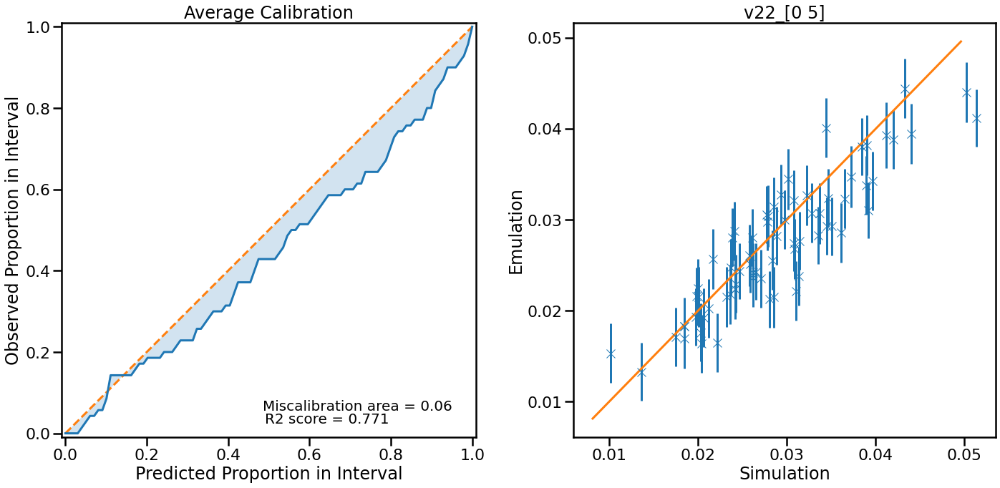

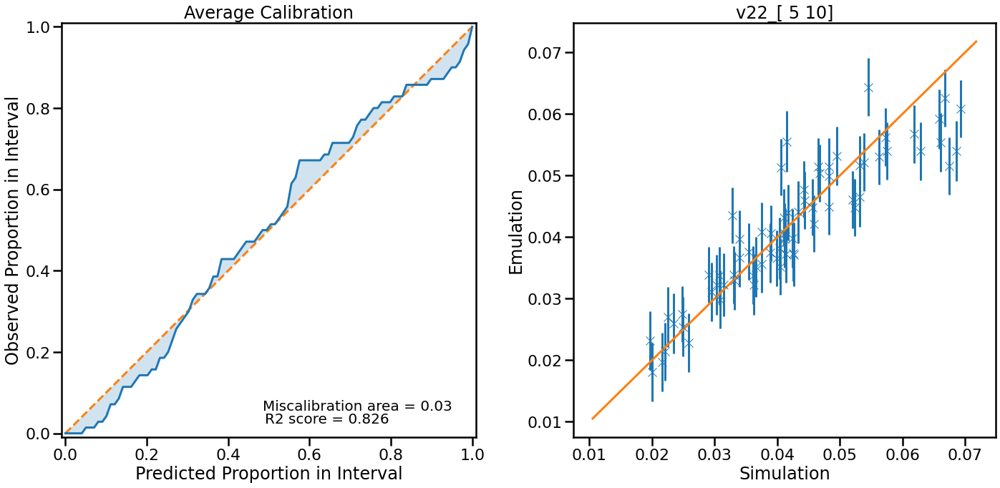

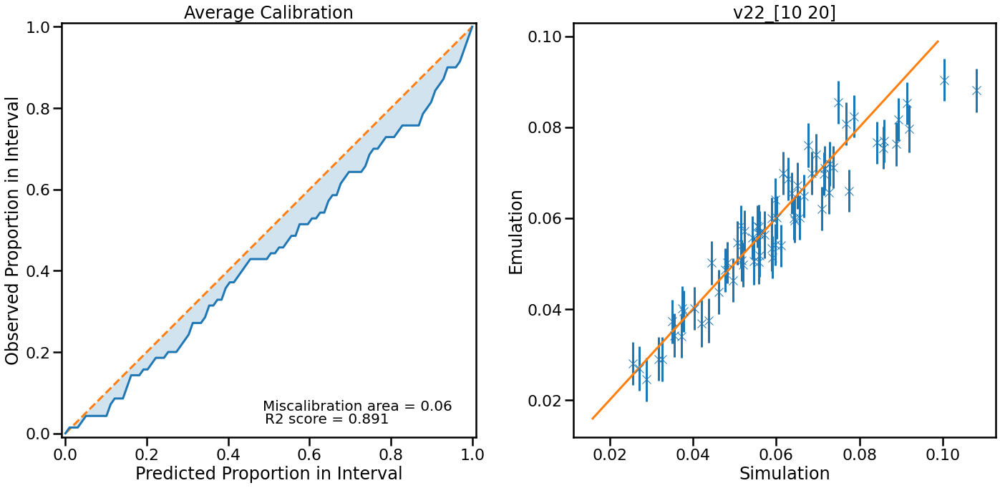

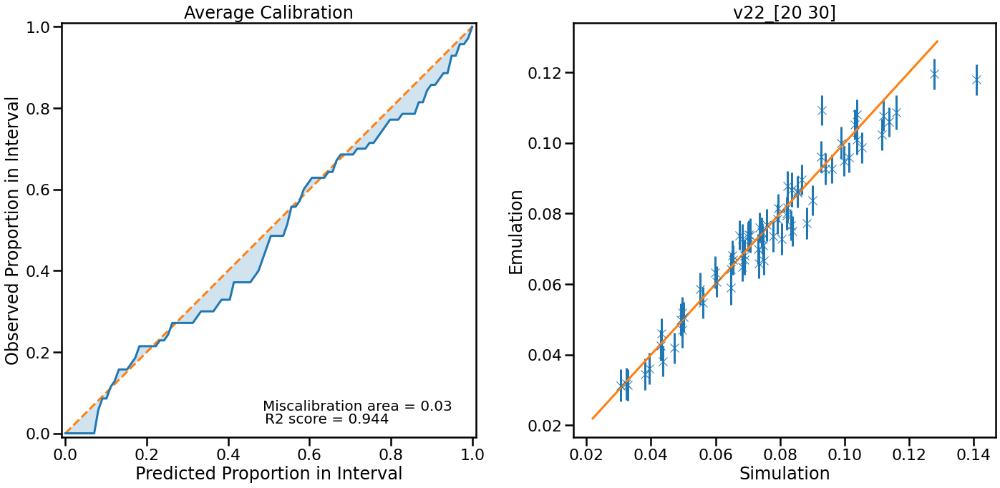

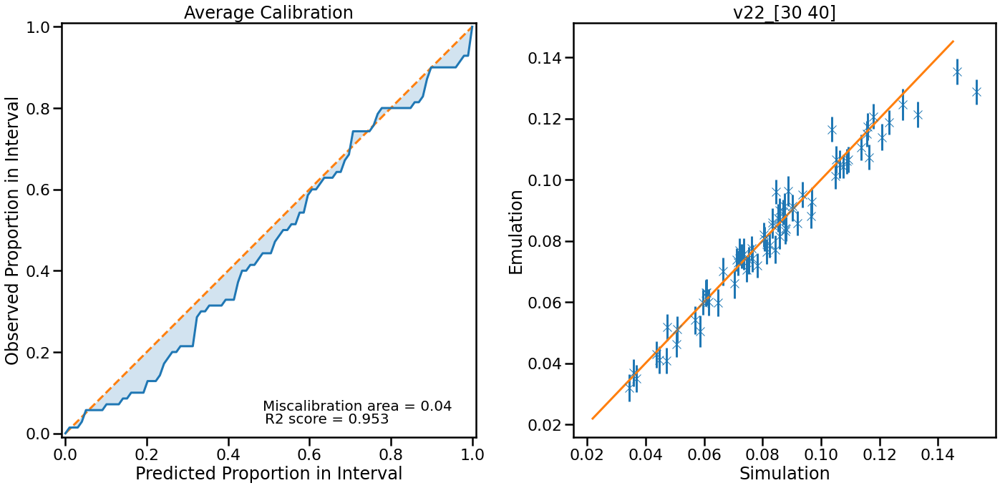

...

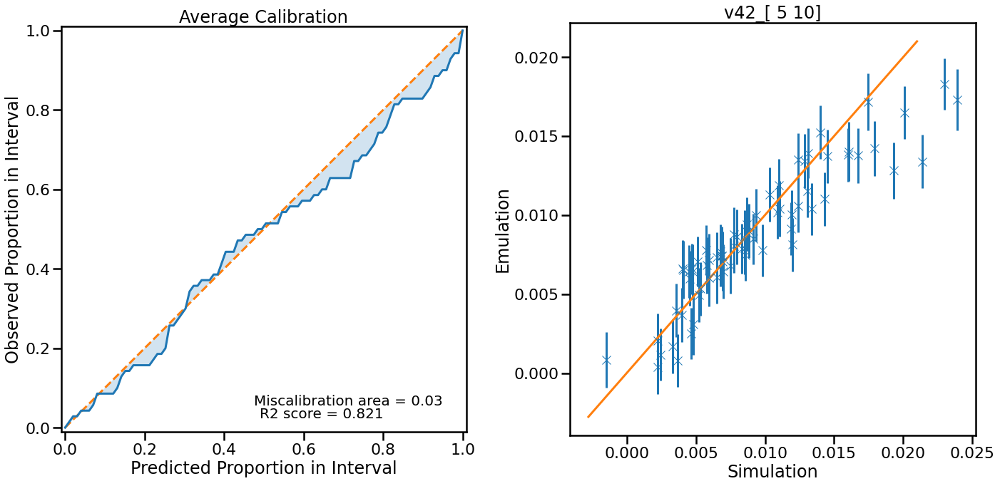

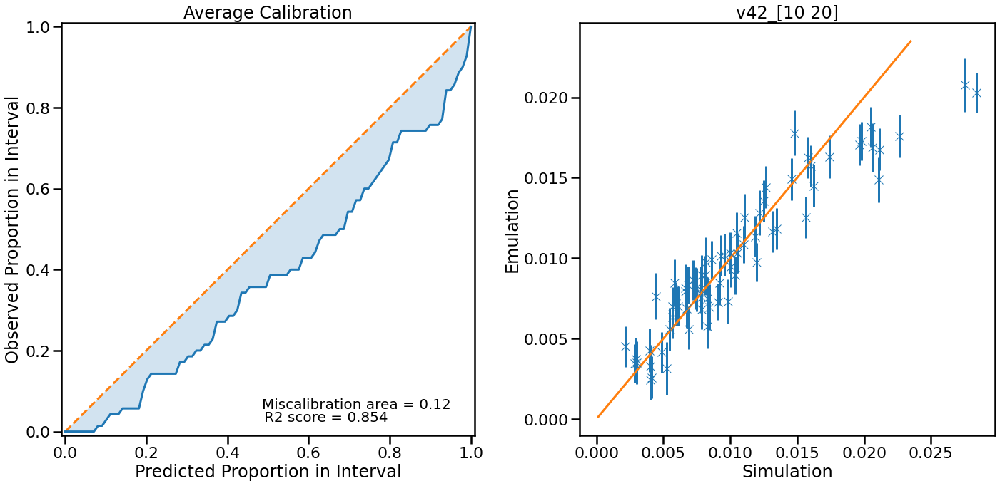

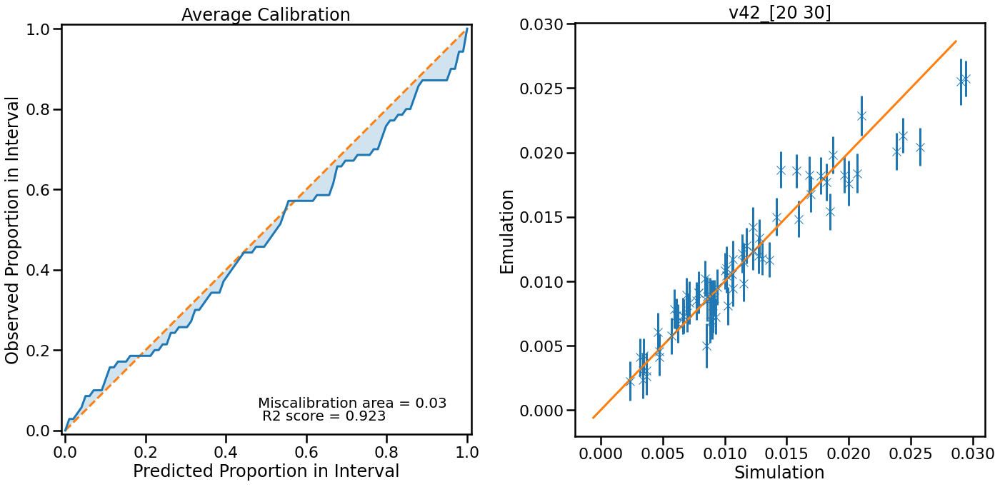

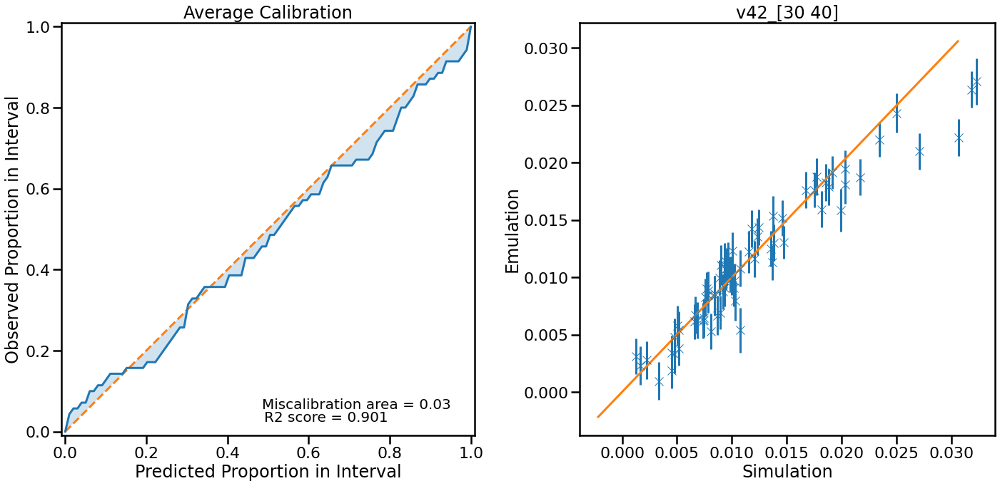

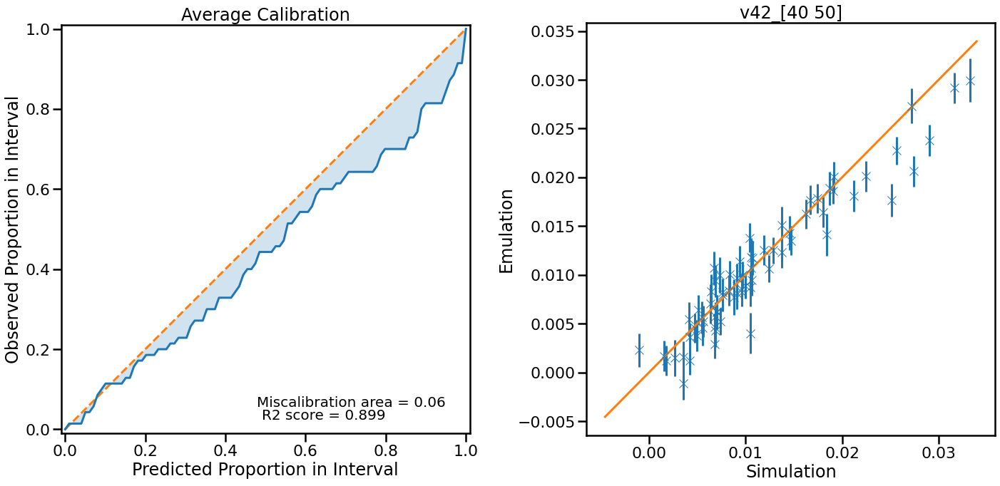

In [19]:
for observable in obs_list:
    s = StandardScaler()
    train_x = torch.from_numpy(x_train.values)
    train_y = torch.from_numpy(s.fit_transform(y_train[observable].values.reshape(-1,1)).flatten())
    train_y_noise = torch.from_numpy(np.square((y_er_train['sd_'+observable].values)/s.scale_))

    test_x = torch.from_numpy(x_test.values)
    test_y = torch.from_numpy(y_test[observable].values)
    test_y_noise = torch.from_numpy(np.square(y_er_test['sd_'+observable].values))
    
    likelihood = gpytorch.likelihoods.FixedNoiseGaussianLikelihood(noise=train_y_noise,learn_additional_noise=True)
    likelihood.second_noise_covar.register_constraint('raw_noise',gpytorch.constraints.Interval(1e-3,1e+2))
    model = ExactGPModel(train_x, train_y, likelihood)
    
    # this is for running the notebook in our testing framework
    
    training_iter = 5000


    # Find optimal model hyperparameters
    model.train()
    likelihood.train()

    # Use the adam optimizer
    optimizer = torch.optim.Adam(model.parameters(), lr=0.2)  # Includes GaussianLikelihood parameters
    # "Loss" for GPs - the marginal log likelihood
    mll = gpytorch.mlls.ExactMarginalLogLikelihood(likelihood, model)

    for i in range(training_iter):
        # Zero gradients from previous iteration
        optimizer.zero_grad()
        # Output from model
        output = model(train_x)
        # Calc loss and backprop gradients
        loss = -mll(output, train_y)
        loss.backward()
        print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f   noise: %.3f' % (
            i + 1, training_iter, loss.item(),
            model.covar_module.base_kernel.lengthscale[0,0].item(),
            model.likelihood.noise[0].item()
        ))
        optimizer.step()
    print(model.covar_module.base_kernel.lengthscale)
    test_x = torch.from_numpy(x_test.values)
    
    
    
    # Get into evaluation (predictive posterior) mode
    model.eval()
    likelihood.eval()
    
    # Test points are regularly spaced along [0,1]
    # Make predictions by feeding model through likelihood
    with torch.no_grad(), gpytorch.settings.fast_pred_var():
        observed_pred = likelihood(model(test_x))
        prediction_val = s.inverse_transform(observed_pred.mean)
        prediction_sig_val = observed_pred.variance*s.scale_*s.scale_
        
    
    sns.set_context('poster')
    fig, axs = plt.subplots(1,2,figsize=(20,10))
    ax = axs[0]
    ax2 = axs[1]


    test_y = np.array(test_y)
    prediction_val_slt = np.array(prediction_val)
    prediction_sig_val_slt = np.sqrt(np.array(prediction_sig_val))
    mse = sklearn.metrics.mean_squared_error(test_y ,prediction_val_slt)
    r = sklearn.metrics.r2_score(test_y ,prediction_val_slt)
    print(r)
    uct.plot_calibration(prediction_val_slt, prediction_sig_val_slt, test_y, ax=ax)
    ax2.errorbar(x=test_y,y=prediction_val_slt,yerr=prediction_sig_val_slt,fmt='x')
    min_value = min([ax2.get_xlim()[0],ax2.get_ylim()[0]])
    max_value = min([ax2.get_xlim()[1],ax2.get_ylim()[1]])
    ax2.plot([min_value,max_value],[min_value,max_value])
    ax.text(x=0.49, y= 0.025, s=f'R2 score = {r:.3f}', fontdict={'fontsize':'20'})
    ax2.set_xlabel('Simulation')
    ax2.set_ylabel('Emulation')
    ax2.set_title(observable)
    

#ax.set_title(obs_cent_list['Pb-Pb-2760'][obs][iii])
#fig.suptitle(obs_tex_labels[obs])
    plt.tight_layout()
    plt.savefig(f'plots/test/{observable}.png',dpi=50)

In [20]:
# Load experimental data
experiment=pd.read_csv(filepath_or_buffer="../HIC_experimental_data/PbPb2760_experiment",index_col=0)

In [21]:
experiment.keys()[90:100]

Index(['v22[0 5]', 'v22[ 5 10]', 'v22[10 20]', 'v22[20 30]', 'v22[30 40]',
       'v22[40 50]', 'v22[50 60]', 'v22[60 70]', 'v32[0 5]', 'v32[ 5 10]'],
      dtype='object')